While trying to get started on my presentation for my project, I cannot help but feel I missed the mark on this one.
This is not something that is deployable or workable, it requires too much data to make predictions and it is also not particularly effective. While we achieved the required benchmark, I feel this fails to achieve the purpose.

In this notebook and any following sections, we are going to explore retreiving data from an API and engineeering features that can be created from a single row of information, thus allowing us to properly input, transform and predict from any new data we may be able to capture.

In [1]:
# import required libraries

import numpy as np
import pandas as pd
import requests as re
import json
import matplotlib.pyplot as plt

We are once again going to use Binance data.

In [2]:
# setting up our base urls and desired request to get from our selected data source

# base_url = "https://api3.binance.com"

# upon looking into the API it appears they have a python library integrated for using their API, we will attempt to use this


!pip install python-binance

     |████████████████████████████████| 63 kB 1.3 MB/s eta 0:00:01
     |████████████████████████████████| 88 kB 5.3 MB/s eta 0:00:01
     |████████████████████████████████| 288 kB 8.6 MB/s eta 0:00:01
     |████████████████████████████████| 339 kB 29.4 MB/s eta 0:00:01


In [4]:
from binance.client import Client

client = Client()

In [5]:
# retrieving the daily data for the last 1000 days (maximum of api call)

candles = client.get_klines(symbol='BTCUSDT', interval=Client.KLINE_INTERVAL_1DAY, limit=1000)


In [6]:
candles

[[1552003200000,
  '3873.63000000',
  '3932.00000000',
  '3800.00000000',
  '3864.89000000',
  '34730.36659200',
  1552089599999,
  '135000852.01035948',
  211534,
  '17947.93422800',
  '69791058.74747885',
  '0'],
 [1552089600000,
  '3864.88000000',
  '3971.75000000',
  '3854.75000000',
  '3943.04000000',
  '30979.74765300',
  1552175999999,
  '121353606.96803356',
  206869,
  '16447.34655800',
  '64429542.99978998',
  '0'],
 [1552176000000,
  '3943.43000000',
  '3943.43000000',
  '3881.69000000',
  '3916.82000000',
  '23187.56141200',
  1552262399999,
  '90693949.72150731',
  167920,
  '12518.49638600',
  '48968093.08714351',
  '0'],
 [1552262400000,
  '3915.99000000',
  '3936.98000000',
  '3830.00000000',
  '3871.61000000',
  '38066.88570500',
  1552348799999,
  '147721971.09446938',
  209916,
  '19416.22101400',
  '75329574.17851433',
  '0'],
 [1552348800000,
  '3871.61000000',
  '3905.20000000',
  '3826.06000000',
  '3882.73000000',
  '26921.00862200',
  1552435199999,
  '10439384

In [15]:
# we will take information from the API documentation found here "https://binance-docs.github.io/apidocs/spot/en/#kline-candlestick-data"
# we will use the information provided to import this information into a pandas dataframe and label the columns accordingly


data = pd.DataFrame(candles, columns=['Open time', 'Open', 'High', 'Low', 'Close', 'Volume', 'Close time', 'Quote asset volume', 'Number of trades', 'Taker buy base volume', 'Taker buy quote volume', 'Ignore'])


In [16]:
data.head()

,Open time,Open,High,Low,Close,Volume,Close time,Quote asset volume,Number of trades,Taker buy base volume,Taker buy quote volume,Ignore
0,1552003200000,3873.63000000,3932.00000000,3800.00000000,3864.89000000,34730.36659200,1552089599999,135000852.01035948,211534,17947.93422800,69791058.74747885,0
1,1552089600000,3864.88000000,3971.75000000,3854.75000000,3943.04000000,30979.74765300,1552175999999,121353606.96803356,206869,16447.34655800,64429542.99978998,0
2,1552176000000,3943.43000000,3943.43000000,3881.69000000,3916.82000000,23187.56141200,1552262399999,90693949.72150731,167920,12518.49638600,48968093.08714351,0
3,1552262400000,3915.99000000,3936.98000000,3830.00000000,3871.61000000,38066.88570500,1552348799999,147721971.09446938,209916,19416.22101400,75329574.17851433,0
4,1552348800000,3871.61000000,3905.20000000,3826.06000000,3882.73000000,26921.00862200,1552435199999,104393849.44844826,182885,13827.42106500,53624520.45494350,0


In [17]:
# drop unneeded columns

data.drop(['Close time', 'Ignore'], axis=1, inplace=True)

data.head()

,Open time,Open,High,Low,Close,Volume,Quote asset volume,Number of trades,Taker buy base volume,Taker buy quote volume
0,1552003200000,3873.63000000,3932.00000000,3800.00000000,3864.89000000,34730.36659200,135000852.01035948,211534,17947.93422800,69791058.74747885
1,1552089600000,3864.88000000,3971.75000000,3854.75000000,3943.04000000,30979.74765300,121353606.96803356,206869,16447.34655800,64429542.99978998
2,1552176000000,3943.43000000,3943.43000000,3881.69000000,3916.82000000,23187.56141200,90693949.72150731,167920,12518.49638600,48968093.08714351
3,1552262400000,3915.99000000,3936.98000000,3830.00000000,3871.61000000,38066.88570500,147721971.09446938,209916,19416.22101400,75329574.17851433
4,1552348800000,3871.61000000,3905.20000000,3826.06000000,3882.73000000,26921.00862200,104393849.44844826,182885,13827.42106500,53624520.45494350


In [18]:
# now to convert open time column into more easily readable format, and set to index

data['Open time'] = data['Open time'].apply(lambda x: pd.to_datetime(x, unit='ms'))

In [81]:
data.dtypes

Open                      object
High                      object
Low                       object
Close                     object
Volume                    object
Quote asset volume        object
Number of trades           int64
Taker buy base volume     object
Taker buy quote volume    object
Label                     object
dtype: object

In [21]:
data.set_index('Open time', inplace=True)

In [82]:
data = data.astype('float64')

In [83]:
# now to set our predicted labels for each class. (the following days close price)

data['Label'] = data.Close.shift(-1)

In [84]:
data.isna().sum()

Open                      0
High                      0
Low                       0
Close                     0
Volume                    0
Quote asset volume        0
Number of trades          0
Taker buy base volume     0
Taker buy quote volume    0
Label                     1
dtype: int64

In [85]:
data.dropna(inplace=True)

In [86]:
# split into X and y now so that we do not have any scaling issues leaving our predicted label in

X = data.drop('Label', axis=1)
y = data.Label

In [87]:
# now we will establish pipelines for scaling features as well as potential feature reduction using pca and k-best again

from sklearn.preprocessing import MinMaxScaler
from sklearn.pipeline import Pipeline, FeatureUnion
from sklearn.metrics import mean_absolute_error
from xgboost import XGBRegressor
from sklearn.decomposition import PCA
from sklearn.feature_selection import SelectKBest


# feature preprocessing pipeline ( in this case only scaling of features, no need for one-hot conversion etc.)

scaler = MinMaxScaler()

# will initialize feature union set now, and potentially use later depending on results without


pca = PCA()
k_best = SelectKBest()
feature_union = FeatureUnion([
    ('pca', pca),
    ('kbest', k_best)
])

# set up initial regresssion model

model = XGBRegressor()

# set up inital pipeline

pipeline = Pipeline([
    ('scaling', scaler),
    ('predictor', model)
])



In [88]:
# now we will split our data into train and test data ( predicing for last 90 days) and test our inital model

test_size = 90
train_size = len(data.index) - test_size

X_train, X_test = X[:train_size], X[train_size:]
y_train, y_test = y[:train_size], y[train_size:]

In [89]:
# now we will fit our model and attempt to predict our test data

pipeline.fit(X_train, y_train)

Pipeline(steps=[('scaling', MinMaxScaler()),
                ('predictor',
                 XGBRegressor(base_score=0.5, booster='gbtree',
                              colsample_bylevel=1, colsample_bynode=1,
                              colsample_bytree=1, gamma=0, gpu_id=-1,
                              importance_type='gain',
                              interaction_constraints='',
                              learning_rate=0.300000012, max_delta_step=0,
                              max_depth=6, min_child_weight=1, missing=nan,
                              monotone_constraints='()', n_estimators=100,
                              n_jobs=8, num_parallel_tree=1, random_state=0,
                              reg_alpha=0, reg_lambda=1, scale_pos_weight=1,
                              subsample=1, tree_method='exact',
                              validate_parameters=1, verbosity=None))])

In [90]:
# now we will attempt to predict our values for test data

y_pred = pipeline.predict(X_test)

In [91]:
# evaluate our baseline model

mae = mean_absolute_error(y_test, y_pred)

In [92]:
# display our initial evaluation

print(f'Our baseline mean absolute error is: {mae}')

Our baseline mean absolute error is: 1981.9722378472222


In [93]:
y_predicted = list(y_pred)
y_true = list(y_test)

In [94]:
y_df = pd.DataFrame({'y_true': y_true, 'y_pred': y_predicted}, index=X_test.index)

In [95]:
y_df.head()

,y_true,y_pred
Open time,,
2021-09-01,49246.64,49243.226562
2021-09-02,49999.14,51096.746094
2021-09-03,49915.64,50411.347656
2021-09-04,51756.88,51069.085938
2021-09-05,52663.90,54854.699219


<ipython-input-96-aa936765467f>:17: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


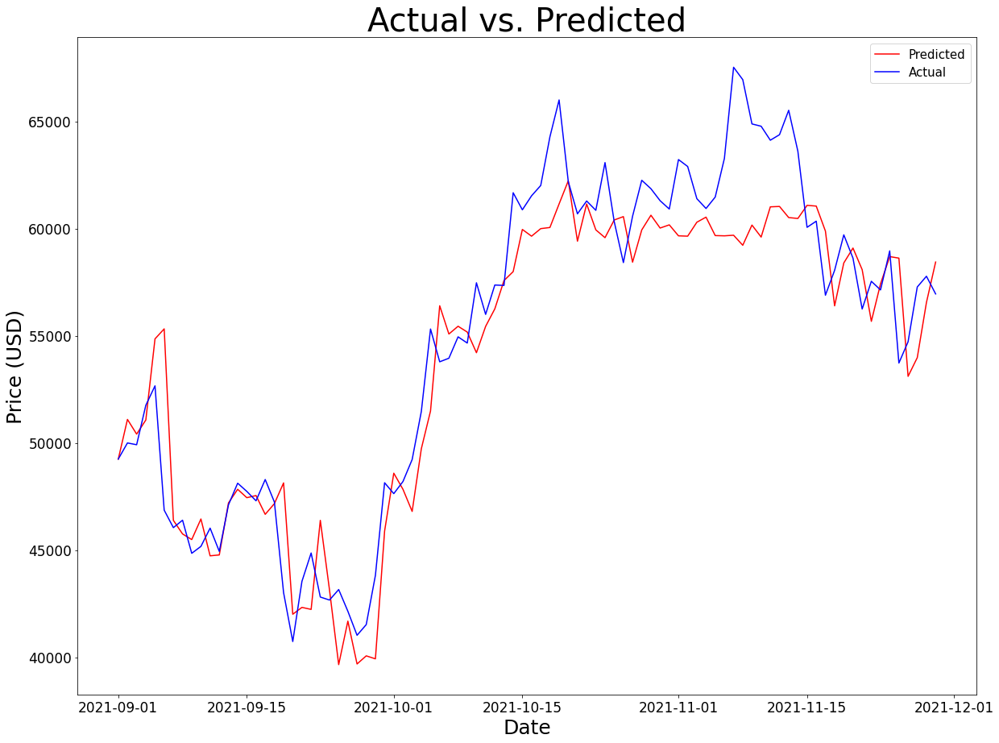

In [96]:
# now we want to plot our actual price versus predicted price, maybe it is atleast following the correct direction of movement
%matplotlib inline


fig, ax = plt.subplots(figsize=(20,15))



ax.plot(y_df.index, y_df.y_pred, color='red', label='Predicted')
ax.plot(y_df.index, y_df.y_true, color='blue', label='Actual')
ax.legend(loc='best', fontsize=15)
ax.set_title('Actual vs. Predicted', fontsize=40)
ax.set_ylabel('Price (USD)', fontsize=25)
ax.set_xlabel('Date', fontsize=25)
ax.tick_params(axis='both', which='major', labelsize=17)

fig.show()


In [97]:
y_df.tail(20)

,y_true,y_pred
Open time,,
2021-11-10,64774.26,59604.171875
2021-11-11,64122.23,61014.058594
2021-11-12,64380.00,61031.906250
2021-11-13,65519.10,60513.695312
2021-11-14,63606.74,60471.367188
2021-11-15,60058.87,61083.542969
2021-11-16,60344.87,61049.500000
2021-11-17,56891.62,59882.613281
2021-11-18,58052.24,56395.437500


In [98]:
# now I want to go back and set a new column in our data which denotes whether or not the price moved up or down
# as well as a column denoting which direction our regression model predicted
# we will use this to evaluate our successes, as we are most concerned with predicting correct direction of movement

y_df['priceDirection'] = 0

for i in range(len(y_df.index)):
    y_df['priceDirection'][i] = 0 if i == 89 else (1 if y_df['y_true'][i] < y_df['y_true'][i+1] else 0)

<ipython-input-98-f04ab80832d2>:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y_df['priceDirection'][i] = 0 if i == 89 else (1 if y_df['y_true'][i] < y_df['y_true'][i+1] else 0)


In [99]:
y_df.tail()

,y_true,y_pred,priceDirection
Open time,,,
2021-11-25,53726.53,58621.621094,1
2021-11-26,54721.03,53105.851562,1
2021-11-27,57274.88,53978.679688,1
2021-11-28,57776.25,56553.957031,0
2021-11-29,56950.56,58439.140625,0


In [100]:
X_test.tail()

,Open,High,Low,Close,Volume,Quote asset volume,Number of trades,Taker buy base volume,Taker buy quote volume
Open time,,,,,,,,,
2021-11-25,57138.29,59398.90,57000.00,58960.36,42153.51522,2.455659e+09,1604266.0,21112.80397,1.230023e+09
2021-11-26,58960.37,59150.00,53500.00,53726.53,65927.87066,3.649354e+09,2138184.0,31287.46990,1.731975e+09
2021-11-27,53723.72,55280.00,53610.00,54721.03,29716.99957,1.623173e+09,1110145.0,14462.93801,7.901915e+08
2021-11-28,54716.47,57445.05,53256.64,57274.88,36163.71370,1.982198e+09,1253408.0,18520.69985,1.016073e+09
2021-11-29,57274.89,58865.97,56666.67,57776.25,40125.28009,2.313371e+09,1349625.0,19520.25038,1.125241e+09


In [101]:
X_test.dtypes

Open                      float64
High                      float64
Low                       float64
Close                     float64
Volume                    float64
Quote asset volume        float64
Number of trades          float64
Taker buy base volume     float64
Taker buy quote volume    float64
dtype: object

In [102]:
y_df.dtypes

y_true            float64
y_pred            float32
priceDirection      int64
dtype: object

In [103]:
y_df['predDirection'] = 0

for i in y_df.index:
    y_df['predDirection'][i] = 1 if y_df['y_pred'][i] > X_test.Close[i] else 0

<ipython-input-103-fee70dc23ede>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y_df['predDirection'][i] = 1 if y_df['y_pred'][i] > X_test.Close[i] else 0


In [104]:
y_df.head()

,y_true,y_pred,priceDirection,predDirection
Open time,,,,
2021-09-01,49246.64,49243.226562,1,1
2021-09-02,49999.14,51096.746094,0,1
2021-09-03,49915.64,50411.347656,1,1
2021-09-04,51756.88,51069.085938,1,1
2021-09-05,52663.90,54854.699219,0,1


In [107]:
# now we will apply classification accuracy metrics to our newly create columns to see how often they are correct in predicting direction

from sklearn.metrics import accuracy_score, precision_score, recall_score, roc_auc_score, f1_score, confusion_matrix, ConfusionMatrixDisplay, r2_score, mean_squared_error, mean_absolute_error, matthews_corrcoef

# importing functon created from previous exercise
def eval_model(y_test, y_pred):
    
    '''
    This function will compute and print out metrics for evaluating classification models
    This function also creates and displays the confusion matrix for the model
    '''
    
    accuracy = accuracy_score(y_test, y_pred)
    recall = recall_score(y_test, y_pred)
    mcc = matthews_corrcoef(y_test, y_pred)
    roc = roc_auc_score(y_test, y_pred)
    cm = confusion_matrix(y_test, y_pred)
    cm_display = ConfusionMatrixDisplay(cm)
    
    print(f'The accuracy score of the model is: {accuracy}')
    print(f'The recall score of the model is: {recall}')
    print(f'The Matthews Correlation Coefficient of the model is: {mcc}.')
    print(f'The roc auc score of the model is: {roc}.')

    cm_display.plot()
    plt.show()

The accuracy score of the model is: 0.4888888888888889
The recall score of the model is: 0.34782608695652173
The Matthews Correlation Coefficient of the model is: -0.016510329410361665.
The roc auc score of the model is: 0.492094861660079.


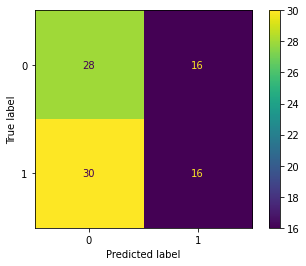

In [108]:
eval_model(y_df.priceDirection, y_df.predDirection)

Not too bad for a baseline model, now will attempt with dimensionality reduction feature union section to see if metrics improve. If this improves, the next step will be to run a grid search object to try and further improve results. We will also go through this process on the non-dimensionality reduced data as well after to compare results. If these metrics fail to meet our inital goals, we can experiment with some feature engineering methods.


In [110]:
pipeline2 = Pipeline([
    ('scaling', scaler),
    ('feature_reduction', feature_union),
    ('predictor', model)
])

# since feature union has parameters that need to be set, we are going toi go with a grid search from the start 

params = {'feature_reduction__pca__n_components': [1,2,3,4,5,6,7,8,9],
          'feature_reduction__kbest__k': [1,2,3,4,5,6,7,8,9],
          'predictor__eta': [0.1, 0.2, 0.3]
         }

In [111]:
# crate our grid search object using pipeline and parameters

from sklearn.model_selection import GridSearchCV

grid_search1 = GridSearchCV(pipeline2, params, verbose=3)

grid_search1.fit(X_train, y_train)



Fitting 5 folds for each of 243 candidates, totalling 1215 fits


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=1, feature_reduction__pca__n_components=1, predictor__eta=0.1; total time=   0.8s
[CV 2/5] END feature_reduction__kbest__k=1, feature_reduction__pca__n_components=1, predictor__eta=0.1; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=1, feature_reduction__pca__n_components=1, predictor__eta=0.1; total time=   0.1s
[CV 4/5] END feature_reduction__kbest__k=1, feature_reduction__pca__n_components=1, predictor__eta=0.1; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=1, feature_reduction__pca__n_components=1, predictor__eta=0.1; total time=   0.1s
[CV 1/5] END feature_reduction__kbest__k=1, feature_reduction__pca__n_components=1, predictor__eta=0.2; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=1, feature_reduction__pca__n_components=1, predictor__eta=0.2; total time=   0.1s
[CV 3/5] END feature_reduction__kbest__k=1, feature_reduction__pca__n_components=1, predictor__eta=0.2; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=1, feature_reduction__pca__n_components=1, predictor__eta=0.2; total time=   0.1s
[CV 5/5] END feature_reduction__kbest__k=1, feature_reduction__pca__n_components=1, predictor__eta=0.2; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=1, feature_reduction__pca__n_components=1, predictor__eta=0.3; total time=   0.1s
[CV 2/5] END feature_reduction__kbest__k=1, feature_reduction__pca__n_components=1, predictor__eta=0.3; total time=   0.1s
[CV 3/5] END feature_reduction__kbest__k=1, feature_reduction__pca__n_components=1, predictor__eta=0.3; total time=   0.1s
[CV 4/5] END feature_reduction__kbest__k=1, feature_reduction__pca__n_components=1, predictor__eta=0.3; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=1, feature_reduction__pca__n_components=1, predictor__eta=0.3; total time=   0.1s
[CV 1/5] END feature_reduction__kbest__k=1, feature_reduction__pca__n_components=2, predictor__eta=0.1; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=1, feature_reduction__pca__n_components=2, predictor__eta=0.1; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=1, feature_reduction__pca__n_components=2, predictor__eta=0.1; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=1, feature_reduction__pca__n_components=2, predictor__eta=0.1; total time=   0.1s
[CV 5/5] END feature_reduction__kbest__k=1, feature_reduction__pca__n_components=2, predictor__eta=0.1; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=1, feature_reduction__pca__n_components=2, predictor__eta=0.2; total time=   0.1s
[CV 2/5] END feature_reduction__kbest__k=1, feature_reduction__pca__n_components=2, predictor__eta=0.2; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=1, feature_reduction__pca__n_components=2, predictor__eta=0.2; total time=   0.1s
[CV 4/5] END feature_reduction__kbest__k=1, feature_reduction__pca__n_components=2, predictor__eta=0.2; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=1, feature_reduction__pca__n_components=2, predictor__eta=0.2; total time=   0.1s
[CV 1/5] END feature_reduction__kbest__k=1, feature_reduction__pca__n_components=2, predictor__eta=0.3; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=1, feature_reduction__pca__n_components=2, predictor__eta=0.3; total time=   0.1s
[CV 3/5] END feature_reduction__kbest__k=1, feature_reduction__pca__n_components=2, predictor__eta=0.3; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=1, feature_reduction__pca__n_components=2, predictor__eta=0.3; total time=   0.1s
[CV 5/5] END feature_reduction__kbest__k=1, feature_reduction__pca__n_components=2, predictor__eta=0.3; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=1, feature_reduction__pca__n_components=3, predictor__eta=0.1; total time=   0.1s
[CV 2/5] END feature_reduction__kbest__k=1, feature_reduction__pca__n_components=3, predictor__eta=0.1; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=1, feature_reduction__pca__n_components=3, predictor__eta=0.1; total time=   0.1s
[CV 4/5] END feature_reduction__kbest__k=1, feature_reduction__pca__n_components=3, predictor__eta=0.1; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=1, feature_reduction__pca__n_components=3, predictor__eta=0.1; total time=   0.1s
[CV 1/5] END feature_reduction__kbest__k=1, feature_reduction__pca__n_components=3, predictor__eta=0.2; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=1, feature_reduction__pca__n_components=3, predictor__eta=0.2; total time=   0.1s
[CV 3/5] END feature_reduction__kbest__k=1, feature_reduction__pca__n_components=3, predictor__eta=0.2; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=1, feature_reduction__pca__n_components=3, predictor__eta=0.2; total time=   0.1s
[CV 5/5] END feature_reduction__kbest__k=1, feature_reduction__pca__n_components=3, predictor__eta=0.2; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=1, feature_reduction__pca__n_components=3, predictor__eta=0.3; total time=   0.1s
[CV 2/5] END feature_reduction__kbest__k=1, feature_reduction__pca__n_components=3, predictor__eta=0.3; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=1, feature_reduction__pca__n_components=3, predictor__eta=0.3; total time=   0.1s
[CV 4/5] END feature_reduction__kbest__k=1, feature_reduction__pca__n_components=3, predictor__eta=0.3; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=1, feature_reduction__pca__n_components=3, predictor__eta=0.3; total time=   0.1s
[CV 1/5] END feature_reduction__kbest__k=1, feature_reduction__pca__n_components=4, predictor__eta=0.1; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=1, feature_reduction__pca__n_components=4, predictor__eta=0.1; total time=   0.1s
[CV 3/5] END feature_reduction__kbest__k=1, feature_reduction__pca__n_components=4, predictor__eta=0.1; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=1, feature_reduction__pca__n_components=4, predictor__eta=0.1; total time=   0.1s
[CV 5/5] END feature_reduction__kbest__k=1, feature_reduction__pca__n_components=4, predictor__eta=0.1; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=1, feature_reduction__pca__n_components=4, predictor__eta=0.2; total time=   0.1s
[CV 2/5] END feature_reduction__kbest__k=1, feature_reduction__pca__n_components=4, predictor__eta=0.2; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=1, feature_reduction__pca__n_components=4, predictor__eta=0.2; total time=   0.1s
[CV 4/5] END feature_reduction__kbest__k=1, feature_reduction__pca__n_components=4, predictor__eta=0.2; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=1, feature_reduction__pca__n_components=4, predictor__eta=0.2; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=1, feature_reduction__pca__n_components=4, predictor__eta=0.3; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=1, feature_reduction__pca__n_components=4, predictor__eta=0.3; total time=   0.1s
[CV 3/5] END feature_reduction__kbest__k=1, feature_reduction__pca__n_components=4, predictor__eta=0.3; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=1, feature_reduction__pca__n_components=4, predictor__eta=0.3; total time=   0.1s
[CV 5/5] END feature_reduction__kbest__k=1, feature_reduction__pca__n_components=4, predictor__eta=0.3; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=1, feature_reduction__pca__n_components=5, predictor__eta=0.1; total time=   0.1s
[CV 2/5] END feature_reduction__kbest__k=1, feature_reduction__pca__n_components=5, predictor__eta=0.1; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=1, feature_reduction__pca__n_components=5, predictor__eta=0.1; total time=   0.1s
[CV 4/5] END feature_reduction__kbest__k=1, feature_reduction__pca__n_components=5, predictor__eta=0.1; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=1, feature_reduction__pca__n_components=5, predictor__eta=0.1; total time=   0.1s
[CV 1/5] END feature_reduction__kbest__k=1, feature_reduction__pca__n_components=5, predictor__eta=0.2; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=1, feature_reduction__pca__n_components=5, predictor__eta=0.2; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=1, feature_reduction__pca__n_components=5, predictor__eta=0.2; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=1, feature_reduction__pca__n_components=5, predictor__eta=0.2; total time=   0.1s
[CV 5/5] END feature_reduction__kbest__k=1, feature_reduction__pca__n_components=5, predictor__eta=0.2; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=1, feature_reduction__pca__n_components=5, predictor__eta=0.3; total time=   0.1s
[CV 2/5] END feature_reduction__kbest__k=1, feature_reduction__pca__n_components=5, predictor__eta=0.3; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=1, feature_reduction__pca__n_components=5, predictor__eta=0.3; total time=   0.1s
[CV 4/5] END feature_reduction__kbest__k=1, feature_reduction__pca__n_components=5, predictor__eta=0.3; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=1, feature_reduction__pca__n_components=5, predictor__eta=0.3; total time=   0.1s
[CV 1/5] END feature_reduction__kbest__k=1, feature_reduction__pca__n_components=6, predictor__eta=0.1; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=1, feature_reduction__pca__n_components=6, predictor__eta=0.1; total time=   0.1s
[CV 3/5] END feature_reduction__kbest__k=1, feature_reduction__pca__n_components=6, predictor__eta=0.1; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=1, feature_reduction__pca__n_components=6, predictor__eta=0.1; total time=   0.1s
[CV 5/5] END feature_reduction__kbest__k=1, feature_reduction__pca__n_components=6, predictor__eta=0.1; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=1, feature_reduction__pca__n_components=6, predictor__eta=0.2; total time=   0.1s
[CV 2/5] END feature_reduction__kbest__k=1, feature_reduction__pca__n_components=6, predictor__eta=0.2; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=1, feature_reduction__pca__n_components=6, predictor__eta=0.2; total time=   0.1s
[CV 4/5] END feature_reduction__kbest__k=1, feature_reduction__pca__n_components=6, predictor__eta=0.2; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=1, feature_reduction__pca__n_components=6, predictor__eta=0.2; total time=   0.1s
[CV 1/5] END feature_reduction__kbest__k=1, feature_reduction__pca__n_components=6, predictor__eta=0.3; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=1, feature_reduction__pca__n_components=6, predictor__eta=0.3; total time=   0.1s
[CV 3/5] END feature_reduction__kbest__k=1, feature_reduction__pca__n_components=6, predictor__eta=0.3; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=1, feature_reduction__pca__n_components=6, predictor__eta=0.3; total time=   0.1s
[CV 5/5] END feature_reduction__kbest__k=1, feature_reduction__pca__n_components=6, predictor__eta=0.3; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=1, feature_reduction__pca__n_components=7, predictor__eta=0.1; total time=   0.1s
[CV 2/5] END feature_reduction__kbest__k=1, feature_reduction__pca__n_components=7, predictor__eta=0.1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=1, feature_reduction__pca__n_components=7, predictor__eta=0.1; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=1, feature_reduction__pca__n_components=7, predictor__eta=0.1; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=1, feature_reduction__pca__n_components=7, predictor__eta=0.1; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=1, feature_reduction__pca__n_components=7, predictor__eta=0.2; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=1, feature_reduction__pca__n_components=7, predictor__eta=0.2; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=1, feature_reduction__pca__n_components=7, predictor__eta=0.2; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=1, feature_reduction__pca__n_components=7, predictor__eta=0.2; total time=   0.1s
[CV 5/5] END feature_reduction__kbest__k=1, feature_reduction__pca__n_components=7, predictor__eta=0.2; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=1, feature_reduction__pca__n_components=7, predictor__eta=0.3; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=1, feature_reduction__pca__n_components=7, predictor__eta=0.3; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=1, feature_reduction__pca__n_components=7, predictor__eta=0.3; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=1, feature_reduction__pca__n_components=7, predictor__eta=0.3; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=1, feature_reduction__pca__n_components=7, predictor__eta=0.3; total time=   0.1s
[CV 1/5] END feature_reduction__kbest__k=1, feature_reduction__pca__n_components=8, predictor__eta=0.1; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=1, feature_reduction__pca__n_components=8, predictor__eta=0.1; total time=   0.1s
[CV 3/5] END feature_reduction__kbest__k=1, feature_reduction__pca__n_components=8, predictor__eta=0.1; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=1, feature_reduction__pca__n_components=8, predictor__eta=0.1; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=1, feature_reduction__pca__n_components=8, predictor__eta=0.1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=1, feature_reduction__pca__n_components=8, predictor__eta=0.2; total time=   0.1s
[CV 2/5] END feature_reduction__kbest__k=1, feature_reduction__pca__n_components=8, predictor__eta=0.2; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=1, feature_reduction__pca__n_components=8, predictor__eta=0.2; total time=   0.1s
[CV 4/5] END feature_reduction__kbest__k=1, feature_reduction__pca__n_components=8, predictor__eta=0.2; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=1, feature_reduction__pca__n_components=8, predictor__eta=0.2; total time=   0.1s
[CV 1/5] END feature_reduction__kbest__k=1, feature_reduction__pca__n_components=8, predictor__eta=0.3; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=1, feature_reduction__pca__n_components=8, predictor__eta=0.3; total time=   0.1s
[CV 3/5] END feature_reduction__kbest__k=1, feature_reduction__pca__n_components=8, predictor__eta=0.3; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=1, feature_reduction__pca__n_components=8, predictor__eta=0.3; total time=   0.1s
[CV 5/5] END feature_reduction__kbest__k=1, feature_reduction__pca__n_components=8, predictor__eta=0.3; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=1, feature_reduction__pca__n_components=9, predictor__eta=0.1; total time=   0.1s
[CV 2/5] END feature_reduction__kbest__k=1, feature_reduction__pca__n_components=9, predictor__eta=0.1; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=1, feature_reduction__pca__n_components=9, predictor__eta=0.1; total time=   0.1s
[CV 4/5] END feature_reduction__kbest__k=1, feature_reduction__pca__n_components=9, predictor__eta=0.1; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=1, feature_reduction__pca__n_components=9, predictor__eta=0.1; total time=   0.1s
[CV 1/5] END feature_reduction__kbest__k=1, feature_reduction__pca__n_components=9, predictor__eta=0.2; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=1, feature_reduction__pca__n_components=9, predictor__eta=0.2; total time=   0.1s
[CV 3/5] END feature_reduction__kbest__k=1, feature_reduction__pca__n_components=9, predictor__eta=0.2; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=1, feature_reduction__pca__n_components=9, predictor__eta=0.2; total time=   0.1s
[CV 5/5] END feature_reduction__kbest__k=1, feature_reduction__pca__n_components=9, predictor__eta=0.2; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=1, feature_reduction__pca__n_components=9, predictor__eta=0.3; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=1, feature_reduction__pca__n_components=9, predictor__eta=0.3; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=1, feature_reduction__pca__n_components=9, predictor__eta=0.3; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=1, feature_reduction__pca__n_components=9, predictor__eta=0.3; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=1, feature_reduction__pca__n_components=9, predictor__eta=0.3; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=2, feature_reduction__pca__n_components=1, predictor__eta=0.1; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=2, feature_reduction__pca__n_components=1, predictor__eta=0.1; total time=   0.1s
[CV 3/5] END feature_reduction__kbest__k=2, feature_reduction__pca__n_components=1, predictor__eta=0.1; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=2, feature_reduction__pca__n_components=1, predictor__eta=0.1; total time=   0.1s
[CV 5/5] END feature_reduction__kbest__k=2, feature_reduction__pca__n_components=1, predictor__eta=0.1; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=2, feature_reduction__pca__n_components=1, predictor__eta=0.2; total time=   0.1s
[CV 2/5] END feature_reduction__kbest__k=2, feature_reduction__pca__n_components=1, predictor__eta=0.2; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=2, feature_reduction__pca__n_components=1, predictor__eta=0.2; total time=   0.1s
[CV 4/5] END feature_reduction__kbest__k=2, feature_reduction__pca__n_components=1, predictor__eta=0.2; total time=   0.1s
[CV 5/5] END feature_reduction__kbest__k=2, feature_reduction__pca__n_components=1, predictor__eta=0.2; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=2, feature_reduction__pca__n_components=1, predictor__eta=0.3; total time=   0.1s
[CV 2/5] END feature_reduction__kbest__k=2, feature_reduction__pca__n_components=1, predictor__eta=0.3; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=2, feature_reduction__pca__n_components=1, predictor__eta=0.3; total time=   0.1s
[CV 4/5] END feature_reduction__kbest__k=2, feature_reduction__pca__n_components=1, predictor__eta=0.3; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=2, feature_reduction__pca__n_components=1, predictor__eta=0.3; total time=   0.1s
[CV 1/5] END feature_reduction__kbest__k=2, feature_reduction__pca__n_components=2, predictor__eta=0.1; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=2, feature_reduction__pca__n_components=2, predictor__eta=0.1; total time=   0.1s
[CV 3/5] END feature_reduction__kbest__k=2, feature_reduction__pca__n_components=2, predictor__eta=0.1; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=2, feature_reduction__pca__n_components=2, predictor__eta=0.1; total time=   0.1s
[CV 5/5] END feature_reduction__kbest__k=2, feature_reduction__pca__n_components=2, predictor__eta=0.1; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=2, feature_reduction__pca__n_components=2, predictor__eta=0.2; total time=   0.1s
[CV 2/5] END feature_reduction__kbest__k=2, feature_reduction__pca__n_components=2, predictor__eta=0.2; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=2, feature_reduction__pca__n_components=2, predictor__eta=0.2; total time=   0.1s
[CV 4/5] END feature_reduction__kbest__k=2, feature_reduction__pca__n_components=2, predictor__eta=0.2; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=2, feature_reduction__pca__n_components=2, predictor__eta=0.2; total time=   0.1s
[CV 1/5] END feature_reduction__kbest__k=2, feature_reduction__pca__n_components=2, predictor__eta=0.3; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=2, feature_reduction__pca__n_components=2, predictor__eta=0.3; total time=   0.1s
[CV 3/5] END feature_reduction__kbest__k=2, feature_reduction__pca__n_components=2, predictor__eta=0.3; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=2, feature_reduction__pca__n_components=2, predictor__eta=0.3; total time=   0.1s
[CV 5/5] END feature_reduction__kbest__k=2, feature_reduction__pca__n_components=2, predictor__eta=0.3; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=2, feature_reduction__pca__n_components=3, predictor__eta=0.1; total time=   0.1s
[CV 2/5] END feature_reduction__kbest__k=2, feature_reduction__pca__n_components=3, predictor__eta=0.1; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=2, feature_reduction__pca__n_components=3, predictor__eta=0.1; total time=   0.1s
[CV 4/5] END feature_reduction__kbest__k=2, feature_reduction__pca__n_components=3, predictor__eta=0.1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=2, feature_reduction__pca__n_components=3, predictor__eta=0.1; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=2, feature_reduction__pca__n_components=3, predictor__eta=0.2; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=2, feature_reduction__pca__n_components=3, predictor__eta=0.2; total time=   0.1s
[CV 3/5] END feature_reduction__kbest__k=2, feature_reduction__pca__n_components=3, predictor__eta=0.2; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=2, feature_reduction__pca__n_components=3, predictor__eta=0.2; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=2, feature_reduction__pca__n_components=3, predictor__eta=0.2; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=2, feature_reduction__pca__n_components=3, predictor__eta=0.3; total time=   0.1s
[CV 2/5] END feature_reduction__kbest__k=2, feature_reduction__pca__n_components=3, predictor__eta=0.3; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=2, feature_reduction__pca__n_components=3, predictor__eta=0.3; total time=   0.1s
[CV 4/5] END feature_reduction__kbest__k=2, feature_reduction__pca__n_components=3, predictor__eta=0.3; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=2, feature_reduction__pca__n_components=3, predictor__eta=0.3; total time=   0.1s
[CV 1/5] END feature_reduction__kbest__k=2, feature_reduction__pca__n_components=4, predictor__eta=0.1; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=2, feature_reduction__pca__n_components=4, predictor__eta=0.1; total time=   0.1s
[CV 3/5] END feature_reduction__kbest__k=2, feature_reduction__pca__n_components=4, predictor__eta=0.1; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=2, feature_reduction__pca__n_components=4, predictor__eta=0.1; total time=   0.1s
[CV 5/5] END feature_reduction__kbest__k=2, feature_reduction__pca__n_components=4, predictor__eta=0.1; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=2, feature_reduction__pca__n_components=4, predictor__eta=0.2; total time=   0.1s
[CV 2/5] END feature_reduction__kbest__k=2, feature_reduction__pca__n_components=4, predictor__eta=0.2; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=2, feature_reduction__pca__n_components=4, predictor__eta=0.2; total time=   0.1s
[CV 4/5] END feature_reduction__kbest__k=2, feature_reduction__pca__n_components=4, predictor__eta=0.2; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=2, feature_reduction__pca__n_components=4, predictor__eta=0.2; total time=   0.1s
[CV 1/5] END feature_reduction__kbest__k=2, feature_reduction__pca__n_components=4, predictor__eta=0.3; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=2, feature_reduction__pca__n_components=4, predictor__eta=0.3; total time=   0.1s
[CV 3/5] END feature_reduction__kbest__k=2, feature_reduction__pca__n_components=4, predictor__eta=0.3; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=2, feature_reduction__pca__n_components=4, predictor__eta=0.3; total time=   0.1s
[CV 5/5] END feature_reduction__kbest__k=2, feature_reduction__pca__n_components=4, predictor__eta=0.3; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=2, feature_reduction__pca__n_components=5, predictor__eta=0.1; total time=   0.1s
[CV 2/5] END feature_reduction__kbest__k=2, feature_reduction__pca__n_components=5, predictor__eta=0.1; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=2, feature_reduction__pca__n_components=5, predictor__eta=0.1; total time=   0.1s
[CV 4/5] END feature_reduction__kbest__k=2, feature_reduction__pca__n_components=5, predictor__eta=0.1; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=2, feature_reduction__pca__n_components=5, predictor__eta=0.1; total time=   0.1s
[CV 1/5] END feature_reduction__kbest__k=2, feature_reduction__pca__n_components=5, predictor__eta=0.2; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=2, feature_reduction__pca__n_components=5, predictor__eta=0.2; total time=   0.1s
[CV 3/5] END feature_reduction__kbest__k=2, feature_reduction__pca__n_components=5, predictor__eta=0.2; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=2, feature_reduction__pca__n_components=5, predictor__eta=0.2; total time=   0.1s
[CV 5/5] END feature_reduction__kbest__k=2, feature_reduction__pca__n_components=5, predictor__eta=0.2; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=2, feature_reduction__pca__n_components=5, predictor__eta=0.3; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=2, feature_reduction__pca__n_components=5, predictor__eta=0.3; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=2, feature_reduction__pca__n_components=5, predictor__eta=0.3; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=2, feature_reduction__pca__n_components=5, predictor__eta=0.3; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=2, feature_reduction__pca__n_components=5, predictor__eta=0.3; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=2, feature_reduction__pca__n_components=6, predictor__eta=0.1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=2, feature_reduction__pca__n_components=6, predictor__eta=0.1; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=2, feature_reduction__pca__n_components=6, predictor__eta=0.1; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=2, feature_reduction__pca__n_components=6, predictor__eta=0.1; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=2, feature_reduction__pca__n_components=6, predictor__eta=0.1; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=2, feature_reduction__pca__n_components=6, predictor__eta=0.2; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=2, feature_reduction__pca__n_components=6, predictor__eta=0.2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=2, feature_reduction__pca__n_components=6, predictor__eta=0.2; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=2, feature_reduction__pca__n_components=6, predictor__eta=0.2; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=2, feature_reduction__pca__n_components=6, predictor__eta=0.2; total time=   0.1s
[CV 1/5] END feature_reduction__kbest__k=2, feature_reduction__pca__n_components=6, predictor__eta=0.3; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=2, feature_reduction__pca__n_components=6, predictor__eta=0.3; total time=   0.1s
[CV 3/5] END feature_reduction__kbest__k=2, feature_reduction__pca__n_components=6, predictor__eta=0.3; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=2, feature_reduction__pca__n_components=6, predictor__eta=0.3; total time=   0.1s
[CV 5/5] END feature_reduction__kbest__k=2, feature_reduction__pca__n_components=6, predictor__eta=0.3; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=2, feature_reduction__pca__n_components=7, predictor__eta=0.1; total time=   0.1s
[CV 2/5] END feature_reduction__kbest__k=2, feature_reduction__pca__n_components=7, predictor__eta=0.1; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=2, feature_reduction__pca__n_components=7, predictor__eta=0.1; total time=   0.1s
[CV 4/5] END feature_reduction__kbest__k=2, feature_reduction__pca__n_components=7, predictor__eta=0.1; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=2, feature_reduction__pca__n_components=7, predictor__eta=0.1; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=2, feature_reduction__pca__n_components=7, predictor__eta=0.2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=2, feature_reduction__pca__n_components=7, predictor__eta=0.2; total time=   0.1s
[CV 3/5] END feature_reduction__kbest__k=2, feature_reduction__pca__n_components=7, predictor__eta=0.2; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=2, feature_reduction__pca__n_components=7, predictor__eta=0.2; total time=   0.1s
[CV 5/5] END feature_reduction__kbest__k=2, feature_reduction__pca__n_components=7, predictor__eta=0.2; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=2, feature_reduction__pca__n_components=7, predictor__eta=0.3; total time=   0.1s
[CV 2/5] END feature_reduction__kbest__k=2, feature_reduction__pca__n_components=7, predictor__eta=0.3; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=2, feature_reduction__pca__n_components=7, predictor__eta=0.3; total time=   0.1s
[CV 4/5] END feature_reduction__kbest__k=2, feature_reduction__pca__n_components=7, predictor__eta=0.3; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=2, feature_reduction__pca__n_components=7, predictor__eta=0.3; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=2, feature_reduction__pca__n_components=8, predictor__eta=0.1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=2, feature_reduction__pca__n_components=8, predictor__eta=0.1; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=2, feature_reduction__pca__n_components=8, predictor__eta=0.1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=2, feature_reduction__pca__n_components=8, predictor__eta=0.1; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=2, feature_reduction__pca__n_components=8, predictor__eta=0.1; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=2, feature_reduction__pca__n_components=8, predictor__eta=0.2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=2, feature_reduction__pca__n_components=8, predictor__eta=0.2; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=2, feature_reduction__pca__n_components=8, predictor__eta=0.2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=2, feature_reduction__pca__n_components=8, predictor__eta=0.2; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=2, feature_reduction__pca__n_components=8, predictor__eta=0.2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=2, feature_reduction__pca__n_components=8, predictor__eta=0.3; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=2, feature_reduction__pca__n_components=8, predictor__eta=0.3; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=2, feature_reduction__pca__n_components=8, predictor__eta=0.3; total time=   0.1s
[CV 4/5] END feature_reduction__kbest__k=2, feature_reduction__pca__n_components=8, predictor__eta=0.3; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=2, feature_reduction__pca__n_components=8, predictor__eta=0.3; total time=   0.1s
[CV 1/5] END feature_reduction__kbest__k=2, feature_reduction__pca__n_components=9, predictor__eta=0.1; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=2, feature_reduction__pca__n_components=9, predictor__eta=0.1; total time=   0.1s
[CV 3/5] END feature_reduction__kbest__k=2, feature_reduction__pca__n_components=9, predictor__eta=0.1; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=2, feature_reduction__pca__n_components=9, predictor__eta=0.1; total time=   0.1s
[CV 5/5] END feature_reduction__kbest__k=2, feature_reduction__pca__n_components=9, predictor__eta=0.1; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=2, feature_reduction__pca__n_components=9, predictor__eta=0.2; total time=   0.1s
[CV 2/5] END feature_reduction__kbest__k=2, feature_reduction__pca__n_components=9, predictor__eta=0.2; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=2, feature_reduction__pca__n_components=9, predictor__eta=0.2; total time=   0.1s
[CV 4/5] END feature_reduction__kbest__k=2, feature_reduction__pca__n_components=9, predictor__eta=0.2; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=2, feature_reduction__pca__n_components=9, predictor__eta=0.2; total time=   0.1s
[CV 1/5] END feature_reduction__kbest__k=2, feature_reduction__pca__n_components=9, predictor__eta=0.3; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=2, feature_reduction__pca__n_components=9, predictor__eta=0.3; total time=   0.1s
[CV 3/5] END feature_reduction__kbest__k=2, feature_reduction__pca__n_components=9, predictor__eta=0.3; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=2, feature_reduction__pca__n_components=9, predictor__eta=0.3; total time=   0.1s
[CV 5/5] END feature_reduction__kbest__k=2, feature_reduction__pca__n_components=9, predictor__eta=0.3; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=3, feature_reduction__pca__n_components=1, predictor__eta=0.1; total time=   0.1s
[CV 2/5] END feature_reduction__kbest__k=3, feature_reduction__pca__n_components=1, predictor__eta=0.1; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=3, feature_reduction__pca__n_components=1, predictor__eta=0.1; total time=   0.1s
[CV 4/5] END feature_reduction__kbest__k=3, feature_reduction__pca__n_components=1, predictor__eta=0.1; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=3, feature_reduction__pca__n_components=1, predictor__eta=0.1; total time=   0.1s
[CV 1/5] END feature_reduction__kbest__k=3, feature_reduction__pca__n_components=1, predictor__eta=0.2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=3, feature_reduction__pca__n_components=1, predictor__eta=0.2; total time=   0.1s
[CV 3/5] END feature_reduction__kbest__k=3, feature_reduction__pca__n_components=1, predictor__eta=0.2; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=3, feature_reduction__pca__n_components=1, predictor__eta=0.2; total time=   0.1s
[CV 5/5] END feature_reduction__kbest__k=3, feature_reduction__pca__n_components=1, predictor__eta=0.2; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=3, feature_reduction__pca__n_components=1, predictor__eta=0.3; total time=   0.1s
[CV 2/5] END feature_reduction__kbest__k=3, feature_reduction__pca__n_components=1, predictor__eta=0.3; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=3, feature_reduction__pca__n_components=1, predictor__eta=0.3; total time=   0.1s
[CV 4/5] END feature_reduction__kbest__k=3, feature_reduction__pca__n_components=1, predictor__eta=0.3; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=3, feature_reduction__pca__n_components=1, predictor__eta=0.3; total time=   0.1s
[CV 1/5] END feature_reduction__kbest__k=3, feature_reduction__pca__n_components=2, predictor__eta=0.1; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=3, feature_reduction__pca__n_components=2, predictor__eta=0.1; total time=   0.1s
[CV 3/5] END feature_reduction__kbest__k=3, feature_reduction__pca__n_components=2, predictor__eta=0.1; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=3, feature_reduction__pca__n_components=2, predictor__eta=0.1; total time=   0.1s
[CV 5/5] END feature_reduction__kbest__k=3, feature_reduction__pca__n_components=2, predictor__eta=0.1; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=3, feature_reduction__pca__n_components=2, predictor__eta=0.2; total time=   0.1s
[CV 2/5] END feature_reduction__kbest__k=3, feature_reduction__pca__n_components=2, predictor__eta=0.2; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=3, feature_reduction__pca__n_components=2, predictor__eta=0.2; total time=   0.1s
[CV 4/5] END feature_reduction__kbest__k=3, feature_reduction__pca__n_components=2, predictor__eta=0.2; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=3, feature_reduction__pca__n_components=2, predictor__eta=0.2; total time=   0.1s
[CV 1/5] END feature_reduction__kbest__k=3, feature_reduction__pca__n_components=2, predictor__eta=0.3; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=3, feature_reduction__pca__n_components=2, predictor__eta=0.3; total time=   0.1s
[CV 3/5] END feature_reduction__kbest__k=3, feature_reduction__pca__n_components=2, predictor__eta=0.3; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=3, feature_reduction__pca__n_components=2, predictor__eta=0.3; total time=   0.1s
[CV 5/5] END feature_reduction__kbest__k=3, feature_reduction__pca__n_components=2, predictor__eta=0.3; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=3, feature_reduction__pca__n_components=3, predictor__eta=0.1; total time=   0.1s
[CV 2/5] END feature_reduction__kbest__k=3, feature_reduction__pca__n_components=3, predictor__eta=0.1; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=3, feature_reduction__pca__n_components=3, predictor__eta=0.1; total time=   0.1s
[CV 4/5] END feature_reduction__kbest__k=3, feature_reduction__pca__n_components=3, predictor__eta=0.1; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=3, feature_reduction__pca__n_components=3, predictor__eta=0.1; total time=   0.1s
[CV 1/5] END feature_reduction__kbest__k=3, feature_reduction__pca__n_components=3, predictor__eta=0.2; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=3, feature_reduction__pca__n_components=3, predictor__eta=0.2; total time=   0.1s
[CV 3/5] END feature_reduction__kbest__k=3, feature_reduction__pca__n_components=3, predictor__eta=0.2; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=3, feature_reduction__pca__n_components=3, predictor__eta=0.2; total time=   0.1s
[CV 5/5] END feature_reduction__kbest__k=3, feature_reduction__pca__n_components=3, predictor__eta=0.2; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=3, feature_reduction__pca__n_components=3, predictor__eta=0.3; total time=   0.1s
[CV 2/5] END feature_reduction__kbest__k=3, feature_reduction__pca__n_components=3, predictor__eta=0.3; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=3, feature_reduction__pca__n_components=3, predictor__eta=0.3; total time=   0.1s
[CV 4/5] END feature_reduction__kbest__k=3, feature_reduction__pca__n_components=3, predictor__eta=0.3; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=3, feature_reduction__pca__n_components=3, predictor__eta=0.3; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=3, feature_reduction__pca__n_components=4, predictor__eta=0.1; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=3, feature_reduction__pca__n_components=4, predictor__eta=0.1; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=3, feature_reduction__pca__n_components=4, predictor__eta=0.1; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=3, feature_reduction__pca__n_components=4, predictor__eta=0.1; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=3, feature_reduction__pca__n_components=4, predictor__eta=0.1; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=3, feature_reduction__pca__n_components=4, predictor__eta=0.2; total time=   0.1s
[CV 2/5] END feature_reduction__kbest__k=3, feature_reduction__pca__n_components=4, predictor__eta=0.2; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=3, feature_reduction__pca__n_components=4, predictor__eta=0.2; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=3, feature_reduction__pca__n_components=4, predictor__eta=0.2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=3, feature_reduction__pca__n_components=4, predictor__eta=0.2; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=3, feature_reduction__pca__n_components=4, predictor__eta=0.3; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=3, feature_reduction__pca__n_components=4, predictor__eta=0.3; total time=   0.1s
[CV 3/5] END feature_reduction__kbest__k=3, feature_reduction__pca__n_components=4, predictor__eta=0.3; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=3, feature_reduction__pca__n_components=4, predictor__eta=0.3; total time=   0.1s
[CV 5/5] END feature_reduction__kbest__k=3, feature_reduction__pca__n_components=4, predictor__eta=0.3; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=3, feature_reduction__pca__n_components=5, predictor__eta=0.1; total time=   0.1s
[CV 2/5] END feature_reduction__kbest__k=3, feature_reduction__pca__n_components=5, predictor__eta=0.1; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=3, feature_reduction__pca__n_components=5, predictor__eta=0.1; total time=   0.1s
[CV 4/5] END feature_reduction__kbest__k=3, feature_reduction__pca__n_components=5, predictor__eta=0.1; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=3, feature_reduction__pca__n_components=5, predictor__eta=0.1; total time=   0.1s
[CV 1/5] END feature_reduction__kbest__k=3, feature_reduction__pca__n_components=5, predictor__eta=0.2; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=3, feature_reduction__pca__n_components=5, predictor__eta=0.2; total time=   0.1s
[CV 3/5] END feature_reduction__kbest__k=3, feature_reduction__pca__n_components=5, predictor__eta=0.2; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=3, feature_reduction__pca__n_components=5, predictor__eta=0.2; total time=   0.1s
[CV 5/5] END feature_reduction__kbest__k=3, feature_reduction__pca__n_components=5, predictor__eta=0.2; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=3, feature_reduction__pca__n_components=5, predictor__eta=0.3; total time=   0.1s
[CV 2/5] END feature_reduction__kbest__k=3, feature_reduction__pca__n_components=5, predictor__eta=0.3; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=3, feature_reduction__pca__n_components=5, predictor__eta=0.3; total time=   0.1s
[CV 4/5] END feature_reduction__kbest__k=3, feature_reduction__pca__n_components=5, predictor__eta=0.3; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=3, feature_reduction__pca__n_components=5, predictor__eta=0.3; total time=   0.1s
[CV 1/5] END feature_reduction__kbest__k=3, feature_reduction__pca__n_components=6, predictor__eta=0.1; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=3, feature_reduction__pca__n_components=6, predictor__eta=0.1; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=3, feature_reduction__pca__n_components=6, predictor__eta=0.1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=3, feature_reduction__pca__n_components=6, predictor__eta=0.1; total time=   0.1s
[CV 5/5] END feature_reduction__kbest__k=3, feature_reduction__pca__n_components=6, predictor__eta=0.1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=3, feature_reduction__pca__n_components=6, predictor__eta=0.2; total time=   0.1s
[CV 2/5] END feature_reduction__kbest__k=3, feature_reduction__pca__n_components=6, predictor__eta=0.2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=3, feature_reduction__pca__n_components=6, predictor__eta=0.2; total time=   0.1s
[CV 4/5] END feature_reduction__kbest__k=3, feature_reduction__pca__n_components=6, predictor__eta=0.2; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=3, feature_reduction__pca__n_components=6, predictor__eta=0.2; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=3, feature_reduction__pca__n_components=6, predictor__eta=0.3; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=3, feature_reduction__pca__n_components=6, predictor__eta=0.3; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=3, feature_reduction__pca__n_components=6, predictor__eta=0.3; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=3, feature_reduction__pca__n_components=6, predictor__eta=0.3; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=3, feature_reduction__pca__n_components=6, predictor__eta=0.3; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=3, feature_reduction__pca__n_components=7, predictor__eta=0.1; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=3, feature_reduction__pca__n_components=7, predictor__eta=0.1; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=3, feature_reduction__pca__n_components=7, predictor__eta=0.1; total time=   0.1s
[CV 4/5] END feature_reduction__kbest__k=3, feature_reduction__pca__n_components=7, predictor__eta=0.1; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=3, feature_reduction__pca__n_components=7, predictor__eta=0.1; total time=   0.1s
[CV 1/5] END feature_reduction__kbest__k=3, feature_reduction__pca__n_components=7, predictor__eta=0.2; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=3, feature_reduction__pca__n_components=7, predictor__eta=0.2; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=3, feature_reduction__pca__n_components=7, predictor__eta=0.2; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=3, feature_reduction__pca__n_components=7, predictor__eta=0.2; total time=   0.1s
[CV 5/5] END feature_reduction__kbest__k=3, feature_reduction__pca__n_components=7, predictor__eta=0.2; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=3, feature_reduction__pca__n_components=7, predictor__eta=0.3; total time=   0.1s
[CV 2/5] END feature_reduction__kbest__k=3, feature_reduction__pca__n_components=7, predictor__eta=0.3; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=3, feature_reduction__pca__n_components=7, predictor__eta=0.3; total time=   0.1s
[CV 4/5] END feature_reduction__kbest__k=3, feature_reduction__pca__n_components=7, predictor__eta=0.3; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=3, feature_reduction__pca__n_components=7, predictor__eta=0.3; total time=   0.1s
[CV 1/5] END feature_reduction__kbest__k=3, feature_reduction__pca__n_components=8, predictor__eta=0.1; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=3, feature_reduction__pca__n_components=8, predictor__eta=0.1; total time=   0.1s
[CV 3/5] END feature_reduction__kbest__k=3, feature_reduction__pca__n_components=8, predictor__eta=0.1; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=3, feature_reduction__pca__n_components=8, predictor__eta=0.1; total time=   0.1s
[CV 5/5] END feature_reduction__kbest__k=3, feature_reduction__pca__n_components=8, predictor__eta=0.1; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=3, feature_reduction__pca__n_components=8, predictor__eta=0.2; total time=   0.1s
[CV 2/5] END feature_reduction__kbest__k=3, feature_reduction__pca__n_components=8, predictor__eta=0.2; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=3, feature_reduction__pca__n_components=8, predictor__eta=0.2; total time=   0.1s
[CV 4/5] END feature_reduction__kbest__k=3, feature_reduction__pca__n_components=8, predictor__eta=0.2; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=3, feature_reduction__pca__n_components=8, predictor__eta=0.2; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=3, feature_reduction__pca__n_components=8, predictor__eta=0.3; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=3, feature_reduction__pca__n_components=8, predictor__eta=0.3; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=3, feature_reduction__pca__n_components=8, predictor__eta=0.3; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=3, feature_reduction__pca__n_components=8, predictor__eta=0.3; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=3, feature_reduction__pca__n_components=8, predictor__eta=0.3; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=3, feature_reduction__pca__n_components=9, predictor__eta=0.1; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=3, feature_reduction__pca__n_components=9, predictor__eta=0.1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=3, feature_reduction__pca__n_components=9, predictor__eta=0.1; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=3, feature_reduction__pca__n_components=9, predictor__eta=0.1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=3, feature_reduction__pca__n_components=9, predictor__eta=0.1; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=3, feature_reduction__pca__n_components=9, predictor__eta=0.2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=3, feature_reduction__pca__n_components=9, predictor__eta=0.2; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=3, feature_reduction__pca__n_components=9, predictor__eta=0.2; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=3, feature_reduction__pca__n_components=9, predictor__eta=0.2; total time=   0.1s
[CV 5/5] END feature_reduction__kbest__k=3, feature_reduction__pca__n_components=9, predictor__eta=0.2; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=3, feature_reduction__pca__n_components=9, predictor__eta=0.3; total time=   0.1s
[CV 2/5] END feature_reduction__kbest__k=3, feature_reduction__pca__n_components=9, predictor__eta=0.3; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=3, feature_reduction__pca__n_components=9, predictor__eta=0.3; total time=   0.1s
[CV 4/5] END feature_reduction__kbest__k=3, feature_reduction__pca__n_components=9, predictor__eta=0.3; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=3, feature_reduction__pca__n_components=9, predictor__eta=0.3; total time=   0.1s
[CV 1/5] END feature_reduction__kbest__k=4, feature_reduction__pca__n_components=1, predictor__eta=0.1; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=4, feature_reduction__pca__n_components=1, predictor__eta=0.1; total time=   0.1s
[CV 3/5] END feature_reduction__kbest__k=4, feature_reduction__pca__n_components=1, predictor__eta=0.1; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=4, feature_reduction__pca__n_components=1, predictor__eta=0.1; total time=   0.1s
[CV 5/5] END feature_reduction__kbest__k=4, feature_reduction__pca__n_components=1, predictor__eta=0.1; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=4, feature_reduction__pca__n_components=1, predictor__eta=0.2; total time=   0.1s
[CV 2/5] END feature_reduction__kbest__k=4, feature_reduction__pca__n_components=1, predictor__eta=0.2; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=4, feature_reduction__pca__n_components=1, predictor__eta=0.2; total time=   0.1s
[CV 4/5] END feature_reduction__kbest__k=4, feature_reduction__pca__n_components=1, predictor__eta=0.2; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=4, feature_reduction__pca__n_components=1, predictor__eta=0.2; total time=   0.1s
[CV 1/5] END feature_reduction__kbest__k=4, feature_reduction__pca__n_components=1, predictor__eta=0.3; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=4, feature_reduction__pca__n_components=1, predictor__eta=0.3; total time=   0.1s
[CV 3/5] END feature_reduction__kbest__k=4, feature_reduction__pca__n_components=1, predictor__eta=0.3; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=4, feature_reduction__pca__n_components=1, predictor__eta=0.3; total time=   0.1s
[CV 5/5] END feature_reduction__kbest__k=4, feature_reduction__pca__n_components=1, predictor__eta=0.3; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=4, feature_reduction__pca__n_components=2, predictor__eta=0.1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=4, feature_reduction__pca__n_components=2, predictor__eta=0.1; total time=   0.1s
[CV 3/5] END feature_reduction__kbest__k=4, feature_reduction__pca__n_components=2, predictor__eta=0.1; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=4, feature_reduction__pca__n_components=2, predictor__eta=0.1; total time=   0.1s
[CV 5/5] END feature_reduction__kbest__k=4, feature_reduction__pca__n_components=2, predictor__eta=0.1; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=4, feature_reduction__pca__n_components=2, predictor__eta=0.2; total time=   0.1s
[CV 2/5] END feature_reduction__kbest__k=4, feature_reduction__pca__n_components=2, predictor__eta=0.2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=4, feature_reduction__pca__n_components=2, predictor__eta=0.2; total time=   0.1s
[CV 4/5] END feature_reduction__kbest__k=4, feature_reduction__pca__n_components=2, predictor__eta=0.2; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=4, feature_reduction__pca__n_components=2, predictor__eta=0.2; total time=   0.1s
[CV 1/5] END feature_reduction__kbest__k=4, feature_reduction__pca__n_components=2, predictor__eta=0.3; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=4, feature_reduction__pca__n_components=2, predictor__eta=0.3; total time=   0.1s
[CV 3/5] END feature_reduction__kbest__k=4, feature_reduction__pca__n_components=2, predictor__eta=0.3; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=4, feature_reduction__pca__n_components=2, predictor__eta=0.3; total time=   0.1s
[CV 5/5] END feature_reduction__kbest__k=4, feature_reduction__pca__n_components=2, predictor__eta=0.3; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=4, feature_reduction__pca__n_components=3, predictor__eta=0.1; total time=   0.1s
[CV 2/5] END feature_reduction__kbest__k=4, feature_reduction__pca__n_components=3, predictor__eta=0.1; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=4, feature_reduction__pca__n_components=3, predictor__eta=0.1; total time=   0.1s
[CV 4/5] END feature_reduction__kbest__k=4, feature_reduction__pca__n_components=3, predictor__eta=0.1; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=4, feature_reduction__pca__n_components=3, predictor__eta=0.1; total time=   0.1s
[CV 1/5] END feature_reduction__kbest__k=4, feature_reduction__pca__n_components=3, predictor__eta=0.2; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=4, feature_reduction__pca__n_components=3, predictor__eta=0.2; total time=   0.1s
[CV 3/5] END feature_reduction__kbest__k=4, feature_reduction__pca__n_components=3, predictor__eta=0.2; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=4, feature_reduction__pca__n_components=3, predictor__eta=0.2; total time=   0.1s
[CV 5/5] END feature_reduction__kbest__k=4, feature_reduction__pca__n_components=3, predictor__eta=0.2; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=4, feature_reduction__pca__n_components=3, predictor__eta=0.3; total time=   0.1s
[CV 2/5] END feature_reduction__kbest__k=4, feature_reduction__pca__n_components=3, predictor__eta=0.3; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=4, feature_reduction__pca__n_components=3, predictor__eta=0.3; total time=   0.1s
[CV 4/5] END feature_reduction__kbest__k=4, feature_reduction__pca__n_components=3, predictor__eta=0.3; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=4, feature_reduction__pca__n_components=3, predictor__eta=0.3; total time=   0.1s
[CV 1/5] END feature_reduction__kbest__k=4, feature_reduction__pca__n_components=4, predictor__eta=0.1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=4, feature_reduction__pca__n_components=4, predictor__eta=0.1; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=4, feature_reduction__pca__n_components=4, predictor__eta=0.1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=4, feature_reduction__pca__n_components=4, predictor__eta=0.1; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=4, feature_reduction__pca__n_components=4, predictor__eta=0.1; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=4, feature_reduction__pca__n_components=4, predictor__eta=0.2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=4, feature_reduction__pca__n_components=4, predictor__eta=0.2; total time=   0.1s
[CV 3/5] END feature_reduction__kbest__k=4, feature_reduction__pca__n_components=4, predictor__eta=0.2; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=4, feature_reduction__pca__n_components=4, predictor__eta=0.2; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=4, feature_reduction__pca__n_components=4, predictor__eta=0.2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=4, feature_reduction__pca__n_components=4, predictor__eta=0.3; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=4, feature_reduction__pca__n_components=4, predictor__eta=0.3; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=4, feature_reduction__pca__n_components=4, predictor__eta=0.3; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=4, feature_reduction__pca__n_components=4, predictor__eta=0.3; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=4, feature_reduction__pca__n_components=4, predictor__eta=0.3; total time=   0.1s
[CV 1/5] END feature_reduction__kbest__k=4, feature_reduction__pca__n_components=5, predictor__eta=0.1; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=4, feature_reduction__pca__n_components=5, predictor__eta=0.1; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=4, feature_reduction__pca__n_components=5, predictor__eta=0.1; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=4, feature_reduction__pca__n_components=5, predictor__eta=0.1; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=4, feature_reduction__pca__n_components=5, predictor__eta=0.1; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=4, feature_reduction__pca__n_components=5, predictor__eta=0.2; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=4, feature_reduction__pca__n_components=5, predictor__eta=0.2; total time=   0.1s
[CV 3/5] END feature_reduction__kbest__k=4, feature_reduction__pca__n_components=5, predictor__eta=0.2; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=4, feature_reduction__pca__n_components=5, predictor__eta=0.2; total time=   0.1s
[CV 5/5] END feature_reduction__kbest__k=4, feature_reduction__pca__n_components=5, predictor__eta=0.2; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=4, feature_reduction__pca__n_components=5, predictor__eta=0.3; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=4, feature_reduction__pca__n_components=5, predictor__eta=0.3; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=4, feature_reduction__pca__n_components=5, predictor__eta=0.3; total time=   0.1s
[CV 4/5] END feature_reduction__kbest__k=4, feature_reduction__pca__n_components=5, predictor__eta=0.3; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=4, feature_reduction__pca__n_components=5, predictor__eta=0.3; total time=   0.1s
[CV 1/5] END feature_reduction__kbest__k=4, feature_reduction__pca__n_components=6, predictor__eta=0.1; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=4, feature_reduction__pca__n_components=6, predictor__eta=0.1; total time=   0.1s
[CV 3/5] END feature_reduction__kbest__k=4, feature_reduction__pca__n_components=6, predictor__eta=0.1; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=4, feature_reduction__pca__n_components=6, predictor__eta=0.1; total time=   0.1s
[CV 5/5] END feature_reduction__kbest__k=4, feature_reduction__pca__n_components=6, predictor__eta=0.1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=4, feature_reduction__pca__n_components=6, predictor__eta=0.2; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=4, feature_reduction__pca__n_components=6, predictor__eta=0.2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=4, feature_reduction__pca__n_components=6, predictor__eta=0.2; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=4, feature_reduction__pca__n_components=6, predictor__eta=0.2; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=4, feature_reduction__pca__n_components=6, predictor__eta=0.2; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=4, feature_reduction__pca__n_components=6, predictor__eta=0.3; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=4, feature_reduction__pca__n_components=6, predictor__eta=0.3; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=4, feature_reduction__pca__n_components=6, predictor__eta=0.3; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=4, feature_reduction__pca__n_components=6, predictor__eta=0.3; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=4, feature_reduction__pca__n_components=6, predictor__eta=0.3; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=4, feature_reduction__pca__n_components=7, predictor__eta=0.1; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=4, feature_reduction__pca__n_components=7, predictor__eta=0.1; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=4, feature_reduction__pca__n_components=7, predictor__eta=0.1; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=4, feature_reduction__pca__n_components=7, predictor__eta=0.1; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=4, feature_reduction__pca__n_components=7, predictor__eta=0.1; total time=   0.1s
[CV 1/5] END feature_reduction__kbest__k=4, feature_reduction__pca__n_components=7, predictor__eta=0.2; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=4, feature_reduction__pca__n_components=7, predictor__eta=0.2; total time=   0.1s
[CV 3/5] END feature_reduction__kbest__k=4, feature_reduction__pca__n_components=7, predictor__eta=0.2; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=4, feature_reduction__pca__n_components=7, predictor__eta=0.2; total time=   0.1s
[CV 5/5] END feature_reduction__kbest__k=4, feature_reduction__pca__n_components=7, predictor__eta=0.2; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=4, feature_reduction__pca__n_components=7, predictor__eta=0.3; total time=   0.1s
[CV 2/5] END feature_reduction__kbest__k=4, feature_reduction__pca__n_components=7, predictor__eta=0.3; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=4, feature_reduction__pca__n_components=7, predictor__eta=0.3; total time=   0.1s
[CV 4/5] END feature_reduction__kbest__k=4, feature_reduction__pca__n_components=7, predictor__eta=0.3; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=4, feature_reduction__pca__n_components=7, predictor__eta=0.3; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=4, feature_reduction__pca__n_components=8, predictor__eta=0.1; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=4, feature_reduction__pca__n_components=8, predictor__eta=0.1; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=4, feature_reduction__pca__n_components=8, predictor__eta=0.1; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=4, feature_reduction__pca__n_components=8, predictor__eta=0.1; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=4, feature_reduction__pca__n_components=8, predictor__eta=0.1; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=4, feature_reduction__pca__n_components=8, predictor__eta=0.2; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=4, feature_reduction__pca__n_components=8, predictor__eta=0.2; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=4, feature_reduction__pca__n_components=8, predictor__eta=0.2; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=4, feature_reduction__pca__n_components=8, predictor__eta=0.2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=4, feature_reduction__pca__n_components=8, predictor__eta=0.2; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=4, feature_reduction__pca__n_components=8, predictor__eta=0.3; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=4, feature_reduction__pca__n_components=8, predictor__eta=0.3; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=4, feature_reduction__pca__n_components=8, predictor__eta=0.3; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=4, feature_reduction__pca__n_components=8, predictor__eta=0.3; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=4, feature_reduction__pca__n_components=8, predictor__eta=0.3; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=4, feature_reduction__pca__n_components=9, predictor__eta=0.1; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=4, feature_reduction__pca__n_components=9, predictor__eta=0.1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=4, feature_reduction__pca__n_components=9, predictor__eta=0.1; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=4, feature_reduction__pca__n_components=9, predictor__eta=0.1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=4, feature_reduction__pca__n_components=9, predictor__eta=0.1; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=4, feature_reduction__pca__n_components=9, predictor__eta=0.2; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=4, feature_reduction__pca__n_components=9, predictor__eta=0.2; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=4, feature_reduction__pca__n_components=9, predictor__eta=0.2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=4, feature_reduction__pca__n_components=9, predictor__eta=0.2; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=4, feature_reduction__pca__n_components=9, predictor__eta=0.2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=4, feature_reduction__pca__n_components=9, predictor__eta=0.3; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=4, feature_reduction__pca__n_components=9, predictor__eta=0.3; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=4, feature_reduction__pca__n_components=9, predictor__eta=0.3; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=4, feature_reduction__pca__n_components=9, predictor__eta=0.3; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=4, feature_reduction__pca__n_components=9, predictor__eta=0.3; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=5, feature_reduction__pca__n_components=1, predictor__eta=0.1; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=5, feature_reduction__pca__n_components=1, predictor__eta=0.1; total time=   0.1s
[CV 3/5] END feature_reduction__kbest__k=5, feature_reduction__pca__n_components=1, predictor__eta=0.1; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=5, feature_reduction__pca__n_components=1, predictor__eta=0.1; total time=   0.1s
[CV 5/5] END feature_reduction__kbest__k=5, feature_reduction__pca__n_components=1, predictor__eta=0.1; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=5, feature_reduction__pca__n_components=1, predictor__eta=0.2; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=5, feature_reduction__pca__n_components=1, predictor__eta=0.2; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=5, feature_reduction__pca__n_components=1, predictor__eta=0.2; total time=   0.1s
[CV 4/5] END feature_reduction__kbest__k=5, feature_reduction__pca__n_components=1, predictor__eta=0.2; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=5, feature_reduction__pca__n_components=1, predictor__eta=0.2; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=5, feature_reduction__pca__n_components=1, predictor__eta=0.3; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=5, feature_reduction__pca__n_components=1, predictor__eta=0.3; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=5, feature_reduction__pca__n_components=1, predictor__eta=0.3; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=5, feature_reduction__pca__n_components=1, predictor__eta=0.3; total time=   0.1s
[CV 5/5] END feature_reduction__kbest__k=5, feature_reduction__pca__n_components=1, predictor__eta=0.3; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=5, feature_reduction__pca__n_components=2, predictor__eta=0.1; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=5, feature_reduction__pca__n_components=2, predictor__eta=0.1; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=5, feature_reduction__pca__n_components=2, predictor__eta=0.1; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=5, feature_reduction__pca__n_components=2, predictor__eta=0.1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=5, feature_reduction__pca__n_components=2, predictor__eta=0.1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=5, feature_reduction__pca__n_components=2, predictor__eta=0.2; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=5, feature_reduction__pca__n_components=2, predictor__eta=0.2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=5, feature_reduction__pca__n_components=2, predictor__eta=0.2; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=5, feature_reduction__pca__n_components=2, predictor__eta=0.2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=5, feature_reduction__pca__n_components=2, predictor__eta=0.2; total time=   0.1s
[CV 1/5] END feature_reduction__kbest__k=5, feature_reduction__pca__n_components=2, predictor__eta=0.3; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=5, feature_reduction__pca__n_components=2, predictor__eta=0.3; total time=   0.1s
[CV 3/5] END feature_reduction__kbest__k=5, feature_reduction__pca__n_components=2, predictor__eta=0.3; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=5, feature_reduction__pca__n_components=2, predictor__eta=0.3; total time=   0.1s
[CV 5/5] END feature_reduction__kbest__k=5, feature_reduction__pca__n_components=2, predictor__eta=0.3; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=5, feature_reduction__pca__n_components=3, predictor__eta=0.1; total time=   0.1s
[CV 2/5] END feature_reduction__kbest__k=5, feature_reduction__pca__n_components=3, predictor__eta=0.1; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=5, feature_reduction__pca__n_components=3, predictor__eta=0.1; total time=   0.1s
[CV 4/5] END feature_reduction__kbest__k=5, feature_reduction__pca__n_components=3, predictor__eta=0.1; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=5, feature_reduction__pca__n_components=3, predictor__eta=0.1; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=5, feature_reduction__pca__n_components=3, predictor__eta=0.2; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=5, feature_reduction__pca__n_components=3, predictor__eta=0.2; total time=   0.1s
[CV 3/5] END feature_reduction__kbest__k=5, feature_reduction__pca__n_components=3, predictor__eta=0.2; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=5, feature_reduction__pca__n_components=3, predictor__eta=0.2; total time=   0.1s
[CV 5/5] END feature_reduction__kbest__k=5, feature_reduction__pca__n_components=3, predictor__eta=0.2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=5, feature_reduction__pca__n_components=3, predictor__eta=0.3; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=5, feature_reduction__pca__n_components=3, predictor__eta=0.3; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=5, feature_reduction__pca__n_components=3, predictor__eta=0.3; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=5, feature_reduction__pca__n_components=3, predictor__eta=0.3; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=5, feature_reduction__pca__n_components=3, predictor__eta=0.3; total time=   0.1s
[CV 1/5] END feature_reduction__kbest__k=5, feature_reduction__pca__n_components=4, predictor__eta=0.1; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=5, feature_reduction__pca__n_components=4, predictor__eta=0.1; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=5, feature_reduction__pca__n_components=4, predictor__eta=0.1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=5, feature_reduction__pca__n_components=4, predictor__eta=0.1; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=5, feature_reduction__pca__n_components=4, predictor__eta=0.1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=5, feature_reduction__pca__n_components=4, predictor__eta=0.2; total time=   0.1s
[CV 2/5] END feature_reduction__kbest__k=5, feature_reduction__pca__n_components=4, predictor__eta=0.2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=5, feature_reduction__pca__n_components=4, predictor__eta=0.2; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=5, feature_reduction__pca__n_components=4, predictor__eta=0.2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=5, feature_reduction__pca__n_components=4, predictor__eta=0.2; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=5, feature_reduction__pca__n_components=4, predictor__eta=0.3; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=5, feature_reduction__pca__n_components=4, predictor__eta=0.3; total time=   0.1s
[CV 3/5] END feature_reduction__kbest__k=5, feature_reduction__pca__n_components=4, predictor__eta=0.3; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=5, feature_reduction__pca__n_components=4, predictor__eta=0.3; total time=   0.1s
[CV 5/5] END feature_reduction__kbest__k=5, feature_reduction__pca__n_components=4, predictor__eta=0.3; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=5, feature_reduction__pca__n_components=5, predictor__eta=0.1; total time=   0.1s
[CV 2/5] END feature_reduction__kbest__k=5, feature_reduction__pca__n_components=5, predictor__eta=0.1; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=5, feature_reduction__pca__n_components=5, predictor__eta=0.1; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=5, feature_reduction__pca__n_components=5, predictor__eta=0.1; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=5, feature_reduction__pca__n_components=5, predictor__eta=0.1; total time=   0.1s
[CV 1/5] END feature_reduction__kbest__k=5, feature_reduction__pca__n_components=5, predictor__eta=0.2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=5, feature_reduction__pca__n_components=5, predictor__eta=0.2; total time=   0.1s
[CV 3/5] END feature_reduction__kbest__k=5, feature_reduction__pca__n_components=5, predictor__eta=0.2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=5, feature_reduction__pca__n_components=5, predictor__eta=0.2; total time=   0.1s
[CV 5/5] END feature_reduction__kbest__k=5, feature_reduction__pca__n_components=5, predictor__eta=0.2; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=5, feature_reduction__pca__n_components=5, predictor__eta=0.3; total time=   0.1s
[CV 2/5] END feature_reduction__kbest__k=5, feature_reduction__pca__n_components=5, predictor__eta=0.3; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=5, feature_reduction__pca__n_components=5, predictor__eta=0.3; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=5, feature_reduction__pca__n_components=5, predictor__eta=0.3; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=5, feature_reduction__pca__n_components=5, predictor__eta=0.3; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=5, feature_reduction__pca__n_components=6, predictor__eta=0.1; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=5, feature_reduction__pca__n_components=6, predictor__eta=0.1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=5, feature_reduction__pca__n_components=6, predictor__eta=0.1; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=5, feature_reduction__pca__n_components=6, predictor__eta=0.1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=5, feature_reduction__pca__n_components=6, predictor__eta=0.1; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=5, feature_reduction__pca__n_components=6, predictor__eta=0.2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=5, feature_reduction__pca__n_components=6, predictor__eta=0.2; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=5, feature_reduction__pca__n_components=6, predictor__eta=0.2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=5, feature_reduction__pca__n_components=6, predictor__eta=0.2; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=5, feature_reduction__pca__n_components=6, predictor__eta=0.2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=5, feature_reduction__pca__n_components=6, predictor__eta=0.3; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=5, feature_reduction__pca__n_components=6, predictor__eta=0.3; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=5, feature_reduction__pca__n_components=6, predictor__eta=0.3; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=5, feature_reduction__pca__n_components=6, predictor__eta=0.3; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=5, feature_reduction__pca__n_components=6, predictor__eta=0.3; total time=   0.1s
[CV 1/5] END feature_reduction__kbest__k=5, feature_reduction__pca__n_components=7, predictor__eta=0.1; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=5, feature_reduction__pca__n_components=7, predictor__eta=0.1; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=5, feature_reduction__pca__n_components=7, predictor__eta=0.1; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=5, feature_reduction__pca__n_components=7, predictor__eta=0.1; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=5, feature_reduction__pca__n_components=7, predictor__eta=0.1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=5, feature_reduction__pca__n_components=7, predictor__eta=0.2; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=5, feature_reduction__pca__n_components=7, predictor__eta=0.2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=5, feature_reduction__pca__n_components=7, predictor__eta=0.2; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=5, feature_reduction__pca__n_components=7, predictor__eta=0.2; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=5, feature_reduction__pca__n_components=7, predictor__eta=0.2; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=5, feature_reduction__pca__n_components=7, predictor__eta=0.3; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=5, feature_reduction__pca__n_components=7, predictor__eta=0.3; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=5, feature_reduction__pca__n_components=7, predictor__eta=0.3; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=5, feature_reduction__pca__n_components=7, predictor__eta=0.3; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=5, feature_reduction__pca__n_components=7, predictor__eta=0.3; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=5, feature_reduction__pca__n_components=8, predictor__eta=0.1; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=5, feature_reduction__pca__n_components=8, predictor__eta=0.1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=5, feature_reduction__pca__n_components=8, predictor__eta=0.1; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=5, feature_reduction__pca__n_components=8, predictor__eta=0.1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=5, feature_reduction__pca__n_components=8, predictor__eta=0.1; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=5, feature_reduction__pca__n_components=8, predictor__eta=0.2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=5, feature_reduction__pca__n_components=8, predictor__eta=0.2; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=5, feature_reduction__pca__n_components=8, predictor__eta=0.2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=5, feature_reduction__pca__n_components=8, predictor__eta=0.2; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=5, feature_reduction__pca__n_components=8, predictor__eta=0.2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=5, feature_reduction__pca__n_components=8, predictor__eta=0.3; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=5, feature_reduction__pca__n_components=8, predictor__eta=0.3; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=5, feature_reduction__pca__n_components=8, predictor__eta=0.3; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=5, feature_reduction__pca__n_components=8, predictor__eta=0.3; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=5, feature_reduction__pca__n_components=8, predictor__eta=0.3; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=5, feature_reduction__pca__n_components=9, predictor__eta=0.1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=5, feature_reduction__pca__n_components=9, predictor__eta=0.1; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=5, feature_reduction__pca__n_components=9, predictor__eta=0.1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=5, feature_reduction__pca__n_components=9, predictor__eta=0.1; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=5, feature_reduction__pca__n_components=9, predictor__eta=0.1; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=5, feature_reduction__pca__n_components=9, predictor__eta=0.2; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=5, feature_reduction__pca__n_components=9, predictor__eta=0.2; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=5, feature_reduction__pca__n_components=9, predictor__eta=0.2; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=5, feature_reduction__pca__n_components=9, predictor__eta=0.2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=5, feature_reduction__pca__n_components=9, predictor__eta=0.2; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=5, feature_reduction__pca__n_components=9, predictor__eta=0.3; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=5, feature_reduction__pca__n_components=9, predictor__eta=0.3; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=5, feature_reduction__pca__n_components=9, predictor__eta=0.3; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=5, feature_reduction__pca__n_components=9, predictor__eta=0.3; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=5, feature_reduction__pca__n_components=9, predictor__eta=0.3; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=1, predictor__eta=0.1; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=1, predictor__eta=0.1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=1, predictor__eta=0.1; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=1, predictor__eta=0.1; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=1, predictor__eta=0.1; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=1, predictor__eta=0.2; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=1, predictor__eta=0.2; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=1, predictor__eta=0.2; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=1, predictor__eta=0.2; total time=   0.1s
[CV 5/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=1, predictor__eta=0.2; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=1, predictor__eta=0.3; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=1, predictor__eta=0.3; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=1, predictor__eta=0.3; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=1, predictor__eta=0.3; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=1, predictor__eta=0.3; total time=   0.1s
[CV 1/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=2, predictor__eta=0.1; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=2, predictor__eta=0.1; total time=   0.1s
[CV 3/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=2, predictor__eta=0.1; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=2, predictor__eta=0.1; total time=   0.1s
[CV 5/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=2, predictor__eta=0.1; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=2, predictor__eta=0.2; total time=   0.1s
[CV 2/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=2, predictor__eta=0.2; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=2, predictor__eta=0.2; total time=   0.1s
[CV 4/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=2, predictor__eta=0.2; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=2, predictor__eta=0.2; total time=   0.1s
[CV 1/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=2, predictor__eta=0.3; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=2, predictor__eta=0.3; total time=   0.1s
[CV 3/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=2, predictor__eta=0.3; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=2, predictor__eta=0.3; total time=   0.1s
[CV 5/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=2, predictor__eta=0.3; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=3, predictor__eta=0.1; total time=   0.1s
[CV 2/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=3, predictor__eta=0.1; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=3, predictor__eta=0.1; total time=   0.1s
[CV 4/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=3, predictor__eta=0.1; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=3, predictor__eta=0.1; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=3, predictor__eta=0.2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=3, predictor__eta=0.2; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=3, predictor__eta=0.2; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=3, predictor__eta=0.2; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=3, predictor__eta=0.2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=3, predictor__eta=0.3; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=3, predictor__eta=0.3; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=3, predictor__eta=0.3; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=3, predictor__eta=0.3; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=3, predictor__eta=0.3; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=4, predictor__eta=0.1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=4, predictor__eta=0.1; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=4, predictor__eta=0.1; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=4, predictor__eta=0.1; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=4, predictor__eta=0.1; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=4, predictor__eta=0.2; total time=   0.1s
[CV 2/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=4, predictor__eta=0.2; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=4, predictor__eta=0.2; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=4, predictor__eta=0.2; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=4, predictor__eta=0.2; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=4, predictor__eta=0.3; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=4, predictor__eta=0.3; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=4, predictor__eta=0.3; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=4, predictor__eta=0.3; total time=   0.1s
[CV 5/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=4, predictor__eta=0.3; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=5, predictor__eta=0.1; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=5, predictor__eta=0.1; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=5, predictor__eta=0.1; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=5, predictor__eta=0.1; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=5, predictor__eta=0.1; total time=   0.1s
[CV 1/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=5, predictor__eta=0.2; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=5, predictor__eta=0.2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=5, predictor__eta=0.2; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=5, predictor__eta=0.2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=5, predictor__eta=0.2; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=5, predictor__eta=0.3; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=5, predictor__eta=0.3; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=5, predictor__eta=0.3; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=5, predictor__eta=0.3; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=5, predictor__eta=0.3; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=6, predictor__eta=0.1; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=6, predictor__eta=0.1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=6, predictor__eta=0.1; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=6, predictor__eta=0.1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=6, predictor__eta=0.1; total time=   0.1s
[CV 1/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=6, predictor__eta=0.2; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=6, predictor__eta=0.2; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=6, predictor__eta=0.2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=6, predictor__eta=0.2; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=6, predictor__eta=0.2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=6, predictor__eta=0.3; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=6, predictor__eta=0.3; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=6, predictor__eta=0.3; total time=   0.1s
[CV 4/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=6, predictor__eta=0.3; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=6, predictor__eta=0.3; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=7, predictor__eta=0.1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=7, predictor__eta=0.1; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=7, predictor__eta=0.1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=7, predictor__eta=0.1; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=7, predictor__eta=0.1; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=7, predictor__eta=0.2; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=7, predictor__eta=0.2; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=7, predictor__eta=0.2; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=7, predictor__eta=0.2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=7, predictor__eta=0.2; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=7, predictor__eta=0.3; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=7, predictor__eta=0.3; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=7, predictor__eta=0.3; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=7, predictor__eta=0.3; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=7, predictor__eta=0.3; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=8, predictor__eta=0.1; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=8, predictor__eta=0.1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=8, predictor__eta=0.1; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=8, predictor__eta=0.1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=8, predictor__eta=0.1; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=8, predictor__eta=0.2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=8, predictor__eta=0.2; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=8, predictor__eta=0.2; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=8, predictor__eta=0.2; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=8, predictor__eta=0.2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=8, predictor__eta=0.3; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=8, predictor__eta=0.3; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=8, predictor__eta=0.3; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=8, predictor__eta=0.3; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=8, predictor__eta=0.3; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=9, predictor__eta=0.1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=9, predictor__eta=0.1; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=9, predictor__eta=0.1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=9, predictor__eta=0.1; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=9, predictor__eta=0.1; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=9, predictor__eta=0.2; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=9, predictor__eta=0.2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=9, predictor__eta=0.2; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=9, predictor__eta=0.2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=9, predictor__eta=0.2; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=9, predictor__eta=0.3; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=9, predictor__eta=0.3; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=9, predictor__eta=0.3; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=9, predictor__eta=0.3; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=9, predictor__eta=0.3; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=1, predictor__eta=0.1; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=1, predictor__eta=0.1; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=1, predictor__eta=0.1; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=1, predictor__eta=0.1; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=1, predictor__eta=0.1; total time=   0.1s
[CV 1/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=1, predictor__eta=0.2; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=1, predictor__eta=0.2; total time=   0.1s
[CV 3/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=1, predictor__eta=0.2; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=1, predictor__eta=0.2; total time=   0.1s
[CV 5/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=1, predictor__eta=0.2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=1, predictor__eta=0.3; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=1, predictor__eta=0.3; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=1, predictor__eta=0.3; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=1, predictor__eta=0.3; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=1, predictor__eta=0.3; total time=   0.1s
[CV 1/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=2, predictor__eta=0.1; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=2, predictor__eta=0.1; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=2, predictor__eta=0.1; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=2, predictor__eta=0.1; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=2, predictor__eta=0.1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=2, predictor__eta=0.2; total time=   0.1s
[CV 2/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=2, predictor__eta=0.2; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=2, predictor__eta=0.2; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=2, predictor__eta=0.2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=2, predictor__eta=0.2; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=2, predictor__eta=0.3; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=2, predictor__eta=0.3; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=2, predictor__eta=0.3; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=2, predictor__eta=0.3; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=2, predictor__eta=0.3; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=3, predictor__eta=0.1; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=3, predictor__eta=0.1; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=3, predictor__eta=0.1; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=3, predictor__eta=0.1; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=3, predictor__eta=0.1; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=3, predictor__eta=0.2; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=3, predictor__eta=0.2; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=3, predictor__eta=0.2; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=3, predictor__eta=0.2; total time=   0.1s
[CV 5/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=3, predictor__eta=0.2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=3, predictor__eta=0.3; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=3, predictor__eta=0.3; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=3, predictor__eta=0.3; total time=   0.1s
[CV 4/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=3, predictor__eta=0.3; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=3, predictor__eta=0.3; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=4, predictor__eta=0.1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=4, predictor__eta=0.1; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=4, predictor__eta=0.1; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=4, predictor__eta=0.1; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=4, predictor__eta=0.1; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=4, predictor__eta=0.2; total time=   0.1s
[CV 2/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=4, predictor__eta=0.2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=4, predictor__eta=0.2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=4, predictor__eta=0.2; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=4, predictor__eta=0.2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=4, predictor__eta=0.3; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=4, predictor__eta=0.3; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=4, predictor__eta=0.3; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=4, predictor__eta=0.3; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=4, predictor__eta=0.3; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=5, predictor__eta=0.1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=5, predictor__eta=0.1; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=5, predictor__eta=0.1; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=5, predictor__eta=0.1; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=5, predictor__eta=0.1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=5, predictor__eta=0.2; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=5, predictor__eta=0.2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=5, predictor__eta=0.2; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=5, predictor__eta=0.2; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=5, predictor__eta=0.2; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=5, predictor__eta=0.3; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=5, predictor__eta=0.3; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=5, predictor__eta=0.3; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=5, predictor__eta=0.3; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=5, predictor__eta=0.3; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=6, predictor__eta=0.1; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=6, predictor__eta=0.1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=6, predictor__eta=0.1; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=6, predictor__eta=0.1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=6, predictor__eta=0.1; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=6, predictor__eta=0.2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=6, predictor__eta=0.2; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=6, predictor__eta=0.2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=6, predictor__eta=0.2; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=6, predictor__eta=0.2; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=6, predictor__eta=0.3; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=6, predictor__eta=0.3; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=6, predictor__eta=0.3; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=6, predictor__eta=0.3; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=6, predictor__eta=0.3; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=7, predictor__eta=0.1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=7, predictor__eta=0.1; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=7, predictor__eta=0.1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=7, predictor__eta=0.1; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=7, predictor__eta=0.1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=7, predictor__eta=0.2; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=7, predictor__eta=0.2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=7, predictor__eta=0.2; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=7, predictor__eta=0.2; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=7, predictor__eta=0.2; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=7, predictor__eta=0.3; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=7, predictor__eta=0.3; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=7, predictor__eta=0.3; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=7, predictor__eta=0.3; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=7, predictor__eta=0.3; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=8, predictor__eta=0.1; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=8, predictor__eta=0.1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=8, predictor__eta=0.1; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=8, predictor__eta=0.1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=8, predictor__eta=0.1; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=8, predictor__eta=0.2; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=8, predictor__eta=0.2; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=8, predictor__eta=0.2; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=8, predictor__eta=0.2; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=8, predictor__eta=0.2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=8, predictor__eta=0.3; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=8, predictor__eta=0.3; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=8, predictor__eta=0.3; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=8, predictor__eta=0.3; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=8, predictor__eta=0.3; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=9, predictor__eta=0.1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=9, predictor__eta=0.1; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=9, predictor__eta=0.1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=9, predictor__eta=0.1; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=9, predictor__eta=0.1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=9, predictor__eta=0.2; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=9, predictor__eta=0.2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=9, predictor__eta=0.2; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=9, predictor__eta=0.2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=9, predictor__eta=0.2; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=9, predictor__eta=0.3; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=9, predictor__eta=0.3; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=9, predictor__eta=0.3; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=9, predictor__eta=0.3; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=9, predictor__eta=0.3; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=1, predictor__eta=0.1; total time=   0.1s
[CV 2/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=1, predictor__eta=0.1; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=1, predictor__eta=0.1; total time=   0.1s
[CV 4/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=1, predictor__eta=0.1; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=1, predictor__eta=0.1; total time=   0.1s
[CV 1/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=1, predictor__eta=0.2; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=1, predictor__eta=0.2; total time=   0.1s
[CV 3/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=1, predictor__eta=0.2; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=1, predictor__eta=0.2; total time=   0.1s
[CV 5/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=1, predictor__eta=0.2; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=1, predictor__eta=0.3; total time=   0.1s
[CV 2/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=1, predictor__eta=0.3; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=1, predictor__eta=0.3; total time=   0.1s
[CV 4/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=1, predictor__eta=0.3; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=1, predictor__eta=0.3; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=2, predictor__eta=0.1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=2, predictor__eta=0.1; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=2, predictor__eta=0.1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=2, predictor__eta=0.1; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=2, predictor__eta=0.1; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=2, predictor__eta=0.2; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=2, predictor__eta=0.2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=2, predictor__eta=0.2; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=2, predictor__eta=0.2; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=2, predictor__eta=0.2; total time=   0.1s
[CV 1/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=2, predictor__eta=0.3; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=2, predictor__eta=0.3; total time=   0.1s
[CV 3/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=2, predictor__eta=0.3; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=2, predictor__eta=0.3; total time=   0.1s
[CV 5/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=2, predictor__eta=0.3; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=3, predictor__eta=0.1; total time=   0.1s
[CV 2/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=3, predictor__eta=0.1; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=3, predictor__eta=0.1; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=3, predictor__eta=0.1; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=3, predictor__eta=0.1; total time=   0.1s
[CV 1/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=3, predictor__eta=0.2; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=3, predictor__eta=0.2; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=3, predictor__eta=0.2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=3, predictor__eta=0.2; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=3, predictor__eta=0.2; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=3, predictor__eta=0.3; total time=   0.1s
[CV 2/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=3, predictor__eta=0.3; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=3, predictor__eta=0.3; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=3, predictor__eta=0.3; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=3, predictor__eta=0.3; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=4, predictor__eta=0.1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=4, predictor__eta=0.1; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=4, predictor__eta=0.1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=4, predictor__eta=0.1; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=4, predictor__eta=0.1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=4, predictor__eta=0.2; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=4, predictor__eta=0.2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=4, predictor__eta=0.2; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=4, predictor__eta=0.2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=4, predictor__eta=0.2; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=4, predictor__eta=0.3; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=4, predictor__eta=0.3; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=4, predictor__eta=0.3; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=4, predictor__eta=0.3; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=4, predictor__eta=0.3; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=5, predictor__eta=0.1; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=5, predictor__eta=0.1; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=5, predictor__eta=0.1; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=5, predictor__eta=0.1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=5, predictor__eta=0.1; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=5, predictor__eta=0.2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=5, predictor__eta=0.2; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=5, predictor__eta=0.2; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=5, predictor__eta=0.2; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=5, predictor__eta=0.2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=5, predictor__eta=0.3; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=5, predictor__eta=0.3; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=5, predictor__eta=0.3; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=5, predictor__eta=0.3; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=5, predictor__eta=0.3; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=6, predictor__eta=0.1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=6, predictor__eta=0.1; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=6, predictor__eta=0.1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=6, predictor__eta=0.1; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=6, predictor__eta=0.1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=6, predictor__eta=0.2; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=6, predictor__eta=0.2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=6, predictor__eta=0.2; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=6, predictor__eta=0.2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=6, predictor__eta=0.2; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=6, predictor__eta=0.3; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=6, predictor__eta=0.3; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=6, predictor__eta=0.3; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=6, predictor__eta=0.3; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=6, predictor__eta=0.3; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=7, predictor__eta=0.1; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=7, predictor__eta=0.1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=7, predictor__eta=0.1; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=7, predictor__eta=0.1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=7, predictor__eta=0.1; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=7, predictor__eta=0.2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=7, predictor__eta=0.2; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=7, predictor__eta=0.2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=7, predictor__eta=0.2; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=7, predictor__eta=0.2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=7, predictor__eta=0.3; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=7, predictor__eta=0.3; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=7, predictor__eta=0.3; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=7, predictor__eta=0.3; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=7, predictor__eta=0.3; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=8, predictor__eta=0.1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=8, predictor__eta=0.1; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=8, predictor__eta=0.1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=8, predictor__eta=0.1; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=8, predictor__eta=0.1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=8, predictor__eta=0.2; total time=   0.3s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=8, predictor__eta=0.2; total time=   0.3s
[CV 3/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=8, predictor__eta=0.2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=8, predictor__eta=0.2; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=8, predictor__eta=0.2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=8, predictor__eta=0.3; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=8, predictor__eta=0.3; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=8, predictor__eta=0.3; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=8, predictor__eta=0.3; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=8, predictor__eta=0.3; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=9, predictor__eta=0.1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=9, predictor__eta=0.1; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=9, predictor__eta=0.1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=9, predictor__eta=0.1; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=9, predictor__eta=0.1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=9, predictor__eta=0.2; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=9, predictor__eta=0.2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=9, predictor__eta=0.2; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=9, predictor__eta=0.2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=9, predictor__eta=0.2; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=9, predictor__eta=0.3; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=9, predictor__eta=0.3; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=9, predictor__eta=0.3; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=9, predictor__eta=0.3; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=9, predictor__eta=0.3; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=1, predictor__eta=0.1; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=1, predictor__eta=0.1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=1, predictor__eta=0.1; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=1, predictor__eta=0.1; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=1, predictor__eta=0.1; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=1, predictor__eta=0.2; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=1, predictor__eta=0.2; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=1, predictor__eta=0.2; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=1, predictor__eta=0.2; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=1, predictor__eta=0.2; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=1, predictor__eta=0.3; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=1, predictor__eta=0.3; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=1, predictor__eta=0.3; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=1, predictor__eta=0.3; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=1, predictor__eta=0.3; total time=   0.1s
[CV 1/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=2, predictor__eta=0.1; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=2, predictor__eta=0.1; total time=   0.1s
[CV 3/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=2, predictor__eta=0.1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=2, predictor__eta=0.1; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=2, predictor__eta=0.1; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=2, predictor__eta=0.2; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=2, predictor__eta=0.2; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=2, predictor__eta=0.2; total time=   0.1s
[CV 4/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=2, predictor__eta=0.2; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=2, predictor__eta=0.2; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=2, predictor__eta=0.3; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=2, predictor__eta=0.3; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=2, predictor__eta=0.3; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=2, predictor__eta=0.3; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=2, predictor__eta=0.3; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=3, predictor__eta=0.1; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=3, predictor__eta=0.1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=3, predictor__eta=0.1; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=3, predictor__eta=0.1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=3, predictor__eta=0.1; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=3, predictor__eta=0.2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=3, predictor__eta=0.2; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=3, predictor__eta=0.2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=3, predictor__eta=0.2; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=3, predictor__eta=0.2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=3, predictor__eta=0.3; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=3, predictor__eta=0.3; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=3, predictor__eta=0.3; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=3, predictor__eta=0.3; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=3, predictor__eta=0.3; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=4, predictor__eta=0.1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=4, predictor__eta=0.1; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=4, predictor__eta=0.1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=4, predictor__eta=0.1; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=4, predictor__eta=0.1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=4, predictor__eta=0.2; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=4, predictor__eta=0.2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=4, predictor__eta=0.2; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=4, predictor__eta=0.2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=4, predictor__eta=0.2; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=4, predictor__eta=0.3; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=4, predictor__eta=0.3; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=4, predictor__eta=0.3; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=4, predictor__eta=0.3; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=4, predictor__eta=0.3; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=5, predictor__eta=0.1; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=5, predictor__eta=0.1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=5, predictor__eta=0.1; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=5, predictor__eta=0.1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=5, predictor__eta=0.1; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=5, predictor__eta=0.2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=5, predictor__eta=0.2; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=5, predictor__eta=0.2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=5, predictor__eta=0.2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=5, predictor__eta=0.2; total time=   0.3s
[CV 1/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=5, predictor__eta=0.3; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=5, predictor__eta=0.3; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=5, predictor__eta=0.3; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=5, predictor__eta=0.3; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=5, predictor__eta=0.3; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=6, predictor__eta=0.1; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=6, predictor__eta=0.1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=6, predictor__eta=0.1; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=6, predictor__eta=0.1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=6, predictor__eta=0.1; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=6, predictor__eta=0.2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=6, predictor__eta=0.2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=6, predictor__eta=0.2; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=6, predictor__eta=0.2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=6, predictor__eta=0.2; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=6, predictor__eta=0.3; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=6, predictor__eta=0.3; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=6, predictor__eta=0.3; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=6, predictor__eta=0.3; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=6, predictor__eta=0.3; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=7, predictor__eta=0.1; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=7, predictor__eta=0.1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=7, predictor__eta=0.1; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=7, predictor__eta=0.1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=7, predictor__eta=0.1; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=7, predictor__eta=0.2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=7, predictor__eta=0.2; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=7, predictor__eta=0.2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=7, predictor__eta=0.2; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=7, predictor__eta=0.2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=7, predictor__eta=0.3; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=7, predictor__eta=0.3; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=7, predictor__eta=0.3; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=7, predictor__eta=0.3; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=7, predictor__eta=0.3; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=8, predictor__eta=0.1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=8, predictor__eta=0.1; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=8, predictor__eta=0.1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=8, predictor__eta=0.1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=8, predictor__eta=0.1; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=8, predictor__eta=0.2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=8, predictor__eta=0.2; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=8, predictor__eta=0.2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=8, predictor__eta=0.2; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=8, predictor__eta=0.2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=8, predictor__eta=0.3; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=8, predictor__eta=0.3; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=8, predictor__eta=0.3; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=8, predictor__eta=0.3; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=8, predictor__eta=0.3; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=9, predictor__eta=0.1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=9, predictor__eta=0.1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=9, predictor__eta=0.1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=9, predictor__eta=0.1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=9, predictor__eta=0.1; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=9, predictor__eta=0.2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=9, predictor__eta=0.2; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=9, predictor__eta=0.2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=9, predictor__eta=0.2; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=9, predictor__eta=0.2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=9, predictor__eta=0.3; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=9, predictor__eta=0.3; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=9, predictor__eta=0.3; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=9, predictor__eta=0.3; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=9, predictor__eta=0.3; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


GridSearchCV(estimator=Pipeline(steps=[('scaling', MinMaxScaler()),
                                       ('feature_reduction',
                                        FeatureUnion(transformer_list=[('pca',
                                                                        PCA()),
                                                                       ('kbest',
                                                                        SelectKBest())])),
                                       ('predictor',
                                        XGBRegressor(base_score=0.5,
                                                     booster='gbtree',
                                                     colsample_bylevel=1,
                                                     colsample_bynode=1,
                                                     colsample_bytree=1,
                                                     gamma=0, gpu_id=-1,
                                                     i

The best parameters returned from the grid search are: {'feature_reduction__kbest__k': 9, 'feature_reduction__pca__n_components': 7, 'predictor__eta': 0.1}


<ipython-input-112-2510e263934d>:24: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


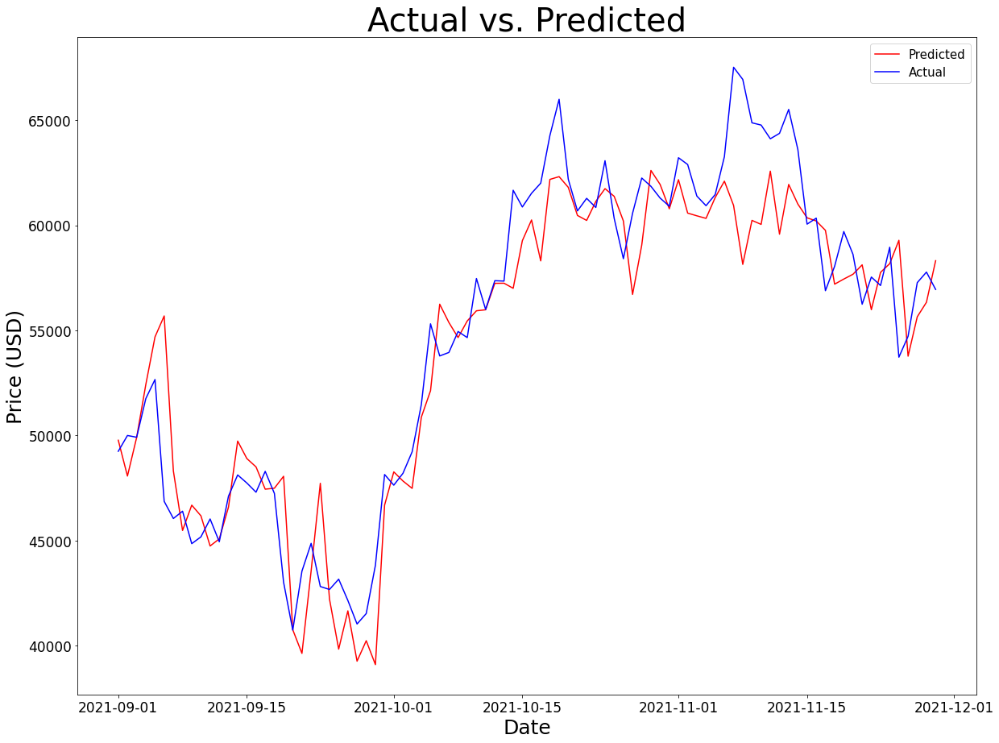

In [112]:
print(f'The best parameters returned from the grid search are: {grid_search1.best_params_}')
y_pred2 = grid_search1.predict(X_test)


ypred2 = list(y_pred2)

y_df2 = pd.DataFrame({'y_true': y_true, 'y_pred': ypred2}, index=X_test.index)




fig, ax = plt.subplots(figsize=(20,15))



ax.plot(y_df2.index, y_df2.y_pred, color='red', label='Predicted')
ax.plot(y_df2.index, y_df2.y_true, color='blue', label='Actual')
ax.legend(loc='best', fontsize=15)
ax.set_title('Actual vs. Predicted', fontsize=40)
ax.set_ylabel('Price (USD)', fontsize=25)
ax.set_xlabel('Date', fontsize=25)
ax.tick_params(axis='both', which='major', labelsize=17)

fig.show()

In [113]:
y_df['predDirection2'] = 0

for i in y_df.index:
    y_df['predDirection2'][i] = 1 if y_df2['y_pred'][i] > X_test.Close[i] else 0

<ipython-input-113-b18c301b5241>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y_df['predDirection2'][i] = 1 if y_df2['y_pred'][i] > X_test.Close[i] else 0


The accuracy score of the model is: 0.5
The recall score of the model is: 0.45652173913043476
The Matthews Correlation Coefficient of the model is: 0.0019836487314181957.
The roc auc score of the model is: 0.5009881422924901.


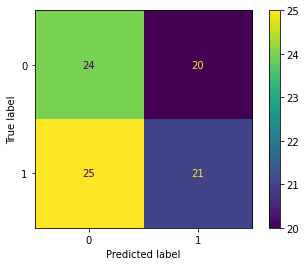

In [115]:
eval_model(y_df.priceDirection, y_df.predDirection2)

This was a very marignal improvement, and could possibly be attributed to the eta parameter of the grid search. We will attempt to engineer some features out of our data.

In [117]:
X.head()

,Open,High,Low,Close,Volume,Quote asset volume,Number of trades,Taker buy base volume,Taker buy quote volume
Open time,,,,,,,,,
2019-03-08,3873.63,3932.00,3800.00,3864.89,34730.366592,1.350009e+08,211534.0,17947.934228,6.979106e+07
2019-03-09,3864.88,3971.75,3854.75,3943.04,30979.747653,1.213536e+08,206869.0,16447.346558,6.442954e+07
2019-03-10,3943.43,3943.43,3881.69,3916.82,23187.561412,9.069395e+07,167920.0,12518.496386,4.896809e+07
2019-03-11,3915.99,3936.98,3830.00,3871.61,38066.885705,1.477220e+08,209916.0,19416.221014,7.532957e+07
2019-03-12,3871.61,3905.20,3826.06,3882.73,26921.008622,1.043938e+08,182885.0,13827.421065,5.362452e+07


In [122]:
# some features to be created will include: high/low spread (difference in price (+)), quote asset volume / Volume, quote - buy volume

X['High/Low'] = X['High'] - X['Low']

X['volX'] = X['Quote asset volume'] / X['Volume']

X['quote-buy'] = X['Taker buy quote volume'] / X['Taker buy base volume']

In [123]:
X.head()

,Open,High,Low,Close,Volume,Quote asset volume,Number of trades,Taker buy base volume,Taker buy quote volume,High/Low,volX,quote-buy
Open time,,,,,,,,,,,,
2019-03-08,3873.63,3932.00,3800.00,3864.89,34730.366592,1.350009e+08,211534.0,17947.934228,6.979106e+07,132.00,3887.112785,3888.528778
2019-03-09,3864.88,3971.75,3854.75,3943.04,30979.747653,1.213536e+08,206869.0,16447.346558,6.442954e+07,117.00,3917.191590,3917.321422
2019-03-10,3943.43,3943.43,3881.69,3916.82,23187.561412,9.069395e+07,167920.0,12518.496386,4.896809e+07,61.74,3911.319009,3911.659322
2019-03-11,3915.99,3936.98,3830.00,3871.61,38066.885705,1.477220e+08,209916.0,19416.221014,7.532957e+07,106.98,3880.589871,3879.723769
2019-03-12,3871.61,3905.20,3826.06,3882.73,26921.008622,1.043938e+08,182885.0,13827.421065,5.362452e+07,79.14,3877.783738,3878.128843


In [124]:
X_train2, X_test2 = X[:train_size], X[train_size:]

In [127]:
grid_search1.fit(X_train2, y_train)

Fitting 5 folds for each of 243 candidates, totalling 1215 fits
[CV 1/5] END feature_reduction__kbest__k=1, feature_reduction__pca__n_components=1, predictor__eta=0.1; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=1, feature_reduction__pca__n_components=1, predictor__eta=0.1; total time=   0.1s
[CV 3/5] END feature_reduction__kbest__k=1, feature_reduction__pca__n_components=1, predictor__eta=0.1; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=1, feature_reduction__pca__n_components=1, predictor__eta=0.1; total time=   0.1s
[CV 5/5] END feature_reduction__kbest__k=1, feature_reduction__pca__n_components=1, predictor__eta=0.1; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=1, feature_reduction__pca__n_components=1, predictor__eta=0.2; total time=   0.1s
[CV 2/5] END feature_reduction__kbest__k=1, feature_reduction__pca__n_components=1, predictor__eta=0.2; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=1, feature_reduction__pca__n_components=1, predictor__eta=0.2; total time=   0.1s
[CV 4/5] END feature_reduction__kbest__k=1, feature_reduction__pca__n_components=1, predictor__eta=0.2; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=1, feature_reduction__pca__n_components=1, predictor__eta=0.2; total time=   0.1s
[CV 1/5] END feature_reduction__kbest__k=1, feature_reduction__pca__n_components=1, predictor__eta=0.3; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=1, feature_reduction__pca__n_components=1, predictor__eta=0.3; total time=   0.1s
[CV 3/5] END feature_reduction__kbest__k=1, feature_reduction__pca__n_components=1, predictor__eta=0.3; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=1, feature_reduction__pca__n_components=1, predictor__eta=0.3; total time=   0.1s
[CV 5/5] END feature_reduction__kbest__k=1, feature_reduction__pca__n_components=1, predictor__eta=0.3; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=1, feature_reduction__pca__n_components=2, predictor__eta=0.1; total time=   0.1s
[CV 2/5] END feature_reduction__kbest__k=1, feature_reduction__pca__n_components=2, predictor__eta=0.1; total time=   0.1s
[CV 3/5] END feature_reduction__kbest__k=1, feature_reduction__pca__n_components=2, predictor__eta=0.1; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=1, feature_reduction__pca__n_components=2, predictor__eta=0.1; total time=   0.1s
[CV 5/5] END feature_reduction__kbest__k=1, feature_reduction__pca__n_components=2, predictor__eta=0.1; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=1, feature_reduction__pca__n_components=2, predictor__eta=0.2; total time=   0.1s
[CV 2/5] END feature_reduction__kbest__k=1, feature_reduction__pca__n_components=2, predictor__eta=0.2; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=1, feature_reduction__pca__n_components=2, predictor__eta=0.2; total time=   0.1s
[CV 4/5] END feature_reduction__kbest__k=1, feature_reduction__pca__n_components=2, predictor__eta=0.2; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=1, feature_reduction__pca__n_components=2, predictor__eta=0.2; total time=   0.1s
[CV 1/5] END feature_reduction__kbest__k=1, feature_reduction__pca__n_components=2, predictor__eta=0.3; total time=   0.1s
[CV 2/5] END feature_reduction__kbest__k=1, feature_reduction__pca__n_components=2, predictor__eta=0.3; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=1, feature_reduction__pca__n_components=2, predictor__eta=0.3; total time=   0.1s
[CV 4/5] END feature_reduction__kbest__k=1, feature_reduction__pca__n_components=2, predictor__eta=0.3; total time=   0.1s
[CV 5/5] END feature_reduction__kbest__k=1, feature_reduction__pca__n_components=2, predictor__eta=0.3; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=1, feature_reduction__pca__n_components=3, predictor__eta=0.1; total time=   0.1s
[CV 2/5] END feature_reduction__kbest__k=1, feature_reduction__pca__n_components=3, predictor__eta=0.1; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=1, feature_reduction__pca__n_components=3, predictor__eta=0.1; total time=   0.1s
[CV 4/5] END feature_reduction__kbest__k=1, feature_reduction__pca__n_components=3, predictor__eta=0.1; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=1, feature_reduction__pca__n_components=3, predictor__eta=0.1; total time=   0.1s
[CV 1/5] END feature_reduction__kbest__k=1, feature_reduction__pca__n_components=3, predictor__eta=0.2; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=1, feature_reduction__pca__n_components=3, predictor__eta=0.2; total time=   0.1s
[CV 3/5] END feature_reduction__kbest__k=1, feature_reduction__pca__n_components=3, predictor__eta=0.2; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=1, feature_reduction__pca__n_components=3, predictor__eta=0.2; total time=   0.1s
[CV 5/5] END feature_reduction__kbest__k=1, feature_reduction__pca__n_components=3, predictor__eta=0.2; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=1, feature_reduction__pca__n_components=3, predictor__eta=0.3; total time=   0.1s
[CV 2/5] END feature_reduction__kbest__k=1, feature_reduction__pca__n_components=3, predictor__eta=0.3; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=1, feature_reduction__pca__n_components=3, predictor__eta=0.3; total time=   0.1s
[CV 4/5] END feature_reduction__kbest__k=1, feature_reduction__pca__n_components=3, predictor__eta=0.3; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=1, feature_reduction__pca__n_components=3, predictor__eta=0.3; total time=   0.1s
[CV 1/5] END feature_reduction__kbest__k=1, feature_reduction__pca__n_components=4, predictor__eta=0.1; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=1, feature_reduction__pca__n_components=4, predictor__eta=0.1; total time=   0.1s
[CV 3/5] END feature_reduction__kbest__k=1, feature_reduction__pca__n_components=4, predictor__eta=0.1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=1, feature_reduction__pca__n_components=4, predictor__eta=0.1; total time=   0.1s
[CV 5/5] END feature_reduction__kbest__k=1, feature_reduction__pca__n_components=4, predictor__eta=0.1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=1, feature_reduction__pca__n_components=4, predictor__eta=0.2; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=1, feature_reduction__pca__n_components=4, predictor__eta=0.2; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=1, feature_reduction__pca__n_components=4, predictor__eta=0.2; total time=   0.1s
[CV 4/5] END feature_reduction__kbest__k=1, feature_reduction__pca__n_components=4, predictor__eta=0.2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=1, feature_reduction__pca__n_components=4, predictor__eta=0.2; total time=   0.1s
[CV 1/5] END feature_reduction__kbest__k=1, feature_reduction__pca__n_components=4, predictor__eta=0.3; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=1, feature_reduction__pca__n_components=4, predictor__eta=0.3; total time=   0.1s
[CV 3/5] END feature_reduction__kbest__k=1, feature_reduction__pca__n_components=4, predictor__eta=0.3; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=1, feature_reduction__pca__n_components=4, predictor__eta=0.3; total time=   0.1s
[CV 5/5] END feature_reduction__kbest__k=1, feature_reduction__pca__n_components=4, predictor__eta=0.3; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=1, feature_reduction__pca__n_components=5, predictor__eta=0.1; total time=   0.1s
[CV 2/5] END feature_reduction__kbest__k=1, feature_reduction__pca__n_components=5, predictor__eta=0.1; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=1, feature_reduction__pca__n_components=5, predictor__eta=0.1; total time=   0.1s
[CV 4/5] END feature_reduction__kbest__k=1, feature_reduction__pca__n_components=5, predictor__eta=0.1; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=1, feature_reduction__pca__n_components=5, predictor__eta=0.1; total time=   0.1s
[CV 1/5] END feature_reduction__kbest__k=1, feature_reduction__pca__n_components=5, predictor__eta=0.2; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=1, feature_reduction__pca__n_components=5, predictor__eta=0.2; total time=   0.1s
[CV 3/5] END feature_reduction__kbest__k=1, feature_reduction__pca__n_components=5, predictor__eta=0.2; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=1, feature_reduction__pca__n_components=5, predictor__eta=0.2; total time=   0.1s
[CV 5/5] END feature_reduction__kbest__k=1, feature_reduction__pca__n_components=5, predictor__eta=0.2; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=1, feature_reduction__pca__n_components=5, predictor__eta=0.3; total time=   0.1s
[CV 2/5] END feature_reduction__kbest__k=1, feature_reduction__pca__n_components=5, predictor__eta=0.3; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=1, feature_reduction__pca__n_components=5, predictor__eta=0.3; total time=   0.1s
[CV 4/5] END feature_reduction__kbest__k=1, feature_reduction__pca__n_components=5, predictor__eta=0.3; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=1, feature_reduction__pca__n_components=5, predictor__eta=0.3; total time=   0.1s
[CV 1/5] END feature_reduction__kbest__k=1, feature_reduction__pca__n_components=6, predictor__eta=0.1; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=1, feature_reduction__pca__n_components=6, predictor__eta=0.1; total time=   0.1s
[CV 3/5] END feature_reduction__kbest__k=1, feature_reduction__pca__n_components=6, predictor__eta=0.1; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=1, feature_reduction__pca__n_components=6, predictor__eta=0.1; total time=   0.1s
[CV 5/5] END feature_reduction__kbest__k=1, feature_reduction__pca__n_components=6, predictor__eta=0.1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=1, feature_reduction__pca__n_components=6, predictor__eta=0.2; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=1, feature_reduction__pca__n_components=6, predictor__eta=0.2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=1, feature_reduction__pca__n_components=6, predictor__eta=0.2; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=1, feature_reduction__pca__n_components=6, predictor__eta=0.2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=1, feature_reduction__pca__n_components=6, predictor__eta=0.2; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=1, feature_reduction__pca__n_components=6, predictor__eta=0.3; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=1, feature_reduction__pca__n_components=6, predictor__eta=0.3; total time=   0.1s
[CV 3/5] END feature_reduction__kbest__k=1, feature_reduction__pca__n_components=6, predictor__eta=0.3; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=1, feature_reduction__pca__n_components=6, predictor__eta=0.3; total time=   0.1s
[CV 5/5] END feature_reduction__kbest__k=1, feature_reduction__pca__n_components=6, predictor__eta=0.3; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=1, feature_reduction__pca__n_components=7, predictor__eta=0.1; total time=   0.1s
[CV 2/5] END feature_reduction__kbest__k=1, feature_reduction__pca__n_components=7, predictor__eta=0.1; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=1, feature_reduction__pca__n_components=7, predictor__eta=0.1; total time=   0.1s
[CV 4/5] END feature_reduction__kbest__k=1, feature_reduction__pca__n_components=7, predictor__eta=0.1; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=1, feature_reduction__pca__n_components=7, predictor__eta=0.1; total time=   0.1s
[CV 1/5] END feature_reduction__kbest__k=1, feature_reduction__pca__n_components=7, predictor__eta=0.2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=1, feature_reduction__pca__n_components=7, predictor__eta=0.2; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=1, feature_reduction__pca__n_components=7, predictor__eta=0.2; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=1, feature_reduction__pca__n_components=7, predictor__eta=0.2; total time=   0.1s
[CV 5/5] END feature_reduction__kbest__k=1, feature_reduction__pca__n_components=7, predictor__eta=0.2; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=1, feature_reduction__pca__n_components=7, predictor__eta=0.3; total time=   0.1s
[CV 2/5] END feature_reduction__kbest__k=1, feature_reduction__pca__n_components=7, predictor__eta=0.3; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=1, feature_reduction__pca__n_components=7, predictor__eta=0.3; total time=   0.1s
[CV 4/5] END feature_reduction__kbest__k=1, feature_reduction__pca__n_components=7, predictor__eta=0.3; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=1, feature_reduction__pca__n_components=7, predictor__eta=0.3; total time=   0.1s
[CV 1/5] END feature_reduction__kbest__k=1, feature_reduction__pca__n_components=8, predictor__eta=0.1; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=1, feature_reduction__pca__n_components=8, predictor__eta=0.1; total time=   0.1s
[CV 3/5] END feature_reduction__kbest__k=1, feature_reduction__pca__n_components=8, predictor__eta=0.1; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=1, feature_reduction__pca__n_components=8, predictor__eta=0.1; total time=   0.1s
[CV 5/5] END feature_reduction__kbest__k=1, feature_reduction__pca__n_components=8, predictor__eta=0.1; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=1, feature_reduction__pca__n_components=8, predictor__eta=0.2; total time=   0.1s
[CV 2/5] END feature_reduction__kbest__k=1, feature_reduction__pca__n_components=8, predictor__eta=0.2; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=1, feature_reduction__pca__n_components=8, predictor__eta=0.2; total time=   0.1s
[CV 4/5] END feature_reduction__kbest__k=1, feature_reduction__pca__n_components=8, predictor__eta=0.2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=1, feature_reduction__pca__n_components=8, predictor__eta=0.2; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=1, feature_reduction__pca__n_components=8, predictor__eta=0.3; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=1, feature_reduction__pca__n_components=8, predictor__eta=0.3; total time=   0.1s
[CV 3/5] END feature_reduction__kbest__k=1, feature_reduction__pca__n_components=8, predictor__eta=0.3; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=1, feature_reduction__pca__n_components=8, predictor__eta=0.3; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=1, feature_reduction__pca__n_components=8, predictor__eta=0.3; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=1, feature_reduction__pca__n_components=9, predictor__eta=0.1; total time=   0.1s
[CV 2/5] END feature_reduction__kbest__k=1, feature_reduction__pca__n_components=9, predictor__eta=0.1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=1, feature_reduction__pca__n_components=9, predictor__eta=0.1; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=1, feature_reduction__pca__n_components=9, predictor__eta=0.1; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=1, feature_reduction__pca__n_components=9, predictor__eta=0.1; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=1, feature_reduction__pca__n_components=9, predictor__eta=0.2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=1, feature_reduction__pca__n_components=9, predictor__eta=0.2; total time=   0.1s
[CV 3/5] END feature_reduction__kbest__k=1, feature_reduction__pca__n_components=9, predictor__eta=0.2; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=1, feature_reduction__pca__n_components=9, predictor__eta=0.2; total time=   0.1s
[CV 5/5] END feature_reduction__kbest__k=1, feature_reduction__pca__n_components=9, predictor__eta=0.2; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=1, feature_reduction__pca__n_components=9, predictor__eta=0.3; total time=   0.1s
[CV 2/5] END feature_reduction__kbest__k=1, feature_reduction__pca__n_components=9, predictor__eta=0.3; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=1, feature_reduction__pca__n_components=9, predictor__eta=0.3; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=1, feature_reduction__pca__n_components=9, predictor__eta=0.3; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=1, feature_reduction__pca__n_components=9, predictor__eta=0.3; total time=   0.1s
[CV 1/5] END feature_reduction__kbest__k=2, feature_reduction__pca__n_components=1, predictor__eta=0.1; total time=   0.1s
[CV 2/5] END feature_reduction__kbest__k=2, feature_reduction__pca__n_components=1, predictor__eta=0.1; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=2, feature_reduction__pca__n_components=1, predictor__eta=0.1; total time=   0.1s
[CV 4/5] END feature_reduction__kbest__k=2, feature_reduction__pca__n_components=1, predictor__eta=0.1; total time=   0.1s
[CV 5/5] END feature_reduction__kbest__k=2, feature_reduction__pca__n_components=1, predictor__eta=0.1; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=2, feature_reduction__pca__n_components=1, predictor__eta=0.2; total time=   0.1s
[CV 2/5] END feature_reduction__kbest__k=2, feature_reduction__pca__n_components=1, predictor__eta=0.2; total time=   0.1s
[CV 3/5] END feature_reduction__kbest__k=2, feature_reduction__pca__n_components=1, predictor__eta=0.2; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=2, feature_reduction__pca__n_components=1, predictor__eta=0.2; total time=   0.1s
[CV 5/5] END feature_reduction__kbest__k=2, feature_reduction__pca__n_components=1, predictor__eta=0.2; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=2, feature_reduction__pca__n_components=1, predictor__eta=0.3; total time=   0.1s
[CV 2/5] END feature_reduction__kbest__k=2, feature_reduction__pca__n_components=1, predictor__eta=0.3; total time=   0.1s
[CV 3/5] END feature_reduction__kbest__k=2, feature_reduction__pca__n_components=1, predictor__eta=0.3; total time=   0.1s
[CV 4/5] END feature_reduction__kbest__k=2, feature_reduction__pca__n_components=1, predictor__eta=0.3; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=2, feature_reduction__pca__n_components=1, predictor__eta=0.3; total time=   0.1s
[CV 1/5] END feature_reduction__kbest__k=2, feature_reduction__pca__n_components=2, predictor__eta=0.1; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=2, feature_reduction__pca__n_components=2, predictor__eta=0.1; total time=   0.1s
[CV 3/5] END feature_reduction__kbest__k=2, feature_reduction__pca__n_components=2, predictor__eta=0.1; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=2, feature_reduction__pca__n_components=2, predictor__eta=0.1; total time=   0.1s
[CV 5/5] END feature_reduction__kbest__k=2, feature_reduction__pca__n_components=2, predictor__eta=0.1; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=2, feature_reduction__pca__n_components=2, predictor__eta=0.2; total time=   0.1s
[CV 2/5] END feature_reduction__kbest__k=2, feature_reduction__pca__n_components=2, predictor__eta=0.2; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=2, feature_reduction__pca__n_components=2, predictor__eta=0.2; total time=   0.1s
[CV 4/5] END feature_reduction__kbest__k=2, feature_reduction__pca__n_components=2, predictor__eta=0.2; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=2, feature_reduction__pca__n_components=2, predictor__eta=0.2; total time=   0.1s
[CV 1/5] END feature_reduction__kbest__k=2, feature_reduction__pca__n_components=2, predictor__eta=0.3; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=2, feature_reduction__pca__n_components=2, predictor__eta=0.3; total time=   0.1s
[CV 3/5] END feature_reduction__kbest__k=2, feature_reduction__pca__n_components=2, predictor__eta=0.3; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=2, feature_reduction__pca__n_components=2, predictor__eta=0.3; total time=   0.1s
[CV 5/5] END feature_reduction__kbest__k=2, feature_reduction__pca__n_components=2, predictor__eta=0.3; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=2, feature_reduction__pca__n_components=3, predictor__eta=0.1; total time=   0.1s
[CV 2/5] END feature_reduction__kbest__k=2, feature_reduction__pca__n_components=3, predictor__eta=0.1; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=2, feature_reduction__pca__n_components=3, predictor__eta=0.1; total time=   0.1s
[CV 4/5] END feature_reduction__kbest__k=2, feature_reduction__pca__n_components=3, predictor__eta=0.1; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=2, feature_reduction__pca__n_components=3, predictor__eta=0.1; total time=   0.1s
[CV 1/5] END feature_reduction__kbest__k=2, feature_reduction__pca__n_components=3, predictor__eta=0.2; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=2, feature_reduction__pca__n_components=3, predictor__eta=0.2; total time=   0.1s
[CV 3/5] END feature_reduction__kbest__k=2, feature_reduction__pca__n_components=3, predictor__eta=0.2; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=2, feature_reduction__pca__n_components=3, predictor__eta=0.2; total time=   0.1s
[CV 5/5] END feature_reduction__kbest__k=2, feature_reduction__pca__n_components=3, predictor__eta=0.2; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=2, feature_reduction__pca__n_components=3, predictor__eta=0.3; total time=   0.1s
[CV 2/5] END feature_reduction__kbest__k=2, feature_reduction__pca__n_components=3, predictor__eta=0.3; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=2, feature_reduction__pca__n_components=3, predictor__eta=0.3; total time=   0.1s
[CV 4/5] END feature_reduction__kbest__k=2, feature_reduction__pca__n_components=3, predictor__eta=0.3; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=2, feature_reduction__pca__n_components=3, predictor__eta=0.3; total time=   0.1s
[CV 1/5] END feature_reduction__kbest__k=2, feature_reduction__pca__n_components=4, predictor__eta=0.1; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=2, feature_reduction__pca__n_components=4, predictor__eta=0.1; total time=   0.1s
[CV 3/5] END feature_reduction__kbest__k=2, feature_reduction__pca__n_components=4, predictor__eta=0.1; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=2, feature_reduction__pca__n_components=4, predictor__eta=0.1; total time=   0.1s
[CV 5/5] END feature_reduction__kbest__k=2, feature_reduction__pca__n_components=4, predictor__eta=0.1; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=2, feature_reduction__pca__n_components=4, predictor__eta=0.2; total time=   0.1s
[CV 2/5] END feature_reduction__kbest__k=2, feature_reduction__pca__n_components=4, predictor__eta=0.2; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=2, feature_reduction__pca__n_components=4, predictor__eta=0.2; total time=   0.1s
[CV 4/5] END feature_reduction__kbest__k=2, feature_reduction__pca__n_components=4, predictor__eta=0.2; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=2, feature_reduction__pca__n_components=4, predictor__eta=0.2; total time=   0.1s
[CV 1/5] END feature_reduction__kbest__k=2, feature_reduction__pca__n_components=4, predictor__eta=0.3; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=2, feature_reduction__pca__n_components=4, predictor__eta=0.3; total time=   0.1s
[CV 3/5] END feature_reduction__kbest__k=2, feature_reduction__pca__n_components=4, predictor__eta=0.3; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=2, feature_reduction__pca__n_components=4, predictor__eta=0.3; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=2, feature_reduction__pca__n_components=4, predictor__eta=0.3; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=2, feature_reduction__pca__n_components=5, predictor__eta=0.1; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=2, feature_reduction__pca__n_components=5, predictor__eta=0.1; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=2, feature_reduction__pca__n_components=5, predictor__eta=0.1; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=2, feature_reduction__pca__n_components=5, predictor__eta=0.1; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=2, feature_reduction__pca__n_components=5, predictor__eta=0.1; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=2, feature_reduction__pca__n_components=5, predictor__eta=0.2; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=2, feature_reduction__pca__n_components=5, predictor__eta=0.2; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=2, feature_reduction__pca__n_components=5, predictor__eta=0.2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=2, feature_reduction__pca__n_components=5, predictor__eta=0.2; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=2, feature_reduction__pca__n_components=5, predictor__eta=0.2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=2, feature_reduction__pca__n_components=5, predictor__eta=0.3; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=2, feature_reduction__pca__n_components=5, predictor__eta=0.3; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=2, feature_reduction__pca__n_components=5, predictor__eta=0.3; total time=   0.1s
[CV 4/5] END feature_reduction__kbest__k=2, feature_reduction__pca__n_components=5, predictor__eta=0.3; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=2, feature_reduction__pca__n_components=5, predictor__eta=0.3; total time=   0.1s
[CV 1/5] END feature_reduction__kbest__k=2, feature_reduction__pca__n_components=6, predictor__eta=0.1; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=2, feature_reduction__pca__n_components=6, predictor__eta=0.1; total time=   0.1s
[CV 3/5] END feature_reduction__kbest__k=2, feature_reduction__pca__n_components=6, predictor__eta=0.1; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=2, feature_reduction__pca__n_components=6, predictor__eta=0.1; total time=   0.1s
[CV 5/5] END feature_reduction__kbest__k=2, feature_reduction__pca__n_components=6, predictor__eta=0.1; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=2, feature_reduction__pca__n_components=6, predictor__eta=0.2; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=2, feature_reduction__pca__n_components=6, predictor__eta=0.2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=2, feature_reduction__pca__n_components=6, predictor__eta=0.2; total time=   0.1s
[CV 4/5] END feature_reduction__kbest__k=2, feature_reduction__pca__n_components=6, predictor__eta=0.2; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=2, feature_reduction__pca__n_components=6, predictor__eta=0.2; total time=   0.1s
[CV 1/5] END feature_reduction__kbest__k=2, feature_reduction__pca__n_components=6, predictor__eta=0.3; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=2, feature_reduction__pca__n_components=6, predictor__eta=0.3; total time=   0.1s
[CV 3/5] END feature_reduction__kbest__k=2, feature_reduction__pca__n_components=6, predictor__eta=0.3; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=2, feature_reduction__pca__n_components=6, predictor__eta=0.3; total time=   0.1s
[CV 5/5] END feature_reduction__kbest__k=2, feature_reduction__pca__n_components=6, predictor__eta=0.3; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=2, feature_reduction__pca__n_components=7, predictor__eta=0.1; total time=   0.1s
[CV 2/5] END feature_reduction__kbest__k=2, feature_reduction__pca__n_components=7, predictor__eta=0.1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=2, feature_reduction__pca__n_components=7, predictor__eta=0.1; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=2, feature_reduction__pca__n_components=7, predictor__eta=0.1; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=2, feature_reduction__pca__n_components=7, predictor__eta=0.1; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=2, feature_reduction__pca__n_components=7, predictor__eta=0.2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=2, feature_reduction__pca__n_components=7, predictor__eta=0.2; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=2, feature_reduction__pca__n_components=7, predictor__eta=0.2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=2, feature_reduction__pca__n_components=7, predictor__eta=0.2; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=2, feature_reduction__pca__n_components=7, predictor__eta=0.2; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=2, feature_reduction__pca__n_components=7, predictor__eta=0.3; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=2, feature_reduction__pca__n_components=7, predictor__eta=0.3; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=2, feature_reduction__pca__n_components=7, predictor__eta=0.3; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=2, feature_reduction__pca__n_components=7, predictor__eta=0.3; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=2, feature_reduction__pca__n_components=7, predictor__eta=0.3; total time=   0.1s
[CV 1/5] END feature_reduction__kbest__k=2, feature_reduction__pca__n_components=8, predictor__eta=0.1; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=2, feature_reduction__pca__n_components=8, predictor__eta=0.1; total time=   0.1s
[CV 3/5] END feature_reduction__kbest__k=2, feature_reduction__pca__n_components=8, predictor__eta=0.1; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=2, feature_reduction__pca__n_components=8, predictor__eta=0.1; total time=   0.1s
[CV 5/5] END feature_reduction__kbest__k=2, feature_reduction__pca__n_components=8, predictor__eta=0.1; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=2, feature_reduction__pca__n_components=8, predictor__eta=0.2; total time=   0.1s
[CV 2/5] END feature_reduction__kbest__k=2, feature_reduction__pca__n_components=8, predictor__eta=0.2; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=2, feature_reduction__pca__n_components=8, predictor__eta=0.2; total time=   0.1s
[CV 4/5] END feature_reduction__kbest__k=2, feature_reduction__pca__n_components=8, predictor__eta=0.2; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=2, feature_reduction__pca__n_components=8, predictor__eta=0.2; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=2, feature_reduction__pca__n_components=8, predictor__eta=0.3; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=2, feature_reduction__pca__n_components=8, predictor__eta=0.3; total time=   0.1s
[CV 3/5] END feature_reduction__kbest__k=2, feature_reduction__pca__n_components=8, predictor__eta=0.3; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=2, feature_reduction__pca__n_components=8, predictor__eta=0.3; total time=   0.1s
[CV 5/5] END feature_reduction__kbest__k=2, feature_reduction__pca__n_components=8, predictor__eta=0.3; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=2, feature_reduction__pca__n_components=9, predictor__eta=0.1; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=2, feature_reduction__pca__n_components=9, predictor__eta=0.1; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=2, feature_reduction__pca__n_components=9, predictor__eta=0.1; total time=   0.1s
[CV 4/5] END feature_reduction__kbest__k=2, feature_reduction__pca__n_components=9, predictor__eta=0.1; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=2, feature_reduction__pca__n_components=9, predictor__eta=0.1; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=2, feature_reduction__pca__n_components=9, predictor__eta=0.2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=2, feature_reduction__pca__n_components=9, predictor__eta=0.2; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=2, feature_reduction__pca__n_components=9, predictor__eta=0.2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=2, feature_reduction__pca__n_components=9, predictor__eta=0.2; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=2, feature_reduction__pca__n_components=9, predictor__eta=0.2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=2, feature_reduction__pca__n_components=9, predictor__eta=0.3; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=2, feature_reduction__pca__n_components=9, predictor__eta=0.3; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=2, feature_reduction__pca__n_components=9, predictor__eta=0.3; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=2, feature_reduction__pca__n_components=9, predictor__eta=0.3; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=2, feature_reduction__pca__n_components=9, predictor__eta=0.3; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=3, feature_reduction__pca__n_components=1, predictor__eta=0.1; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=3, feature_reduction__pca__n_components=1, predictor__eta=0.1; total time=   0.1s
[CV 3/5] END feature_reduction__kbest__k=3, feature_reduction__pca__n_components=1, predictor__eta=0.1; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=3, feature_reduction__pca__n_components=1, predictor__eta=0.1; total time=   0.1s
[CV 5/5] END feature_reduction__kbest__k=3, feature_reduction__pca__n_components=1, predictor__eta=0.1; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=3, feature_reduction__pca__n_components=1, predictor__eta=0.2; total time=   0.1s
[CV 2/5] END feature_reduction__kbest__k=3, feature_reduction__pca__n_components=1, predictor__eta=0.2; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=3, feature_reduction__pca__n_components=1, predictor__eta=0.2; total time=   0.1s
[CV 4/5] END feature_reduction__kbest__k=3, feature_reduction__pca__n_components=1, predictor__eta=0.2; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=3, feature_reduction__pca__n_components=1, predictor__eta=0.2; total time=   0.1s
[CV 1/5] END feature_reduction__kbest__k=3, feature_reduction__pca__n_components=1, predictor__eta=0.3; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=3, feature_reduction__pca__n_components=1, predictor__eta=0.3; total time=   0.1s
[CV 3/5] END feature_reduction__kbest__k=3, feature_reduction__pca__n_components=1, predictor__eta=0.3; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=3, feature_reduction__pca__n_components=1, predictor__eta=0.3; total time=   0.1s
[CV 5/5] END feature_reduction__kbest__k=3, feature_reduction__pca__n_components=1, predictor__eta=0.3; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=3, feature_reduction__pca__n_components=2, predictor__eta=0.1; total time=   0.1s
[CV 2/5] END feature_reduction__kbest__k=3, feature_reduction__pca__n_components=2, predictor__eta=0.1; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=3, feature_reduction__pca__n_components=2, predictor__eta=0.1; total time=   0.1s
[CV 4/5] END feature_reduction__kbest__k=3, feature_reduction__pca__n_components=2, predictor__eta=0.1; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=3, feature_reduction__pca__n_components=2, predictor__eta=0.1; total time=   0.1s
[CV 1/5] END feature_reduction__kbest__k=3, feature_reduction__pca__n_components=2, predictor__eta=0.2; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=3, feature_reduction__pca__n_components=2, predictor__eta=0.2; total time=   0.1s
[CV 3/5] END feature_reduction__kbest__k=3, feature_reduction__pca__n_components=2, predictor__eta=0.2; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=3, feature_reduction__pca__n_components=2, predictor__eta=0.2; total time=   0.1s
[CV 5/5] END feature_reduction__kbest__k=3, feature_reduction__pca__n_components=2, predictor__eta=0.2; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=3, feature_reduction__pca__n_components=2, predictor__eta=0.3; total time=   0.1s
[CV 2/5] END feature_reduction__kbest__k=3, feature_reduction__pca__n_components=2, predictor__eta=0.3; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=3, feature_reduction__pca__n_components=2, predictor__eta=0.3; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=3, feature_reduction__pca__n_components=2, predictor__eta=0.3; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=3, feature_reduction__pca__n_components=2, predictor__eta=0.3; total time=   0.1s
[CV 1/5] END feature_reduction__kbest__k=3, feature_reduction__pca__n_components=3, predictor__eta=0.1; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=3, feature_reduction__pca__n_components=3, predictor__eta=0.1; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=3, feature_reduction__pca__n_components=3, predictor__eta=0.1; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=3, feature_reduction__pca__n_components=3, predictor__eta=0.1; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=3, feature_reduction__pca__n_components=3, predictor__eta=0.1; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=3, feature_reduction__pca__n_components=3, predictor__eta=0.2; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=3, feature_reduction__pca__n_components=3, predictor__eta=0.2; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=3, feature_reduction__pca__n_components=3, predictor__eta=0.2; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=3, feature_reduction__pca__n_components=3, predictor__eta=0.2; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=3, feature_reduction__pca__n_components=3, predictor__eta=0.2; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=3, feature_reduction__pca__n_components=3, predictor__eta=0.3; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=3, feature_reduction__pca__n_components=3, predictor__eta=0.3; total time=   0.1s
[CV 3/5] END feature_reduction__kbest__k=3, feature_reduction__pca__n_components=3, predictor__eta=0.3; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=3, feature_reduction__pca__n_components=3, predictor__eta=0.3; total time=   0.1s
[CV 5/5] END feature_reduction__kbest__k=3, feature_reduction__pca__n_components=3, predictor__eta=0.3; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=3, feature_reduction__pca__n_components=4, predictor__eta=0.1; total time=   0.1s
[CV 2/5] END feature_reduction__kbest__k=3, feature_reduction__pca__n_components=4, predictor__eta=0.1; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=3, feature_reduction__pca__n_components=4, predictor__eta=0.1; total time=   0.1s
[CV 4/5] END feature_reduction__kbest__k=3, feature_reduction__pca__n_components=4, predictor__eta=0.1; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=3, feature_reduction__pca__n_components=4, predictor__eta=0.1; total time=   0.1s
[CV 1/5] END feature_reduction__kbest__k=3, feature_reduction__pca__n_components=4, predictor__eta=0.2; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=3, feature_reduction__pca__n_components=4, predictor__eta=0.2; total time=   0.1s
[CV 3/5] END feature_reduction__kbest__k=3, feature_reduction__pca__n_components=4, predictor__eta=0.2; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=3, feature_reduction__pca__n_components=4, predictor__eta=0.2; total time=   0.1s
[CV 5/5] END feature_reduction__kbest__k=3, feature_reduction__pca__n_components=4, predictor__eta=0.2; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=3, feature_reduction__pca__n_components=4, predictor__eta=0.3; total time=   0.1s
[CV 2/5] END feature_reduction__kbest__k=3, feature_reduction__pca__n_components=4, predictor__eta=0.3; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=3, feature_reduction__pca__n_components=4, predictor__eta=0.3; total time=   0.1s
[CV 4/5] END feature_reduction__kbest__k=3, feature_reduction__pca__n_components=4, predictor__eta=0.3; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=3, feature_reduction__pca__n_components=4, predictor__eta=0.3; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=3, feature_reduction__pca__n_components=5, predictor__eta=0.1; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=3, feature_reduction__pca__n_components=5, predictor__eta=0.1; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=3, feature_reduction__pca__n_components=5, predictor__eta=0.1; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=3, feature_reduction__pca__n_components=5, predictor__eta=0.1; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=3, feature_reduction__pca__n_components=5, predictor__eta=0.1; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=3, feature_reduction__pca__n_components=5, predictor__eta=0.2; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=3, feature_reduction__pca__n_components=5, predictor__eta=0.2; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=3, feature_reduction__pca__n_components=5, predictor__eta=0.2; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=3, feature_reduction__pca__n_components=5, predictor__eta=0.2; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=3, feature_reduction__pca__n_components=5, predictor__eta=0.2; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=3, feature_reduction__pca__n_components=5, predictor__eta=0.3; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=3, feature_reduction__pca__n_components=5, predictor__eta=0.3; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=3, feature_reduction__pca__n_components=5, predictor__eta=0.3; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=3, feature_reduction__pca__n_components=5, predictor__eta=0.3; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=3, feature_reduction__pca__n_components=5, predictor__eta=0.3; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=3, feature_reduction__pca__n_components=6, predictor__eta=0.1; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=3, feature_reduction__pca__n_components=6, predictor__eta=0.1; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=3, feature_reduction__pca__n_components=6, predictor__eta=0.1; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=3, feature_reduction__pca__n_components=6, predictor__eta=0.1; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=3, feature_reduction__pca__n_components=6, predictor__eta=0.1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=3, feature_reduction__pca__n_components=6, predictor__eta=0.2; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=3, feature_reduction__pca__n_components=6, predictor__eta=0.2; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=3, feature_reduction__pca__n_components=6, predictor__eta=0.2; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=3, feature_reduction__pca__n_components=6, predictor__eta=0.2; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=3, feature_reduction__pca__n_components=6, predictor__eta=0.2; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=3, feature_reduction__pca__n_components=6, predictor__eta=0.3; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=3, feature_reduction__pca__n_components=6, predictor__eta=0.3; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=3, feature_reduction__pca__n_components=6, predictor__eta=0.3; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=3, feature_reduction__pca__n_components=6, predictor__eta=0.3; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=3, feature_reduction__pca__n_components=6, predictor__eta=0.3; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=3, feature_reduction__pca__n_components=7, predictor__eta=0.1; total time=   0.1s
[CV 2/5] END feature_reduction__kbest__k=3, feature_reduction__pca__n_components=7, predictor__eta=0.1; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=3, feature_reduction__pca__n_components=7, predictor__eta=0.1; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=3, feature_reduction__pca__n_components=7, predictor__eta=0.1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=3, feature_reduction__pca__n_components=7, predictor__eta=0.1; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=3, feature_reduction__pca__n_components=7, predictor__eta=0.2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=3, feature_reduction__pca__n_components=7, predictor__eta=0.2; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=3, feature_reduction__pca__n_components=7, predictor__eta=0.2; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=3, feature_reduction__pca__n_components=7, predictor__eta=0.2; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=3, feature_reduction__pca__n_components=7, predictor__eta=0.2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=3, feature_reduction__pca__n_components=7, predictor__eta=0.3; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=3, feature_reduction__pca__n_components=7, predictor__eta=0.3; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=3, feature_reduction__pca__n_components=7, predictor__eta=0.3; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=3, feature_reduction__pca__n_components=7, predictor__eta=0.3; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=3, feature_reduction__pca__n_components=7, predictor__eta=0.3; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=3, feature_reduction__pca__n_components=8, predictor__eta=0.1; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=3, feature_reduction__pca__n_components=8, predictor__eta=0.1; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=3, feature_reduction__pca__n_components=8, predictor__eta=0.1; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=3, feature_reduction__pca__n_components=8, predictor__eta=0.1; total time=   0.1s
[CV 5/5] END feature_reduction__kbest__k=3, feature_reduction__pca__n_components=8, predictor__eta=0.1; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=3, feature_reduction__pca__n_components=8, predictor__eta=0.2; total time=   0.1s
[CV 2/5] END feature_reduction__kbest__k=3, feature_reduction__pca__n_components=8, predictor__eta=0.2; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=3, feature_reduction__pca__n_components=8, predictor__eta=0.2; total time=   0.1s
[CV 4/5] END feature_reduction__kbest__k=3, feature_reduction__pca__n_components=8, predictor__eta=0.2; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=3, feature_reduction__pca__n_components=8, predictor__eta=0.2; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=3, feature_reduction__pca__n_components=8, predictor__eta=0.3; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=3, feature_reduction__pca__n_components=8, predictor__eta=0.3; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=3, feature_reduction__pca__n_components=8, predictor__eta=0.3; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=3, feature_reduction__pca__n_components=8, predictor__eta=0.3; total time=   0.1s
[CV 5/5] END feature_reduction__kbest__k=3, feature_reduction__pca__n_components=8, predictor__eta=0.3; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=3, feature_reduction__pca__n_components=9, predictor__eta=0.1; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=3, feature_reduction__pca__n_components=9, predictor__eta=0.1; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=3, feature_reduction__pca__n_components=9, predictor__eta=0.1; total time=   0.1s
[CV 4/5] END feature_reduction__kbest__k=3, feature_reduction__pca__n_components=9, predictor__eta=0.1; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=3, feature_reduction__pca__n_components=9, predictor__eta=0.1; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=3, feature_reduction__pca__n_components=9, predictor__eta=0.2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=3, feature_reduction__pca__n_components=9, predictor__eta=0.2; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=3, feature_reduction__pca__n_components=9, predictor__eta=0.2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=3, feature_reduction__pca__n_components=9, predictor__eta=0.2; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=3, feature_reduction__pca__n_components=9, predictor__eta=0.2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=3, feature_reduction__pca__n_components=9, predictor__eta=0.3; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=3, feature_reduction__pca__n_components=9, predictor__eta=0.3; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=3, feature_reduction__pca__n_components=9, predictor__eta=0.3; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=3, feature_reduction__pca__n_components=9, predictor__eta=0.3; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=3, feature_reduction__pca__n_components=9, predictor__eta=0.3; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=4, feature_reduction__pca__n_components=1, predictor__eta=0.1; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=4, feature_reduction__pca__n_components=1, predictor__eta=0.1; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=4, feature_reduction__pca__n_components=1, predictor__eta=0.1; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=4, feature_reduction__pca__n_components=1, predictor__eta=0.1; total time=   0.1s
[CV 5/5] END feature_reduction__kbest__k=4, feature_reduction__pca__n_components=1, predictor__eta=0.1; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=4, feature_reduction__pca__n_components=1, predictor__eta=0.2; total time=   0.1s
[CV 2/5] END feature_reduction__kbest__k=4, feature_reduction__pca__n_components=1, predictor__eta=0.2; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=4, feature_reduction__pca__n_components=1, predictor__eta=0.2; total time=   0.1s
[CV 4/5] END feature_reduction__kbest__k=4, feature_reduction__pca__n_components=1, predictor__eta=0.2; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=4, feature_reduction__pca__n_components=1, predictor__eta=0.2; total time=   0.1s
[CV 1/5] END feature_reduction__kbest__k=4, feature_reduction__pca__n_components=1, predictor__eta=0.3; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=4, feature_reduction__pca__n_components=1, predictor__eta=0.3; total time=   0.1s
[CV 3/5] END feature_reduction__kbest__k=4, feature_reduction__pca__n_components=1, predictor__eta=0.3; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=4, feature_reduction__pca__n_components=1, predictor__eta=0.3; total time=   0.1s
[CV 5/5] END feature_reduction__kbest__k=4, feature_reduction__pca__n_components=1, predictor__eta=0.3; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=4, feature_reduction__pca__n_components=2, predictor__eta=0.1; total time=   0.1s
[CV 2/5] END feature_reduction__kbest__k=4, feature_reduction__pca__n_components=2, predictor__eta=0.1; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=4, feature_reduction__pca__n_components=2, predictor__eta=0.1; total time=   0.1s
[CV 4/5] END feature_reduction__kbest__k=4, feature_reduction__pca__n_components=2, predictor__eta=0.1; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=4, feature_reduction__pca__n_components=2, predictor__eta=0.1; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=4, feature_reduction__pca__n_components=2, predictor__eta=0.2; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=4, feature_reduction__pca__n_components=2, predictor__eta=0.2; total time=   0.1s
[CV 3/5] END feature_reduction__kbest__k=4, feature_reduction__pca__n_components=2, predictor__eta=0.2; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=4, feature_reduction__pca__n_components=2, predictor__eta=0.2; total time=   0.1s
[CV 5/5] END feature_reduction__kbest__k=4, feature_reduction__pca__n_components=2, predictor__eta=0.2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=4, feature_reduction__pca__n_components=2, predictor__eta=0.3; total time=   0.1s
[CV 2/5] END feature_reduction__kbest__k=4, feature_reduction__pca__n_components=2, predictor__eta=0.3; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=4, feature_reduction__pca__n_components=2, predictor__eta=0.3; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=4, feature_reduction__pca__n_components=2, predictor__eta=0.3; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=4, feature_reduction__pca__n_components=2, predictor__eta=0.3; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=4, feature_reduction__pca__n_components=3, predictor__eta=0.1; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=4, feature_reduction__pca__n_components=3, predictor__eta=0.1; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=4, feature_reduction__pca__n_components=3, predictor__eta=0.1; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=4, feature_reduction__pca__n_components=3, predictor__eta=0.1; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=4, feature_reduction__pca__n_components=3, predictor__eta=0.1; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=4, feature_reduction__pca__n_components=3, predictor__eta=0.2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=4, feature_reduction__pca__n_components=3, predictor__eta=0.2; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=4, feature_reduction__pca__n_components=3, predictor__eta=0.2; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=4, feature_reduction__pca__n_components=3, predictor__eta=0.2; total time=   0.1s
[CV 5/5] END feature_reduction__kbest__k=4, feature_reduction__pca__n_components=3, predictor__eta=0.2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=4, feature_reduction__pca__n_components=3, predictor__eta=0.3; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=4, feature_reduction__pca__n_components=3, predictor__eta=0.3; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=4, feature_reduction__pca__n_components=3, predictor__eta=0.3; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=4, feature_reduction__pca__n_components=3, predictor__eta=0.3; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=4, feature_reduction__pca__n_components=3, predictor__eta=0.3; total time=   0.1s
[CV 1/5] END feature_reduction__kbest__k=4, feature_reduction__pca__n_components=4, predictor__eta=0.1; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=4, feature_reduction__pca__n_components=4, predictor__eta=0.1; total time=   0.1s
[CV 3/5] END feature_reduction__kbest__k=4, feature_reduction__pca__n_components=4, predictor__eta=0.1; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=4, feature_reduction__pca__n_components=4, predictor__eta=0.1; total time=   0.1s
[CV 5/5] END feature_reduction__kbest__k=4, feature_reduction__pca__n_components=4, predictor__eta=0.1; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=4, feature_reduction__pca__n_components=4, predictor__eta=0.2; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=4, feature_reduction__pca__n_components=4, predictor__eta=0.2; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=4, feature_reduction__pca__n_components=4, predictor__eta=0.2; total time=   0.1s
[CV 4/5] END feature_reduction__kbest__k=4, feature_reduction__pca__n_components=4, predictor__eta=0.2; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=4, feature_reduction__pca__n_components=4, predictor__eta=0.2; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=4, feature_reduction__pca__n_components=4, predictor__eta=0.3; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=4, feature_reduction__pca__n_components=4, predictor__eta=0.3; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=4, feature_reduction__pca__n_components=4, predictor__eta=0.3; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=4, feature_reduction__pca__n_components=4, predictor__eta=0.3; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=4, feature_reduction__pca__n_components=4, predictor__eta=0.3; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=4, feature_reduction__pca__n_components=5, predictor__eta=0.1; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=4, feature_reduction__pca__n_components=5, predictor__eta=0.1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=4, feature_reduction__pca__n_components=5, predictor__eta=0.1; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=4, feature_reduction__pca__n_components=5, predictor__eta=0.1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=4, feature_reduction__pca__n_components=5, predictor__eta=0.1; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=4, feature_reduction__pca__n_components=5, predictor__eta=0.2; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=4, feature_reduction__pca__n_components=5, predictor__eta=0.2; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=4, feature_reduction__pca__n_components=5, predictor__eta=0.2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=4, feature_reduction__pca__n_components=5, predictor__eta=0.2; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=4, feature_reduction__pca__n_components=5, predictor__eta=0.2; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=4, feature_reduction__pca__n_components=5, predictor__eta=0.3; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=4, feature_reduction__pca__n_components=5, predictor__eta=0.3; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=4, feature_reduction__pca__n_components=5, predictor__eta=0.3; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=4, feature_reduction__pca__n_components=5, predictor__eta=0.3; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=4, feature_reduction__pca__n_components=5, predictor__eta=0.3; total time=   0.1s
[CV 1/5] END feature_reduction__kbest__k=4, feature_reduction__pca__n_components=6, predictor__eta=0.1; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=4, feature_reduction__pca__n_components=6, predictor__eta=0.1; total time=   0.1s
[CV 3/5] END feature_reduction__kbest__k=4, feature_reduction__pca__n_components=6, predictor__eta=0.1; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=4, feature_reduction__pca__n_components=6, predictor__eta=0.1; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=4, feature_reduction__pca__n_components=6, predictor__eta=0.1; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=4, feature_reduction__pca__n_components=6, predictor__eta=0.2; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=4, feature_reduction__pca__n_components=6, predictor__eta=0.2; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=4, feature_reduction__pca__n_components=6, predictor__eta=0.2; total time=   0.1s
[CV 4/5] END feature_reduction__kbest__k=4, feature_reduction__pca__n_components=6, predictor__eta=0.2; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=4, feature_reduction__pca__n_components=6, predictor__eta=0.2; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=4, feature_reduction__pca__n_components=6, predictor__eta=0.3; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=4, feature_reduction__pca__n_components=6, predictor__eta=0.3; total time=   0.1s
[CV 3/5] END feature_reduction__kbest__k=4, feature_reduction__pca__n_components=6, predictor__eta=0.3; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=4, feature_reduction__pca__n_components=6, predictor__eta=0.3; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=4, feature_reduction__pca__n_components=6, predictor__eta=0.3; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=4, feature_reduction__pca__n_components=7, predictor__eta=0.1; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=4, feature_reduction__pca__n_components=7, predictor__eta=0.1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=4, feature_reduction__pca__n_components=7, predictor__eta=0.1; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=4, feature_reduction__pca__n_components=7, predictor__eta=0.1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=4, feature_reduction__pca__n_components=7, predictor__eta=0.1; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=4, feature_reduction__pca__n_components=7, predictor__eta=0.2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=4, feature_reduction__pca__n_components=7, predictor__eta=0.2; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=4, feature_reduction__pca__n_components=7, predictor__eta=0.2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=4, feature_reduction__pca__n_components=7, predictor__eta=0.2; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=4, feature_reduction__pca__n_components=7, predictor__eta=0.2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=4, feature_reduction__pca__n_components=7, predictor__eta=0.3; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=4, feature_reduction__pca__n_components=7, predictor__eta=0.3; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=4, feature_reduction__pca__n_components=7, predictor__eta=0.3; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=4, feature_reduction__pca__n_components=7, predictor__eta=0.3; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=4, feature_reduction__pca__n_components=7, predictor__eta=0.3; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=4, feature_reduction__pca__n_components=8, predictor__eta=0.1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=4, feature_reduction__pca__n_components=8, predictor__eta=0.1; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=4, feature_reduction__pca__n_components=8, predictor__eta=0.1; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=4, feature_reduction__pca__n_components=8, predictor__eta=0.1; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=4, feature_reduction__pca__n_components=8, predictor__eta=0.1; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=4, feature_reduction__pca__n_components=8, predictor__eta=0.2; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=4, feature_reduction__pca__n_components=8, predictor__eta=0.2; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=4, feature_reduction__pca__n_components=8, predictor__eta=0.2; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=4, feature_reduction__pca__n_components=8, predictor__eta=0.2; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=4, feature_reduction__pca__n_components=8, predictor__eta=0.2; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=4, feature_reduction__pca__n_components=8, predictor__eta=0.3; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=4, feature_reduction__pca__n_components=8, predictor__eta=0.3; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=4, feature_reduction__pca__n_components=8, predictor__eta=0.3; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=4, feature_reduction__pca__n_components=8, predictor__eta=0.3; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=4, feature_reduction__pca__n_components=8, predictor__eta=0.3; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=4, feature_reduction__pca__n_components=9, predictor__eta=0.1; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=4, feature_reduction__pca__n_components=9, predictor__eta=0.1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=4, feature_reduction__pca__n_components=9, predictor__eta=0.1; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=4, feature_reduction__pca__n_components=9, predictor__eta=0.1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=4, feature_reduction__pca__n_components=9, predictor__eta=0.1; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=4, feature_reduction__pca__n_components=9, predictor__eta=0.2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=4, feature_reduction__pca__n_components=9, predictor__eta=0.2; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=4, feature_reduction__pca__n_components=9, predictor__eta=0.2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=4, feature_reduction__pca__n_components=9, predictor__eta=0.2; total time=   0.3s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=4, feature_reduction__pca__n_components=9, predictor__eta=0.2; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=4, feature_reduction__pca__n_components=9, predictor__eta=0.3; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=4, feature_reduction__pca__n_components=9, predictor__eta=0.3; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=4, feature_reduction__pca__n_components=9, predictor__eta=0.3; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=4, feature_reduction__pca__n_components=9, predictor__eta=0.3; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=4, feature_reduction__pca__n_components=9, predictor__eta=0.3; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=5, feature_reduction__pca__n_components=1, predictor__eta=0.1; total time=   0.1s
[CV 2/5] END feature_reduction__kbest__k=5, feature_reduction__pca__n_components=1, predictor__eta=0.1; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=5, feature_reduction__pca__n_components=1, predictor__eta=0.1; total time=   0.1s
[CV 4/5] END feature_reduction__kbest__k=5, feature_reduction__pca__n_components=1, predictor__eta=0.1; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=5, feature_reduction__pca__n_components=1, predictor__eta=0.1; total time=   0.1s
[CV 1/5] END feature_reduction__kbest__k=5, feature_reduction__pca__n_components=1, predictor__eta=0.2; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=5, feature_reduction__pca__n_components=1, predictor__eta=0.2; total time=   0.1s
[CV 3/5] END feature_reduction__kbest__k=5, feature_reduction__pca__n_components=1, predictor__eta=0.2; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=5, feature_reduction__pca__n_components=1, predictor__eta=0.2; total time=   0.1s
[CV 5/5] END feature_reduction__kbest__k=5, feature_reduction__pca__n_components=1, predictor__eta=0.2; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=5, feature_reduction__pca__n_components=1, predictor__eta=0.3; total time=   0.1s
[CV 2/5] END feature_reduction__kbest__k=5, feature_reduction__pca__n_components=1, predictor__eta=0.3; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=5, feature_reduction__pca__n_components=1, predictor__eta=0.3; total time=   0.1s
[CV 4/5] END feature_reduction__kbest__k=5, feature_reduction__pca__n_components=1, predictor__eta=0.3; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=5, feature_reduction__pca__n_components=1, predictor__eta=0.3; total time=   0.1s
[CV 1/5] END feature_reduction__kbest__k=5, feature_reduction__pca__n_components=2, predictor__eta=0.1; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=5, feature_reduction__pca__n_components=2, predictor__eta=0.1; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=5, feature_reduction__pca__n_components=2, predictor__eta=0.1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=5, feature_reduction__pca__n_components=2, predictor__eta=0.1; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=5, feature_reduction__pca__n_components=2, predictor__eta=0.1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=5, feature_reduction__pca__n_components=2, predictor__eta=0.2; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=5, feature_reduction__pca__n_components=2, predictor__eta=0.2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=5, feature_reduction__pca__n_components=2, predictor__eta=0.2; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=5, feature_reduction__pca__n_components=2, predictor__eta=0.2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=5, feature_reduction__pca__n_components=2, predictor__eta=0.2; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=5, feature_reduction__pca__n_components=2, predictor__eta=0.3; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=5, feature_reduction__pca__n_components=2, predictor__eta=0.3; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=5, feature_reduction__pca__n_components=2, predictor__eta=0.3; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=5, feature_reduction__pca__n_components=2, predictor__eta=0.3; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=5, feature_reduction__pca__n_components=2, predictor__eta=0.3; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=5, feature_reduction__pca__n_components=3, predictor__eta=0.1; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=5, feature_reduction__pca__n_components=3, predictor__eta=0.1; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=5, feature_reduction__pca__n_components=3, predictor__eta=0.1; total time=   0.1s
[CV 4/5] END feature_reduction__kbest__k=5, feature_reduction__pca__n_components=3, predictor__eta=0.1; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=5, feature_reduction__pca__n_components=3, predictor__eta=0.1; total time=   0.1s
[CV 1/5] END feature_reduction__kbest__k=5, feature_reduction__pca__n_components=3, predictor__eta=0.2; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=5, feature_reduction__pca__n_components=3, predictor__eta=0.2; total time=   0.1s
[CV 3/5] END feature_reduction__kbest__k=5, feature_reduction__pca__n_components=3, predictor__eta=0.2; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=5, feature_reduction__pca__n_components=3, predictor__eta=0.2; total time=   0.1s
[CV 5/5] END feature_reduction__kbest__k=5, feature_reduction__pca__n_components=3, predictor__eta=0.2; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=5, feature_reduction__pca__n_components=3, predictor__eta=0.3; total time=   0.1s
[CV 2/5] END feature_reduction__kbest__k=5, feature_reduction__pca__n_components=3, predictor__eta=0.3; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=5, feature_reduction__pca__n_components=3, predictor__eta=0.3; total time=   0.1s
[CV 4/5] END feature_reduction__kbest__k=5, feature_reduction__pca__n_components=3, predictor__eta=0.3; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=5, feature_reduction__pca__n_components=3, predictor__eta=0.3; total time=   0.1s
[CV 1/5] END feature_reduction__kbest__k=5, feature_reduction__pca__n_components=4, predictor__eta=0.1; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=5, feature_reduction__pca__n_components=4, predictor__eta=0.1; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=5, feature_reduction__pca__n_components=4, predictor__eta=0.1; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=5, feature_reduction__pca__n_components=4, predictor__eta=0.1; total time=   0.1s
[CV 5/5] END feature_reduction__kbest__k=5, feature_reduction__pca__n_components=4, predictor__eta=0.1; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=5, feature_reduction__pca__n_components=4, predictor__eta=0.2; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=5, feature_reduction__pca__n_components=4, predictor__eta=0.2; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=5, feature_reduction__pca__n_components=4, predictor__eta=0.2; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=5, feature_reduction__pca__n_components=4, predictor__eta=0.2; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=5, feature_reduction__pca__n_components=4, predictor__eta=0.2; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=5, feature_reduction__pca__n_components=4, predictor__eta=0.3; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=5, feature_reduction__pca__n_components=4, predictor__eta=0.3; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=5, feature_reduction__pca__n_components=4, predictor__eta=0.3; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=5, feature_reduction__pca__n_components=4, predictor__eta=0.3; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=5, feature_reduction__pca__n_components=4, predictor__eta=0.3; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=5, feature_reduction__pca__n_components=5, predictor__eta=0.1; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=5, feature_reduction__pca__n_components=5, predictor__eta=0.1; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=5, feature_reduction__pca__n_components=5, predictor__eta=0.1; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=5, feature_reduction__pca__n_components=5, predictor__eta=0.1; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=5, feature_reduction__pca__n_components=5, predictor__eta=0.1; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=5, feature_reduction__pca__n_components=5, predictor__eta=0.2; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=5, feature_reduction__pca__n_components=5, predictor__eta=0.2; total time=   0.1s
[CV 3/5] END feature_reduction__kbest__k=5, feature_reduction__pca__n_components=5, predictor__eta=0.2; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=5, feature_reduction__pca__n_components=5, predictor__eta=0.2; total time=   0.1s
[CV 5/5] END feature_reduction__kbest__k=5, feature_reduction__pca__n_components=5, predictor__eta=0.2; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=5, feature_reduction__pca__n_components=5, predictor__eta=0.3; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=5, feature_reduction__pca__n_components=5, predictor__eta=0.3; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=5, feature_reduction__pca__n_components=5, predictor__eta=0.3; total time=   0.1s
[CV 4/5] END feature_reduction__kbest__k=5, feature_reduction__pca__n_components=5, predictor__eta=0.3; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=5, feature_reduction__pca__n_components=5, predictor__eta=0.3; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=5, feature_reduction__pca__n_components=6, predictor__eta=0.1; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=5, feature_reduction__pca__n_components=6, predictor__eta=0.1; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=5, feature_reduction__pca__n_components=6, predictor__eta=0.1; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=5, feature_reduction__pca__n_components=6, predictor__eta=0.1; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=5, feature_reduction__pca__n_components=6, predictor__eta=0.1; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=5, feature_reduction__pca__n_components=6, predictor__eta=0.2; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=5, feature_reduction__pca__n_components=6, predictor__eta=0.2; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=5, feature_reduction__pca__n_components=6, predictor__eta=0.2; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=5, feature_reduction__pca__n_components=6, predictor__eta=0.2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=5, feature_reduction__pca__n_components=6, predictor__eta=0.2; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=5, feature_reduction__pca__n_components=6, predictor__eta=0.3; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=5, feature_reduction__pca__n_components=6, predictor__eta=0.3; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=5, feature_reduction__pca__n_components=6, predictor__eta=0.3; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=5, feature_reduction__pca__n_components=6, predictor__eta=0.3; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=5, feature_reduction__pca__n_components=6, predictor__eta=0.3; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=5, feature_reduction__pca__n_components=7, predictor__eta=0.1; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=5, feature_reduction__pca__n_components=7, predictor__eta=0.1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=5, feature_reduction__pca__n_components=7, predictor__eta=0.1; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=5, feature_reduction__pca__n_components=7, predictor__eta=0.1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=5, feature_reduction__pca__n_components=7, predictor__eta=0.1; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=5, feature_reduction__pca__n_components=7, predictor__eta=0.2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=5, feature_reduction__pca__n_components=7, predictor__eta=0.2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=5, feature_reduction__pca__n_components=7, predictor__eta=0.2; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=5, feature_reduction__pca__n_components=7, predictor__eta=0.2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=5, feature_reduction__pca__n_components=7, predictor__eta=0.2; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=5, feature_reduction__pca__n_components=7, predictor__eta=0.3; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=5, feature_reduction__pca__n_components=7, predictor__eta=0.3; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=5, feature_reduction__pca__n_components=7, predictor__eta=0.3; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=5, feature_reduction__pca__n_components=7, predictor__eta=0.3; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=5, feature_reduction__pca__n_components=7, predictor__eta=0.3; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=5, feature_reduction__pca__n_components=8, predictor__eta=0.1; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=5, feature_reduction__pca__n_components=8, predictor__eta=0.1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=5, feature_reduction__pca__n_components=8, predictor__eta=0.1; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=5, feature_reduction__pca__n_components=8, predictor__eta=0.1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=5, feature_reduction__pca__n_components=8, predictor__eta=0.1; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=5, feature_reduction__pca__n_components=8, predictor__eta=0.2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=5, feature_reduction__pca__n_components=8, predictor__eta=0.2; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=5, feature_reduction__pca__n_components=8, predictor__eta=0.2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=5, feature_reduction__pca__n_components=8, predictor__eta=0.2; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=5, feature_reduction__pca__n_components=8, predictor__eta=0.2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=5, feature_reduction__pca__n_components=8, predictor__eta=0.3; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=5, feature_reduction__pca__n_components=8, predictor__eta=0.3; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=5, feature_reduction__pca__n_components=8, predictor__eta=0.3; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=5, feature_reduction__pca__n_components=8, predictor__eta=0.3; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=5, feature_reduction__pca__n_components=8, predictor__eta=0.3; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=5, feature_reduction__pca__n_components=9, predictor__eta=0.1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=5, feature_reduction__pca__n_components=9, predictor__eta=0.1; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=5, feature_reduction__pca__n_components=9, predictor__eta=0.1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=5, feature_reduction__pca__n_components=9, predictor__eta=0.1; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=5, feature_reduction__pca__n_components=9, predictor__eta=0.1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=5, feature_reduction__pca__n_components=9, predictor__eta=0.2; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=5, feature_reduction__pca__n_components=9, predictor__eta=0.2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=5, feature_reduction__pca__n_components=9, predictor__eta=0.2; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=5, feature_reduction__pca__n_components=9, predictor__eta=0.2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=5, feature_reduction__pca__n_components=9, predictor__eta=0.2; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=5, feature_reduction__pca__n_components=9, predictor__eta=0.3; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=5, feature_reduction__pca__n_components=9, predictor__eta=0.3; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=5, feature_reduction__pca__n_components=9, predictor__eta=0.3; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=5, feature_reduction__pca__n_components=9, predictor__eta=0.3; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=5, feature_reduction__pca__n_components=9, predictor__eta=0.3; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=1, predictor__eta=0.1; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=1, predictor__eta=0.1; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=1, predictor__eta=0.1; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=1, predictor__eta=0.1; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=1, predictor__eta=0.1; total time=   0.1s
[CV 1/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=1, predictor__eta=0.2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=1, predictor__eta=0.2; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=1, predictor__eta=0.2; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=1, predictor__eta=0.2; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=1, predictor__eta=0.2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=1, predictor__eta=0.3; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=1, predictor__eta=0.3; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=1, predictor__eta=0.3; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=1, predictor__eta=0.3; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=1, predictor__eta=0.3; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=2, predictor__eta=0.1; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=2, predictor__eta=0.1; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=2, predictor__eta=0.1; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=2, predictor__eta=0.1; total time=   0.1s
[CV 5/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=2, predictor__eta=0.1; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=2, predictor__eta=0.2; total time=   0.1s
[CV 2/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=2, predictor__eta=0.2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=2, predictor__eta=0.2; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=2, predictor__eta=0.2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=2, predictor__eta=0.2; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=2, predictor__eta=0.3; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=2, predictor__eta=0.3; total time=   0.1s
[CV 3/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=2, predictor__eta=0.3; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=2, predictor__eta=0.3; total time=   0.1s
[CV 5/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=2, predictor__eta=0.3; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=3, predictor__eta=0.1; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=3, predictor__eta=0.1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=3, predictor__eta=0.1; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=3, predictor__eta=0.1; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=3, predictor__eta=0.1; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=3, predictor__eta=0.2; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=3, predictor__eta=0.2; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=3, predictor__eta=0.2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=3, predictor__eta=0.2; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=3, predictor__eta=0.2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=3, predictor__eta=0.3; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=3, predictor__eta=0.3; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=3, predictor__eta=0.3; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=3, predictor__eta=0.3; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=3, predictor__eta=0.3; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=4, predictor__eta=0.1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=4, predictor__eta=0.1; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=4, predictor__eta=0.1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=4, predictor__eta=0.1; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=4, predictor__eta=0.1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=4, predictor__eta=0.2; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=4, predictor__eta=0.2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=4, predictor__eta=0.2; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=4, predictor__eta=0.2; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=4, predictor__eta=0.2; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=4, predictor__eta=0.3; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=4, predictor__eta=0.3; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=4, predictor__eta=0.3; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=4, predictor__eta=0.3; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=4, predictor__eta=0.3; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=5, predictor__eta=0.1; total time=   0.1s
[CV 2/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=5, predictor__eta=0.1; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=5, predictor__eta=0.1; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=5, predictor__eta=0.1; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=5, predictor__eta=0.1; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=5, predictor__eta=0.2; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=5, predictor__eta=0.2; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=5, predictor__eta=0.2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=5, predictor__eta=0.2; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=5, predictor__eta=0.2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=5, predictor__eta=0.3; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=5, predictor__eta=0.3; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=5, predictor__eta=0.3; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=5, predictor__eta=0.3; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=5, predictor__eta=0.3; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=6, predictor__eta=0.1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=6, predictor__eta=0.1; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=6, predictor__eta=0.1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=6, predictor__eta=0.1; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=6, predictor__eta=0.1; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=6, predictor__eta=0.2; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=6, predictor__eta=0.2; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=6, predictor__eta=0.2; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=6, predictor__eta=0.2; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=6, predictor__eta=0.2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=6, predictor__eta=0.3; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=6, predictor__eta=0.3; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=6, predictor__eta=0.3; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=6, predictor__eta=0.3; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=6, predictor__eta=0.3; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=7, predictor__eta=0.1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=7, predictor__eta=0.1; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=7, predictor__eta=0.1; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=7, predictor__eta=0.1; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=7, predictor__eta=0.1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=7, predictor__eta=0.2; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=7, predictor__eta=0.2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=7, predictor__eta=0.2; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=7, predictor__eta=0.2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=7, predictor__eta=0.2; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=7, predictor__eta=0.3; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=7, predictor__eta=0.3; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=7, predictor__eta=0.3; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=7, predictor__eta=0.3; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=7, predictor__eta=0.3; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=8, predictor__eta=0.1; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=8, predictor__eta=0.1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=8, predictor__eta=0.1; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=8, predictor__eta=0.1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=8, predictor__eta=0.1; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=8, predictor__eta=0.2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=8, predictor__eta=0.2; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=8, predictor__eta=0.2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=8, predictor__eta=0.2; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=8, predictor__eta=0.2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=8, predictor__eta=0.3; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=8, predictor__eta=0.3; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=8, predictor__eta=0.3; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=8, predictor__eta=0.3; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=8, predictor__eta=0.3; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=9, predictor__eta=0.1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=9, predictor__eta=0.1; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=9, predictor__eta=0.1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=9, predictor__eta=0.1; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=9, predictor__eta=0.1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=9, predictor__eta=0.2; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=9, predictor__eta=0.2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=9, predictor__eta=0.2; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=9, predictor__eta=0.2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=9, predictor__eta=0.2; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=9, predictor__eta=0.3; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=9, predictor__eta=0.3; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=9, predictor__eta=0.3; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=9, predictor__eta=0.3; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=9, predictor__eta=0.3; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=1, predictor__eta=0.1; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=1, predictor__eta=0.1; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=1, predictor__eta=0.1; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=1, predictor__eta=0.1; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=1, predictor__eta=0.1; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=1, predictor__eta=0.2; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=1, predictor__eta=0.2; total time=   0.1s
[CV 3/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=1, predictor__eta=0.2; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=1, predictor__eta=0.2; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=1, predictor__eta=0.2; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=1, predictor__eta=0.3; total time=   0.1s
[CV 2/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=1, predictor__eta=0.3; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=1, predictor__eta=0.3; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=1, predictor__eta=0.3; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=1, predictor__eta=0.3; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=2, predictor__eta=0.1; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=2, predictor__eta=0.1; total time=   0.1s
[CV 3/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=2, predictor__eta=0.1; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=2, predictor__eta=0.1; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=2, predictor__eta=0.1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=2, predictor__eta=0.2; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=2, predictor__eta=0.2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=2, predictor__eta=0.2; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=2, predictor__eta=0.2; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=2, predictor__eta=0.2; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=2, predictor__eta=0.3; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=2, predictor__eta=0.3; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=2, predictor__eta=0.3; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=2, predictor__eta=0.3; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=2, predictor__eta=0.3; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=3, predictor__eta=0.1; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=3, predictor__eta=0.1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=3, predictor__eta=0.1; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=3, predictor__eta=0.1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=3, predictor__eta=0.1; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=3, predictor__eta=0.2; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=3, predictor__eta=0.2; total time=   0.1s
[CV 3/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=3, predictor__eta=0.2; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=3, predictor__eta=0.2; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=3, predictor__eta=0.2; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=3, predictor__eta=0.3; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=3, predictor__eta=0.3; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=3, predictor__eta=0.3; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=3, predictor__eta=0.3; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=3, predictor__eta=0.3; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=4, predictor__eta=0.1; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=4, predictor__eta=0.1; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=4, predictor__eta=0.1; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=4, predictor__eta=0.1; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=4, predictor__eta=0.1; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=4, predictor__eta=0.2; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=4, predictor__eta=0.2; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=4, predictor__eta=0.2; total time=   0.1s
[CV 4/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=4, predictor__eta=0.2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=4, predictor__eta=0.2; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=4, predictor__eta=0.3; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=4, predictor__eta=0.3; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=4, predictor__eta=0.3; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=4, predictor__eta=0.3; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=4, predictor__eta=0.3; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=5, predictor__eta=0.1; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=5, predictor__eta=0.1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=5, predictor__eta=0.1; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=5, predictor__eta=0.1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=5, predictor__eta=0.1; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=5, predictor__eta=0.2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=5, predictor__eta=0.2; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=5, predictor__eta=0.2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=5, predictor__eta=0.2; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=5, predictor__eta=0.2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=5, predictor__eta=0.3; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=5, predictor__eta=0.3; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=5, predictor__eta=0.3; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=5, predictor__eta=0.3; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=5, predictor__eta=0.3; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=6, predictor__eta=0.1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=6, predictor__eta=0.1; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=6, predictor__eta=0.1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=6, predictor__eta=0.1; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=6, predictor__eta=0.1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=6, predictor__eta=0.2; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=6, predictor__eta=0.2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=6, predictor__eta=0.2; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=6, predictor__eta=0.2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=6, predictor__eta=0.2; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=6, predictor__eta=0.3; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=6, predictor__eta=0.3; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=6, predictor__eta=0.3; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=6, predictor__eta=0.3; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=6, predictor__eta=0.3; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=7, predictor__eta=0.1; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=7, predictor__eta=0.1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=7, predictor__eta=0.1; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=7, predictor__eta=0.1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=7, predictor__eta=0.1; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=7, predictor__eta=0.2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=7, predictor__eta=0.2; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=7, predictor__eta=0.2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=7, predictor__eta=0.2; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=7, predictor__eta=0.2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=7, predictor__eta=0.3; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=7, predictor__eta=0.3; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=7, predictor__eta=0.3; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=7, predictor__eta=0.3; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=7, predictor__eta=0.3; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=8, predictor__eta=0.1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=8, predictor__eta=0.1; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=8, predictor__eta=0.1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=8, predictor__eta=0.1; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=8, predictor__eta=0.1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=8, predictor__eta=0.2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=8, predictor__eta=0.2; total time=   0.3s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=8, predictor__eta=0.2; total time=   0.3s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=8, predictor__eta=0.2; total time=   0.3s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=8, predictor__eta=0.2; total time=   0.3s
[CV 1/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=8, predictor__eta=0.3; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=8, predictor__eta=0.3; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=8, predictor__eta=0.3; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=8, predictor__eta=0.3; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=8, predictor__eta=0.3; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=9, predictor__eta=0.1; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=9, predictor__eta=0.1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=9, predictor__eta=0.1; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=9, predictor__eta=0.1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=9, predictor__eta=0.1; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=9, predictor__eta=0.2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=9, predictor__eta=0.2; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=9, predictor__eta=0.2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=9, predictor__eta=0.2; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=9, predictor__eta=0.2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=9, predictor__eta=0.3; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=9, predictor__eta=0.3; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=9, predictor__eta=0.3; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=9, predictor__eta=0.3; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=9, predictor__eta=0.3; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=1, predictor__eta=0.1; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=1, predictor__eta=0.1; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=1, predictor__eta=0.1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=1, predictor__eta=0.1; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=1, predictor__eta=0.1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=1, predictor__eta=0.2; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=1, predictor__eta=0.2; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=1, predictor__eta=0.2; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=1, predictor__eta=0.2; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=1, predictor__eta=0.2; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=1, predictor__eta=0.3; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=1, predictor__eta=0.3; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=1, predictor__eta=0.3; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=1, predictor__eta=0.3; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=1, predictor__eta=0.3; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=2, predictor__eta=0.1; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=2, predictor__eta=0.1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=2, predictor__eta=0.1; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=2, predictor__eta=0.1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=2, predictor__eta=0.1; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=2, predictor__eta=0.2; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=2, predictor__eta=0.2; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=2, predictor__eta=0.2; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=2, predictor__eta=0.2; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=2, predictor__eta=0.2; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=2, predictor__eta=0.3; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=2, predictor__eta=0.3; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=2, predictor__eta=0.3; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=2, predictor__eta=0.3; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=2, predictor__eta=0.3; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=3, predictor__eta=0.1; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=3, predictor__eta=0.1; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=3, predictor__eta=0.1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=3, predictor__eta=0.1; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=3, predictor__eta=0.1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=3, predictor__eta=0.2; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=3, predictor__eta=0.2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=3, predictor__eta=0.2; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=3, predictor__eta=0.2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=3, predictor__eta=0.2; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=3, predictor__eta=0.3; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=3, predictor__eta=0.3; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=3, predictor__eta=0.3; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=3, predictor__eta=0.3; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=3, predictor__eta=0.3; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=4, predictor__eta=0.1; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=4, predictor__eta=0.1; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=4, predictor__eta=0.1; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=4, predictor__eta=0.1; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=4, predictor__eta=0.1; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=4, predictor__eta=0.2; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=4, predictor__eta=0.2; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=4, predictor__eta=0.2; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=4, predictor__eta=0.2; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=4, predictor__eta=0.2; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=4, predictor__eta=0.3; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=4, predictor__eta=0.3; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=4, predictor__eta=0.3; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=4, predictor__eta=0.3; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=4, predictor__eta=0.3; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=5, predictor__eta=0.1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=5, predictor__eta=0.1; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=5, predictor__eta=0.1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=5, predictor__eta=0.1; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=5, predictor__eta=0.1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=5, predictor__eta=0.2; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=5, predictor__eta=0.2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=5, predictor__eta=0.2; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=5, predictor__eta=0.2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=5, predictor__eta=0.2; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=5, predictor__eta=0.3; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=5, predictor__eta=0.3; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=5, predictor__eta=0.3; total time=   0.3s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=5, predictor__eta=0.3; total time=   0.3s
[CV 5/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=5, predictor__eta=0.3; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=6, predictor__eta=0.1; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=6, predictor__eta=0.1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=6, predictor__eta=0.1; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=6, predictor__eta=0.1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=6, predictor__eta=0.1; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=6, predictor__eta=0.2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=6, predictor__eta=0.2; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=6, predictor__eta=0.2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=6, predictor__eta=0.2; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=6, predictor__eta=0.2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=6, predictor__eta=0.3; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=6, predictor__eta=0.3; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=6, predictor__eta=0.3; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=6, predictor__eta=0.3; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=6, predictor__eta=0.3; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=7, predictor__eta=0.1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=7, predictor__eta=0.1; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=7, predictor__eta=0.1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=7, predictor__eta=0.1; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=7, predictor__eta=0.1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=7, predictor__eta=0.2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=7, predictor__eta=0.2; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=7, predictor__eta=0.2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=7, predictor__eta=0.2; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=7, predictor__eta=0.2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=7, predictor__eta=0.3; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=7, predictor__eta=0.3; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=7, predictor__eta=0.3; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=7, predictor__eta=0.3; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=7, predictor__eta=0.3; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=8, predictor__eta=0.1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=8, predictor__eta=0.1; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=8, predictor__eta=0.1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=8, predictor__eta=0.1; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=8, predictor__eta=0.1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=8, predictor__eta=0.2; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=8, predictor__eta=0.2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=8, predictor__eta=0.2; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=8, predictor__eta=0.2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=8, predictor__eta=0.2; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=8, predictor__eta=0.3; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=8, predictor__eta=0.3; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=8, predictor__eta=0.3; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=8, predictor__eta=0.3; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=8, predictor__eta=0.3; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=9, predictor__eta=0.1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=9, predictor__eta=0.1; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=9, predictor__eta=0.1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=9, predictor__eta=0.1; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=9, predictor__eta=0.1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=9, predictor__eta=0.2; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=9, predictor__eta=0.2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=9, predictor__eta=0.2; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=9, predictor__eta=0.2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=9, predictor__eta=0.2; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=9, predictor__eta=0.3; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=9, predictor__eta=0.3; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=9, predictor__eta=0.3; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=9, predictor__eta=0.3; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=9, predictor__eta=0.3; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=1, predictor__eta=0.1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=1, predictor__eta=0.1; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=1, predictor__eta=0.1; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=1, predictor__eta=0.1; total time=   0.1s
[CV 5/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=1, predictor__eta=0.1; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=1, predictor__eta=0.2; total time=   0.1s
[CV 2/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=1, predictor__eta=0.2; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=1, predictor__eta=0.2; total time=   0.1s
[CV 4/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=1, predictor__eta=0.2; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=1, predictor__eta=0.2; total time=   0.1s
[CV 1/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=1, predictor__eta=0.3; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=1, predictor__eta=0.3; total time=   0.1s
[CV 3/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=1, predictor__eta=0.3; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=1, predictor__eta=0.3; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=1, predictor__eta=0.3; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=2, predictor__eta=0.1; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=2, predictor__eta=0.1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=2, predictor__eta=0.1; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=2, predictor__eta=0.1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=2, predictor__eta=0.1; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=2, predictor__eta=0.2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=2, predictor__eta=0.2; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=2, predictor__eta=0.2; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=2, predictor__eta=0.2; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=2, predictor__eta=0.2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=2, predictor__eta=0.3; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=2, predictor__eta=0.3; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=2, predictor__eta=0.3; total time=   0.1s
[CV 4/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=2, predictor__eta=0.3; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=2, predictor__eta=0.3; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=3, predictor__eta=0.1; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=3, predictor__eta=0.1; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=3, predictor__eta=0.1; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=3, predictor__eta=0.1; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=3, predictor__eta=0.1; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=3, predictor__eta=0.2; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=3, predictor__eta=0.2; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=3, predictor__eta=0.2; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=3, predictor__eta=0.2; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=3, predictor__eta=0.2; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=3, predictor__eta=0.3; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=3, predictor__eta=0.3; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=3, predictor__eta=0.3; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=3, predictor__eta=0.3; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=3, predictor__eta=0.3; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=4, predictor__eta=0.1; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=4, predictor__eta=0.1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=4, predictor__eta=0.1; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=4, predictor__eta=0.1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=4, predictor__eta=0.1; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=4, predictor__eta=0.2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=4, predictor__eta=0.2; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=4, predictor__eta=0.2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=4, predictor__eta=0.2; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=4, predictor__eta=0.2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=4, predictor__eta=0.3; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=4, predictor__eta=0.3; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=4, predictor__eta=0.3; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=4, predictor__eta=0.3; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=4, predictor__eta=0.3; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=5, predictor__eta=0.1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=5, predictor__eta=0.1; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=5, predictor__eta=0.1; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=5, predictor__eta=0.1; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=5, predictor__eta=0.1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=5, predictor__eta=0.2; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=5, predictor__eta=0.2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=5, predictor__eta=0.2; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=5, predictor__eta=0.2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=5, predictor__eta=0.2; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=5, predictor__eta=0.3; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=5, predictor__eta=0.3; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=5, predictor__eta=0.3; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=5, predictor__eta=0.3; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=5, predictor__eta=0.3; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=6, predictor__eta=0.1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=6, predictor__eta=0.1; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=6, predictor__eta=0.1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=6, predictor__eta=0.1; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=6, predictor__eta=0.1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=6, predictor__eta=0.2; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=6, predictor__eta=0.2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=6, predictor__eta=0.2; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=6, predictor__eta=0.2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=6, predictor__eta=0.2; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=6, predictor__eta=0.3; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=6, predictor__eta=0.3; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=6, predictor__eta=0.3; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=6, predictor__eta=0.3; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=6, predictor__eta=0.3; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=7, predictor__eta=0.1; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=7, predictor__eta=0.1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=7, predictor__eta=0.1; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=7, predictor__eta=0.1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=7, predictor__eta=0.1; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=7, predictor__eta=0.2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=7, predictor__eta=0.2; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=7, predictor__eta=0.2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=7, predictor__eta=0.2; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=7, predictor__eta=0.2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=7, predictor__eta=0.3; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=7, predictor__eta=0.3; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=7, predictor__eta=0.3; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=7, predictor__eta=0.3; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=7, predictor__eta=0.3; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=8, predictor__eta=0.1; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=8, predictor__eta=0.1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=8, predictor__eta=0.1; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=8, predictor__eta=0.1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=8, predictor__eta=0.1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=8, predictor__eta=0.2; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=8, predictor__eta=0.2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=8, predictor__eta=0.2; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=8, predictor__eta=0.2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=8, predictor__eta=0.2; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=8, predictor__eta=0.3; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=8, predictor__eta=0.3; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=8, predictor__eta=0.3; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=8, predictor__eta=0.3; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=8, predictor__eta=0.3; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=9, predictor__eta=0.1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=9, predictor__eta=0.1; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=9, predictor__eta=0.1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=9, predictor__eta=0.1; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=9, predictor__eta=0.1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=9, predictor__eta=0.2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=9, predictor__eta=0.2; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=9, predictor__eta=0.2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=9, predictor__eta=0.2; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=9, predictor__eta=0.2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=9, predictor__eta=0.3; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=9, predictor__eta=0.3; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=9, predictor__eta=0.3; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=9, predictor__eta=0.3; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=9, predictor__eta=0.3; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


GridSearchCV(estimator=Pipeline(steps=[('scaling', MinMaxScaler()),
                                       ('feature_reduction',
                                        FeatureUnion(transformer_list=[('pca',
                                                                        PCA()),
                                                                       ('kbest',
                                                                        SelectKBest())])),
                                       ('predictor',
                                        XGBRegressor(base_score=0.5,
                                                     booster='gbtree',
                                                     colsample_bylevel=1,
                                                     colsample_bynode=1,
                                                     colsample_bytree=1,
                                                     gamma=0, gpu_id=-1,
                                                     i

The best parameters returned from the grid search are: {'feature_reduction__kbest__k': 9, 'feature_reduction__pca__n_components': 7, 'predictor__eta': 0.1}


<ipython-input-131-0709aa8b08d2>:24: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


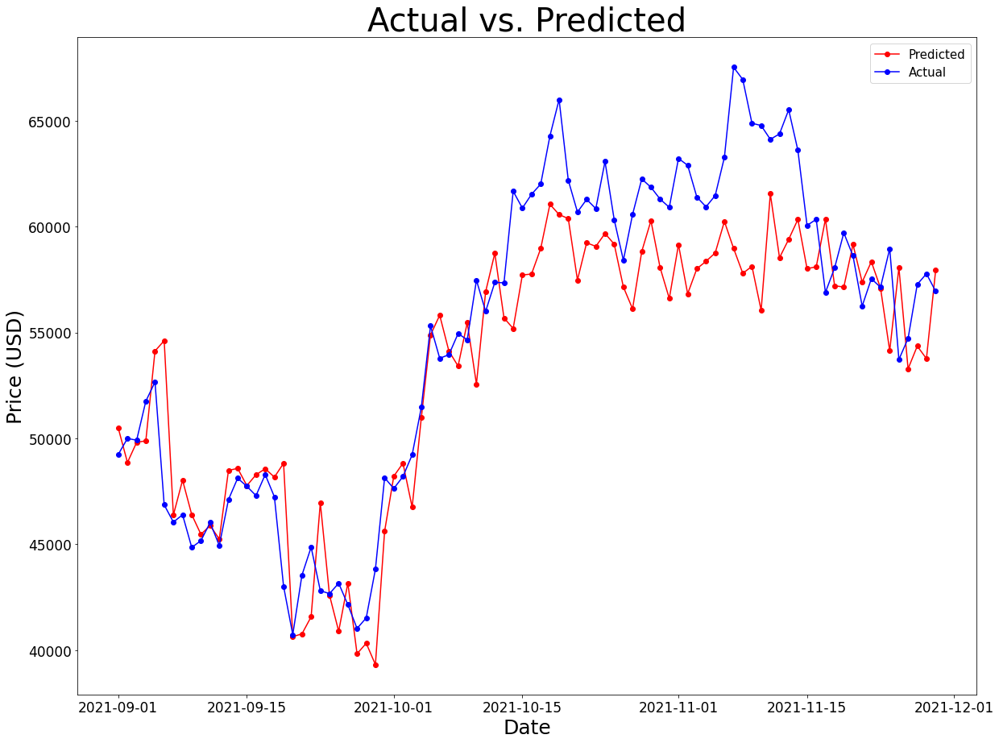

In [131]:
print(f'The best parameters returned from the grid search are: {grid_search1.best_params_}')
y_pred3 = grid_search1.predict(X_test2)


ypred3 = list(y_pred3)

y_df3 = pd.DataFrame({'y_true': y_true, 'y_pred': ypred3}, index=X_test.index)




fig, ax = plt.subplots(figsize=(20,15))



ax.plot(y_df3.index, y_df3.y_pred, color='red', label='Predicted', marker='o')
ax.plot(y_df3.index, y_df3.y_true, color='blue', label='Actual', marker='o')
ax.legend(loc='best', fontsize=15)
ax.set_title('Actual vs. Predicted', fontsize=40)
ax.set_ylabel('Price (USD)', fontsize=25)
ax.set_xlabel('Date', fontsize=25)
ax.tick_params(axis='both', which='major', labelsize=17)

fig.show()

In [129]:
y_df['predDirection3'] = 0

for i in y_df.index:
    y_df['predDirection3'][i] = 1 if y_df3['y_pred'][i] > X_test.Close[i] else 0

<ipython-input-129-094898b85038>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y_df['predDirection3'][i] = 1 if y_df3['y_pred'][i] > X_test.Close[i] else 0


The accuracy score of the model is: 0.4888888888888889
The recall score of the model is: 0.30434782608695654
The Matthews Correlation Coefficient of the model is: -0.01493749994998605.
The roc auc score of the model is: 0.4930830039525692.


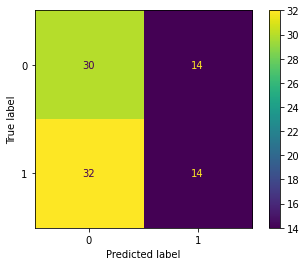

In [130]:
eval_model(y_df.priceDirection, y_df.predDirection3)

In [132]:
# we will now try to further optimize our model by tuning the xgboost regressor in the grid search parameters
# we now also have more columns, so will expand search parameters for kbest and pca accordingly


params2 = {'feature_reduction__pca__n_components': [6,7,8,9,10,11,12],
          'feature_reduction__kbest__k': [6,7,8,9,10,11,12],
          'predictor__eta': [0.1, 0.2, 0.3],
           'predictor__lambda': [1,1.5,2],
           'predictor__alpha': [0.1, 0.5, 1]
            }

grid_search3 = GridSearchCV(pipeline2, params2, verbose=3, scoring='neg_mean_absolute_error')

In [133]:
grid_search3.fit(X_train2, y_train)

Fitting 5 folds for each of 1323 candidates, totalling 6615 fits
[CV 1/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=6, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=6, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1; total time=   0.1s
[CV 3/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=6, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=6, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1; total time=   0.1s
[CV 5/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=6, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=6, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=6, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=6, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.1s
[CV 4/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=6, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=6, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.1s
[CV 1/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=6, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=2; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=6, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=2; total time=   0.1s
[CV 3/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=6, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=2; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=6, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=2; total time=   0.1s
[CV 5/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=6, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=2; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=6, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=6, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=6, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=6, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=6, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=6, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=6, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=6, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=6, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=6, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=6, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=6, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=2; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=6, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=6, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=2; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=6, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=2; total time=   0.1s
[CV 1/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=6, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=6, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1; total time=   0.1s
[CV 3/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=6, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=6, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1; total time=   0.1s
[CV 5/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=6, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=6, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.1s
[CV 2/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=6, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=6, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.1s
[CV 4/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=6, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=6, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.1s
[CV 1/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=6, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=2; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=6, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=2; total time=   0.1s
[CV 3/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=6, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=2; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=6, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=2; total time=   0.1s
[CV 5/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=6, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=2; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=6, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1; total time=   0.1s
[CV 2/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=6, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=6, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1; total time=   0.1s
[CV 4/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=6, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=6, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=6, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=6, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=6, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=6, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=6, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=6, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=2; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=6, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=6, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=2; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=6, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=6, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=6, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=6, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=6, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=6, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=6, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1; total time=   0.1s
[CV 1/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=6, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=6, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.1s
[CV 3/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=6, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=6, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.1s
[CV 5/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=6, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=6, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=2; total time=   0.1s
[CV 2/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=6, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=2; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=6, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=2; total time=   0.1s
[CV 4/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=6, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=2; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=6, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=2; total time=   0.1s
[CV 1/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=6, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=6, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1; total time=   0.1s
[CV 3/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=6, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=6, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1; total time=   0.1s
[CV 5/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=6, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=6, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.1s
[CV 2/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=6, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=6, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.1s
[CV 4/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=6, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=6, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.1s
[CV 1/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=6, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=6, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=6, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=2; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=6, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=6, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=2; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.1s
[CV 5/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=2; total time=   0.1s
[CV 2/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=2; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=2; total time=   0.1s
[CV 4/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=2; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=2; total time=   0.1s
[CV 1/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1; total time=   0.1s
[CV 3/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1; total time=   0.1s
[CV 5/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.1s
[CV 4/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.1s
[CV 1/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=2; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=2; total time=   0.1s
[CV 3/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=2; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=2; total time=   0.1s
[CV 5/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=2; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1; total time=   0.1s
[CV 2/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1; total time=   0.1s
[CV 4/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=2; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=2; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=2; total time=   0.1s
[CV 1/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1; total time=   0.1s
[CV 3/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1; total time=   0.1s
[CV 5/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.1s
[CV 2/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.1s
[CV 4/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.1s
[CV 1/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=2; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=2; total time=   0.1s
[CV 3/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=2; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=2; total time=   0.1s
[CV 5/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=2; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1; total time=   0.1s
[CV 2/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1; total time=   0.1s
[CV 4/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1; total time=   0.1s
[CV 1/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=2; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.1s
[CV 2/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.1s
[CV 4/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.1s
[CV 1/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=2; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=2; total time=   0.1s
[CV 3/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=2; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=2; total time=   0.1s
[CV 5/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=2; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=7, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1; total time=   0.1s
[CV 2/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=7, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=7, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1; total time=   0.1s
[CV 4/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=7, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=7, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1; total time=   0.1s
[CV 1/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=7, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=7, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.1s
[CV 3/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=7, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=7, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.1s
[CV 5/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=7, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=7, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=2; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=7, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=7, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=7, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=7, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=2; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=7, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=7, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=7, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=7, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=7, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=7, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=7, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=7, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=7, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=7, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=7, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=2; total time=   0.1s
[CV 2/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=7, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=2; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=7, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=2; total time=   0.1s
[CV 4/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=7, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=2; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=7, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=2; total time=   0.1s
[CV 1/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=7, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=7, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1; total time=   0.1s
[CV 3/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=7, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=7, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1; total time=   0.1s
[CV 5/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=7, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=7, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.1s
[CV 2/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=7, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=7, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.1s
[CV 4/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=7, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=7, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=7, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=2; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=7, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=2; total time=   0.1s
[CV 3/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=7, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=2; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=7, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=2; total time=   0.1s
[CV 5/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=7, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=2; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=7, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=7, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=7, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=7, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=7, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=7, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=7, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=7, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=7, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=7, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=7, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=7, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=7, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=7, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=2; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=7, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=2; total time=   0.1s
[CV 1/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=7, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=7, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=7, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=7, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1; total time=   0.1s
[CV 5/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=7, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=7, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=7, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=7, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.1s
[CV 4/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=7, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=7, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=7, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=2; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=7, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=7, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=2; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=7, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=7, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=2; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=7, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1; total time=   0.1s
[CV 2/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=7, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=7, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=7, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=7, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=7, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=7, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=7, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=7, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=7, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=7, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=7, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=2; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=7, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=7, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=2; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=7, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1; total time=   0.1s
[CV 3/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1; total time=   0.1s
[CV 5/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=2; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=2; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=2; total time=   0.1s
[CV 5/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=2; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1; total time=   0.1s
[CV 2/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1; total time=   0.1s
[CV 4/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1; total time=   0.1s
[CV 1/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=2; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.1s
[CV 4/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=2; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=2; total time=   0.1s
[CV 3/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=2; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=2; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.1s
[CV 5/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=2; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=2; total time=   0.1s
[CV 3/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=2; total time=   0.1s
[CV 5/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=2; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1; total time=   0.1s
[CV 2/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=8, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=8, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=8, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=8, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=8, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=8, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=8, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=8, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=8, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=8, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=8, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=2; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=8, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=8, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=8, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=8, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=8, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=8, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=8, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=8, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=8, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=8, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=8, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=8, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=8, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=8, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=8, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=8, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=8, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=8, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=8, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=8, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=8, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=8, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=8, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=8, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=8, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=8, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=8, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=8, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=8, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=8, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=8, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=8, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=2; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=8, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=8, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=9, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=9, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=9, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=9, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=9, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=9, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=9, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=9, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=9, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=9, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=9, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=9, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=9, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=9, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=9, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=9, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=9, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=9, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=9, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=9, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=9, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=9, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=9, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=9, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=9, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=9, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=9, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=9, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=9, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=9, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=9, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=9, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=9, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=9, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=9, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=9, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=9, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=9, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=9, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=9, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=9, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=9, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=9, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=9, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=9, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=9, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=9, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=9, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=9, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=9, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=9, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=9, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=9, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=9, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=9, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=9, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=9, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=9, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=9, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=9, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=9, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=9, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=9, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=9, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=9, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=9, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=9, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=9, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=9, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=9, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=9, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=9, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=9, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=9, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=9, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=9, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=9, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=9, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=9, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=9, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=9, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=9, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=9, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=9, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=9, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=9, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=9, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=9, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=9, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=9, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=10, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=10, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=10, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=10, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=10, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=10, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=10, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=10, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=10, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=10, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=10, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=10, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=10, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=10, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=10, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=10, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=10, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=10, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=10, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=10, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=10, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=10, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=10, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=10, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=10, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=10, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=10, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=10, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=10, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=10, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=10, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=10, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=10, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=10, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=10, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=10, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=10, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=10, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=10, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=10, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=10, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=10, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=2; total time=   0.3s
[CV 3/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=10, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=10, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=10, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=11, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=11, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=11, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=11, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=11, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=11, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=11, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=11, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=11, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=11, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=11, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=11, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=2; total time=   0.3s
[CV 3/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=11, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=11, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=11, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=11, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=11, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=11, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=11, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=11, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=11, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=11, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.3s
[CV 3/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=11, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=11, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=11, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=11, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=11, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=11, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=11, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=11, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=11, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=11, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=11, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=11, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=11, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=11, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=11, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=11, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=11, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=11, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=11, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=11, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=11, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=11, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=11, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=11, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=11, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=11, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=11, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=11, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=11, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=11, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=11, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=11, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.3s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=11, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=11, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=11, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=11, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=11, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=11, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=11, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=11, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=11, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=11, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=11, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=11, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=11, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=11, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=11, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=11, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=11, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=11, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=11, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=11, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=11, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=11, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=11, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=11, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=11, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=11, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=11, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=11, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=11, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=11, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=11, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=11, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=11, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=11, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=11, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=11, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=12, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=12, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=12, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=12, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=12, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=12, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=12, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=12, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=12, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=12, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=12, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=12, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=12, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=12, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=12, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=12, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=12, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=12, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=12, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=12, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=12, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=12, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=12, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=12, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=12, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=12, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=12, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=12, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=12, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=12, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=12, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=12, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=12, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=12, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=12, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=12, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=12, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=12, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.3s
[CV 4/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=12, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=12, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=12, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=12, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=12, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=12, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=12, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=12, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=12, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=12, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=12, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=12, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=12, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=12, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=12, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=12, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=12, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=12, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=12, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=12, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=12, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=12, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=12, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=12, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=12, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1; total time=   0.3s
[CV 4/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=12, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=12, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=12, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=12, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=12, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=12, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=12, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=12, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=12, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=12, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=12, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=12, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=12, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=12, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=12, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=12, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=12, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=12, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=12, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=12, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=12, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=12, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=12, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=12, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=12, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=12, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=12, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=12, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=12, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=12, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=12, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=12, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=12, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=12, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=12, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=12, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=12, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=12, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=12, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=12, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=12, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=12, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=12, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=12, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=12, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=12, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=12, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=12, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=12, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=12, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=12, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=12, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.3s
[CV 1/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=12, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=12, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=12, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=12, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=12, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=12, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=12, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=12, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=12, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=12, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=12, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=12, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=12, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=12, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=12, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=12, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=12, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=12, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=12, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=12, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=6, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=6, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=6, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=6, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=6, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=6, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=6, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=6, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=6, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=6, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=6, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=6, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=6, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=6, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=6, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=6, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=6, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=6, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=6, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=6, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=6, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=6, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=6, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=6, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=6, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=6, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=6, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=6, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=6, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=6, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=6, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=6, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=6, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=6, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=6, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=6, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=6, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=6, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=6, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=6, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=6, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=6, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=6, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=6, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=6, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=6, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=6, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=6, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=6, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=6, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=6, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=6, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=6, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=6, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=6, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=6, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=6, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=6, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=6, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=6, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=6, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=6, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=6, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=6, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=6, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=6, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=6, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=6, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=6, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=6, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=6, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=6, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=6, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=6, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=6, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=6, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=6, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=6, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=6, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=6, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=6, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=6, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=6, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=6, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=6, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=6, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=6, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=6, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=6, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=6, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1; total time=   0.3s
[CV 1/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.1s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=7, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=7, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=7, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=7, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=7, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=7, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=7, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=7, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=7, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=7, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=7, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=7, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=7, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=7, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=7, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=7, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=7, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=7, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=7, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=7, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=7, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=7, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=7, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=7, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=7, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=7, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=7, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=7, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=7, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=7, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=7, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=7, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=7, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=7, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=7, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=7, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=7, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=7, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=7, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=7, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=7, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=7, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=7, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=7, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=7, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=7, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=7, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=7, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=7, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=7, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=7, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=7, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=7, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=7, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=7, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=7, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=7, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=7, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=7, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=7, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=7, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=7, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=7, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=7, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=7, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=7, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=7, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=7, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=7, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=7, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=7, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=7, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=7, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=7, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=7, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=7, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=7, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=7, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=7, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=7, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=7, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=7, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.3s
[CV 3/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=7, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=7, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=7, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=7, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=7, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=7, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=7, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=7, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=8, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=8, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=8, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=8, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=8, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=8, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=8, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=8, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=8, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=8, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=8, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=8, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=8, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=2; total time=   0.3s
[CV 4/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=8, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=8, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=8, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=8, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=8, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=8, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=8, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=8, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=8, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=8, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=8, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=8, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=8, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=8, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=8, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=8, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=8, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=8, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=8, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=8, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=8, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=8, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=8, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=8, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=8, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=8, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=8, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=8, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=8, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=8, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=8, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=8, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=9, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=9, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=9, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=9, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=9, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=9, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=9, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=9, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=9, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=9, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=9, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=9, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=9, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=9, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=9, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=9, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=9, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=9, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=9, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=9, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=9, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=9, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=9, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=9, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=9, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=9, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=9, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=9, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=9, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=9, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=9, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=9, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=9, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=9, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=9, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=9, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=9, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=9, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=9, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=9, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=9, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=9, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=9, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=9, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=9, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=9, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=9, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=9, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=9, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=9, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=9, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=9, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=9, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=9, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=9, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=9, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=9, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=9, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=9, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=2; total time=   0.3s
[CV 5/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=9, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=9, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=9, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=9, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=9, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=9, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=9, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=9, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=9, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=9, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=9, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=9, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=9, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=9, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=9, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=9, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=9, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=9, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=9, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=9, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=9, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=9, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=9, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=9, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=9, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=9, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=9, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=9, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=9, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=9, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=9, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=2; total time=   0.3s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=10, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=10, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=10, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=10, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=10, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=10, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=10, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=10, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=10, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=10, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=10, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=10, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=10, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=10, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=10, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=10, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=10, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=10, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=10, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=10, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=10, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=10, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=10, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=10, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=10, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=10, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=10, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=10, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=10, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=10, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=10, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=10, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=10, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=10, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=10, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=10, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=10, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=10, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=10, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=10, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=10, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=10, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=10, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=10, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=10, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=11, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=11, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=11, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=11, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=11, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=11, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=11, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=11, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=11, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=11, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=11, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=11, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=11, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=11, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=11, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=11, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=11, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=11, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=11, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=11, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=11, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=11, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=11, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=11, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=11, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=11, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=11, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=11, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=11, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=11, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=11, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=11, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=11, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=11, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=11, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=11, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=11, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=11, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=11, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=11, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=11, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=11, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=11, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=11, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=11, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=11, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=11, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=11, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=11, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=11, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=11, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=11, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=11, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=11, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=11, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=11, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=11, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=11, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=11, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=11, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=11, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=11, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=11, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=11, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=11, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=11, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=11, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=11, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=11, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=11, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=11, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=11, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=11, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=11, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=11, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=11, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=11, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=11, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=11, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=11, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=11, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=11, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=11, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=11, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=11, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=11, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=11, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=11, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=11, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=11, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=12, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=12, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=12, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=12, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=12, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1; total time=   0.3s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=12, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=12, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=12, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=12, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=12, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=12, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=12, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=12, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=12, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=12, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=12, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=12, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=12, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=12, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=12, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=12, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=12, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=12, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=12, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=12, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=12, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=12, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=12, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=2; total time=   0.3s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=12, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=12, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=12, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=12, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=12, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=12, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=12, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=12, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=12, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=12, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=12, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=12, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=12, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=12, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=12, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=12, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=12, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=12, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=12, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=12, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=12, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=12, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=12, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.3s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=12, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=12, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=12, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=12, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=12, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=12, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=12, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=12, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=12, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=12, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=12, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1; total time=   0.3s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=12, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=12, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1; total time=   0.3s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=12, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1; total time=   0.3s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=12, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.3s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=12, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=12, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.3s
[CV 4/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=12, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=12, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=12, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=12, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=12, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=12, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=12, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=12, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=12, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=12, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=12, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=12, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=12, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=12, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=12, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=12, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=12, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=12, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=12, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=12, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=12, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=12, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=12, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=12, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=12, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=12, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=12, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=12, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=12, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=12, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=12, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=12, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=12, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=12, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=12, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=12, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=12, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=12, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=12, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=12, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=12, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=12, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=12, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=12, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=12, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=12, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=12, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=12, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=12, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=12, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=12, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=12, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=12, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=12, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=12, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1; total time=   0.3s
[CV 4/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=12, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=12, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=12, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=12, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=12, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=12, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=12, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=12, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=12, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=12, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=12, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=12, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=6, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=6, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=6, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=6, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=6, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=6, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=6, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=6, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=6, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=6, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=6, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=6, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=6, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=6, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=6, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=6, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=6, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=6, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=6, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=6, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=6, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=6, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=6, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=6, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=6, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=6, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=6, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=6, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=6, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=6, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=6, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=6, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=6, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=6, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=6, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=6, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=6, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=6, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=6, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=6, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=6, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=6, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=6, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=6, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=6, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=6, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=6, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=6, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=6, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=6, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=6, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=6, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=6, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=6, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=6, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=6, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=6, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=6, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=6, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=6, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=6, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=6, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=6, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=6, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=6, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=6, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=6, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=6, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=6, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=6, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=6, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=6, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=6, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=6, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=6, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=6, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=6, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=6, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=6, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=6, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=6, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=6, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=6, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=6, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=6, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=6, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=6, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=6, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=6, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=6, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=7, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=7, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=7, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=7, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=7, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=7, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=7, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=7, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=7, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=7, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=7, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=7, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=7, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=7, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=7, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=7, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=7, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=7, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=7, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=7, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=7, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=7, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=7, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=7, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=7, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=7, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=7, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=7, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=7, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=7, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=7, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=7, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=7, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=7, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=7, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=7, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=7, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=7, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=7, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=7, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=7, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=7, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=7, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=7, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=7, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=7, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=7, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=7, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=7, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=7, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=7, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=7, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=7, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=7, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=7, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=7, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=7, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=7, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=7, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=7, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=7, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=7, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=7, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=7, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=7, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=7, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=7, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=7, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=7, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=7, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=7, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=7, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=7, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=7, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=7, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=7, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=7, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=7, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=7, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=7, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=7, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=7, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=7, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=7, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=7, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=7, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=7, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=7, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=7, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=7, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=8, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=8, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=8, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=8, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=8, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=8, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=8, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=8, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=8, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=8, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=8, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=8, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=8, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=8, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=8, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=8, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=8, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=8, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=8, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=8, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=8, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=8, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=8, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=8, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=8, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=8, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=8, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=8, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=8, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=8, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=8, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=8, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=8, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=8, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=8, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=8, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=8, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=8, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=8, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=8, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=8, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=8, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=8, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=8, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=8, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=9, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=9, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=9, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=9, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=9, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=9, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=9, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=9, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=9, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=9, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=9, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=9, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=9, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=2; total time=   0.3s
[CV 4/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=9, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=9, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=9, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=9, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=9, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=9, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=9, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=9, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=9, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=9, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=9, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=9, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=9, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=9, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=9, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=9, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=9, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=9, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=9, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=9, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=9, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=9, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=9, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=9, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=9, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=9, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=9, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=9, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=9, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=9, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=9, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=9, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1; total time=   0.3s
[CV 5/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=2; total time=   0.3s
[CV 5/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=9, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=9, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=9, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=9, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=9, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=9, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=9, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=9, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=9, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=9, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=9, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=9, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=9, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=9, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=9, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=9, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=9, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=9, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=9, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=9, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=9, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=9, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=9, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=9, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=9, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=9, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=9, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=9, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=9, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=9, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=9, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=9, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=9, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=9, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=9, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=9, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=9, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=9, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=9, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=9, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=9, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=9, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=9, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=9, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=9, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1; total time=   0.3s
[CV 1/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1; total time=   0.3s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1; total time=   0.3s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1; total time=   0.3s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1; total time=   0.3s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.3s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.3s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.3s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=2; total time=   0.3s
[CV 3/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=10, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=10, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=10, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=10, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=10, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=10, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=10, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=10, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=10, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=10, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=10, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=10, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=10, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=10, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=10, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=10, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=10, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=10, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=10, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=10, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=10, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=10, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=10, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=10, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=10, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=10, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=10, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=10, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=10, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=10, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=10, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=10, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=10, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=10, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=10, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=10, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=10, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=10, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=10, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=10, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=10, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=10, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=10, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=10, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=10, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=11, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=11, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=11, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=11, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=11, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=11, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=11, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=11, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=11, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=11, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=11, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=11, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=11, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=11, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=11, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=11, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=11, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=11, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=11, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=11, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=11, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=11, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=11, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=11, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=11, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=11, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=11, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=11, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=11, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=11, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=11, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=11, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=11, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=11, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=11, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=11, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=11, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=11, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=11, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=11, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=11, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=11, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=11, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=11, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=11, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=11, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=11, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=11, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=11, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=11, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=11, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=11, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=11, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=11, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=11, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=11, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=11, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=11, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=11, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=11, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=11, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=11, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=11, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=11, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=11, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=11, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=11, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.3s
[CV 3/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=11, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=11, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=11, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=11, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=11, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=11, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=11, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=11, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=11, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=11, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=11, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=11, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=11, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=11, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=11, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=11, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=11, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=11, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=11, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=11, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=11, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=11, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=11, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s

/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)



[CV 4/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=12, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=12, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=12, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=12, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=12, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=12, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=12, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.3s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=12, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=12, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=12, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=12, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=12, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=12, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=12, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=12, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=12, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=12, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=12, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=12, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=12, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=12, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=12, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=12, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=12, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=12, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=12, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=12, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=12, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=12, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=12, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=12, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=12, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=12, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=12, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=12, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=12, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=12, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=12, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=12, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=12, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=12, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=12, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=12, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=12, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=12, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=12, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=12, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=12, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=12, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=12, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=12, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=12, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=12, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=12, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=12, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=12, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=12, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=12, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=12, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=12, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=12, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=12, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=12, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=12, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=12, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=12, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=12, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=12, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=12, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=12, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=12, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=12, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=12, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=12, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=12, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=12, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=12, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=12, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=12, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=12, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=12, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=12, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=12, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=12, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=12, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=12, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=12, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=12, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=12, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=12, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=12, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=12, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=12, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=12, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=12, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1; total time=   0.3s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=12, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=12, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=12, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=12, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=12, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=12, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=12, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=12, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=12, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=2; total time=   0.3s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=12, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=12, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=12, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=12, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=12, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=12, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=12, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=12, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=12, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=12, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=12, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=12, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=12, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=12, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=12, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=12, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=12, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=12, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=12, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=12, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=12, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=12, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=12, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=12, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=12, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=12, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=12, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=12, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=12, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=12, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=12, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=6, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=6, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=6, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=6, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=6, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=6, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=6, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=6, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=6, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=6, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=6, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=6, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=6, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=6, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=6, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=6, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=6, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=6, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=6, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=6, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=6, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=6, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=6, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=6, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=6, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=6, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=6, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=6, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=6, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=6, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=6, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=6, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=6, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=6, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=6, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=6, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=6, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=6, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=6, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=6, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=6, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=6, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=6, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=6, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=6, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=2; total time=   0.3s
[CV 1/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=6, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=6, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=6, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=6, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=6, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=6, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=6, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=6, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=6, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=6, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=6, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=6, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=6, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=6, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=6, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=6, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=6, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=6, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=6, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=6, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=6, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=6, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=6, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=6, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=6, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=6, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=2; total time=   0.3s
[CV 2/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=6, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=6, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=6, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=6, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=6, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=6, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=6, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=6, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=6, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=6, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=6, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=6, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=6, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=6, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=6, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=6, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=6, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=6, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=6, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.3s
[CV 3/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1; total time=   0.3s
[CV 4/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.3s
[CV 1/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=7, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=7, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=7, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=7, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=7, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=7, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=7, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=7, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=7, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=7, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=7, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=7, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=7, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=7, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=7, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=7, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=7, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=7, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=7, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=7, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=7, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.3s
[CV 2/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=7, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=7, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=7, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=7, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=7, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=7, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=7, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=7, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=7, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=7, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=7, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=7, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=7, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1; total time=   0.3s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=7, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=7, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=7, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=7, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=7, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=7, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=7, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=7, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=7, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=7, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=2; total time=   0.3s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=7, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=7, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=7, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=7, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=7, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=7, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=7, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=7, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=7, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=7, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=7, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=7, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=7, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=7, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=7, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=7, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=7, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=7, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=7, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=7, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=7, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=7, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=7, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=7, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=7, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=7, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=7, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=7, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=7, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=7, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=7, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=7, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=7, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=7, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=7, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=7, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=7, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=7, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=7, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=7, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=7, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=7, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=7, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=7, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=7, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=7, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=2; total time=   0.3s
[CV 2/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=2; total time=   0.3s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=8, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=8, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=8, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=8, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=8, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=8, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=8, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=8, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=8, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=8, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=8, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=8, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=8, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=8, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=8, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=8, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1; total time=   0.3s
[CV 2/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=8, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=8, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=8, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=8, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=8, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=8, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=8, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=8, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=8, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=8, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=8, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=8, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=8, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=8, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=8, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=8, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=8, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=8, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=8, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=8, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=8, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=8, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=8, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=8, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=8, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=8, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=8, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=8, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=8, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=9, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=9, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=9, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=9, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=9, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=9, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=9, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=9, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=9, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=9, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=9, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=9, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=9, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=9, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=9, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=9, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=9, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=9, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=9, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=9, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=9, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=9, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=9, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=9, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=9, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=9, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=9, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=2; total time=   0.3s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=9, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=9, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=9, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=9, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=9, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=9, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=9, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=9, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=9, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=9, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=9, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=9, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=9, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=9, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=9, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=9, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=9, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=9, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=2; total time=   0.3s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=9, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=9, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=9, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=9, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=9, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=9, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=9, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=9, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=9, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=9, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=9, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=9, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=9, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=9, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=9, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=9, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=9, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=9, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=9, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=9, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=9, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=9, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=9, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=9, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=9, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=9, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=9, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=9, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=9, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=9, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=9, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=9, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=9, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=9, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=9, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=9, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=9, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=9, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=9, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=9, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=9, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=9, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=9, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=9, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=9, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1; total time=   0.3s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1; total time=   0.4s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1; total time=   0.7s
[CV 4/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1; total time=   0.3s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=2; total time=   0.3s
[CV 1/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.3s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=10, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=10, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=10, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=10, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=10, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=10, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=10, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=10, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=10, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=10, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=10, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=10, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=10, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=10, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=10, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=10, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=10, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=10, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=10, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=10, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=10, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=10, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=10, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=10, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=10, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=10, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=10, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=10, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=10, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=10, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=10, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=10, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=10, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=10, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=10, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=10, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=10, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=10, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=10, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=10, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=10, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=10, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=10, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=10, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=10, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=11, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=11, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=11, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=11, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=11, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=11, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=11, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=11, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=11, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=11, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=11, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=11, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=11, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=11, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=11, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=11, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=11, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=11, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=11, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=11, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=11, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=11, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=11, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=11, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=11, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=11, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=11, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=11, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=11, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=11, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=11, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=11, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=11, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=11, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=11, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=11, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=11, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=11, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=11, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=11, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=11, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=11, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=11, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=11, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=11, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=11, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=11, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=11, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=11, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=11, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=11, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=11, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=11, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=11, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=11, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=11, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=11, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=11, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=11, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=11, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=11, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=11, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=11, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=11, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=11, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=11, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.3s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=11, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=11, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=11, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=11, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=11, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=11, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=11, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=11, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=11, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=11, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=11, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=11, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=11, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=11, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=11, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=11, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=11, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=11, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=11, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=11, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=11, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=11, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=11, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=11, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=2; total time=   0.3s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.5s
[CV 1/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.3s
[CV 4/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1; total time=   0.3s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.3s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.3s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.3s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.3s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.3s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=2; total time=   0.3s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=2; total time=   0.3s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=2; total time=   0.3s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=2; total time=   0.3s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=12, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=12, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=12, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=12, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=12, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=12, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=12, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=12, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=12, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=12, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=12, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=12, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=12, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=12, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=12, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=12, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=12, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=12, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=12, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=12, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=12, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=12, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=12, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.3s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=12, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=12, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=12, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=12, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=12, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=12, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=12, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=12, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=12, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=12, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=12, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=12, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=12, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=12, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=12, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=12, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=12, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=12, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=12, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=12, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=12, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=12, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=12, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=12, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=12, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=12, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=12, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=12, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=12, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=12, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=12, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=12, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=12, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=12, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=12, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=12, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=12, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=12, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=12, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=12, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=12, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=12, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=12, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=12, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=12, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=12, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=12, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=12, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=12, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=12, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=12, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=12, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=12, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=12, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=12, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=12, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=12, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=12, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=12, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=12, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=12, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=12, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=12, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=12, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=12, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=12, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=12, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=12, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=12, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=12, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=12, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=12, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=12, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=12, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=12, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=12, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=12, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=12, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=12, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=12, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=12, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=12, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=12, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=12, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=12, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=12, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=12, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=12, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=12, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=12, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=12, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=12, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=12, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=12, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=12, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=12, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=12, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=12, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=12, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=12, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=12, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=12, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=12, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=12, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=12, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=12, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=12, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=12, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=12, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=12, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=12, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=12, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=6, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=6, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=6, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=6, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=6, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=6, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=6, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=6, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=6, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=6, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=6, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=6, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=6, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=6, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=6, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=6, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=6, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=6, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=6, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=6, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=6, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=6, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=6, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=6, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=6, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=6, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=6, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=6, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=6, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=6, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=6, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=6, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=6, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=6, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=6, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=6, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=6, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=6, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=6, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=6, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=6, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=6, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=6, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=6, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=6, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=6, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=6, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=6, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=6, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=6, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=6, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=6, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=6, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=6, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=6, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=6, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=6, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=6, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=6, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=6, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=6, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=6, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=6, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=6, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=6, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=6, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=6, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=6, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=6, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=6, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=6, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=6, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=6, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=6, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=6, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=6, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=6, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=6, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=6, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=6, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=6, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=6, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=6, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=6, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=6, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=6, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=6, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=6, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=6, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=6, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.3s
[CV 4/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=7, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=7, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=7, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=7, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=7, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=7, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=7, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=7, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=7, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=7, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=7, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=7, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=7, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=7, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=7, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=7, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=7, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=7, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=7, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=7, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=7, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=7, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=7, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=7, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=7, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=7, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=7, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=7, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=7, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=7, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=7, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=7, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=7, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=7, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=7, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=7, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=7, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=7, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=7, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=7, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=7, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=7, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=7, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=7, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=7, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=7, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=7, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=7, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=7, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=7, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=7, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=7, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=7, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=7, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=7, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=7, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=7, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=7, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=7, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=7, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=7, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=7, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=7, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=7, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=7, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=7, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=7, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=7, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=7, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=7, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=7, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=7, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=7, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=7, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=7, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=7, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=7, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=7, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=7, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=7, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=7, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=7, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=7, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=7, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=7, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=7, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=7, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=7, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=7, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=7, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1; total time=   0.3s
[CV 1/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=2; total time=   0.3s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1; total time=   0.3s
[CV 2/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=2; total time=   0.3s
[CV 2/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=8, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=8, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=8, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=8, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=8, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=8, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=8, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=8, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=8, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=8, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=8, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=8, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=8, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=8, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=8, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=8, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=8, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=8, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=8, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=8, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=8, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=8, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=8, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=8, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=8, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=8, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=8, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=8, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=2; total time=   0.3s
[CV 4/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=8, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=8, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=8, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=8, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=8, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=8, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=8, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=8, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=8, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=8, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=8, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=8, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=8, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=8, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=8, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=8, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=8, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=9, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=9, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=9, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=9, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=9, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=9, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=9, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=9, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=9, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=9, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=9, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=9, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=9, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=9, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=9, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=9, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=9, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=9, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=9, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=9, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=9, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=9, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=9, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=9, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=9, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=9, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=9, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=9, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=9, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=9, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=9, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=9, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1; total time=   0.3s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=9, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=9, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=9, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=9, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=9, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=9, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=9, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=9, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=9, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=9, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=9, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=9, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=2; total time=   0.3s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=9, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=2; total time=   0.3s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1; total time=   0.3s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1; total time=   0.3s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1; total time=   0.3s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1; total time=   0.3s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1; total time=   0.3s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.3s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.3s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.3s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.3s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.3s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1; total time=   0.3s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=9, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=9, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=9, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=9, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=9, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=9, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=9, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=9, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=9, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=9, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=9, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=2; total time=   0.3s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=9, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=9, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=9, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=9, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=9, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=9, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=9, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=9, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=9, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=9, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=9, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=9, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=9, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=9, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=9, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=9, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=9, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=9, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=9, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=9, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=9, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=9, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=9, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=9, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=9, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=9, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=9, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=9, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=9, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=9, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=9, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=9, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=9, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=9, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=2; total time=   0.3s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.3s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.5s
[CV 5/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.3s
[CV 2/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=10, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=10, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=10, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=10, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=10, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=10, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=10, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=10, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=10, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=10, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=10, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=10, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=10, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=2; total time=   0.3s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=10, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=2; total time=   0.3s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=10, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=2; total time=   0.3s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=10, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=10, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1; total time=   0.3s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=10, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1; total time=   0.3s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=10, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1; total time=   0.3s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=10, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1; total time=   0.3s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=10, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.3s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=10, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.3s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=10, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.3s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=10, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.3s
[CV 5/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=10, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=10, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=10, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=10, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=10, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=10, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=10, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=10, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=10, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=10, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=10, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=10, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.3s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=10, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.3s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=10, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.3s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=10, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.3s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=10, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.3s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=10, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=2; total time=   0.3s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=10, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=2; total time=   0.3s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=10, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=2; total time=   0.3s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=10, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=2; total time=   0.3s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=10, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=2; total time=   0.3s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=11, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=11, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=11, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1; total time=   0.3s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=11, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=11, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1; total time=   0.3s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=11, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=11, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=11, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.3s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=11, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=11, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.3s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=11, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=2; total time=   0.3s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=11, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=2; total time=   0.3s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=11, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=2; total time=   0.3s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=11, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=2; total time=   0.3s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=11, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=2; total time=   0.3s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=11, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1; total time=   0.3s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=11, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1; total time=   0.3s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=11, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1; total time=   0.3s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=11, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=11, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=11, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=11, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=11, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=11, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=11, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=11, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=11, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=11, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=11, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=11, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=11, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=11, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=11, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=11, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=11, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1; total time=   0.3s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=11, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=11, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=11, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=11, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=11, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=11, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=11, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=11, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=11, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=11, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=11, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=11, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=11, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=11, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=11, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=11, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=11, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=11, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=11, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=11, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=11, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=11, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=11, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=11, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=11, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=11, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=11, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=11, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=11, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=11, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=11, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=11, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=11, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=11, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=11, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=11, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=11, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=11, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=11, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=11, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=11, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=11, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=11, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=11, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=11, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=11, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=11, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=11, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=11, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=11, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=11, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=11, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=11, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=11, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=11, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=12, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=12, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=12, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=12, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=12, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1; total time=   0.3s
[CV 1/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=12, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=12, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=12, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=12, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=12, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=12, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=12, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=12, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=12, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=12, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=12, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=12, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=12, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=12, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1; total time=   0.3s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=12, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=12, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=12, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=12, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=12, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=12, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=12, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=12, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=12, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=12, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=12, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=12, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=12, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=12, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=12, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=12, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=12, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=12, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=12, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=12, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=12, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=12, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=12, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=12, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=12, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=12, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=12, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=12, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=12, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=12, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=12, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=12, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=12, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=12, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=12, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=12, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=12, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=12, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=12, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=12, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=12, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=12, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=12, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=12, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=12, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=12, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=12, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=12, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=12, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=12, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=12, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=12, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=12, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=12, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=12, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=12, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=12, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=12, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=12, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=12, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=12, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=12, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=12, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=12, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=12, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=12, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=12, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=12, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=12, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=12, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=12, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=2; total time=   0.3s
[CV 1/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=12, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=12, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=12, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=12, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=12, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=12, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=12, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=12, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=12, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=12, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=12, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=12, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=12, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=12, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=12, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=12, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=12, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=12, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=12, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=12, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=12, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=12, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=12, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.3s
[CV 4/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=12, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=12, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=12, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=12, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=12, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=12, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=12, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=12, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=12, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=12, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=12, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=12, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=12, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=12, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=12, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=12, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=12, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=12, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=12, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=12, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=12, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=12, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=6, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=6, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=6, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=6, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=6, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=6, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=6, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=6, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=6, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=6, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=6, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=6, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=6, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=6, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=6, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=6, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=6, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=6, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=6, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=6, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=6, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=6, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=6, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=6, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=6, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=6, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=6, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=6, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=6, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=6, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=6, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=6, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=6, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=6, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=6, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=6, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=6, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=6, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=6, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=6, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=6, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=6, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=6, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=6, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=6, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=6, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=6, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=6, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=6, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=6, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=6, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=6, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=6, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=6, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=6, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=6, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=6, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=6, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=6, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=6, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=6, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=6, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=6, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=6, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1; total time=   0.3s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=6, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1; total time=   0.3s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=6, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=6, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=6, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.3s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=6, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=6, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.3s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=6, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=6, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=6, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=2; total time=   0.3s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=6, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=2; total time=   0.3s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=6, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=2; total time=   0.3s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=6, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1; total time=   0.3s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=6, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=6, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=6, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=6, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=6, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=6, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=6, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=6, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=6, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=6, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=6, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=6, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=6, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=6, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.3s
[CV 4/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=7, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=7, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=7, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=7, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=7, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=7, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=7, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=7, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=7, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=7, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=7, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=7, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=7, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=7, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=7, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=7, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=7, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=7, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=7, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=7, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=7, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=7, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=7, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=7, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=7, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=7, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=7, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=7, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=7, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=7, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=7, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=7, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=7, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=7, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=7, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=7, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=7, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=7, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=7, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=7, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=7, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=7, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=2; total time=   0.3s
[CV 3/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=7, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=7, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=7, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=7, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=7, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=7, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=7, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=7, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=7, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=7, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=7, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=7, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=7, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=7, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=7, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=7, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=2; total time=   0.3s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=7, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=2; total time=   0.3s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=7, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=7, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=7, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=7, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=7, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=7, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=7, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.3s
[CV 2/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=7, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=7, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=7, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=7, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=7, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=7, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=7, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=7, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=7, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=7, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=7, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=7, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=7, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=7, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=7, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=7, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=7, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=7, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=7, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=7, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=7, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=7, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=7, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=7, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.3s
[CV 1/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=2; total time=   0.3s
[CV 5/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1; total time=   0.3s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=8, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=8, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=8, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=8, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=8, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=8, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=8, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=8, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.3s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=8, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=8, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=8, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=8, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=8, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=8, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=8, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=8, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=8, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=8, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=8, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=8, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=8, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=8, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=8, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=8, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=8, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=8, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=8, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=8, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=8, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=8, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=8, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=8, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=8, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=8, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=8, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=8, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=8, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=8, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=8, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=8, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=8, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=8, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=8, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=8, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=8, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=9, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=9, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=9, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=9, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=9, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=9, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=9, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=9, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=9, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=9, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=9, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=9, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=9, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=9, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=9, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=9, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=9, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=9, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=9, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=9, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=9, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=9, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=9, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=9, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=9, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=9, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=9, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=9, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=9, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=9, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=9, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=9, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=9, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=9, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=9, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=9, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.3s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=9, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=9, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=9, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=9, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=9, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=9, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=9, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=9, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=9, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=2; total time=   0.3s
[CV 1/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.3s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=9, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=9, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=9, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=9, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=9, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=9, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=9, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=9, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=9, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=9, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=9, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=9, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=9, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=9, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=9, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=9, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=9, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=9, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1; total time=   0.3s
[CV 4/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=9, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=9, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=9, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=9, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=9, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=9, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=9, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=9, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=9, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=9, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=9, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=9, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=9, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=9, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=9, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=9, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=9, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=9, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=9, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=9, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=9, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=9, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=9, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=9, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=9, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=9, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=9, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=2; total time=   0.3s
[CV 1/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=10, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=10, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=10, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1; total time=   0.3s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=10, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1; total time=   0.3s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=10, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1; total time=   0.3s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=10, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=10, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=10, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=10, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=10, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=10, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=10, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=10, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=10, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=2; total time=   0.3s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=10, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=2; total time=   0.3s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=10, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1; total time=   0.3s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=10, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1; total time=   0.3s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=10, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1; total time=   0.3s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=10, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1; total time=   0.3s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=10, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1; total time=   0.3s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=10, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.3s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=10, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.3s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=10, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.3s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=10, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.3s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=10, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.3s
[CV 1/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=10, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=10, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=10, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=10, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=10, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=10, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=10, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=10, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=10, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=10, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=10, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=10, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=10, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=10, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=10, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=10, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=10, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=10, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=10, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=2; total time=   0.3s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=10, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=11, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=11, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1; total time=   0.3s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=11, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=11, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=11, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=11, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=11, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=11, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=11, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=11, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=11, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=11, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=11, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=11, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=11, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=11, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=11, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=11, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=11, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=11, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=11, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=11, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=11, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=11, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=11, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=11, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=11, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=11, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=11, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=11, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=11, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=11, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=11, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=11, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=11, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=11, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=11, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=11, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=11, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=11, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=11, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=11, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=11, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=11, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=11, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=11, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1; total time=   0.3s
[CV 2/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=11, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=11, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=11, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=11, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=11, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=11, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=11, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=11, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=11, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=11, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=11, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=11, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=11, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=11, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=11, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=11, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=11, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=11, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=11, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=11, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=11, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=11, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=11, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=11, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=11, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=11, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=11, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=11, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=11, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=11, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=11, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=11, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=11, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=11, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=11, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=11, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=11, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=11, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=11, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=11, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=11, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=11, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=11, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=11, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.3s
[CV 3/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=12, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=12, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=12, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=12, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=12, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1; total time=   0.3s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=12, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=12, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=12, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=12, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=12, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=12, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=12, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=12, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=12, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=12, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=12, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=12, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=12, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=12, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=12, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=12, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=12, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=12, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=12, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=12, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=12, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=12, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=12, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=12, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=12, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=12, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=12, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=12, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=12, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=12, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=12, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=12, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=12, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=12, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=12, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=12, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=12, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=12, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=12, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=12, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=12, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=12, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=12, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=12, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=12, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=12, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.3s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=12, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=12, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=12, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=12, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=12, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=12, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=12, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=12, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=12, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=12, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=12, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=12, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=12, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=12, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=12, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=12, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=12, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=12, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=12, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=12, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=12, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=12, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=12, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=2; total time=   0.3s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=12, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=12, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=12, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=12, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=12, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=12, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=12, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=12, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=12, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=12, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=12, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=12, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=12, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=12, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=12, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=12, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=12, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=12, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=12, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=12, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=12, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=12, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=12, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=12, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=12, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=12, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=12, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=12, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=12, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=12, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=12, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=12, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=12, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=12, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=12, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=12, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=12, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=12, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=12, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=12, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=12, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=12, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=12, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=12, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=12, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=12, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=2; total time=   0.3s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=12, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=12, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=12, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=12, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=12, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=12, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=12, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=12, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=12, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=12, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=12, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=12, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=12, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=12, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=12, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=6, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=6, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=6, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=6, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=6, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=6, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=6, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=6, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=6, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=6, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=6, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=6, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=6, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=6, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=6, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=6, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=6, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=6, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=6, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=6, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=6, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=6, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=6, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=6, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=6, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=6, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=6, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=6, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=6, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=6, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=6, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=6, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=6, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=6, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=6, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=6, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=6, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=6, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=6, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=6, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=6, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=6, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=6, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=6, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=6, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=6, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=6, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=6, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=6, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=6, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=6, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=6, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=6, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=6, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=6, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=6, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=6, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=6, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=6, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=6, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=6, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=6, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=6, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=6, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=6, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=6, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=6, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=6, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=6, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=6, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=6, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=6, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=6, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=6, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=6, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=6, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=6, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=6, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=6, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=6, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=6, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=6, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=6, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=6, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=6, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=6, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=6, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=6, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=6, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=6, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1; total time=   0.3s
[CV 3/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.3s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.3s
[CV 4/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1; total time=   0.3s
[CV 1/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=7, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=7, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=7, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=7, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=7, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=7, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=7, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=7, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=7, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=7, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=7, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=7, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=7, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=7, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=7, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=7, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=7, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=7, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=7, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=7, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=7, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=7, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=7, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=7, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=7, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=7, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=7, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=7, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=7, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=7, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=7, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=7, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=7, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=7, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=7, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=7, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=7, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=7, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=7, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=7, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=7, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=7, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=7, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=7, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=7, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=7, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=7, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=7, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=7, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=7, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=7, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=7, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=7, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=7, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=7, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=7, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=7, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=7, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=7, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=7, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=7, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=7, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=7, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=7, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=7, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=7, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=7, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=7, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=7, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=7, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=7, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=7, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=7, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=2; total time=   0.3s
[CV 4/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=7, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=7, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=7, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=7, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=7, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=7, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=7, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=7, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=7, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=7, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=7, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=7, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.3s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=7, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=7, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=2; total time=   0.3s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=7, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=2; total time=   0.3s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=7, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=2; total time=   0.3s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=7, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=2; total time=   0.3s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1; total time=   0.3s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1; total time=   0.3s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1; total time=   0.3s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1; total time=   0.3s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1; total time=   0.3s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.3s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.3s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.3s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=2; total time=   0.3s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.3s
[CV 3/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=8, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=8, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=8, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=8, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=8, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=8, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=8, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=8, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=8, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=8, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=8, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=8, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=2; total time=   0.3s
[CV 3/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=8, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=8, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=8, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=8, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=8, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=8, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=8, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=8, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=8, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=8, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=8, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=8, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=8, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=8, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=8, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=8, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=8, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=8, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=8, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=8, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1; total time=   0.3s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=8, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=8, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=8, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=8, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=8, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=8, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=8, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=8, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=8, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=8, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=8, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=8, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=8, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=9, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=9, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=9, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=9, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=9, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=9, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=9, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=9, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=9, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=9, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=9, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=9, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=9, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=9, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=9, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=9, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=9, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=9, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=9, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=9, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=9, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=9, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=9, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=9, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=9, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=9, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=9, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=9, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=9, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=9, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=9, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=9, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=9, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=9, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=9, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1; total time=   0.3s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=9, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=9, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=9, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=9, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=9, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=9, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=9, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=9, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=9, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=9, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1; total time=   0.3s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.3s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=9, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=9, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=9, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=9, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=9, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=9, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=9, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=9, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=9, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=9, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=9, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=9, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=9, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=9, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=9, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=9, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=9, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=9, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=9, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=9, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=9, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=9, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=9, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=9, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=9, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=9, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=9, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=9, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=9, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=9, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=9, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=9, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=9, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=9, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=9, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=9, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=9, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=9, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=9, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=9, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=9, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=9, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=9, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=9, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=9, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=2; total time=   0.3s
[CV 2/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=2; total time=   0.3s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=10, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=10, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=10, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=10, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=10, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=10, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=10, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=10, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=10, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=10, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=10, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=10, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=10, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=10, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=10, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=10, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=10, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=10, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=10, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=10, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=10, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=10, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=10, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=10, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=10, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=10, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=10, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=10, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=10, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=10, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=10, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=10, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=10, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=10, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=10, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=10, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=10, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=10, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=10, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=10, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=10, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=10, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=10, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=10, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=10, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=11, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=11, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=11, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=11, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=11, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=11, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=11, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=11, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=11, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=11, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=11, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=11, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=11, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=11, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=11, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=11, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=11, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=11, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=11, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=11, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=11, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=11, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=11, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.3s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=11, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=11, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=11, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=11, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=11, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=11, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=11, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=11, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=11, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=11, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=11, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=11, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=11, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=11, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=11, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=11, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=11, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=11, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=11, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=11, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=11, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=11, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=11, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1; total time=   0.3s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=11, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=11, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=11, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=11, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=11, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=11, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=11, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=11, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=11, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=11, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=11, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=11, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=11, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=11, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=11, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=11, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=11, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=11, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=11, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=11, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=11, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=11, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=11, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.3s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=11, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=11, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=11, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=11, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=11, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=11, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=2; total time=   0.3s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=11, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=11, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=11, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=11, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=11, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=11, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=11, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=11, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=11, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=11, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=11, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=11, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=11, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=11, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=11, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=12, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=12, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=12, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=12, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=12, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1; total time=   0.3s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=12, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=12, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=12, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=12, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=12, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=12, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=12, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=12, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=12, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=2; total time=   0.3s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=12, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=2; total time=   0.3s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=12, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1; total time=   0.3s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=12, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1; total time=   0.3s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=12, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1; total time=   0.3s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=12, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1; total time=   0.3s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=12, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1; total time=   0.3s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=12, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.3s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=12, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.3s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=12, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.3s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=12, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.3s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=12, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.3s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=12, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=2; total time=   0.3s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=12, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=2; total time=   0.3s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=12, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=12, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=12, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=12, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=12, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=12, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=12, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=12, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=12, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=12, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=12, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=12, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=12, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=12, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=12, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=12, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=12, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=12, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=12, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=12, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=12, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=12, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=12, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=12, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=12, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=12, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=12, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=12, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=12, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=12, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=12, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=12, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=12, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=12, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=12, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=12, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=12, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=12, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1; total time=   0.3s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=12, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=12, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=12, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=12, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=12, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=12, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=2; total time=   0.3s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=12, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=12, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=12, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=12, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=12, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=12, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=12, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=12, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=12, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=12, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=12, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=12, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=12, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=12, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=12, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=12, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=2; total time=   0.3s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=12, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=12, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=12, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=12, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=12, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=12, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=12, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=12, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=12, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=12, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=12, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=12, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=12, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=12, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=12, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=12, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=12, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=12, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=12, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=12, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=12, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=12, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1; total time=   0.3s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=12, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=12, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=12, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=12, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=12, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=12, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=12, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=12, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=12, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=12, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=12, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=12, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=12, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=12, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=12, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=12, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 1/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=12, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=12, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=12, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=12, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=12, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=12, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)
/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 2/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=12, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=2; total time=   0.3s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 3/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=12, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 4/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=12, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


[CV 5/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=12, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in true_divide
  msw = sswn / float(dfwn)


GridSearchCV(estimator=Pipeline(steps=[('scaling', MinMaxScaler()),
                                       ('feature_reduction',
                                        FeatureUnion(transformer_list=[('pca',
                                                                        PCA()),
                                                                       ('kbest',
                                                                        SelectKBest())])),
                                       ('predictor',
                                        XGBRegressor(base_score=0.5,
                                                     booster='gbtree',
                                                     colsample_bylevel=1,
                                                     colsample_bynode=1,
                                                     colsample_bytree=1,
                                                     gamma=0, gpu_id=-1,
                                                     i

The best parameters returned from the grid search are: {'feature_reduction__kbest__k': 12, 'feature_reduction__pca__n_components': 6, 'predictor__alpha': 0.1, 'predictor__eta': 0.1, 'predictor__lambda': 1}


<ipython-input-134-e26dcb9d57d3>:26: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


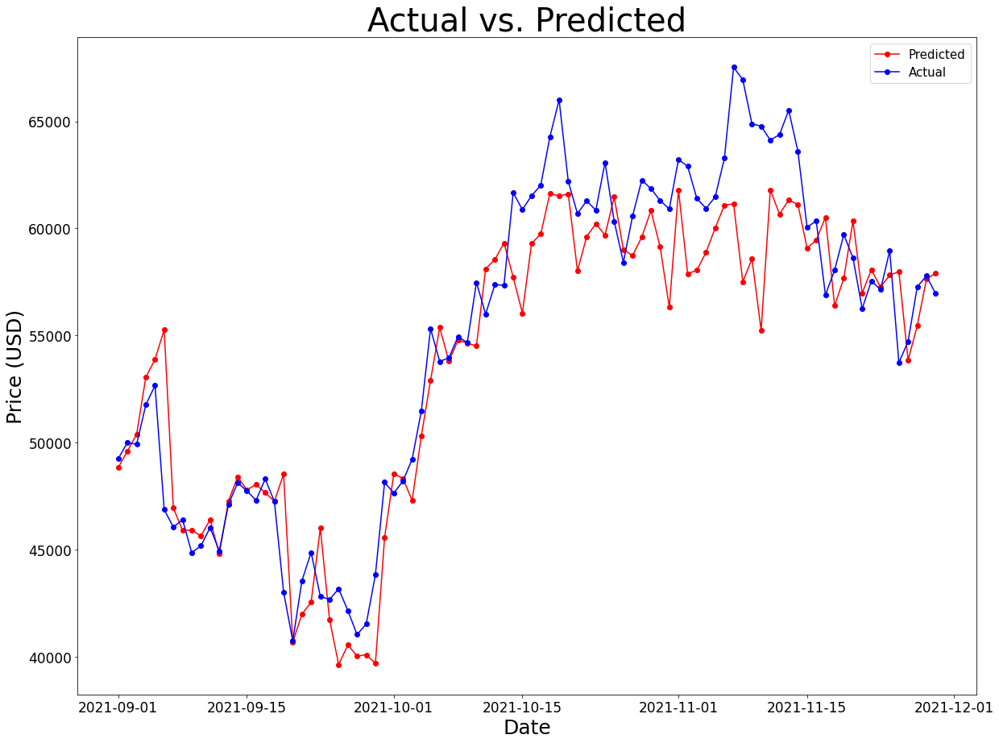

In [134]:
y_pred4 = grid_search3.predict(X_test2)

print(f'The best parameters returned from the grid search are: {grid_search3.best_params_}')





y_df4 = pd.DataFrame({'y_true': y_true, 'y_pred': y_pred4}, index=X_test.index)




fig, ax = plt.subplots(figsize=(20,15))



ax.plot(y_df4.index, y_df4.y_pred, color='red', label='Predicted', marker='o')
ax.plot(y_df4.index, y_df4.y_true, color='blue', label='Actual', marker='o')
ax.legend(loc='best', fontsize=15)
ax.set_title('Actual vs. Predicted', fontsize=40)
ax.set_ylabel('Price (USD)', fontsize=25)
ax.set_xlabel('Date', fontsize=25)
ax.tick_params(axis='both', which='major', labelsize=17)

fig.show()

The accuracy score of the model is: 0.4888888888888889
The recall score of the model is: 0.41304347826086957
The Matthews Correlation Coefficient of the model is: -0.01900136814776173.
The roc auc score of the model is: 0.49061264822134387.


<ipython-input-136-515a841e9777>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y_df['predDirection4'][i] = 1 if y_df4['y_pred'][i] > X_test.Close[i] else 0


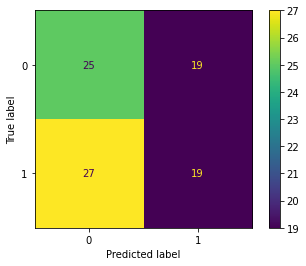

In [136]:
y_df['predDirection4'] = 0

for i in y_df.index:
    y_df['predDirection4'][i] = 1 if y_df4['y_pred'][i] > X_test.Close[i] else 0
    
    
eval_model(y_df.priceDirection, y_df.predDirection4)

Since this API can request more than an appropriate amount per call, we are going to incorporate some simple moving average columns into our data to hopefully boost our metrics. This also means we can incorporate these figures into our final model as we can request the appropraite amount of data from whichto make predictions.

If this does not improve our results, we will attempt to move back to our original classification process as we had moderate success at this rate. We can use our API call to retrieve data and retrieve a prediction probability.

In [137]:
# lets create a function to create our moving averages and incoroprate them into our dataframe

def get_sma(X_df):
    '''
    This function intakes the "X" portion of the data and returns the data with moving average columns applied
    '''
    
    SMAs = [7,30,90]                                                     # 7, 30, and 90 day simple moving averages
    for val in SMAs:
        X_df[str(val)+'sma'] = X_df['Close'].rolling(f'{val}D').mean()   # using the pandas rolling function to calculate mean values over each desired SMA value
        
    return X_df

Success! we will incorporate this function into our future script

In [140]:
X_df = get_sma(X)

In [139]:
# we will define another function to run prior to calcualting our averages

def feat_eng(X_df):
    '''
    Intakes "X" portion of data and outputs selected engineered features
    '''
    
    X_df['High/Low'] = X_df['High'] - X_df['Low']
    X_df['volX'] = X_df['Quote asset volume'] / X_df['Volume']
    X_df['quote-buy'] = X_df['Taker buy quote volume'] / X_df['Taker buy base volume']
    
    return X_df

In [141]:
X_df

,Open,High,Low,Close,Volume,Quote asset volume,Number of trades,Taker buy base volume,Taker buy quote volume,High/Low,volX,quote-buy,7sma,30sma,90sma
Open time,,,,,,,,,,,,,,,
2019-03-08,3873.63,3932.00,3800.00,3864.89,34730.366592,1.350009e+08,211534.0,17947.934228,6.979106e+07,132.00,3887.112785,3888.528778,3864.890000,3864.890000,3864.890000
2019-03-09,3864.88,3971.75,3854.75,3943.04,30979.747653,1.213536e+08,206869.0,16447.346558,6.442954e+07,117.00,3917.191590,3917.321422,3903.965000,3903.965000,3903.965000
2019-03-10,3943.43,3943.43,3881.69,3916.82,23187.561412,9.069395e+07,167920.0,12518.496386,4.896809e+07,61.74,3911.319009,3911.659322,3908.250000,3908.250000,3908.250000
2019-03-11,3915.99,3936.98,3830.00,3871.61,38066.885705,1.477220e+08,209916.0,19416.221014,7.532957e+07,106.98,3880.589871,3879.723769,3899.090000,3899.090000,3899.090000
2019-03-12,3871.61,3905.20,3826.06,3882.73,26921.008622,1.043938e+08,182885.0,13827.421065,5.362452e+07,79.14,3877.783738,3878.128843,3895.818000,3895.818000,3895.818000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-11-25,57138.29,59398.90,57000.00,58960.36,42153.515220,2.455659e+09,1604266.0,21112.803970,1.230023e+09,2398.90,58255.138270,58259.570518,58038.410000,61460.947333,54485.638556
2021-11-26,58960.37,59150.00,53500.00,53726.53,65927.870660,3.649354e+09,2138184.0,31287.469900,1.731975e+09,5650.00,55353.734678,55356.821290,57420.451429,61304.717000,54539.318333
2021-11-27,53723.72,55280.00,53610.00,54721.03,29716.999570,1.623173e+09,1110145.0,14462.938010,7.901915e+08,1670.00,54621.029948,54635.616938,56708.097143,61109.555000,54605.465000


In [148]:
# lets create our training and testing set again, and also, since we now have our complete dataframe, lets also 
# create classification labels so we can also attempt to predict classification without further modifying dataset

X_df['Label'] = 0

for i in range(len(X_df.index)-1):
    X_df['Label'][i] = 1 if X_df.Close[i] < X_df.Close[i+1] else 0
    
    
X_df['Predict'] = 0

for j in range(len(X_df.index)-1):
    X_df['Predict'][j] = X_df.Close[j+1]

<ipython-input-148-00d013d6cf01>:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_df['Label'][i] = 1 if X_df.Close[i] < X_df.Close[i+1] else 0
<ipython-input-148-00d013d6cf01>:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_df['Predict'][j] = X_df.Close[j+1]


In [149]:
X_df

,Open,High,Low,Close,Volume,Quote asset volume,Number of trades,Taker buy base volume,Taker buy quote volume,High/Low,volX,quote-buy,7sma,30sma,90sma,Label,Predict
Open time,,,,,,,,,,,,,,,,,
2019-03-08,3873.63,3932.00,3800.00,3864.89,34730.366592,1.350009e+08,211534.0,17947.934228,6.979106e+07,132.00,3887.112785,3888.528778,3864.890000,3864.890000,3864.890000,1,3943
2019-03-09,3864.88,3971.75,3854.75,3943.04,30979.747653,1.213536e+08,206869.0,16447.346558,6.442954e+07,117.00,3917.191590,3917.321422,3903.965000,3903.965000,3903.965000,0,3916
2019-03-10,3943.43,3943.43,3881.69,3916.82,23187.561412,9.069395e+07,167920.0,12518.496386,4.896809e+07,61.74,3911.319009,3911.659322,3908.250000,3908.250000,3908.250000,0,3871
2019-03-11,3915.99,3936.98,3830.00,3871.61,38066.885705,1.477220e+08,209916.0,19416.221014,7.532957e+07,106.98,3880.589871,3879.723769,3899.090000,3899.090000,3899.090000,1,3882
2019-03-12,3871.61,3905.20,3826.06,3882.73,26921.008622,1.043938e+08,182885.0,13827.421065,5.362452e+07,79.14,3877.783738,3878.128843,3895.818000,3895.818000,3895.818000,0,3866
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-11-25,57138.29,59398.90,57000.00,58960.36,42153.515220,2.455659e+09,1604266.0,21112.803970,1.230023e+09,2398.90,58255.138270,58259.570518,58038.410000,61460.947333,54485.638556,0,53726
2021-11-26,58960.37,59150.00,53500.00,53726.53,65927.870660,3.649354e+09,2138184.0,31287.469900,1.731975e+09,5650.00,55353.734678,55356.821290,57420.451429,61304.717000,54539.318333,1,54721
2021-11-27,53723.72,55280.00,53610.00,54721.03,29716.999570,1.623173e+09,1110145.0,14462.938010,7.901915e+08,1670.00,54621.029948,54635.616938,56708.097143,61109.555000,54605.465000,1,57274


In [150]:
# we will drop the last row as the predicted values do not work

X_df = X_df[:-1]

In [151]:
X_df.tail()

,Open,High,Low,Close,Volume,Quote asset volume,Number of trades,Taker buy base volume,Taker buy quote volume,High/Low,volX,quote-buy,7sma,30sma,90sma,Label,Predict
Open time,,,,,,,,,,,,,,,,,
2021-11-24,57541.26,57735.00,55837.00,57138.29,39612.04964,2.246374e+09,1432991.0,19625.09659,1.113184e+09,1898.00,56709.366588,56722.491559,57742.875714,61506.562333,54375.744556,1,58960
2021-11-25,57138.29,59398.90,57000.00,58960.36,42153.51522,2.455659e+09,1604266.0,21112.80397,1.230023e+09,2398.90,58255.138270,58259.570518,58038.410000,61460.947333,54485.638556,0,53726
2021-11-26,58960.37,59150.00,53500.00,53726.53,65927.87066,3.649354e+09,2138184.0,31287.46990,1.731975e+09,5650.00,55353.734678,55356.821290,57420.451429,61304.717000,54539.318333,1,54721
2021-11-27,53723.72,55280.00,53610.00,54721.03,29716.99957,1.623173e+09,1110145.0,14462.93801,7.901915e+08,1670.00,54621.029948,54635.616938,56708.097143,61109.555000,54605.465000,1,57274
2021-11-28,54716.47,57445.05,53256.64,57274.88,36163.71370,1.982198e+09,1253408.0,18520.69985,1.016073e+09,4188.41,54811.803621,54861.491457,56515.648571,60943.594000,54719.820222,1,57776


In [152]:
# first we will split between train and test, and then between "X" and "y"

train = X_df[:train_size]
test = X_df[train_size:]

X_train, y_train_c, y_train_r = train.drop(['Label', 'Predict'], axis=1), train.Label, train.Predict
X_test, y_test_c, y_test_r = test.drop(['Label', 'Predict'], axis=1), test.Label, test.Predict

In [153]:
# now we will attempt our problem again with our new features, new parameters for grid search will have to be created

reg_model = XGBRegressor()

reg_params = {'feature_reduction__pca__n_components': [6,7,8,9,10,11,12,13,14,15],
              'feature_reduction__kbest__k': [6,7,8,9,10,11,12,13,14,15],
              'predictor__eta': [0.1, 0.2, 0.3],
                'predictor__lambda': [1,1.5,2],
               'predictor__alpha': [0.1, 0.5, 1]
            }

pipeline_reg = Pipeline([
    ('scaling', scaler),
    ('feature_reduction', feature_union),
    ('predictor', reg_model)
])


grid_search_reg = GridSearchCV(pipeline_reg, reg_params, verbose=3, scoring='neg_mean_absolute_error')

In [154]:
grid_search_reg.fit(X_train, y_train_r)

Fitting 5 folds for each of 2700 candidates, totalling 13500 fits
[CV 1/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=6, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=6, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1; total time=   0.1s
[CV 3/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=6, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1; total time=   0.1s
[CV 4/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=6, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1; total time=   0.1s
[CV 5/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=6, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1; total time=   0.1s
[CV 1/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=6, predictor__alpha=0.1

[CV 5/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=6, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=6, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.1s
[CV 2/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=6, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.1s
[CV 3/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=6, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=6, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=6, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1.5; total time=  

[CV 1/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=2; total time=   0.1s
[CV 2/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=2; total time=   0.1s
[CV 3/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=2; total time=   0.1s
[CV 4/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=2; total time=   0.1s
[CV 5/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=2; total time=   0.1s
[CV 1/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 2/5] END fea

[CV 1/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1; total time=   0.1s
[CV 5/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.1s
[C

[CV 1/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=7, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.1s
[CV 2/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=7, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.1s
[CV 3/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=7, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.1s
[CV 4/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=7, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.1s
[CV 5/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=7, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.1s
[CV 1/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=7, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=2; total time=  

[CV 1/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=7, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=7, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=2; total time=   0.1s
[CV 3/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=7, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=7, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=7, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=7, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1; total time=   0.1s
[CV 2/5] END fea

[CV 1/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1; total time=   0.1s
[CV 2/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1; total time=   0.1s
[CV 3/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1; total time=   0.1s
[CV 4/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1; total time=   0.1s
[CV 5/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1; total time=   0.1s
[CV 1/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.1s
[C

[CV 1/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.1s
[CV 2/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.1s
[CV 5/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=2; total time=  

[CV 1/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=8, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=8, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=2; total time=   0.1s
[CV 3/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=8, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=2; total time=   0.1s
[CV 4/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=8, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=2; total time=   0.1s
[CV 5/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=8, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=2; total time=   0.1s
[CV 1/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=9, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1; total time=   0.1s
[CV 2/5] END f

[CV 2/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


[CV 2/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=9, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.1s
[CV 3/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=9, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.1s
[CV 4/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=9, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.1s
[CV 5/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=9, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.1s
[CV 1/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=9, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=2; total time=   0.1s
[CV 2/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=9, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=2; total time=   0.1s
[CV 3/5]

[CV 2/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=2; total time=   0.1s
[CV 4/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=2; total time=   0.1s
[CV 5/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1; total time=   0.1

[CV 1/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1.5; total time=   0

[CV 1/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=10, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=10, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=10, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=10, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.1s
[CV 5/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=10, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=10, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


[CV 1/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=11, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=11, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=11, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=11, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=11, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=11, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2

[CV 5/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=11, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=11, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=11, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=11, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=11, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=11, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1; total time=   0.2

[CV 5/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.3s


[CV 4/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=12, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=12, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=12, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=12, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=12, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=12, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=2; total time=  

[CV 3/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=12, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=12, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=12, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=12, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=12, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=12, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 

[CV 4/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=13, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=13, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=13, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=13, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=13, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=13, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1.5; total tim

[CV 4/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=13, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=13, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=13, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=13, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=13, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=13, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=2; total time=  

[CV 4/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=13, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=13, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=13, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=13, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=13, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=13, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 5/5] E

[CV 5/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=14, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=14, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=14, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=14, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=14, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=14, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1.5; total t

[CV 5/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=14, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=14, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=14, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=14, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=14, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=14, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=2; total time=   0

[CV 5/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=14, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=14, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=14, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=14, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=14, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=14, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s
[CV 1/5] E

[CV 1/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=15, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=15, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=15, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=15, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.3s
[CV 5/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=15, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=15, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=2; total t

[CV 1/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=15, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=15, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=15, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=15, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=2; total time=   0.3s
[CV 5/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=15, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=6, feature_reduction__pca__n_components=15, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s


[CV 1/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=6, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1; total time=   0.1s
[CV 2/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=6, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=6, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=6, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=6, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=6, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[C

[CV 1/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=6, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=6, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.1s
[CV 3/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=6, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=6, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.1s
[CV 5/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=6, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=6, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=2; total time=  

[CV 1/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=2; total time=   0.1s
[CV 3/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=2; total time=   0.1s
[CV 4/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=2; total time=   0.1s
[CV 5/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=2; total time=   0.1s
[CV 1/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 2/5] END fea

[CV 2/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s


[CV 2/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=7, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=7, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=7, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=7, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=7, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=7, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=2; total time=   0

[CV 2/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=7, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=7, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=7, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=7, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=7, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=7, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s
[CV 3/5] END fea

[CV 2/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


[CV 2/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=2; total time=   0

[CV 2/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=8, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=8, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=8, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=8, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=9, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=9, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 3/5] END

[CV 3/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2

[CV 3/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=9, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=9, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=9, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.3s
[CV 1/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=9, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=9, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=9, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 4/5] E

[CV 3/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2

[CV 3/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1.5; total time=

[CV 3/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=10, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=10, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=10, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=10, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=10, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=10, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 

[CV 3/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=11, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=2; total time=   0.3s
[CV 4/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=11, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=2; total time=   0.3s
[CV 5/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=11, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=2; total time=   0.3s
[CV 1/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=11, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1; total time=   0.3s
[CV 2/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=11, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1; total time=   0.4s
[CV 3/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=11, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1; total time=   0.3

[CV 2/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=11, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=11, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=11, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=11, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=11, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=11, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1.5; total time=  

[CV 2/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.4s
[CV 3/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.4s
[CV 4/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.6s
[CV 5/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.3s
[CV 1/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=2; total time=   0.3s
[C

[CV 1/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=12, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=2; total time=   0.4s
[CV 2/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=12, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=2; total time=   0.3s
[CV 3/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=12, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=2; total time=   0.3s
[CV 4/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=12, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=2; total time=   0.3s
[CV 5/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=12, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=2; total time=   0.3s
[CV 1/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=12, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1; total time=   0.3

[CV 5/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=12, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=2; total time=   0.9s
[CV 1/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=12, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1; total time=   0.3s
[CV 2/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=12, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1; total time=   1.3s
[CV 3/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=12, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1; total time=   1.2s
[CV 4/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=12, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1; total time=   0.6s
[CV 5/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=12, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1; total time=   0.4s
[CV 1/5]

[CV 5/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=13, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1; total time=   0.4s
[CV 1/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=13, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.3s
[CV 2/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=13, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.3s
[CV 3/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=13, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.5s
[CV 4/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=13, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.3s
[CV 5/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=13, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1.5; total t

[CV 5/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=13, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=13, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=13, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=13, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=13, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=13, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=2; total time=   0

[CV 5/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=13, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=13, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=13, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=13, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1; total time=   0.3s
[CV 4/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=13, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=13, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 1/5] E

[CV 5/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=14, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1; total time=   0.3s
[CV 1/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=14, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.3s
[CV 2/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=14, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.4s
[CV 3/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=14, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.4s
[CV 4/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=14, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=14, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1.5; total t

[CV 4/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=14, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=14, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=14, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=14, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=14, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=14, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=2; total time=  

[CV 4/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=14, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=14, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=14, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1; total time=   0.4s
[CV 2/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=14, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1; total time=   0.3s
[CV 3/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=14, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=14, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s
[CV 5/5] E

[CV 4/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=15, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1; total time=   0.8s
[CV 5/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=15, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=15, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=15, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.3s
[CV 3/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=15, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=15, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1.5; total tim

[CV 3/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=15, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.5s
[CV 4/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=15, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.6s
[CV 5/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=15, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=15, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=15, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=15, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=2; total time=

[CV 3/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=15, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=15, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=2; total time=   0.3s
[CV 5/5] END feature_reduction__kbest__k=7, feature_reduction__pca__n_components=15, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=6, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=6, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=6, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 4/5

[CV 3/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=6, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=6, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=6, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=6, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=6, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=6, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2

[CV 4/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 5/5] END

[CV 5/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 

[CV 1/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=7, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=7, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=7, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=7, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=7, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=7, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=2; total time=  

[CV 1/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=7, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=7, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=7, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=7, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=7, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=7, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s
[CV 2/5] END fea

[CV 2/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


[CV 3/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.3s
[CV 4/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.3s
[CV 5/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=2; total time=   0.3s
[CV 3/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=2; total time=   0.3

[CV 3/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=8, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=2; total time=   0.3s
[CV 4/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=8, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=8, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=9, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=9, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1; total time=   0.3s
[CV 3/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=9, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 4/5] E

[CV 4/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1; total time=   0.3s
[CV 1/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1.5; total time=   0

[CV 4/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=9, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.4s
[CV 5/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=9, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=9, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=2; total time=   0.3s
[CV 2/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=9, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=9, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=2; total time=   0.3s
[CV 4/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=9, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=2; total time=   1.5s
[CV 5/5] END

[CV 4/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2

[CV 3/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1; total time=   0.7s
[CV 4/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1; total time=   1.0s
[CV 5/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.3s
[CV 2/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.3s
[CV 3/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1.5; total time=

[CV 3/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=10, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=10, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=10, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=10, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=10, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=10, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=2; total time=   0.4s
[CV 

[CV 4/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=11, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=11, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=11, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=11, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=11, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1; total time=   0.3s
[CV 4/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=11, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1; total time=   0.3

[CV 3/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=11, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=11, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=11, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=11, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=11, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.3s
[CV 3/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=11, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1.5; total time=

[CV 3/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=2; total time=   0.3s
[CV 2/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 

[CV 2/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=12, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=2; total time=   0.3s
[CV 3/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=12, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=12, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=12, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=12, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=12, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1; total time=   0.3

[CV 1/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=12, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=12, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=12, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=12, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=12, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=12, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 2/5]

[CV 1/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=13, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=13, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=13, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=13, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=13, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=13, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=2; total t

[CV 5/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=13, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=13, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=13, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=13, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=2; total time=   0.3s
[CV 4/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=13, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=13, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=2; total time=   0

[CV 1/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=13, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1; total time=   0.3s
[CV 2/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=13, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1; total time=   0.3s
[CV 3/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=13, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=13, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1; total time=   0.3s
[CV 5/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=13, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=13, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s
[CV 2/5]

[CV 1/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=14, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=14, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=14, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=14, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.3s
[CV 5/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=14, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=14, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=2; total t

[CV 5/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=14, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.3s
[CV 1/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=14, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=2; total time=   0.3s
[CV 2/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=14, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=14, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=14, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=2; total time=   0.4s
[CV 5/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=14, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=2; total time=   0

[CV 5/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=14, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=2; total time=   0.3s
[CV 1/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=14, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1; total time=   0.4s
[CV 2/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=14, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1; total time=   0.3s
[CV 3/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=14, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1; total time=   0.4s
[CV 4/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=14, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1; total time=   0.3s
[CV 5/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=14, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1; total time=   0.3s
[CV 1/5] E

[CV 5/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=15, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=15, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.3s
[CV 2/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=15, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.4s
[CV 3/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=15, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=15, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=15, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1.5; total t

[CV 5/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=15, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.4s
[CV 1/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=15, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=15, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=15, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=15, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=15, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=2; total time=   0

[CV 5/5] END feature_reduction__kbest__k=8, feature_reduction__pca__n_components=15, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=6, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=6, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=6, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=6, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=6, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 1

[CV 5/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=6, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=6, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=6, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=6, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=6, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=6, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1.5; total time=  

[CV 5/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=2; total time=   0.3s
[CV 3/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 1/5] END f

[CV 1/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s
[C

[CV 2/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=7, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=7, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=7, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=7, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=7, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=7, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=2; total time=   0

[CV 3/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=7, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=7, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=7, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=7, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=7, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=7, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s
[CV 4/5] END fea

[CV 3/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1; total time=   0.5s
[CV 4/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.3s
[CV 3/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2

[CV 3/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.3s
[CV 4/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=2; total time=   0.2

[CV 4/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=8, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=8, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=9, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=9, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=9, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=9, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 5/5]

[CV 4/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1; total time=   0.3s
[CV 1/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.3s
[CV 4/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1.5; total time=   0

[CV 4/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=9, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=9, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=9, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=9, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=9, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=9, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 5/5] END

[CV 4/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=2; total time=   0.3s
[CV 5/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1; total time=   0.3s
[CV 2/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1; total time=   0.3s
[CV 4/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2

[CV 3/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1; total time=   0.3s
[CV 4/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1; total time=   0.3s
[CV 5/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1; total time=   0.3s
[CV 1/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.3s
[CV 2/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.4s
[CV 3/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1.5; total time=

[CV 3/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=10, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.3s
[CV 4/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=10, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.5s
[CV 5/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=10, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.7s
[CV 1/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=10, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=2; total time=   0.5s
[CV 2/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=10, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=2; total time=   0.3s
[CV 3/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=10, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=2; total time=   0.3s
[CV 

[CV 3/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=11, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=2; total time=   0.3s
[CV 4/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=11, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=2; total time=   0.3s
[CV 5/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=11, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=2; total time=   0.3s
[CV 1/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=11, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1; total time=   0.5s
[CV 2/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=11, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1; total time=   0.5s
[CV 3/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=11, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1; total time=   0.3

[CV 2/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=11, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1; total time=   0.4s
[CV 3/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=11, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1; total time=   0.3s
[CV 4/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=11, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1; total time=   0.4s
[CV 5/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=11, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1; total time=   0.4s
[CV 1/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=11, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.3s
[CV 2/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=11, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1.5; total time=  

[CV 2/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.3s
[CV 3/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.3s
[CV 4/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.5s
[CV 5/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1.5; total time=   1.5s
[CV 1/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=2; total time=   0.8s
[CV 2/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=2; total time=   0.6s
[C

[CV 1/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=12, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=2; total time=   0.3s
[CV 2/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=12, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=2; total time=   0.3s
[CV 3/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=12, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=2; total time=   0.3s
[CV 4/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=12, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=2; total time=   0.3s
[CV 5/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=12, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=2; total time=   0.3s
[CV 1/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=12, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1; total time=   0.3

[CV 5/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=12, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=2; total time=   0.3s
[CV 1/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=12, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1; total time=   0.3s
[CV 2/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=12, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1; total time=   0.3s
[CV 3/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=12, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1; total time=   0.3s
[CV 4/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=12, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1; total time=   0.3s
[CV 5/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=12, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1; total time=   0.3s
[CV 1/5]

[CV 5/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=13, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=13, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.3s
[CV 2/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=13, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.3s
[CV 3/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=13, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.3s
[CV 4/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=13, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.3s
[CV 5/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=13, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1.5; total t

[CV 4/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=13, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.3s
[CV 5/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=13, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.3s
[CV 1/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=13, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=2; total time=   0.3s
[CV 2/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=13, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=2; total time=   0.3s
[CV 3/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=13, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=2; total time=   0.3s
[CV 4/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=13, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=2; total time=  

[CV 3/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=13, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=2; total time=   0.5s
[CV 4/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=13, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=2; total time=   0.5s
[CV 5/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=13, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=13, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1; total time=   0.3s
[CV 2/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=13, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1; total time=   0.4s
[CV 3/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=13, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1; total time=   0.3s
[CV 4/5] E

[CV 3/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=14, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1; total time=   0.3s
[CV 4/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=14, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1; total time=   0.7s
[CV 5/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=14, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1; total time=   0.3s
[CV 1/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=14, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.3s
[CV 2/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=14, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.3s
[CV 3/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=14, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1.5; total time=

[CV 2/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=14, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.3s
[CV 3/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=14, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.4s
[CV 4/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=14, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.3s
[CV 5/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=14, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.3s
[CV 1/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=14, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=2; total time=   0.3s
[CV 2/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=14, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=2; total tim

[CV 2/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=14, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=2; total time=   0.3s
[CV 3/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=14, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=2; total time=   0.3s
[CV 4/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=14, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=2; total time=   0.3s
[CV 5/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=14, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=2; total time=   0.4s
[CV 1/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=14, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1; total time=   0.3s
[CV 2/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=14, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1; total time=   0.3s
[CV 3/5] E

[CV 2/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=15, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1; total time=   0.3s
[CV 3/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=15, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1; total time=   0.3s
[CV 4/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=15, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1; total time=   0.3s
[CV 5/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=15, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1; total time=   0.4s
[CV 1/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=15, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.3s
[CV 2/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=15, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1.5; total time=  

[CV 1/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=15, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.3s
[CV 2/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=15, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.3s
[CV 3/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=15, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.3s
[CV 4/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=15, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.3s
[CV 5/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=15, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.3s
[CV 1/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=15, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=2; total t

[CV 1/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=15, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=2; total time=   0.4s
[CV 2/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=15, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=2; total time=   0.5s
[CV 3/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=15, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=2; total time=   0.7s
[CV 4/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=15, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=2; total time=   0.4s
[CV 5/5] END feature_reduction__kbest__k=9, feature_reduction__pca__n_components=15, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=2; total time=   0.3s
[CV 1/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=6, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 2/5]

[CV 5/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=6, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=2; total time=   0.3s
[CV 1/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=6, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=6, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=6, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=6, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1; total time=   0.3s
[CV 5/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=6, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1; total time=   0.2

[CV 4/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1; total time=   0.6s
[CV 5/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1; total time=   0.5s
[CV 1/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.3s
[CV 2/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.3s
[CV 4/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[C

[CV 4/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.3s
[CV 5/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=2; total time=   0.3s
[CV 2/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=2; total time=   0.3s
[CV 3/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=2; total time=   0.5s
[CV 4/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=2; total time=  

[CV 3/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=7, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=7, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=7, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=7, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=7, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=7, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1; total time=   0.2

[CV 3/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=7, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1; total time=   0.5s
[CV 4/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=7, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1; total time=   1.6s
[CV 5/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=7, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1; total time=   1.1s
[CV 1/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=7, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.7s
[CV 2/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=7, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.4s
[CV 3/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=7, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.6s
[CV 

[CV 3/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.4s
[CV 4/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.4s
[CV 5/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.3s
[CV 1/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=2; total time=   0.4s
[CV 2/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=2; total time=   0.4s
[CV 3/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=2; total time=

[CV 2/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=2; total time=   0.4s
[CV 3/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=2; total time=   0.3s
[CV 4/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=2; total time=   0.4s
[CV 5/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=2; total time=   0.4s
[CV 1/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1; total time=   0.3s
[CV 2/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1; total time=   0.3

[CV 2/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=8, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1; total time=   0.5s
[CV 3/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=8, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1; total time=   0.4s
[CV 4/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=8, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1; total time=   0.4s
[CV 5/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=8, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1; total time=   0.4s
[CV 1/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=8, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.3s
[CV 2/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=8, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.3s
[CV 3/

[CV 2/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=9, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.7s
[CV 3/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=9, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.6s
[CV 4/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=9, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.4s
[CV 5/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=9, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.4s
[CV 1/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=9, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=2; total time=   0.3s
[CV 2/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=9, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=2; total tim

[CV 1/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=2; total time=   0.3s
[CV 2/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=2; total time=   0.6s
[CV 3/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=2; total time=   0.4s
[CV 4/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=2; total time=   0.4s
[CV 5/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=2; total time=   0.3s
[CV 1/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=9, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1; total time=   0.3s


[CV 1/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1; total time=   0.4s
[CV 2/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1; total time=   0.3s
[CV 3/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1; total time=   0.4s
[CV 4/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1; total time=   0.3s
[CV 5/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1; total time=   0.3s
[CV 1/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1.5; total tim

[CV 5/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1; total time=   0.3s
[CV 1/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.3s
[CV 2/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.3s
[CV 3/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.3s
[CV 4/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.3s
[CV 5/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1.5; t

[CV 4/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=10, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1.5; total time=   1.0s
[CV 5/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=10, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.9s
[CV 1/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=10, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=2; total time=   0.5s
[CV 2/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=10, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=2; total time=   0.5s
[CV 3/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=10, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=2; total time=   0.5s
[CV 4/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=10, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=2; total time=   0.4s


[CV 4/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=11, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=2; total time=   1.0s
[CV 5/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=11, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=2; total time=   1.8s
[CV 1/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=11, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1; total time=   0.9s
[CV 2/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=11, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1; total time=   0.7s
[CV 3/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=11, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1; total time=   1.0s
[CV 4/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=11, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1; total time=

[CV 3/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=11, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1; total time=   1.5s
[CV 4/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=11, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1; total time=   1.5s
[CV 5/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=11, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1; total time=   1.4s
[CV 1/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=11, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.8s
[CV 2/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=11, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1.5; total time=   1.0s
[CV 3/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=11, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1.5; total

[CV 2/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.5s
[CV 3/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.6s
[CV 4/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.6s
[CV 5/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.5s
[CV 1/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=2; total time=   0.5s
[CV 2/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=2; total time=   0

[CV 1/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=12, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=2; total time=   0.7s
[CV 2/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=12, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=2; total time=   0.7s
[CV 3/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=12, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=2; total time=   0.5s
[CV 4/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=12, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=2; total time=   0.5s
[CV 5/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=12, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=2; total time=   0.5s
[CV 1/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=12, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1; total time=

[CV 5/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=12, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=2; total time=   0.4s
[CV 1/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=12, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1; total time=   0.5s
[CV 2/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=12, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1; total time=   0.4s
[CV 3/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=12, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1; total time=   0.5s
[CV 4/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=12, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1; total time=   0.5s
[CV 5/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=12, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1; total time=

[CV 4/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=12, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=12, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=12, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.3s
[CV 2/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=12, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=12, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=12, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0

[CV 3/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=13, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=13, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=13, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=13, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=2; total time=   0.3s
[CV 2/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=13, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=13, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=2; total

[CV 2/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=13, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=13, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=2; total time=   0.3s
[CV 4/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=13, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=13, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=13, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=13, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1; total time=   0

[CV 2/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=14, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=14, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1; total time=   0.3s
[CV 4/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=14, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=14, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=14, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=14, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1.5; total t

[CV 1/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=14, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.3s
[CV 2/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=14, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=14, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=14, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=14, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=14, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=2; t

[CV 5/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=14, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.7s
[CV 1/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=14, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=14, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=14, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=2; total time=   0.3s
[CV 4/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=14, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=14, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[C

[CV 5/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=15, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=2; total time=   0.3s
[CV 1/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=15, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=15, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=15, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=15, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=15, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1; total time=

[CV 4/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=15, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=15, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=15, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=15, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=15, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=15, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1.5; tot

[CV 4/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=15, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.3s
[CV 5/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=15, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=15, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=15, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=15, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=10, feature_reduction__pca__n_components=15, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=2; total time=   0.3s


[CV 3/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=6, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=2; total time=   0.3s
[CV 4/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=6, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=2; total time=   0.3s
[CV 5/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=6, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=2; total time=   0.3s
[CV 1/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=6, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1; total time=   0.3s
[CV 2/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=6, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1; total time=   0.3s
[CV 3/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=6, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2

[CV 2/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=6, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1; total time=   0.3s
[CV 3/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=6, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=6, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=6, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1; total time=   0.3s
[CV 1/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=6, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=6, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1.5; total time=  

[CV 2/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[C

[CV 2/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=2; total time=   0.3s
[CV 5/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=7, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=7, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1; total time=   0.2

[CV 2/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=7, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1; total time=   0.3s
[CV 3/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=7, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=7, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=7, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=7, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=7, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.3s
[CV 3/

[CV 3/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=2; total time=   0.3s
[CV 2/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=2; total time=

[CV 3/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1; total time=   0.3s
[CV 2/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1; total time=   0.2

[CV 4/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=8, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=8, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=8, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=8, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=8, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.3s
[CV 4/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=8, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s
[C

[CV 4/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=9, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=9, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=9, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=9, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=9, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=9, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=2; total time=  

[CV 3/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=2; total time=   0.3s
[CV 4/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=2; total time=   0.3s
[CV 5/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1; total time=   0.4s
[CV 2/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1; total time=   0.4s
[CV 3/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1; total time=   0.2

[CV 4/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=9, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1; total time=   0.3s
[CV 5/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=9, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=9, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=9, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=9, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.3s
[CV 4/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=9, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[C

[CV 4/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.3s
[CV 5/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=2; total t

[CV 3/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=10, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=10, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=10, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2

[CV 3/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=11, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1; total time=   0.3s
[CV 4/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=11, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1; total time=   0.3s
[CV 5/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=11, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1; total time=   0.3s
[CV 1/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=11, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=11, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.4s
[CV 3/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=11, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1.5; total

[CV 2/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=11, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=11, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.3s
[CV 4/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=11, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=11, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=11, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=11, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=2; tot

[CV 1/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=2; total time=   0.3s
[CV 5/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 

[CV 1/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=12, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=12, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=12, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=12, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1; total time=   0.3s
[CV 5/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=12, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=12, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1.5; total tim

[CV 5/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=12, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1; total time=   0.3s
[CV 1/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=12, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=12, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=12, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=12, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=12, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1.5; t

[CV 4/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=12, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=12, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.3s
[CV 1/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=12, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=12, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=12, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=12, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=2; total time=   0.3s


[CV 4/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=13, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=13, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=13, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1; total time=   0.3s
[CV 2/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=13, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=13, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=13, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1; total time=

[CV 3/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=13, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=13, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=13, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=13, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.3s
[CV 2/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=13, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=13, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1.5; total

[CV 3/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=13, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.3s
[CV 4/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=13, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=13, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=13, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=13, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=13, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=2; total time=   0.3

[CV 2/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=14, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=14, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=14, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=14, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=2; total time=   0.3s
[CV 1/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=14, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=14, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1; total time=

[CV 1/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=14, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=14, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1; total time=   0.3s
[CV 3/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=14, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=14, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=14, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=14, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[C

[CV 1/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=15, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=15, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=15, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.3s
[CV 4/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=15, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=15, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=15, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=2; t

[CV 5/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=15, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=15, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=15, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=15, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=2; total time=   0.3s
[CV 4/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=15, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=15, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=2; total tim

[CV 5/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=15, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=15, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=15, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1; total time=   0.3s
[CV 3/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=15, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=15, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=11, feature_reduction__pca__n_components=15, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 

[CV 1/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=6, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=6, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.3s
[CV 3/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=6, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=6, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=6, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=6, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=2; total t

[CV 1/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=6, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=6, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=6, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=6, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=2; total time=   0.3s
[CV 5/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=6, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=2; total time=   0.3s
[CV 1/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=6, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1; total time=   0.4

[CV 1/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 2/5]

[CV 1/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.9s
[CV 4/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.3s
[CV 5/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.4s
[CV 1/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=2; total t

[CV 1/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=7, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=7, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=7, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=7, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=2; total time=   0.3s
[CV 5/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=7, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=7, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1; total time=   0.3s


[CV 1/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0

[CV 5/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1.5; total t

[CV 5/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=8, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=8, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=8, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=8, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=8, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=8, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 1/5]

[CV 5/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=9, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=9, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=9, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=9, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=9, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=9, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2

[CV 4/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1.5; total tim

[CV 4/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=9, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=9, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=9, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=9, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=9, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=9, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 5/

[CV 3/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=2; total time=   0.3s
[CV 4/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1; total time=

[CV 2/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1; total time=   0.3s
[CV 3/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1.5; total t

[CV 2/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=10, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=10, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=10, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=10, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=10, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=10, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=2; total time=   0

[CV 1/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=11, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=11, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=11, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=11, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=11, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=11, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1; total time=

[CV 5/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=11, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[C

[CV 1/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=12, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=12, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=12, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=12, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=12, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=12, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=2; t

[CV 5/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=12, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=12, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=12, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=12, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=12, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=12, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=2; total tim

[CV 4/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=12, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=12, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=12, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=12, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=12, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=12, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 

[CV 3/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=13, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1; total time=   0.3s
[CV 4/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=13, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=13, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=13, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=13, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.3s
[CV 3/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=13, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1.5; total

[CV 2/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=13, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=13, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.3s
[CV 4/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=13, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=13, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=13, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=13, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=2; tot

[CV 1/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=13, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=13, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=13, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=13, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=13, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=2; total time=   0.3s
[CV 1/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=13, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s
[CV 

[CV 5/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=14, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=14, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=14, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1; total time=   0.3s
[CV 3/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=14, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=14, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1; total time=   0.3s
[CV 5/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=14, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1; total time=

[CV 4/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=14, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1; total time=   0.3s
[CV 5/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=14, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=14, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.3s
[CV 2/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=14, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.4s
[CV 3/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=14, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.3s
[CV 4/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=14, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1.5; tot

[CV 4/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=14, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=14, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.3s
[CV 1/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=14, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=14, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=14, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=14, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


[CV 3/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=15, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=2; total time=   0.3s
[CV 4/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=15, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=2; total time=   0.3s
[CV 5/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=15, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=2; total time=   0.3s
[CV 1/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=15, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=15, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=15, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1; total time=

[CV 2/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=15, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=15, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=15, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=15, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=15, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=12, feature_reduction__pca__n_components=15, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s


[CV 2/5] END feature_reduction__kbest__k=13, feature_reduction__pca__n_components=6, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=13, feature_reduction__pca__n_components=6, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=13, feature_reduction__pca__n_components=6, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=13, feature_reduction__pca__n_components=6, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=13, feature_reduction__pca__n_components=6, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=13, feature_reduction__pca__n_components=6, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=2; total tim

[CV 1/5] END feature_reduction__kbest__k=13, feature_reduction__pca__n_components=6, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=2; total time=   0.3s
[CV 2/5] END feature_reduction__kbest__k=13, feature_reduction__pca__n_components=6, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=2; total time=   0.3s
[CV 3/5] END feature_reduction__kbest__k=13, feature_reduction__pca__n_components=6, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=2; total time=   0.3s
[CV 4/5] END feature_reduction__kbest__k=13, feature_reduction__pca__n_components=6, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=2; total time=   0.3s
[CV 5/5] END feature_reduction__kbest__k=13, feature_reduction__pca__n_components=6, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=2; total time=   0.3s
[CV 1/5] END feature_reduction__kbest__k=13, feature_reduction__pca__n_components=6, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1; total time=   0.3

[CV 1/5] END feature_reduction__kbest__k=13, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=13, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=13, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=13, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=13, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=13, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s
[CV 2/5]

[CV 2/5] END feature_reduction__kbest__k=13, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=13, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=13, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=13, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=13, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=13, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=2; total tim

[CV 1/5] END feature_reduction__kbest__k=13, feature_reduction__pca__n_components=7, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=13, feature_reduction__pca__n_components=7, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=13, feature_reduction__pca__n_components=7, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=13, feature_reduction__pca__n_components=7, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=13, feature_reduction__pca__n_components=7, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=13, feature_reduction__pca__n_components=7, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1; total time=   0.2

[CV 2/5] END feature_reduction__kbest__k=13, feature_reduction__pca__n_components=7, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=13, feature_reduction__pca__n_components=7, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=13, feature_reduction__pca__n_components=7, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=13, feature_reduction__pca__n_components=7, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=13, feature_reduction__pca__n_components=7, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=13, feature_reduction__pca__n_components=7, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 3/

[CV 2/5] END feature_reduction__kbest__k=13, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=13, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=13, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.3s
[CV 5/5] END feature_reduction__kbest__k=13, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=13, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=13, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=2; total tim

[CV 1/5] END feature_reduction__kbest__k=13, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=2; total time=   0.3s
[CV 2/5] END feature_reduction__kbest__k=13, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=2; total time=   0.3s
[CV 3/5] END feature_reduction__kbest__k=13, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=2; total time=   0.3s
[CV 4/5] END feature_reduction__kbest__k=13, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=2; total time=   0.3s
[CV 5/5] END feature_reduction__kbest__k=13, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=2; total time=   0.3s
[CV 1/5] END feature_reduction__kbest__k=13, feature_reduction__pca__n_components=8, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1; total time=   0.3s


[CV 1/5] END feature_reduction__kbest__k=13, feature_reduction__pca__n_components=9, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=13, feature_reduction__pca__n_components=9, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=13, feature_reduction__pca__n_components=9, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=13, feature_reduction__pca__n_components=9, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=13, feature_reduction__pca__n_components=9, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=13, feature_reduction__pca__n_components=9, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0

[CV 1/5] END feature_reduction__kbest__k=13, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=13, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=13, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=13, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=13, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=13, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=2; total t

[CV 5/5] END feature_reduction__kbest__k=13, feature_reduction__pca__n_components=9, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=13, feature_reduction__pca__n_components=9, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=13, feature_reduction__pca__n_components=9, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=13, feature_reduction__pca__n_components=9, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=13, feature_reduction__pca__n_components=9, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=13, feature_reduction__pca__n_components=9, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 1/5]

[CV 1/5] END feature_reduction__kbest__k=13, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=13, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=13, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=13, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=13, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=13, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1.5; total tim

[CV 5/5] END feature_reduction__kbest__k=13, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=13, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=13, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=13, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=13, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=13, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1.5; t

[CV 4/5] END feature_reduction__kbest__k=13, feature_reduction__pca__n_components=10, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=13, feature_reduction__pca__n_components=10, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=13, feature_reduction__pca__n_components=10, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=13, feature_reduction__pca__n_components=10, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=13, feature_reduction__pca__n_components=10, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=13, feature_reduction__pca__n_components=10, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s


[CV 3/5] END feature_reduction__kbest__k=13, feature_reduction__pca__n_components=11, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=13, feature_reduction__pca__n_components=11, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=13, feature_reduction__pca__n_components=11, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=13, feature_reduction__pca__n_components=11, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=13, feature_reduction__pca__n_components=11, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=13, feature_reduction__pca__n_components=11, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1; total time=

[CV 2/5] END feature_reduction__kbest__k=13, feature_reduction__pca__n_components=11, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=13, feature_reduction__pca__n_components=11, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=13, feature_reduction__pca__n_components=11, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=13, feature_reduction__pca__n_components=11, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=13, feature_reduction__pca__n_components=11, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=13, feature_reduction__pca__n_components=11, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1.5; total t

[CV 2/5] END feature_reduction__kbest__k=13, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=13, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=13, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=13, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=13, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=13, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=2; total time=   0

[CV 1/5] END feature_reduction__kbest__k=13, feature_reduction__pca__n_components=12, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=2; total time=   0.3s
[CV 2/5] END feature_reduction__kbest__k=13, feature_reduction__pca__n_components=12, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=13, feature_reduction__pca__n_components=12, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=2; total time=   0.3s
[CV 4/5] END feature_reduction__kbest__k=13, feature_reduction__pca__n_components=12, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=13, feature_reduction__pca__n_components=12, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=2; total time=   0.3s
[CV 1/5] END feature_reduction__kbest__k=13, feature_reduction__pca__n_components=12, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1; total time=

[CV 5/5] END feature_reduction__kbest__k=13, feature_reduction__pca__n_components=12, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=2; total time=   0.3s
[CV 1/5] END feature_reduction__kbest__k=13, feature_reduction__pca__n_components=12, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1; total time=   0.3s
[CV 2/5] END feature_reduction__kbest__k=13, feature_reduction__pca__n_components=12, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1; total time=   0.3s
[CV 3/5] END feature_reduction__kbest__k=13, feature_reduction__pca__n_components=12, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1; total time=   0.3s
[CV 4/5] END feature_reduction__kbest__k=13, feature_reduction__pca__n_components=12, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1; total time=   0.3s
[CV 5/5] END feature_reduction__kbest__k=13, feature_reduction__pca__n_components=12, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1; total time=   0.3s
[C

[CV 5/5] END feature_reduction__kbest__k=13, feature_reduction__pca__n_components=13, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=13, feature_reduction__pca__n_components=13, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=13, feature_reduction__pca__n_components=13, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=13, feature_reduction__pca__n_components=13, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=13, feature_reduction__pca__n_components=13, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=13, feature_reduction__pca__n_components=13, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1.5; t

[CV 4/5] END feature_reduction__kbest__k=13, feature_reduction__pca__n_components=13, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=13, feature_reduction__pca__n_components=13, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=13, feature_reduction__pca__n_components=13, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=13, feature_reduction__pca__n_components=13, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=13, feature_reduction__pca__n_components=13, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=13, feature_reduction__pca__n_components=13, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=2; total t

[CV 3/5] END feature_reduction__kbest__k=13, feature_reduction__pca__n_components=13, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=2; total time=   0.3s
[CV 4/5] END feature_reduction__kbest__k=13, feature_reduction__pca__n_components=13, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=2; total time=   0.3s
[CV 5/5] END feature_reduction__kbest__k=13, feature_reduction__pca__n_components=13, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=2; total time=   0.3s
[CV 1/5] END feature_reduction__kbest__k=13, feature_reduction__pca__n_components=13, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1; total time=   0.3s
[CV 2/5] END feature_reduction__kbest__k=13, feature_reduction__pca__n_components=13, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1; total time=   0.3s
[CV 3/5] END feature_reduction__kbest__k=13, feature_reduction__pca__n_components=13, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1; total time=   0.3s
[CV 

[CV 2/5] END feature_reduction__kbest__k=13, feature_reduction__pca__n_components=14, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=13, feature_reduction__pca__n_components=14, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1; total time=   0.3s
[CV 4/5] END feature_reduction__kbest__k=13, feature_reduction__pca__n_components=14, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=13, feature_reduction__pca__n_components=14, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=13, feature_reduction__pca__n_components=14, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.3s
[CV 2/5] END feature_reduction__kbest__k=13, feature_reduction__pca__n_components=14, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1.5; total t

[CV 1/5] END feature_reduction__kbest__k=13, feature_reduction__pca__n_components=14, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=13, feature_reduction__pca__n_components=14, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=13, feature_reduction__pca__n_components=14, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=13, feature_reduction__pca__n_components=14, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=13, feature_reduction__pca__n_components=14, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=13, feature_reduction__pca__n_components=14, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=2; t

[CV 5/5] END feature_reduction__kbest__k=13, feature_reduction__pca__n_components=14, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=13, feature_reduction__pca__n_components=14, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=13, feature_reduction__pca__n_components=14, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=13, feature_reduction__pca__n_components=14, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=13, feature_reduction__pca__n_components=14, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=13, feature_reduction__pca__n_components=14, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[C

[CV 4/5] END feature_reduction__kbest__k=13, feature_reduction__pca__n_components=15, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=13, feature_reduction__pca__n_components=15, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=13, feature_reduction__pca__n_components=15, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=13, feature_reduction__pca__n_components=15, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=13, feature_reduction__pca__n_components=15, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=13, feature_reduction__pca__n_components=15, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1; total time=

[CV 3/5] END feature_reduction__kbest__k=13, feature_reduction__pca__n_components=15, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=13, feature_reduction__pca__n_components=15, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=13, feature_reduction__pca__n_components=15, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=13, feature_reduction__pca__n_components=15, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=13, feature_reduction__pca__n_components=15, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=13, feature_reduction__pca__n_components=15, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1.5; total

[CV 3/5] END feature_reduction__kbest__k=13, feature_reduction__pca__n_components=15, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=13, feature_reduction__pca__n_components=15, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=13, feature_reduction__pca__n_components=15, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.3s
[CV 1/5] END feature_reduction__kbest__k=13, feature_reduction__pca__n_components=15, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=2; total time=   0.3s
[CV 2/5] END feature_reduction__kbest__k=13, feature_reduction__pca__n_components=15, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=13, feature_reduction__pca__n_components=15, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=2; total time=   0.3

[CV 2/5] END feature_reduction__kbest__k=14, feature_reduction__pca__n_components=6, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=14, feature_reduction__pca__n_components=6, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=14, feature_reduction__pca__n_components=6, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=14, feature_reduction__pca__n_components=6, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=14, feature_reduction__pca__n_components=6, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=14, feature_reduction__pca__n_components=6, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1; total time=   0.2

[CV 1/5] END feature_reduction__kbest__k=14, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1; total time=   0.3s
[CV 2/5] END feature_reduction__kbest__k=14, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=14, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=14, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=14, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1; total time=   0.5s
[CV 1/5] END feature_reduction__kbest__k=14, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.5s
[CV 2/5]

[CV 1/5] END feature_reduction__kbest__k=14, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=14, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=14, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=14, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=14, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=14, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=2; total t

[CV 5/5] END feature_reduction__kbest__k=14, feature_reduction__pca__n_components=7, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=14, feature_reduction__pca__n_components=7, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=2; total time=   0.3s
[CV 2/5] END feature_reduction__kbest__k=14, feature_reduction__pca__n_components=7, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=14, feature_reduction__pca__n_components=7, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=14, feature_reduction__pca__n_components=7, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=14, feature_reduction__pca__n_components=7, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=2; total time=   0

[CV 5/5] END feature_reduction__kbest__k=14, feature_reduction__pca__n_components=7, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=14, feature_reduction__pca__n_components=7, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=14, feature_reduction__pca__n_components=7, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=14, feature_reduction__pca__n_components=7, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=14, feature_reduction__pca__n_components=7, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=14, feature_reduction__pca__n_components=7, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 1/5] E

[CV 5/5] END feature_reduction__kbest__k=14, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=14, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=14, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=14, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=14, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=14, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1.5; total t

[CV 4/5] END feature_reduction__kbest__k=14, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=14, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=14, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=14, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=14, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=14, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=2; total time=  

[CV 4/5] END feature_reduction__kbest__k=14, feature_reduction__pca__n_components=8, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=14, feature_reduction__pca__n_components=8, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=14, feature_reduction__pca__n_components=8, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1; total time=   0.3s
[CV 2/5] END feature_reduction__kbest__k=14, feature_reduction__pca__n_components=8, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=14, feature_reduction__pca__n_components=8, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=14, feature_reduction__pca__n_components=8, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s
[CV 5/5] E

[CV 4/5] END feature_reduction__kbest__k=14, feature_reduction__pca__n_components=9, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=14, feature_reduction__pca__n_components=9, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=14, feature_reduction__pca__n_components=9, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=14, feature_reduction__pca__n_components=9, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=14, feature_reduction__pca__n_components=9, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=14, feature_reduction__pca__n_components=9, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1.5; total tim

[CV 3/5] END feature_reduction__kbest__k=14, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=14, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=14, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=14, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=14, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=14, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=2; total time=

[CV 3/5] END feature_reduction__kbest__k=14, feature_reduction__pca__n_components=9, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=2; total time=   0.3s
[CV 4/5] END feature_reduction__kbest__k=14, feature_reduction__pca__n_components=9, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=14, feature_reduction__pca__n_components=9, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=14, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=14, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=14, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[

[CV 2/5] END feature_reduction__kbest__k=14, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=14, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=14, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=14, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=14, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=14, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1.5; total t

[CV 2/5] END feature_reduction__kbest__k=14, feature_reduction__pca__n_components=10, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=14, feature_reduction__pca__n_components=10, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=14, feature_reduction__pca__n_components=10, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=14, feature_reduction__pca__n_components=10, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=14, feature_reduction__pca__n_components=10, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=14, feature_reduction__pca__n_components=10, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=2; total time=   0

[CV 2/5] END feature_reduction__kbest__k=14, feature_reduction__pca__n_components=11, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=14, feature_reduction__pca__n_components=11, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=2; total time=   0.4s
[CV 4/5] END feature_reduction__kbest__k=14, feature_reduction__pca__n_components=11, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=2; total time=   0.3s
[CV 5/5] END feature_reduction__kbest__k=14, feature_reduction__pca__n_components=11, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=2; total time=   0.3s
[CV 1/5] END feature_reduction__kbest__k=14, feature_reduction__pca__n_components=11, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1; total time=   0.3s
[CV 2/5] END feature_reduction__kbest__k=14, feature_reduction__pca__n_components=11, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1; total time=

[CV 1/5] END feature_reduction__kbest__k=14, feature_reduction__pca__n_components=11, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1; total time=   0.3s
[CV 2/5] END feature_reduction__kbest__k=14, feature_reduction__pca__n_components=11, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=14, feature_reduction__pca__n_components=11, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=14, feature_reduction__pca__n_components=11, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=14, feature_reduction__pca__n_components=11, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=14, feature_reduction__pca__n_components=11, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1.5; total tim

[CV 5/5] END feature_reduction__kbest__k=14, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=14, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=14, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=14, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=14, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=14, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1.5; total time=  

[CV 4/5] END feature_reduction__kbest__k=14, feature_reduction__pca__n_components=12, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=14, feature_reduction__pca__n_components=12, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=14, feature_reduction__pca__n_components=12, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=14, feature_reduction__pca__n_components=12, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=14, feature_reduction__pca__n_components=12, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=14, feature_reduction__pca__n_components=12, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=2; total t

[CV 3/5] END feature_reduction__kbest__k=14, feature_reduction__pca__n_components=12, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=14, feature_reduction__pca__n_components=12, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=14, feature_reduction__pca__n_components=12, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=14, feature_reduction__pca__n_components=12, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1; total time=   0.3s
[CV 2/5] END feature_reduction__kbest__k=14, feature_reduction__pca__n_components=12, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=14, feature_reduction__pca__n_components=12, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1; total time=

[CV 2/5] END feature_reduction__kbest__k=14, feature_reduction__pca__n_components=12, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=14, feature_reduction__pca__n_components=12, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=14, feature_reduction__pca__n_components=12, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=14, feature_reduction__pca__n_components=12, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=14, feature_reduction__pca__n_components=12, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=14, feature_reduction__pca__n_components=12, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s


[CV 1/5] END feature_reduction__kbest__k=14, feature_reduction__pca__n_components=13, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=14, feature_reduction__pca__n_components=13, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=14, feature_reduction__pca__n_components=13, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=14, feature_reduction__pca__n_components=13, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=14, feature_reduction__pca__n_components=13, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=14, feature_reduction__pca__n_components=13, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=2; t

[CV 5/5] END feature_reduction__kbest__k=14, feature_reduction__pca__n_components=13, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=14, feature_reduction__pca__n_components=13, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=14, feature_reduction__pca__n_components=13, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=14, feature_reduction__pca__n_components=13, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=14, feature_reduction__pca__n_components=13, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=14, feature_reduction__pca__n_components=13, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=2; total tim

[CV 5/5] END feature_reduction__kbest__k=14, feature_reduction__pca__n_components=13, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=14, feature_reduction__pca__n_components=14, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=14, feature_reduction__pca__n_components=14, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=14, feature_reduction__pca__n_components=14, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=14, feature_reduction__pca__n_components=14, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=14, feature_reduction__pca__n_components=14, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1; total time=  

[CV 4/5] END feature_reduction__kbest__k=14, feature_reduction__pca__n_components=14, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=14, feature_reduction__pca__n_components=14, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=14, feature_reduction__pca__n_components=14, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=14, feature_reduction__pca__n_components=14, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=14, feature_reduction__pca__n_components=14, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=14, feature_reduction__pca__n_components=14, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1.5; tot

[CV 3/5] END feature_reduction__kbest__k=14, feature_reduction__pca__n_components=14, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=14, feature_reduction__pca__n_components=14, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=14, feature_reduction__pca__n_components=14, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=14, feature_reduction__pca__n_components=14, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=14, feature_reduction__pca__n_components=14, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=14, feature_reduction__pca__n_components=14, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2

[CV 3/5] END feature_reduction__kbest__k=14, feature_reduction__pca__n_components=15, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=14, feature_reduction__pca__n_components=15, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=14, feature_reduction__pca__n_components=15, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=14, feature_reduction__pca__n_components=15, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=14, feature_reduction__pca__n_components=15, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=14, feature_reduction__pca__n_components=15, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1; total time=

[CV 2/5] END feature_reduction__kbest__k=14, feature_reduction__pca__n_components=15, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=14, feature_reduction__pca__n_components=15, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=14, feature_reduction__pca__n_components=15, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=14, feature_reduction__pca__n_components=15, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=14, feature_reduction__pca__n_components=15, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=14, feature_reduction__pca__n_components=15, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1.5; total t

[CV 1/5] END feature_reduction__kbest__k=14, feature_reduction__pca__n_components=15, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=14, feature_reduction__pca__n_components=15, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=14, feature_reduction__pca__n_components=15, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=14, feature_reduction__pca__n_components=15, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=14, feature_reduction__pca__n_components=15, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=14, feature_reduction__pca__n_components=15, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=2; total time=  

[CV 1/5] END feature_reduction__kbest__k=15, feature_reduction__pca__n_components=6, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=15, feature_reduction__pca__n_components=6, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=15, feature_reduction__pca__n_components=6, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=15, feature_reduction__pca__n_components=6, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=15, feature_reduction__pca__n_components=6, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=15, feature_reduction__pca__n_components=6, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2

[CV 1/5] END feature_reduction__kbest__k=15, feature_reduction__pca__n_components=6, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=15, feature_reduction__pca__n_components=6, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=15, feature_reduction__pca__n_components=6, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=15, feature_reduction__pca__n_components=6, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=15, feature_reduction__pca__n_components=6, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=15, feature_reduction__pca__n_components=6, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1.5; total time=   0

[CV 1/5] END feature_reduction__kbest__k=15, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=15, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=15, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=15, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=15, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=15, feature_reduction__pca__n_components=6, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s


[CV 5/5] END feature_reduction__kbest__k=15, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=15, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=15, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=15, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=15, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=15, feature_reduction__pca__n_components=7, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=2; total time=   0

[CV 5/5] END feature_reduction__kbest__k=15, feature_reduction__pca__n_components=7, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=15, feature_reduction__pca__n_components=7, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=15, feature_reduction__pca__n_components=7, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=15, feature_reduction__pca__n_components=7, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=15, feature_reduction__pca__n_components=7, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=15, feature_reduction__pca__n_components=7, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 1/5]

[CV 5/5] END feature_reduction__kbest__k=15, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=15, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=15, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=15, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=15, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=15, feature_reduction__pca__n_components=8, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1.5; total t

[CV 4/5] END feature_reduction__kbest__k=15, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.3s
[CV 5/5] END feature_reduction__kbest__k=15, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.3s
[CV 1/5] END feature_reduction__kbest__k=15, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=2; total time=   0.3s
[CV 2/5] END feature_reduction__kbest__k=15, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=2; total time=   0.3s
[CV 3/5] END feature_reduction__kbest__k=15, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=2; total time=   0.3s
[CV 4/5] END feature_reduction__kbest__k=15, feature_reduction__pca__n_components=8, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=2; total time=  

[CV 4/5] END feature_reduction__kbest__k=15, feature_reduction__pca__n_components=8, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=15, feature_reduction__pca__n_components=8, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=15, feature_reduction__pca__n_components=8, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=15, feature_reduction__pca__n_components=8, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=15, feature_reduction__pca__n_components=8, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=15, feature_reduction__pca__n_components=8, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 5/5] E

[CV 5/5] END feature_reduction__kbest__k=15, feature_reduction__pca__n_components=9, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=15, feature_reduction__pca__n_components=9, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=15, feature_reduction__pca__n_components=9, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=15, feature_reduction__pca__n_components=9, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=15, feature_reduction__pca__n_components=9, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=15, feature_reduction__pca__n_components=9, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1.5; total t

[CV 5/5] END feature_reduction__kbest__k=15, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=15, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=15, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=15, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=15, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=15, feature_reduction__pca__n_components=9, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=2; total time=   0

[CV 5/5] END feature_reduction__kbest__k=15, feature_reduction__pca__n_components=9, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=15, feature_reduction__pca__n_components=9, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=15, feature_reduction__pca__n_components=9, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=15, feature_reduction__pca__n_components=9, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=15, feature_reduction__pca__n_components=9, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=15, feature_reduction__pca__n_components=9, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s
[CV 1/5] E

[CV 4/5] END feature_reduction__kbest__k=15, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=15, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=15, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=15, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=15, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=15, feature_reduction__pca__n_components=10, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1.5; tot

[CV 3/5] END feature_reduction__kbest__k=15, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=15, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=15, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=15, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=15, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=15, feature_reduction__pca__n_components=10, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=2; total

[CV 3/5] END feature_reduction__kbest__k=15, feature_reduction__pca__n_components=10, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=15, feature_reduction__pca__n_components=10, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=15, feature_reduction__pca__n_components=10, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=15, feature_reduction__pca__n_components=11, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=15, feature_reduction__pca__n_components=11, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=15, feature_reduction__pca__n_components=11, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2

[CV 2/5] END feature_reduction__kbest__k=15, feature_reduction__pca__n_components=11, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=15, feature_reduction__pca__n_components=11, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=15, feature_reduction__pca__n_components=11, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=15, feature_reduction__pca__n_components=11, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=15, feature_reduction__pca__n_components=11, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=15, feature_reduction__pca__n_components=11, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1.5; total t

[CV 1/5] END feature_reduction__kbest__k=15, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=15, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=15, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=15, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=15, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=15, feature_reduction__pca__n_components=11, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=2; total time=  

[CV 1/5] END feature_reduction__kbest__k=15, feature_reduction__pca__n_components=12, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=15, feature_reduction__pca__n_components=12, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=15, feature_reduction__pca__n_components=12, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=15, feature_reduction__pca__n_components=12, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=15, feature_reduction__pca__n_components=12, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=15, feature_reduction__pca__n_components=12, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1; total time=

[CV 5/5] END feature_reduction__kbest__k=15, feature_reduction__pca__n_components=12, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=15, feature_reduction__pca__n_components=12, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1; total time=   0.3s
[CV 2/5] END feature_reduction__kbest__k=15, feature_reduction__pca__n_components=12, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1; total time=   0.3s
[CV 3/5] END feature_reduction__kbest__k=15, feature_reduction__pca__n_components=12, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=15, feature_reduction__pca__n_components=12, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=15, feature_reduction__pca__n_components=12, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=1; total time=

[CV 4/5] END feature_reduction__kbest__k=15, feature_reduction__pca__n_components=12, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=15, feature_reduction__pca__n_components=12, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=15, feature_reduction__pca__n_components=12, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=15, feature_reduction__pca__n_components=12, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=15, feature_reduction__pca__n_components=12, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=15, feature_reduction__pca__n_components=12, predictor__alpha=1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0

[CV 3/5] END feature_reduction__kbest__k=15, feature_reduction__pca__n_components=13, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.3s
[CV 4/5] END feature_reduction__kbest__k=15, feature_reduction__pca__n_components=13, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=15, feature_reduction__pca__n_components=13, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=1.5; total time=   0.3s
[CV 1/5] END feature_reduction__kbest__k=15, feature_reduction__pca__n_components=13, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=15, feature_reduction__pca__n_components=13, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=2; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=15, feature_reduction__pca__n_components=13, predictor__alpha=0.1, predictor__eta=0.2, predictor__lambda=2; total

[CV 2/5] END feature_reduction__kbest__k=15, feature_reduction__pca__n_components=13, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=2; total time=   0.3s
[CV 3/5] END feature_reduction__kbest__k=15, feature_reduction__pca__n_components=13, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=2; total time=   0.3s
[CV 4/5] END feature_reduction__kbest__k=15, feature_reduction__pca__n_components=13, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=2; total time=   0.3s
[CV 5/5] END feature_reduction__kbest__k=15, feature_reduction__pca__n_components=13, predictor__alpha=0.5, predictor__eta=0.2, predictor__lambda=2; total time=   0.3s
[CV 1/5] END feature_reduction__kbest__k=15, feature_reduction__pca__n_components=13, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1; total time=   0.3s
[CV 2/5] END feature_reduction__kbest__k=15, feature_reduction__pca__n_components=13, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1; total time=

[CV 1/5] END feature_reduction__kbest__k=15, feature_reduction__pca__n_components=13, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=15, feature_reduction__pca__n_components=13, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1; total time=   0.3s
[CV 3/5] END feature_reduction__kbest__k=15, feature_reduction__pca__n_components=13, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1; total time=   0.3s
[CV 4/5] END feature_reduction__kbest__k=15, feature_reduction__pca__n_components=13, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1; total time=   0.3s
[CV 5/5] END feature_reduction__kbest__k=15, feature_reduction__pca__n_components=13, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1; total time=   0.3s
[CV 1/5] END feature_reduction__kbest__k=15, feature_reduction__pca__n_components=13, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.3s
[C

[CV 5/5] END feature_reduction__kbest__k=15, feature_reduction__pca__n_components=14, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=15, feature_reduction__pca__n_components=14, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=15, feature_reduction__pca__n_components=14, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.3s
[CV 3/5] END feature_reduction__kbest__k=15, feature_reduction__pca__n_components=14, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=15, feature_reduction__pca__n_components=14, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=15, feature_reduction__pca__n_components=14, predictor__alpha=0.1, predictor__eta=0.3, predictor__lambda=1.5; t

[CV 4/5] END feature_reduction__kbest__k=15, feature_reduction__pca__n_components=14, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.3s
[CV 5/5] END feature_reduction__kbest__k=15, feature_reduction__pca__n_components=14, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=1.5; total time=   0.3s
[CV 1/5] END feature_reduction__kbest__k=15, feature_reduction__pca__n_components=14, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=2; total time=   0.3s
[CV 2/5] END feature_reduction__kbest__k=15, feature_reduction__pca__n_components=14, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=2; total time=   0.8s
[CV 3/5] END feature_reduction__kbest__k=15, feature_reduction__pca__n_components=14, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=2; total time=   0.3s
[CV 4/5] END feature_reduction__kbest__k=15, feature_reduction__pca__n_components=14, predictor__alpha=0.5, predictor__eta=0.3, predictor__lambda=2; total t

[CV 4/5] END feature_reduction__kbest__k=15, feature_reduction__pca__n_components=14, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=15, feature_reduction__pca__n_components=14, predictor__alpha=1, predictor__eta=0.3, predictor__lambda=2; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=15, feature_reduction__pca__n_components=15, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=15, feature_reduction__pca__n_components=15, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=15, feature_reduction__pca__n_components=15, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=15, feature_reduction__pca__n_components=15, predictor__alpha=0.1, predictor__eta=0.1, predictor__lambda=1; total time=   0

[CV 3/5] END feature_reduction__kbest__k=15, feature_reduction__pca__n_components=15, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1; total time=   0.3s
[CV 4/5] END feature_reduction__kbest__k=15, feature_reduction__pca__n_components=15, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1; total time=   0.3s
[CV 5/5] END feature_reduction__kbest__k=15, feature_reduction__pca__n_components=15, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=15, feature_reduction__pca__n_components=15, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.3s
[CV 2/5] END feature_reduction__kbest__k=15, feature_reduction__pca__n_components=15, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.4s
[CV 3/5] END feature_reduction__kbest__k=15, feature_reduction__pca__n_components=15, predictor__alpha=0.5, predictor__eta=0.1, predictor__lambda=1.5; total

[CV 2/5] END feature_reduction__kbest__k=15, feature_reduction__pca__n_components=15, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 3/5] END feature_reduction__kbest__k=15, feature_reduction__pca__n_components=15, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 4/5] END feature_reduction__kbest__k=15, feature_reduction__pca__n_components=15, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 5/5] END feature_reduction__kbest__k=15, feature_reduction__pca__n_components=15, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=1.5; total time=   0.2s
[CV 1/5] END feature_reduction__kbest__k=15, feature_reduction__pca__n_components=15, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=2; total time=   0.2s
[CV 2/5] END feature_reduction__kbest__k=15, feature_reduction__pca__n_components=15, predictor__alpha=1, predictor__eta=0.1, predictor__lambda=2; total time=   0

GridSearchCV(estimator=Pipeline(steps=[('scaling', MinMaxScaler()),
                                       ('feature_reduction',
                                        FeatureUnion(transformer_list=[('pca',
                                                                        PCA()),
                                                                       ('kbest',
                                                                        SelectKBest())])),
                                       ('predictor',
                                        XGBRegressor(base_score=None,
                                                     booster=None,
                                                     colsample_bylevel=None,
                                                     colsample_bynode=None,
                                                     colsample_bytree=None,
                                                     gamma=None, gpu_id=None,
                                           

In [155]:
y_pred_reg = grid_search_reg.predict(X_test)

mae = mean_absolute_error(y_test_r, y_pred_reg)

In [156]:
mae

2447.3557320926966

In [157]:
import joblib

joblib.dump(grid_search_reg.best_estimator_, 'pickled_model.pkl')

['pickled_model.pkl']

This was successful. We were able to export the model and make a prediction in a python script. So far, the level of error is quite high, so we are going to move back to a regression problem. 

Since this dataset is already prepared for us as we want it to be. We are just going to initialize a new grid search object for classification.

In [159]:
# new classifier object to be set
from xgboost import XGBClassifier


model_clf = XGBClassifier(objective='binary:logistic', n_estimators=1000)     # these values taken from previous notebook grid search, this will help cut down size of grid search to be performed

# setting a feature union instance to combine both of these

combined_features = FeatureUnion([('pca', pca), ('kbest', k_best)])


# creating pipeline

pipeline_clf = Pipeline([
    ('scaling', scaler),
    ('combined_features', combined_features),
    ('classifier', model_clf)
])

# creating parameter grid for gridsearch

params_clf = {"combined_features__pca__n_components": [8,9,10,11,12,13,14,15],
            "combined_features__kbest__k": [8,9,10,11,12,13,14,15],
            "classifier__scoring": ['accuracy'],
            "classifier__eval_metric": ['merror'],
           "classifier__gamma": [1,3,5],
           "classifier__learning_rate": [0.05, 0.1, 0.2]
         }


grid_search_clf = GridSearchCV(pipeline_clf, params_clf, verbose=3)

In [160]:
grid_search_clf.fit(X_train, y_train_c)

Fitting 5 folds for each of 576 candidates, totalling 2880 fits
[23:27:43] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=8; total time=   0.8s
[23:27:44] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=8; total time=   0.8s
[23:27:44] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=8; total time=   1.0s
[23:27:46] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=8; total time=   1.0s
[23:27:46] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=8; total time=   0.9s
[23:27:47] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=9; total time=   1.1s
[23:27:48] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=9; total time=   1.0s
[23:27:50] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=9; total time=   1.2s
[23:27:51] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=9; total time=   1.3s
[23:27:52] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=9; total time=   1.0s
[23:27:53] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=10; total time=   1.1s
[23:27:54] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=10; total time=   1.1s
[23:27:55] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=10; total time=   1.3s
[23:27:57] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=10; total time=   1.1s
[23:27:58] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=10; total time=   1.0s
[23:27:59] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=11; total time=   1.0s
[23:28:00] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=11; total time=   1.1s
[23:28:01] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=11; total time=   1.1s
[23:28:02] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=11; total time=   1.2s
[23:28:03] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=11; total time=   1.1s
[23:28:04] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=12; total time=   1.2s
[23:28:05] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=12; total time=   1.2s
[23:28:06] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=12; total time=   1.1s
[23:28:08] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=12; total time=   1.0s
[23:28:09] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=12; total time=   1.3s
[23:28:10] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=13; total time=   1.2s
[23:28:11] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=13; total time=   1.2s
[23:28:12] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=13; total time=   1.1s
[23:28:13] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=13; total time=   1.1s
[23:28:14] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=13; total time=   1.4s
[23:28:16] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=14; total time=   1.2s
[23:28:17] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=14; total time=   1.1s
[23:28:18] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=14; total time=   1.1s
[23:28:19] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=14; total time=   1.2s
[23:28:20] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=14; total time=   1.4s
[23:28:22] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=15; total time=   1.1s
[23:28:23] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=15; total time=   1.0s
[23:28:24] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=15; total time=   1.3s
[23:28:25] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=15; total time=   1.3s
[23:28:27] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=15; total time=   1.1s
[23:28:28] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=8; total time=   1.0s
[23:28:29] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=8; total time=   1.1s
[23:28:30] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=8; total time=   1.2s
[23:28:31] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=8; total time=   1.1s
[23:28:32] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=8; total time=   1.0s
[23:28:33] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=9; total time=   1.0s
[23:28:34] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=9; total time=   1.1s
[23:28:35] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=9; total time=   1.3s
[23:28:37] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=9; total time=   1.1s
[23:28:38] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=9; total time=   1.1s
[23:28:39] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=10; total time=   1.2s
[23:28:40] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=10; total time=   1.2s
[23:28:41] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=10; total time=   1.2s
[23:28:42] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=10; total time=   1.2s
[23:28:44] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=10; total time=   1.2s
[23:28:45] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=11; total time=   1.2s
[23:28:46] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=11; total time=   1.2s
[23:28:47] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=11; total time=   1.1s
[23:28:48] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=11; total time=   1.1s
[23:28:49] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=11; total time=   1.3s
[23:28:51] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=12; total time=   1.2s
[23:28:52] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=12; total time=   1.1s
[23:28:53] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=12; total time=   1.1s
[23:28:54] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=12; total time=   1.2s
[23:28:55] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=12; total time=   1.3s
[23:28:57] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=13; total time=   1.2s
[23:28:58] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=13; total time=   1.1s
[23:28:59] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=13; total time=   1.3s
[23:29:00] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=13; total time=   1.3s
[23:29:02] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=13; total time=   1.2s
[23:29:03] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=14; total time=   1.2s
[23:29:04] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=14; total time=   1.2s
[23:29:05] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=14; total time=   1.2s
[23:29:06] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=14; total time=   1.3s
[23:29:08] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=14; total time=   1.1s
[23:29:09] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=15; total time=   1.4s
[23:29:10] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=15; total time=   1.5s
[23:29:12] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=15; total time=   1.2s
[23:29:13] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=15; total time=   1.2s
[23:29:14] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=15; total time=   1.3s
[23:29:15] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=8; total time=   1.2s
[23:29:17] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=8; total time=   1.0s
[23:29:18] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=8; total time=   1.1s
[23:29:19] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=8; total time=   1.3s
[23:29:20] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=8; total time=   1.3s
[23:29:21] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=9; total time=   1.1s
[23:29:23] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=9; total time=   1.0s
[23:29:24] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=9; total time=   1.1s
[23:29:25] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=9; total time=   1.3s
[23:29:26] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=9; total time=   1.1s
[23:29:27] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=10; total time=   1.1s
[23:29:28] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=10; total time=   1.1s
[23:29:29] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=10; total time=   1.2s
[23:29:30] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=10; total time=   1.2s
[23:29:32] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=10; total time=   1.2s
[23:29:33] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=11; total time=   1.2s
[23:29:34] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=11; total time=   1.2s
[23:29:35] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=11; total time=   1.4s
[23:29:37] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=11; total time=   1.2s
[23:29:38] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=11; total time=   1.3s
[23:29:39] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=12; total time=   1.2s
[23:29:40] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=12; total time=   1.3s
[23:29:42] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=12; total time=   1.3s
[23:29:43] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=12; total time=   1.4s
[23:29:44] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=12; total time=   1.4s
[23:29:46] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=13; total time=   1.3s
[23:29:47] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=13; total time=   1.3s
[23:29:48] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=13; total time=   1.2s
[23:29:50] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=13; total time=   1.4s
[23:29:51] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=13; total time=   1.4s
[23:29:52] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=14; total time=   1.2s
[23:29:54] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=14; total time=   1.3s
[23:29:55] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=14; total time=   1.4s
[23:29:56] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=14; total time=   1.2s
[23:29:58] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=14; total time=   1.1s
[23:29:59] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=15; total time=   1.4s
[23:30:00] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=15; total time=   1.5s
[23:30:01] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=15; total time=   1.5s
[23:30:03] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=15; total time=   1.3s
[23:30:04] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=15; total time=   1.5s
[23:30:06] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=8; total time=   1.3s
[23:30:07] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=8; total time=   1.1s
[23:30:08] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=8; total time=   1.1s
[23:30:09] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=8; total time=   1.3s
[23:30:11] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=8; total time=   1.3s
[23:30:12] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=9; total time=   1.2s
[23:30:13] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=9; total time=   1.1s
[23:30:14] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=9; total time=   1.3s
[23:30:16] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=9; total time=   1.3s
[23:30:17] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=9; total time=   1.1s
[23:30:18] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=10; total time=   1.3s
[23:30:19] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=10; total time=   1.3s
[23:30:21] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=10; total time=   1.4s
[23:30:22] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=10; total time=   1.2s
[23:30:23] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=10; total time=   1.1s
[23:30:24] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=11; total time=   1.3s
[23:30:26] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=11; total time=   1.3s
[23:30:27] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=11; total time=   1.1s
[23:30:28] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=11; total time=   1.1s
[23:30:29] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=11; total time=   1.3s
[23:30:31] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=12; total time=   1.3s
[23:30:32] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=12; total time=   1.2s
[23:30:33] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=12; total time=   1.2s
[23:30:34] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=12; total time=   1.4s
[23:30:36] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=12; total time=   1.3s
[23:30:37] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=13; total time=   1.2s
[23:30:38] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=13; total time=   1.3s
[23:30:40] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=13; total time=   1.4s
[23:30:41] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=13; total time=   1.3s
[23:30:42] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=13; total time=   1.2s
[23:30:43] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=14; total time=   1.5s
[23:30:45] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=14; total time=   1.5s
[23:30:46] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=14; total time=   1.3s
[23:30:48] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=14; total time=   1.3s
[23:30:49] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=14; total time=   1.4s
[23:30:50] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=15; total time=   1.4s
[23:30:52] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=15; total time=   1.4s
[23:30:53] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=15; total time=   1.3s
[23:30:54] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=15; total time=   1.6s
[23:30:56] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=15; total time=   1.4s
[23:30:57] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=8; total time=   1.2s
[23:30:59] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=8; total time=   1.2s
[23:31:00] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=8; total time=   1.3s
[23:31:01] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=8; total time=   1.2s
[23:31:02] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=8; total time=   1.3s
[23:31:04] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=9; total time=   1.2s
[23:31:05] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=9; total time=   1.2s
[23:31:06] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=9; total time=   1.2s
[23:31:07] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=9; total time=   1.2s
[23:31:09] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=9; total time=   1.2s
[23:31:10] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=10; total time=   1.4s
[23:31:11] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=10; total time=   1.3s
[23:31:12] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=10; total time=   1.2s
[23:31:14] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=10; total time=   1.3s
[23:31:15] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=10; total time=   1.3s
[23:31:16] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=11; total time=   1.2s
[23:31:17] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=11; total time=   1.1s
[23:31:19] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=11; total time=   1.1s
[23:31:20] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=11; total time=   1.3s
[23:31:21] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=11; total time=   1.4s
[23:31:22] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=12; total time=   1.3s
[23:31:24] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=12; total time=   1.4s
[23:31:25] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=12; total time=   1.3s
[23:31:26] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=12; total time=   1.2s
[23:31:28] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=12; total time=   1.1s
[23:31:29] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=13; total time=   1.4s
[23:31:30] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=13; total time=   1.4s
[23:31:32] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=13; total time=   1.3s
[23:31:33] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=13; total time=   1.3s
[23:31:34] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=13; total time=   1.4s
[23:31:36] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=14; total time=   1.4s
[23:31:37] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=14; total time=   1.3s
[23:31:38] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=14; total time=   1.2s
[23:31:39] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=14; total time=   1.5s
[23:31:41] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=14; total time=   1.3s
[23:31:42] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=15; total time=   1.3s
[23:31:44] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=15; total time=   1.5s
[23:31:45] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=15; total time=   1.4s
[23:31:47] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=15; total time=   1.3s
[23:31:48] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=15; total time=   1.3s
[23:31:49] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=8; total time=   1.2s
[23:31:50] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=8; total time=   1.2s
[23:31:52] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=8; total time=   1.1s
[23:31:53] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=8; total time=   1.1s
[23:31:54] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=8; total time=   1.2s
[23:31:55] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=9; total time=   1.3s
[23:31:56] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=9; total time=   1.1s
[23:31:57] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=9; total time=   1.1s
[23:31:59] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=9; total time=   1.2s
[23:32:00] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=9; total time=   1.3s
[23:32:01] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=10; total time=   1.4s
[23:32:02] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=10; total time=   1.1s
[23:32:04] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=10; total time=   1.3s
[23:32:05] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=10; total time=   1.4s
[23:32:06] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=10; total time=   1.2s
[23:32:07] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=11; total time=   1.2s
[23:32:09] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=11; total time=   1.2s
[23:32:10] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=11; total time=   1.3s
[23:32:11] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=11; total time=   1.2s
[23:32:12] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=11; total time=   1.2s
[23:32:14] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=12; total time=   1.4s
[23:32:15] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=12; total time=   1.5s
[23:32:17] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=12; total time=   1.3s
[23:32:18] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=12; total time=   1.4s
[23:32:19] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=12; total time=   1.5s
[23:32:21] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=13; total time=   1.3s
[23:32:22] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=13; total time=   1.3s
[23:32:23] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=13; total time=   1.4s
[23:32:25] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=13; total time=   1.5s
[23:32:26] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=13; total time=   1.4s
[23:32:28] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=14; total time=   1.4s
[23:32:29] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=14; total time=   1.4s
[23:32:30] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=14; total time=   1.6s
[23:32:32] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=14; total time=   1.3s
[23:32:33] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=14; total time=   1.3s
[23:32:35] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=15; total time=   1.6s
[23:32:36] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=15; total time=   1.5s
[23:32:38] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=15; total time=   1.4s
[23:32:39] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=15; total time=   1.6s
[23:32:41] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=15; total time=   1.5s
[23:32:42] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=8; total time=   1.2s
[23:32:43] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=8; total time=   1.1s
[23:32:44] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=8; total time=   1.3s
[23:32:46] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=8; total time=   1.3s
[23:32:47] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=8; total time=   1.1s
[23:32:48] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=9; total time=   1.2s
[23:32:49] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=9; total time=   1.4s
[23:32:51] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=9; total time=   1.2s
[23:32:52] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=9; total time=   1.3s
[23:32:53] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=9; total time=   1.1s
[23:32:54] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=10; total time=   1.3s
[23:32:56] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=10; total time=   1.3s
[23:32:57] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=10; total time=   1.2s
[23:32:58] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=10; total time=   1.3s
[23:32:59] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=10; total time=   1.3s
[23:33:01] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=11; total time=   1.4s
[23:33:02] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=11; total time=   1.3s
[23:33:04] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=11; total time=   1.3s
[23:33:05] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=11; total time=   1.5s
[23:33:06] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=11; total time=   1.3s
[23:33:08] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=12; total time=   1.4s
[23:33:09] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=12; total time=   1.4s
[23:33:10] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=12; total time=   1.4s
[23:33:12] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=12; total time=   1.3s
[23:33:13] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=12; total time=   1.3s
[23:33:14] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=13; total time=   1.6s
[23:33:16] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=13; total time=   1.5s
[23:33:18] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=13; total time=   1.4s
[23:33:19] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=13; total time=   1.4s
[23:33:20] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=13; total time=   1.5s
[23:33:22] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=14; total time=   1.3s
[23:33:23] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=14; total time=   1.4s
[23:33:24] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=14; total time=   1.5s
[23:33:26] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=14; total time=   1.4s
[23:33:27] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=14; total time=   1.3s
[23:33:29] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=15; total time=   1.5s
[23:33:30] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=15; total time=   1.6s
[23:33:32] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=15; total time=   1.5s
[23:33:33] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=15; total time=   1.4s
[23:33:35] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=15; total time=   1.5s
[23:33:36] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=8; total time=   1.2s
[23:33:37] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=8; total time=   1.2s
[23:33:39] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=8; total time=   1.2s
[23:33:40] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=8; total time=   1.3s
[23:33:41] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=8; total time=   1.2s
[23:33:42] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=9; total time=   1.2s
[23:33:44] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=9; total time=   1.2s
[23:33:45] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=9; total time=   1.3s
[23:33:46] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=9; total time=   1.3s
[23:33:47] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=9; total time=   1.1s
[23:33:48] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=10; total time=   1.3s
[23:33:50] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=10; total time=   1.5s
[23:33:51] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=10; total time=   1.4s
[23:33:53] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=10; total time=   1.4s
[23:33:54] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=10; total time=   1.4s
[23:33:56] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=11; total time=   1.5s
[23:33:57] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=11; total time=   1.3s
[23:33:58] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=11; total time=   1.3s
[23:34:00] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=11; total time=   1.5s
[23:34:01] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=11; total time=   1.6s
[23:34:03] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=12; total time=   1.3s
[23:34:04] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=12; total time=   1.5s
[23:34:06] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=12; total time=   1.5s
[23:34:07] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=12; total time=   1.3s
[23:34:08] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=12; total time=   1.4s
[23:34:10] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=13; total time=   1.5s
[23:34:11] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=13; total time=   1.4s
[23:34:13] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=13; total time=   1.4s
[23:34:14] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=13; total time=   1.5s
[23:34:16] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=13; total time=   1.5s
[23:34:17] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=14; total time=   1.4s
[23:34:19] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=14; total time=   1.6s
[23:34:20] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=14; total time=   1.7s
[23:34:22] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=14; total time=   1.4s
[23:34:23] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=14; total time=   1.4s
[23:34:25] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=15; total time=   1.6s
[23:34:26] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=15; total time=   1.4s
[23:34:28] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=15; total time=   1.4s
[23:34:29] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=15; total time=   1.6s
[23:34:31] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=15; total time=   1.5s
[23:34:32] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=8; total time=   1.0s
[23:34:33] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=8; total time=   1.0s
[23:34:34] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=8; total time=   1.1s
[23:34:35] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=8; total time=   1.1s
[23:34:37] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=8; total time=   1.0s
[23:34:38] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=9; total time=   1.1s
[23:34:39] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=9; total time=   1.1s
[23:34:40] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=9; total time=   1.2s
[23:34:41] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=9; total time=   1.2s
[23:34:42] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=9; total time=   1.1s
[23:34:43] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=10; total time=   1.1s
[23:34:44] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=10; total time=   1.3s
[23:34:46] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=10; total time=   1.3s
[23:34:47] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=10; total time=   1.1s
[23:34:48] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=10; total time=   1.1s
[23:34:49] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=11; total time=   1.3s
[23:34:50] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=11; total time=   1.3s
[23:34:52] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=11; total time=   1.2s
[23:34:53] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=11; total time=   1.1s
[23:34:54] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=11; total time=   1.2s
[23:34:55] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=12; total time=   1.2s
[23:34:56] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=12; total time=   1.2s
[23:34:58] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=12; total time=   1.2s
[23:34:59] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=12; total time=   1.3s
[23:35:00] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=12; total time=   1.3s
[23:35:01] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=13; total time=   1.1s
[23:35:02] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=13; total time=   1.1s
[23:35:04] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=13; total time=   1.2s
[23:35:05] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=13; total time=   1.3s
[23:35:06] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=13; total time=   1.3s
[23:35:07] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=14; total time=   1.2s
[23:35:08] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=14; total time=   1.2s
[23:35:10] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=14; total time=   1.3s
[23:35:11] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=14; total time=   1.2s
[23:35:12] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=14; total time=   1.1s
[23:35:13] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=15; total time=   1.2s
[23:35:14] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=15; total time=   1.4s
[23:35:16] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=15; total time=   1.3s
[23:35:17] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=15; total time=   1.3s
[23:35:18] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=15; total time=   1.2s
[23:35:20] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=8; total time=   1.3s
[23:35:21] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=8; total time=   1.1s
[23:35:22] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=8; total time=   1.1s
[23:35:23] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=8; total time=   1.0s
[23:35:24] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=8; total time=   1.2s
[23:35:25] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=9; total time=   1.3s
[23:35:27] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=9; total time=   1.1s
[23:35:28] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=9; total time=   1.1s
[23:35:29] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=9; total time=   1.2s
[23:35:30] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=9; total time=   1.3s
[23:35:31] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=10; total time=   1.1s
[23:35:32] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=10; total time=   1.2s
[23:35:33] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=10; total time=   1.2s
[23:35:35] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=10; total time=   1.4s
[23:35:36] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=10; total time=   1.3s
[23:35:37] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=11; total time=   1.1s
[23:35:38] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=11; total time=   1.1s
[23:35:40] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=11; total time=   1.3s
[23:35:41] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=11; total time=   1.2s
[23:35:42] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=11; total time=   1.2s
[23:35:43] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=12; total time=   1.1s
[23:35:44] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=12; total time=   1.4s
[23:35:46] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=12; total time=   1.2s
[23:35:47] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=12; total time=   1.1s
[23:35:48] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=12; total time=   1.1s
[23:35:49] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=13; total time=   1.3s
[23:35:51] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=13; total time=   1.3s
[23:35:52] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=13; total time=   1.2s
[23:35:53] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=13; total time=   1.1s
[23:35:54] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=13; total time=   1.4s
[23:35:56] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=14; total time=   1.3s
[23:35:57] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=14; total time=   1.2s
[23:35:58] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=14; total time=   1.2s
[23:35:59] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=14; total time=   1.4s
[23:36:01] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=14; total time=   1.3s
[23:36:02] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=15; total time=   1.4s
[23:36:03] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=15; total time=   1.2s
[23:36:05] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=15; total time=   1.4s
[23:36:06] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=15; total time=   1.3s
[23:36:07] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=15; total time=   1.2s
[23:36:08] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=8; total time=   1.1s
[23:36:10] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=8; total time=   1.2s
[23:36:11] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=8; total time=   1.2s
[23:36:12] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=8; total time=   1.2s
[23:36:13] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=8; total time=   1.0s
[23:36:14] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=9; total time=   1.2s
[23:36:16] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=9; total time=   1.2s
[23:36:17] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=9; total time=   1.1s
[23:36:18] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=9; total time=   1.1s
[23:36:19] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=9; total time=   1.3s
[23:36:20] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=10; total time=   1.4s
[23:36:22] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=10; total time=   1.1s
[23:36:23] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=10; total time=   1.2s
[23:36:24] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=10; total time=   1.3s
[23:36:25] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=10; total time=   1.3s
[23:36:26] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=11; total time=   1.2s
[23:36:28] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=11; total time=   1.2s
[23:36:29] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=11; total time=   1.6s
[23:36:30] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=11; total time=   1.2s
[23:36:32] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=11; total time=   1.2s
[23:36:33] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=12; total time=   1.2s
[23:36:34] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=12; total time=   1.2s
[23:36:35] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=12; total time=   1.3s
[23:36:37] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=12; total time=   1.3s
[23:36:38] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=12; total time=   1.1s
[23:36:39] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=13; total time=   1.4s
[23:36:40] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=13; total time=   1.3s
[23:36:42] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=13; total time=   1.2s
[23:36:43] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=13; total time=   1.2s
[23:36:44] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=13; total time=   1.3s
[23:36:45] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=14; total time=   2.0s
[23:36:47] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=14; total time=   1.7s
[23:36:49] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=14; total time=   1.4s
[23:36:51] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=14; total time=   1.7s
[23:36:52] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=14; total time=   1.7s
[23:36:54] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=15; total time=   1.9s
[23:36:56] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=15; total time=   1.9s
[23:36:58] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=15; total time=   1.8s
[23:36:59] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=15; total time=   1.5s
[23:37:01] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=15; total time=   1.5s
[23:37:02] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=8; total time=   1.1s
[23:37:04] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=8; total time=   1.2s
[23:37:05] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=8; total time=   1.3s
[23:37:06] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=8; total time=   1.2s
[23:37:07] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=8; total time=   1.1s
[23:37:08] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=9; total time=   1.1s
[23:37:09] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=9; total time=   1.3s
[23:37:11] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=9; total time=   1.2s
[23:37:12] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=9; total time=   1.2s
[23:37:13] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=9; total time=   1.1s
[23:37:14] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=10; total time=   1.3s
[23:37:15] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=10; total time=   1.3s
[23:37:17] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=10; total time=   1.2s
[23:37:18] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=10; total time=   1.2s
[23:37:19] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=10; total time=   1.4s
[23:37:21] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=11; total time=   1.3s
[23:37:22] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=11; total time=   1.2s
[23:37:23] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=11; total time=   1.2s
[23:37:24] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=11; total time=   1.6s
[23:37:26] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=11; total time=   1.4s
[23:37:27] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=12; total time=   1.4s
[23:37:29] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=12; total time=   1.4s
[23:37:30] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=12; total time=   1.5s
[23:37:32] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=12; total time=   1.2s
[23:37:33] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=12; total time=   1.2s
[23:37:34] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=13; total time=   1.3s
[23:37:35] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=13; total time=   1.4s
[23:37:37] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=13; total time=   1.2s
[23:37:38] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=13; total time=   1.2s
[23:37:39] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=13; total time=   1.5s
[23:37:41] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=14; total time=   1.6s
[23:37:42] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=14; total time=   1.5s
[23:37:44] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=14; total time=   1.7s
[23:37:46] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=14; total time=   1.6s
[23:37:47] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=14; total time=   1.5s
[23:37:49] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=15; total time=   1.6s
[23:37:50] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=15; total time=   1.6s
[23:37:52] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=15; total time=   1.7s
[23:37:54] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=15; total time=   1.4s
[23:37:55] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=15; total time=   1.6s
[23:37:57] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=8; total time=   1.1s
[23:37:58] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=8; total time=   1.1s
[23:37:59] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=8; total time=   1.3s
[23:38:00] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=8; total time=   1.3s
[23:38:01] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=8; total time=   1.4s
[23:38:03] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=9; total time=   1.2s
[23:38:04] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=9; total time=   1.5s
[23:38:06] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=9; total time=   1.4s
[23:38:07] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=9; total time=   1.4s
[23:38:08] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=9; total time=   1.2s
[23:38:10] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=10; total time=   1.5s
[23:38:11] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=10; total time=   1.3s
[23:38:12] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=10; total time=   1.4s
[23:38:14] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=10; total time=   1.4s
[23:38:15] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=10; total time=   1.4s
[23:38:17] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=11; total time=   1.3s
[23:38:18] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=11; total time=   1.4s
[23:38:19] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=11; total time=   1.5s
[23:38:21] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=11; total time=   1.4s
[23:38:22] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=11; total time=   1.5s
[23:38:24] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=12; total time=   1.4s
[23:38:25] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=12; total time=   1.4s
[23:38:26] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=12; total time=   1.4s
[23:38:28] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=12; total time=   1.3s
[23:38:29] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=12; total time=   1.5s
[23:38:31] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=13; total time=   1.6s
[23:38:32] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=13; total time=   1.5s
[23:38:34] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=13; total time=   1.5s
[23:38:35] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=13; total time=   1.6s
[23:38:37] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=13; total time=   1.3s
[23:38:38] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=14; total time=   1.4s
[23:38:39] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=14; total time=   1.6s
[23:38:41] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=14; total time=   1.5s
[23:38:43] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=14; total time=   1.4s
[23:38:44] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=14; total time=   1.6s
[23:38:45] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=15; total time=   1.7s
[23:38:47] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=15; total time=   1.6s
[23:38:49] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=15; total time=   1.5s
[23:38:50] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=15; total time=   1.6s
[23:38:52] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=15; total time=   1.5s
[23:38:53] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=8; total time=   1.3s
[23:38:55] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=8; total time=   1.5s
[23:38:56] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=8; total time=   1.2s
[23:38:57] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=8; total time=   1.2s
[23:38:59] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=8; total time=   1.2s
[23:39:00] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=9; total time=   1.6s
[23:39:01] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=9; total time=   1.3s
[23:39:03] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=9; total time=   1.3s
[23:39:04] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=9; total time=   1.4s
[23:39:05] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=9; total time=   1.4s
[23:39:07] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=10; total time=   1.3s
[23:39:08] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=10; total time=   1.3s
[23:39:09] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=10; total time=   1.5s
[23:39:11] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=10; total time=   1.4s
[23:39:12] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=10; total time=   1.2s
[23:39:14] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=11; total time=   1.4s
[23:39:15] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=11; total time=   1.5s
[23:39:16] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=11; total time=   1.3s
[23:39:18] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=11; total time=   1.5s
[23:39:19] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=11; total time=   1.4s
[23:39:21] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=12; total time=   1.6s
[23:39:22] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=12; total time=   1.4s
[23:39:24] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=12; total time=   1.5s
[23:39:25] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=12; total time=   1.5s
[23:39:27] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=12; total time=   1.5s
[23:39:28] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=13; total time=   1.4s
[23:39:30] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=13; total time=   1.9s
[23:39:31] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=13; total time=   1.6s
[23:39:33] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=13; total time=   1.5s
[23:39:35] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=13; total time=   1.5s
[23:39:36] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=14; total time=   2.1s
[23:39:38] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=14; total time=   2.1s
[23:39:40] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=14; total time=   2.1s
[23:39:42] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=14; total time=   1.9s
[23:39:44] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=14; total time=   2.1s
[23:39:46] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=15; total time=   2.2s
[23:39:49] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=15; total time=   2.2s
[23:39:51] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=15; total time=   2.0s
[23:39:53] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=15; total time=   1.8s
[23:39:55] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=15; total time=   1.7s
[23:39:56] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=8; total time=   1.3s
[23:39:58] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=8; total time=   1.4s
[23:39:59] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=8; total time=   1.4s
[23:40:01] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=8; total time=   1.3s
[23:40:02] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=8; total time=   1.7s
[23:40:04] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=9; total time=   1.9s
[23:40:05] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=9; total time=   1.9s
[23:40:07] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=9; total time=   1.1s
[23:40:08] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=9; total time=   1.4s
[23:40:10] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=9; total time=   1.4s
[23:40:11] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=10; total time=   1.3s
[23:40:13] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=10; total time=   1.2s
[23:40:14] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=10; total time=   1.4s
[23:40:15] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=10; total time=   1.4s
[23:40:17] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=10; total time=   1.2s
[23:40:18] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=11; total time=   1.4s
[23:40:19] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=11; total time=   1.6s
[23:40:21] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=11; total time=   1.4s
[23:40:22] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=11; total time=   1.4s
[23:40:24] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=11; total time=   1.5s
[23:40:25] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=12; total time=   1.6s
[23:40:27] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=12; total time=   1.4s
[23:40:28] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=12; total time=   1.6s
[23:40:30] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=12; total time=   1.7s
[23:40:31] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=12; total time=   1.4s
[23:40:33] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=13; total time=   1.4s
[23:40:34] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=13; total time=   1.5s
[23:40:36] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=13; total time=   1.6s
[23:40:37] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=13; total time=   1.4s
[23:40:39] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=13; total time=   1.5s
[23:40:40] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=14; total time=   1.6s
[23:40:42] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=14; total time=   1.6s
[23:40:43] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=14; total time=   1.6s
[23:40:45] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=14; total time=   1.6s
[23:40:47] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=14; total time=   1.4s
[23:40:48] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=15; total time=   1.5s
[23:40:50] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=15; total time=   1.7s
[23:40:51] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=15; total time=   1.5s
[23:40:53] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=15; total time=   1.6s
[23:40:54] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=15; total time=   1.9s
[23:40:56] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=8; total time=   1.4s
[23:40:58] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=8; total time=   1.3s
[23:40:59] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=8; total time=   1.4s
[23:41:00] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=8; total time=   1.4s
[23:41:02] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=8; total time=   1.2s
[23:41:03] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=9; total time=   1.3s
[23:41:04] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=9; total time=   1.4s
[23:41:06] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=9; total time=   1.4s
[23:41:07] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=9; total time=   1.3s
[23:41:08] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=9; total time=   1.5s
[23:41:10] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=10; total time=   1.7s
[23:41:11] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=10; total time=   1.5s
[23:41:13] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=10; total time=   1.4s
[23:41:14] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=10; total time=   1.6s
[23:41:16] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=10; total time=   1.4s
[23:41:17] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=11; total time=   1.4s
[23:41:19] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=11; total time=   1.5s
[23:41:20] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=11; total time=   1.6s
[23:41:22] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=11; total time=   1.5s
[23:41:23] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=11; total time=   1.5s
[23:41:25] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=12; total time=   1.6s
[23:41:27] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=12; total time=   1.4s
[23:41:28] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=12; total time=   1.4s
[23:41:29] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=12; total time=   2.6s
[23:41:32] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=12; total time=   1.6s
[23:41:34] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=13; total time=   1.6s
[23:41:35] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=13; total time=   1.6s
[23:41:37] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=13; total time=   1.5s
[23:41:38] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=13; total time=   1.5s
[23:41:40] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=13; total time=   1.6s
[23:41:41] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=14; total time=   1.7s
[23:41:43] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=14; total time=   1.5s
[23:41:45] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=14; total time=   1.7s
[23:41:46] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=14; total time=   1.6s
[23:41:48] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=14; total time=   1.6s
[23:41:49] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=15; total time=   1.8s
[23:41:51] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=15; total time=   1.6s
[23:41:53] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=15; total time=   1.5s
[23:41:54] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=15; total time=   2.5s
[23:41:57] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=15; total time=   1.5s
[23:41:58] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=8; total time=   1.5s
[23:42:00] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=8; total time=   1.2s
[23:42:01] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=8; total time=   1.3s
[23:42:02] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=8; total time=   1.6s
[23:42:04] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=8; total time=   1.6s
[23:42:06] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=9; total time=   1.9s
[23:42:07] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=9; total time=   1.2s
[23:42:09] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=9; total time=   1.4s
[23:42:10] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=9; total time=   1.4s
[23:42:11] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=9; total time=   1.2s
[23:42:13] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=10; total time=   1.3s
[23:42:14] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=10; total time=   1.3s
[23:42:15] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=10; total time=   1.4s
[23:42:17] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=10; total time=   1.2s
[23:42:18] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=10; total time=   1.2s
[23:42:19] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=11; total time=   1.3s
[23:42:20] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=11; total time=   1.4s
[23:42:22] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=11; total time=   1.2s
[23:42:23] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=11; total time=   1.1s
[23:42:24] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=11; total time=   1.2s
[23:42:25] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=12; total time=   1.4s
[23:42:26] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=12; total time=   1.4s
[23:42:28] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=12; total time=   2.0s
[23:42:30] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=12; total time=   1.9s
[23:42:32] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=12; total time=   1.1s
[23:42:33] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=13; total time=   1.2s
[23:42:34] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=13; total time=   1.3s
[23:42:35] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=13; total time=   1.4s
[23:42:37] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=13; total time=   1.2s
[23:42:38] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=13; total time=   1.2s
[23:42:39] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=14; total time=   1.4s
[23:42:41] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=14; total time=   1.4s
[23:42:42] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=14; total time=   1.4s
[23:42:43] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=14; total time=   1.3s
[23:42:45] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=14; total time=   1.7s
[23:42:46] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=15; total time=   1.4s
[23:42:48] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=15; total time=   1.4s
[23:42:49] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=15; total time=   1.6s
[23:42:51] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=15; total time=   1.5s
[23:42:52] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=15; total time=   1.5s
[23:42:54] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=8; total time=   1.2s
[23:42:55] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=8; total time=   1.2s
[23:42:56] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=8; total time=   1.2s
[23:42:57] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=8; total time=   1.1s
[23:42:58] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=8; total time=   1.1s
[23:42:59] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=9; total time=   1.3s
[23:43:01] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=9; total time=   1.2s
[23:43:02] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=9; total time=   1.1s
[23:43:03] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=9; total time=   1.3s
[23:43:04] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=9; total time=   1.3s
[23:43:06] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=10; total time=   1.3s
[23:43:07] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=10; total time=   1.1s
[23:43:08] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=10; total time=   1.2s
[23:43:09] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=10; total time=   1.3s
[23:43:11] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=10; total time=   1.3s
[23:43:12] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=11; total time=   1.1s
[23:43:13] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=11; total time=   1.1s
[23:43:14] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=11; total time=   1.3s
[23:43:15] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=11; total time=   1.3s
[23:43:17] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=11; total time=   1.1s
[23:43:18] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=12; total time=   1.2s
[23:43:19] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=12; total time=   1.2s
[23:43:20] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=12; total time=   1.3s
[23:43:22] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=12; total time=   1.2s
[23:43:23] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=12; total time=   1.2s
[23:43:24] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=13; total time=   1.2s
[23:43:25] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=13; total time=   1.4s
[23:43:26] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=13; total time=   1.1s
[23:43:28] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=13; total time=   1.2s
[23:43:29] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=13; total time=   1.2s
[23:43:30] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=14; total time=   1.4s
[23:43:31] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=14; total time=   1.2s
[23:43:33] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=14; total time=   1.1s
[23:43:34] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=14; total time=   1.2s
[23:43:35] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=14; total time=   1.4s
[23:43:36] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=15; total time=   1.4s
[23:43:38] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=15; total time=   1.4s
[23:43:39] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=15; total time=   1.4s
[23:43:41] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=15; total time=   1.6s
[23:43:42] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=15; total time=   1.4s
[23:43:44] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=8; total time=   1.2s
[23:43:45] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=8; total time=   1.8s
[23:43:47] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=8; total time=   1.3s
[23:43:48] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=8; total time=   1.4s
[23:43:49] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=8; total time=   1.4s
[23:43:51] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=9; total time=   1.3s
[23:43:52] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=9; total time=   1.3s
[23:43:53] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=9; total time=   1.2s
[23:43:55] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=9; total time=   1.4s
[23:43:56] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=9; total time=   1.5s
[23:43:57] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=10; total time=   1.3s
[23:43:59] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=10; total time=   1.5s
[23:44:00] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=10; total time=   1.5s
[23:44:02] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=10; total time=   1.8s
[23:44:03] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=10; total time=   1.7s
[23:44:05] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=11; total time=   1.9s
[23:44:07] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=11; total time=   1.3s
[23:44:08] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=11; total time=   1.2s
[23:44:10] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=11; total time=   1.5s
[23:44:11] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=11; total time=   1.2s
[23:44:12] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=12; total time=   1.2s
[23:44:14] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=12; total time=   1.2s
[23:44:15] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=12; total time=   1.5s
[23:44:16] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=12; total time=   1.3s
[23:44:17] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=12; total time=   1.2s
[23:44:19] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=13; total time=   1.3s
[23:44:20] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=13; total time=   1.5s
[23:44:21] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=13; total time=   1.3s
[23:44:23] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=13; total time=   1.2s
[23:44:24] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=13; total time=   1.4s
[23:44:25] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=14; total time=   1.4s
[23:44:27] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=14; total time=   1.3s
[23:44:28] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=14; total time=   1.3s
[23:44:29] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=14; total time=   1.6s
[23:44:31] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=14; total time=   1.3s
[23:44:32] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=15; total time=   1.6s
[23:44:34] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=15; total time=   1.5s
[23:44:35] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=15; total time=   1.5s
[23:44:37] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=15; total time=   1.5s
[23:44:38] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=15; total time=   1.5s
[23:44:40] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=8; total time=   1.2s
[23:44:41] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=8; total time=   1.2s
[23:44:42] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=8; total time=   1.2s
[23:44:43] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=8; total time=   1.2s
[23:44:45] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=8; total time=   1.2s
[23:44:46] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=9; total time=   1.2s
[23:44:47] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=9; total time=   1.1s
[23:44:48] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=9; total time=   1.1s
[23:44:49] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=9; total time=   1.4s
[23:44:51] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=9; total time=   1.4s
[23:44:52] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=10; total time=   1.2s
[23:44:53] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=10; total time=   1.2s
[23:44:54] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=10; total time=   1.4s
[23:44:56] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=10; total time=   1.3s
[23:44:57] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=10; total time=   1.2s
[23:44:58] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=11; total time=   1.4s
[23:45:00] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=11; total time=   1.5s
[23:45:01] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=11; total time=   1.6s
[23:45:03] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=11; total time=   1.3s
[23:45:04] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=11; total time=   1.3s
[23:45:05] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=12; total time=   1.5s
[23:45:07] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=12; total time=   1.2s
[23:45:08] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=12; total time=   1.3s
[23:45:09] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=12; total time=   1.4s
[23:45:11] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=12; total time=   1.4s
[23:45:12] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=13; total time=   1.4s
[23:45:14] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=13; total time=   1.4s
[23:45:15] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=13; total time=   1.5s
[23:45:16] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=13; total time=   1.3s
[23:45:18] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=13; total time=   1.2s
[23:45:19] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=14; total time=   1.6s
[23:45:20] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=14; total time=   1.6s
[23:45:22] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=14; total time=   1.4s
[23:45:23] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=14; total time=   1.5s
[23:45:25] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=14; total time=   1.7s
[23:45:27] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=15; total time=   1.4s
[23:45:28] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=15; total time=   1.4s
[23:45:30] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=15; total time=   1.7s
[23:45:31] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=15; total time=   1.5s
[23:45:33] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=15; total time=   1.5s
[23:45:34] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=8; total time=   1.3s
[23:45:35] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=8; total time=   1.4s
[23:45:37] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=8; total time=   1.1s
[23:45:38] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=8; total time=   1.2s
[23:45:39] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=8; total time=   1.2s
[23:45:40] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=9; total time=   1.3s
[23:45:42] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=9; total time=   1.1s
[23:45:43] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=9; total time=   1.2s
[23:45:44] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=9; total time=   1.3s
[23:45:45] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=9; total time=   1.4s
[23:45:47] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=10; total time=   1.2s
[23:45:48] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=10; total time=   1.2s
[23:45:49] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=10; total time=   1.3s
[23:45:50] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=10; total time=   1.3s
[23:45:52] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=10; total time=   1.2s
[23:45:53] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=11; total time=   1.2s
[23:45:54] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=11; total time=   1.3s
[23:45:55] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=11; total time=   1.4s
[23:45:57] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=11; total time=   1.2s
[23:45:58] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=11; total time=   1.4s
[23:45:59] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=12; total time=   1.4s
[23:46:01] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=12; total time=   1.4s
[23:46:02] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=12; total time=   2.0s
[23:46:04] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=12; total time=   2.1s
[23:46:06] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=12; total time=   1.9s
[23:46:08] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=13; total time=   1.5s
[23:46:10] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=13; total time=   1.6s
[23:46:11] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=13; total time=   1.5s
[23:46:13] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=13; total time=   1.4s
[23:46:14] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=13; total time=   1.6s
[23:46:16] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=14; total time=   1.6s
[23:46:17] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=14; total time=   1.4s
[23:46:19] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=14; total time=   1.6s
[23:46:20] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=14; total time=   1.5s
[23:46:22] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=14; total time=   1.4s
[23:46:23] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=15; total time=   1.5s
[23:46:25] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=15; total time=   1.7s
[23:46:26] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=15; total time=   1.4s
[23:46:28] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=15; total time=   1.5s
[23:46:29] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=15; total time=   1.7s
[23:46:31] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=8; total time=   1.3s
[23:46:32] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=8; total time=   1.2s
[23:46:34] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=8; total time=   1.2s
[23:46:35] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=8; total time=   1.3s
[23:46:36] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=8; total time=   1.2s
[23:46:37] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=9; total time=   1.2s
[23:46:39] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=9; total time=   1.2s
[23:46:40] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=9; total time=   1.3s
[23:46:41] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=9; total time=   1.8s
[23:46:43] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=9; total time=   1.2s
[23:46:44] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=10; total time=   1.5s
[23:46:46] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=10; total time=   1.5s
[23:46:47] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=10; total time=   1.3s
[23:46:49] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=10; total time=   1.3s
[23:46:50] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=10; total time=   1.4s
[23:46:51] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=11; total time=   1.3s
[23:46:53] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=11; total time=   1.3s
[23:46:54] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=11; total time=   1.3s
[23:46:55] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=11; total time=   1.4s
[23:46:57] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=11; total time=   1.3s
[23:46:58] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=12; total time=   1.4s
[23:46:59] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=12; total time=   1.7s
[23:47:01] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=12; total time=   1.6s
[23:47:03] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=12; total time=   1.6s
[23:47:04] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=12; total time=   1.6s
[23:47:06] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=13; total time=   1.6s
[23:47:07] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=13; total time=   1.4s
[23:47:09] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=13; total time=   1.6s
[23:47:10] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=13; total time=   1.6s
[23:47:12] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=13; total time=   1.5s
[23:47:13] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=14; total time=   1.5s
[23:47:15] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=14; total time=   1.7s
[23:47:17] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=14; total time=   1.5s
[23:47:18] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=14; total time=   1.4s
[23:47:19] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=14; total time=   1.6s
[23:47:21] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=15; total time=   1.5s
[23:47:23] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=15; total time=   1.5s
[23:47:24] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=15; total time=   1.6s
[23:47:26] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=15; total time=   1.5s
[23:47:27] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=15; total time=   1.6s
[23:47:29] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=8; total time=   1.3s
[23:47:30] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=8; total time=   1.5s
[23:47:32] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=8; total time=   1.2s
[23:47:33] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=8; total time=   1.3s
[23:47:34] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=8; total time=   1.3s
[23:47:35] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=9; total time=   1.4s
[23:47:37] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=9; total time=   1.2s
[23:47:38] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=9; total time=   1.3s
[23:47:39] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=9; total time=   1.5s
[23:47:41] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=9; total time=   1.3s
[23:47:42] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=10; total time=   1.2s
[23:47:43] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=10; total time=   1.3s
[23:47:45] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=10; total time=   1.4s
[23:47:46] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=10; total time=   1.4s
[23:47:47] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=10; total time=   1.3s
[23:47:49] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=11; total time=   1.5s
[23:47:50] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=11; total time=   1.6s
[23:47:52] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=11; total time=   1.4s
[23:47:53] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=11; total time=   1.6s
[23:47:55] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=11; total time=   1.5s
[23:47:56] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=12; total time=   1.5s
[23:47:58] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=12; total time=   1.4s
[23:47:59] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=12; total time=   1.6s
[23:48:01] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=12; total time=   1.6s
[23:48:02] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=12; total time=   2.0s
[23:48:04] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=13; total time=   2.0s
[23:48:06] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=13; total time=   2.1s
[23:48:09] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=13; total time=   1.5s
[23:48:10] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=13; total time=   1.7s
[23:48:12] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=13; total time=   1.7s
[23:48:13] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=14; total time=   1.5s
[23:48:15] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=14; total time=   1.7s
[23:48:17] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=14; total time=   1.4s
[23:48:18] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=14; total time=   1.5s
[23:48:20] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=14; total time=   1.6s
[23:48:21] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=15; total time=   1.5s
[23:48:23] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=15; total time=   1.4s
[23:48:24] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=15; total time=   1.6s
[23:48:26] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=15; total time=   1.6s
[23:48:27] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=15; total time=   1.6s
[23:48:29] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=8; total time=   1.4s
[23:48:30] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=8; total time=   1.4s
[23:48:32] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=8; total time=   1.2s
[23:48:33] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=8; total time=   1.2s
[23:48:34] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=8; total time=   1.4s
[23:48:35] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=9; total time=   1.4s
[23:48:37] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=9; total time=   1.3s
[23:48:38] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=9; total time=   1.2s
[23:48:39] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=9; total time=   1.4s
[23:48:41] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=9; total time=   1.3s
[23:48:42] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=10; total time=   1.4s
[23:48:43] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=10; total time=   1.4s
[23:48:45] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=10; total time=   1.5s
[23:48:46] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=10; total time=   1.4s
[23:48:48] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=10; total time=   1.4s
[23:48:49] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=11; total time=   1.6s
[23:48:51] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=11; total time=   1.5s
[23:48:52] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=11; total time=   1.5s
[23:48:54] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=11; total time=   1.5s
[23:48:55] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=11; total time=   1.5s
[23:48:57] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=12; total time=   1.5s
[23:48:58] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=12; total time=   1.5s
[23:49:00] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=12; total time=   1.6s
[23:49:01] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=12; total time=   1.6s
[23:49:03] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=12; total time=   1.3s
[23:49:04] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=13; total time=   1.6s
[23:49:06] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=13; total time=   1.5s
[23:49:07] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=13; total time=   1.4s
[23:49:09] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=13; total time=   1.5s
[23:49:10] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=13; total time=   1.6s
[23:49:12] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=14; total time=   1.5s
[23:49:14] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=14; total time=   1.6s
[23:49:15] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=14; total time=   1.9s
[23:49:17] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=14; total time=   1.7s
[23:49:19] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=14; total time=   1.9s
[23:49:21] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=15; total time=   1.7s
[23:49:22] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=15; total time=   1.7s
[23:49:24] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=15; total time=   1.7s
[23:49:26] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=15; total time=   1.6s
[23:49:27] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=15; total time=   1.4s
[23:49:29] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=8; total time=   1.3s
[23:49:30] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=8; total time=   1.4s
[23:49:31] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=8; total time=   1.3s
[23:49:33] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=8; total time=   1.3s
[23:49:34] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=8; total time=   1.4s
[23:49:35] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=9; total time=   1.5s
[23:49:37] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=9; total time=   1.2s
[23:49:38] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=9; total time=   1.2s
[23:49:39] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=9; total time=   1.4s
[23:49:41] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=9; total time=   1.3s
[23:49:42] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=10; total time=   1.3s
[23:49:43] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=10; total time=   1.4s
[23:49:45] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=10; total time=   1.5s
[23:49:46] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=10; total time=   1.3s
[23:49:48] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=10; total time=   1.8s
[23:49:49] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=11; total time=   2.1s
[23:49:52] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=11; total time=   1.3s
[23:49:53] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=11; total time=   1.3s
[23:49:54] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=11; total time=   1.6s
[23:49:56] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=11; total time=   1.5s
[23:49:57] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=12; total time=   1.2s
[23:49:59] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=12; total time=   1.9s
[23:50:00] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=12; total time=   2.4s
[23:50:03] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=12; total time=   2.7s
[23:50:06] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=12; total time=   1.8s
[23:50:07] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=13; total time=   2.4s
[23:50:10] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=13; total time=   1.8s
[23:50:11] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=13; total time=   1.6s
[23:50:13] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=13; total time=   1.4s
[23:50:14] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=13; total time=   1.6s
[23:50:16] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=14; total time=   1.4s
[23:50:18] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=14; total time=   1.4s
[23:50:19] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=14; total time=   1.5s
[23:50:20] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=14; total time=   1.6s
[23:50:22] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=14; total time=   1.5s
[23:50:23] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=15; total time=   1.5s
[23:50:25] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=15; total time=   1.8s
[23:50:27] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=15; total time=   1.6s
[23:50:28] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=15; total time=   1.7s
[23:50:30] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=15; total time=   1.8s
[23:50:32] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=8; total time=   1.3s
[23:50:33] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=8; total time=   1.2s
[23:50:34] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=8; total time=   1.4s
[23:50:36] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=8; total time=   1.4s
[23:50:37] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=8; total time=   1.2s
[23:50:38] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=9; total time=   1.2s
[23:50:40] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=9; total time=   1.5s
[23:50:41] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=9; total time=   1.3s
[23:50:42] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=9; total time=   1.2s
[23:50:44] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=9; total time=   1.3s
[23:50:45] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=10; total time=   1.5s
[23:50:46] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=10; total time=   1.4s
[23:50:48] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=10; total time=   1.2s
[23:50:49] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=10; total time=   1.5s
[23:50:50] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=10; total time=   1.5s
[23:50:52] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=11; total time=   1.5s
[23:50:53] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=11; total time=   1.2s
[23:50:55] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=11; total time=   1.5s
[23:50:56] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=11; total time=   1.3s
[23:50:57] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=11; total time=   1.3s
[23:50:59] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=12; total time=   1.3s
[23:51:00] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=12; total time=   1.5s
[23:51:01] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=12; total time=   1.4s
[23:51:03] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=12; total time=   1.3s
[23:51:04] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=12; total time=   1.4s
[23:51:06] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=13; total time=   1.5s
[23:51:07] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=13; total time=   1.4s
[23:51:09] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=13; total time=   1.4s
[23:51:10] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=13; total time=   1.5s
[23:51:11] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=13; total time=   1.5s
[23:51:13] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=14; total time=   1.4s
[23:51:14] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=14; total time=   1.7s
[23:51:16] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=14; total time=   1.4s
[23:51:18] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=14; total time=   1.4s
[23:51:19] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=14; total time=   1.5s
[23:51:20] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=15; total time=   1.6s
[23:51:22] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=15; total time=   1.4s
[23:51:23] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=15; total time=   1.4s
[23:51:25] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=15; total time=   1.7s
[23:51:27] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=15; total time=   1.5s
[23:51:28] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=8; total time=   1.2s
[23:51:29] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=8; total time=   1.3s
[23:51:31] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=8; total time=   1.4s
[23:51:32] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=8; total time=   1.2s
[23:51:33] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=8; total time=   1.2s
[23:51:34] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=9; total time=   1.5s
[23:51:36] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=9; total time=   1.3s
[23:51:37] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=9; total time=   1.3s
[23:51:39] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=9; total time=   1.3s
[23:51:40] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=9; total time=   1.4s
[23:51:41] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=10; total time=   1.5s
[23:51:43] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=10; total time=   1.3s
[23:51:44] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=10; total time=   1.5s
[23:51:45] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=10; total time=   1.5s
[23:51:47] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=10; total time=   1.2s
[23:51:48] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=11; total time=   1.4s
[23:51:50] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=11; total time=   1.4s
[23:51:51] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=11; total time=   1.5s
[23:51:53] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=11; total time=   1.5s
[23:51:54] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=11; total time=   1.5s
[23:51:55] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=12; total time=   1.5s
[23:51:57] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=12; total time=   1.3s
[23:51:58] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=12; total time=   1.4s
[23:52:00] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=12; total time=   1.6s
[23:52:01] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=12; total time=   1.6s
[23:52:03] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=13; total time=   2.2s
[23:52:05] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=13; total time=   2.2s
[23:52:07] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=13; total time=   1.8s
[23:52:09] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=13; total time=   1.9s
[23:52:11] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=13; total time=   1.4s
[23:52:12] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=14; total time=   1.5s
[23:52:14] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=14; total time=   1.9s
[23:52:16] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=14; total time=   1.5s
[23:52:17] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=14; total time=   1.6s
[23:52:19] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=14; total time=   1.5s
[23:52:20] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=15; total time=   1.7s
[23:52:22] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=15; total time=   1.7s
[23:52:24] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=15; total time=   1.8s
[23:52:26] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=15; total time=   1.8s
[23:52:28] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=15; total time=   1.4s
[23:52:29] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=8; total time=   1.2s
[23:52:30] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=8; total time=   1.4s
[23:52:32] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=8; total time=   1.2s
[23:52:33] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=8; total time=   1.4s
[23:52:34] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=8; total time=   1.4s
[23:52:36] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=9; total time=   1.5s
[23:52:37] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=9; total time=   1.3s
[23:52:38] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=9; total time=   1.3s
[23:52:40] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=9; total time=   1.5s
[23:52:41] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=9; total time=   1.3s
[23:52:42] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=10; total time=   1.2s
[23:52:44] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=10; total time=   1.5s
[23:52:45] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=10; total time=   1.5s
[23:52:47] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=10; total time=   1.3s
[23:52:48] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=10; total time=   1.4s
[23:52:49] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=11; total time=   1.6s
[23:52:51] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=11; total time=   1.4s
[23:52:52] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=11; total time=   1.3s
[23:52:54] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=11; total time=   1.4s
[23:52:55] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=11; total time=   1.6s
[23:52:57] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=12; total time=   1.4s
[23:52:58] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=12; total time=   1.3s
[23:52:59] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=12; total time=   1.7s
[23:53:01] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=12; total time=   1.4s
[23:53:03] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=12; total time=   1.4s
[23:53:04] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=13; total time=   1.6s
[23:53:06] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=13; total time=   1.6s
[23:53:07] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=13; total time=   1.4s
[23:53:09] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=13; total time=   1.5s
[23:53:10] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=13; total time=   1.5s
[23:53:12] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=14; total time=   1.5s
[23:53:13] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=14; total time=   1.5s
[23:53:15] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=14; total time=   1.7s
[23:53:16] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=14; total time=   1.6s
[23:53:18] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=14; total time=   1.5s
[23:53:20] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=15; total time=   1.8s
[23:53:21] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=15; total time=   1.6s
[23:53:23] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=15; total time=   1.5s
[23:53:24] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=15; total time=   2.0s
[23:53:26] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=15; total time=   1.5s
[23:53:28] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=8; total time=   1.4s
[23:53:29] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=8; total time=   1.4s
[23:53:31] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=8; total time=   1.4s
[23:53:32] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=8; total time=   1.3s
[23:53:33] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=8; total time=   1.4s
[23:53:35] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=9; total time=   1.5s
[23:53:36] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=9; total time=   1.4s
[23:53:38] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=9; total time=   1.4s
[23:53:39] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=9; total time=   1.5s
[23:53:41] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=9; total time=   1.4s
[23:53:42] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=10; total time=   1.4s
[23:53:43] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=10; total time=   1.3s
[23:53:45] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=10; total time=   1.5s
[23:53:46] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=10; total time=   1.4s
[23:53:48] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=10; total time=   1.4s
[23:53:49] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=11; total time=   1.6s
[23:53:51] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=11; total time=   1.5s
[23:53:52] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=11; total time=   1.5s
[23:53:54] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=11; total time=   1.4s
[23:53:55] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=11; total time=   1.6s
[23:53:57] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=12; total time=   1.5s
[23:53:58] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=12; total time=   1.5s
[23:54:00] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=12; total time=   1.7s
[23:54:01] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=12; total time=   1.7s
[23:54:03] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=12; total time=   2.4s
[23:54:05] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=13; total time=   2.2s
[23:54:08] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=13; total time=   2.0s
[23:54:10] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=13; total time=   1.8s
[23:54:11] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=13; total time=   1.5s
[23:54:13] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=13; total time=   1.5s
[23:54:14] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=14; total time=   1.7s
[23:54:16] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=14; total time=   1.7s
[23:54:18] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=14; total time=   1.7s
[23:54:20] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=14; total time=   1.8s
[23:54:21] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=14; total time=   1.7s
[23:54:23] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=15; total time=   1.5s
[23:54:25] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=15; total time=   1.9s
[23:54:26] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=15; total time=   1.6s
[23:54:28] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=15; total time=   1.8s
[23:54:30] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=15; total time=   1.7s
[23:54:32] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=8; total time=   1.3s
[23:54:33] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=8; total time=   1.3s
[23:54:34] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=8; total time=   1.4s
[23:54:36] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=8; total time=   1.5s
[23:54:37] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=8; total time=   1.3s
[23:54:38] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=9; total time=   1.7s
[23:54:40] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=9; total time=   1.5s
[23:54:42] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=9; total time=   1.4s
[23:54:43] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=9; total time=   1.5s
[23:54:45] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=9; total time=   1.6s
[23:54:46] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=10; total time=   1.4s
[23:54:48] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=10; total time=   1.4s
[23:54:49] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=10; total time=   1.7s
[23:54:51] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=10; total time=   1.5s
[23:54:52] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=10; total time=   1.6s
[23:54:54] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=11; total time=   1.5s
[23:54:55] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=11; total time=   1.6s
[23:54:57] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=11; total time=   1.4s
[23:54:58] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=11; total time=   1.5s
[23:55:00] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=11; total time=   1.9s
[23:55:02] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=12; total time=   1.8s
[23:55:03] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=12; total time=   1.8s
[23:55:05] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=12; total time=   1.8s
[23:55:07] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=12; total time=   1.6s
[23:55:09] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=12; total time=   1.9s
[23:55:10] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=13; total time=   1.7s
[23:55:12] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=13; total time=   1.7s
[23:55:14] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=13; total time=   1.7s
[23:55:16] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=13; total time=   1.9s
[23:55:17] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=13; total time=   1.5s
[23:55:19] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=14; total time=   1.7s
[23:55:21] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=14; total time=   1.7s
[23:55:22] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=14; total time=   1.5s
[23:55:24] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=14; total time=   1.8s
[23:55:26] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=14; total time=   1.9s
[23:55:28] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=15; total time=   1.7s
[23:55:29] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=15; total time=   1.8s
[23:55:31] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=15; total time=   1.6s
[23:55:33] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=15; total time=   1.7s
[23:55:34] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=15; total time=   1.9s
[23:55:36] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=8; total time=   1.5s
[23:55:38] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=8; total time=   1.4s
[23:55:39] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=8; total time=   1.8s
[23:55:41] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=8; total time=   2.3s
[23:55:43] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=8; total time=   1.5s
[23:55:45] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=9; total time=   1.7s
[23:55:46] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=9; total time=   1.5s
[23:55:48] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=9; total time=   1.5s
[23:55:49] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=9; total time=   2.0s
[23:55:51] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=9; total time=   1.4s
[23:55:53] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=10; total time=   1.4s
[23:55:54] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=10; total time=   1.8s
[23:55:56] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=10; total time=   1.6s
[23:55:58] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=10; total time=   1.5s
[23:55:59] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=10; total time=   1.8s
[23:56:01] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=11; total time=   1.9s
[23:56:03] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=11; total time=   2.3s
[23:56:05] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=11; total time=   2.2s
[23:56:07] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=11; total time=   2.1s
[23:56:09] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=11; total time=   1.7s
[23:56:11] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=12; total time=   1.6s
[23:56:13] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=12; total time=   1.7s
[23:56:14] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=12; total time=   1.9s
[23:56:16] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=12; total time=   1.7s
[23:56:18] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=12; total time=   1.5s
[23:56:20] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=13; total time=   1.8s
[23:56:21] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=13; total time=   1.6s
[23:56:23] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=13; total time=   1.6s
[23:56:25] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=13; total time=   2.0s
[23:56:27] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=13; total time=   1.5s
[23:56:28] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=14; total time=   1.7s
[23:56:30] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=14; total time=   1.7s
[23:56:32] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=14; total time=   1.6s
[23:56:33] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=14; total time=   1.6s
[23:56:35] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=14; total time=   1.9s
[23:56:37] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=15; total time=   1.6s
[23:56:38] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=15; total time=   1.8s
[23:56:40] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=15; total time=   1.9s
[23:56:42] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=15; total time=   1.8s
[23:56:44] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=15; total time=   1.9s
[23:56:46] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=8; total time=   1.6s
[23:56:47] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=8; total time=   1.5s
[23:56:49] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=8; total time=   1.7s
[23:56:50] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=8; total time=   1.7s
[23:56:52] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=8; total time=   1.6s
[23:56:54] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=9; total time=   1.5s
[23:56:55] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=9; total time=   1.6s
[23:56:57] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=9; total time=   1.5s
[23:56:58] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=9; total time=   1.5s
[23:57:00] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=9; total time=   1.6s
[23:57:01] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=10; total time=   1.7s
[23:57:03] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=10; total time=   1.5s
[23:57:05] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=10; total time=   1.8s
[23:57:06] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=10; total time=   1.6s
[23:57:08] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=10; total time=   1.6s
[23:57:10] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=11; total time=   1.9s
[23:57:11] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=11; total time=   1.6s
[23:57:13] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=11; total time=   1.9s
[23:57:15] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=11; total time=   1.7s
[23:57:17] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=11; total time=   1.6s
[23:57:18] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=12; total time=   1.7s
[23:57:20] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=12; total time=   1.9s
[23:57:22] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=12; total time=   1.7s
[23:57:23] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=12; total time=   1.8s
[23:57:25] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=12; total time=   1.7s
[23:57:27] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=13; total time=   1.7s
[23:57:29] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=13; total time=   2.0s
[23:57:31] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=13; total time=   1.7s
[23:57:32] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=13; total time=   1.8s
[23:57:34] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=13; total time=   1.8s
[23:57:36] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=14; total time=   1.7s
[23:57:38] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=14; total time=   1.8s
[23:57:39] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=14; total time=   2.2s
[23:57:42] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=14; total time=   1.7s
[23:57:43] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=14; total time=   1.7s
[23:57:45] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=15; total time=   1.9s
[23:57:47] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=15; total time=   1.8s
[23:57:49] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=15; total time=   1.8s
[23:57:51] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=15; total time=   1.9s
[23:57:52] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=15; total time=   1.6s
[23:57:54] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=8; total time=   1.3s
[23:57:55] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=8; total time=   1.4s
[23:57:57] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=8; total time=   1.2s
[23:57:58] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=8; total time=   1.2s
[23:57:59] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=8; total time=   1.5s
[23:58:01] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=9; total time=   1.4s
[23:58:02] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=9; total time=   1.8s
[23:58:04] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=9; total time=   2.0s
[23:58:06] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=9; total time=   2.3s
[23:58:08] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=9; total time=   1.6s
[23:58:10] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=10; total time=   1.4s
[23:58:11] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=10; total time=   1.5s
[23:58:13] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=10; total time=   1.3s
[23:58:14] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=10; total time=   1.4s
[23:58:15] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=10; total time=   1.4s
[23:58:17] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=11; total time=   1.7s
[23:58:18] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=11; total time=   1.2s
[23:58:20] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=11; total time=   1.6s
[23:58:21] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=11; total time=   1.3s
[23:58:23] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=11; total time=   1.4s
[23:58:24] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=12; total time=   1.4s
[23:58:25] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=12; total time=   1.5s
[23:58:27] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=12; total time=   1.4s
[23:58:28] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=12; total time=   1.5s
[23:58:30] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=12; total time=   1.7s
[23:58:31] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=13; total time=   1.5s
[23:58:33] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=13; total time=   1.7s
[23:58:35] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=13; total time=   1.7s
[23:58:36] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=13; total time=   1.6s
[23:58:38] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=13; total time=   1.4s
[23:58:39] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=14; total time=   1.7s
[23:58:41] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=14; total time=   1.5s
[23:58:43] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=14; total time=   1.4s
[23:58:44] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=14; total time=   1.7s
[23:58:46] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=14; total time=   1.7s
[23:58:48] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=15; total time=   1.5s
[23:58:49] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=15; total time=   1.7s
[23:58:51] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=15; total time=   1.4s
[23:58:52] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=15; total time=   1.5s
[23:58:54] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=15; total time=   1.5s
[23:58:55] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=8; total time=   1.4s
[23:58:57] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=8; total time=   1.3s
[23:58:58] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=8; total time=   1.1s
[23:58:59] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=8; total time=   1.3s
[23:59:00] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=8; total time=   1.5s
[23:59:02] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=9; total time=   1.3s
[23:59:03] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=9; total time=   1.2s
[23:59:04] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=9; total time=   1.4s
[23:59:06] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=9; total time=   1.4s
[23:59:07] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=9; total time=   1.3s
[23:59:09] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=10; total time=   1.3s
[23:59:10] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=10; total time=   1.4s
[23:59:11] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=10; total time=   1.4s
[23:59:13] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=10; total time=   1.4s
[23:59:14] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=10; total time=   1.5s
[23:59:16] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=11; total time=   1.4s
[23:59:17] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=11; total time=   1.3s
[23:59:18] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=11; total time=   1.3s
[23:59:20] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=11; total time=   1.6s
[23:59:21] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=11; total time=   1.4s
[23:59:23] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=12; total time=   1.4s
[23:59:24] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=12; total time=   1.7s
[23:59:26] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=12; total time=   1.5s
[23:59:27] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=12; total time=   1.4s
[23:59:29] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=12; total time=   1.4s
[23:59:30] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=13; total time=   1.7s
[23:59:32] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=13; total time=   1.5s
[23:59:33] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=13; total time=   1.3s
[23:59:35] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=13; total time=   1.8s
[23:59:36] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=13; total time=   1.5s
[23:59:38] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=14; total time=   1.5s
[23:59:39] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=14; total time=   1.7s
[23:59:41] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=14; total time=   1.5s
[23:59:43] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=14; total time=   1.5s
[23:59:44] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=14; total time=   1.8s
[23:59:46] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=15; total time=   1.6s
[23:59:48] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=15; total time=   1.4s
[23:59:49] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=15; total time=   1.6s
[23:59:51] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=15; total time=   1.9s
[23:59:52] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=15; total time=   1.5s
[23:59:54] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=8; total time=   1.3s
[23:59:55] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=8; total time=   1.5s
[23:59:57] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=8; total time=   1.2s
[23:59:58] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=8; total time=   1.5s
[23:59:59] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=8; total time=   2.0s
[00:00:01] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=9; total time=   2.0s
[00:00:03] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=9; total time=   2.2s
[00:00:06] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=9; total time=   2.0s
[00:00:08] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=9; total time=   2.3s
[00:00:10] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=9; total time=   1.4s
[00:00:11] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=10; total time=   1.4s
[00:00:13] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=10; total time=   1.4s
[00:00:14] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=10; total time=   1.5s
[00:00:16] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=10; total time=   1.6s
[00:00:17] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=10; total time=   1.6s
[00:00:19] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=11; total time=   1.7s
[00:00:20] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=11; total time=   1.6s
[00:00:22] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=11; total time=   1.6s
[00:00:24] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=11; total time=   1.6s
[00:00:25] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=11; total time=   1.7s
[00:00:27] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=12; total time=   1.5s
[00:00:28] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=12; total time=   1.9s
[00:00:30] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=12; total time=   1.7s
[00:00:32] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=12; total time=   1.5s
[00:00:34] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=12; total time=   1.7s
[00:00:35] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=13; total time=   1.8s
[00:00:37] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=13; total time=   1.5s
[00:00:39] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=13; total time=   1.5s
[00:00:40] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=13; total time=   1.9s
[00:00:42] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=13; total time=   1.4s
[00:00:43] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=14; total time=   1.6s
[00:00:45] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=14; total time=   1.7s
[00:00:47] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=14; total time=   1.6s
[00:00:48] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=14; total time=   1.5s
[00:00:50] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=14; total time=   1.8s
[00:00:52] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=15; total time=   1.7s
[00:00:53] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=15; total time=   1.8s
[00:00:55] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=15; total time=   1.8s
[00:00:57] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=15; total time=   1.8s
[00:00:59] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=15; total time=   2.1s
[00:01:01] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=8; total time=   1.5s
[00:01:02] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=8; total time=   1.4s
[00:01:04] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=8; total time=   1.5s
[00:01:05] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=8; total time=   1.5s
[00:01:07] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=8; total time=   1.3s
[00:01:08] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=9; total time=   1.4s
[00:01:09] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=9; total time=   1.6s
[00:01:11] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=9; total time=   1.4s
[00:01:12] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=9; total time=   1.4s
[00:01:14] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=9; total time=   1.7s
[00:01:15] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=10; total time=   1.5s
[00:01:17] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=10; total time=   1.6s
[00:01:18] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=10; total time=   1.7s
[00:01:20] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=10; total time=   1.9s
[00:01:22] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=10; total time=   1.5s
[00:01:24] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=11; total time=   1.8s
[00:01:25] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=11; total time=   1.6s
[00:01:27] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=11; total time=   1.5s
[00:01:29] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=11; total time=   1.5s
[00:01:30] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=11; total time=   1.6s
[00:01:32] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=12; total time=   1.6s
[00:01:33] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=12; total time=   1.6s
[00:01:35] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=12; total time=   1.8s
[00:01:37] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=12; total time=   1.4s
[00:01:38] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=12; total time=   1.4s
[00:01:40] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=13; total time=   1.7s
[00:01:41] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=13; total time=   1.5s
[00:01:43] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=13; total time=   1.7s
[00:01:44] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=13; total time=   1.8s
[00:01:46] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=13; total time=   1.6s
[00:01:48] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=14; total time=   1.6s
[00:01:49] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=14; total time=   1.9s
[00:01:51] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=14; total time=   1.9s
[00:01:53] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=14; total time=   1.7s
[00:01:55] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=14; total time=   1.9s
[00:01:57] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=15; total time=   1.6s
[00:01:59] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=15; total time=   2.0s
[00:02:01] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=15; total time=   1.8s
[00:02:02] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=15; total time=   2.5s
[00:02:05] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=15; total time=   2.8s
[00:02:08] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=8; total time=   2.4s
[00:02:10] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=8; total time=   1.4s
[00:02:11] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=8; total time=   1.4s
[00:02:13] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=8; total time=   1.5s
[00:02:14] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=8; total time=   1.7s
[00:02:16] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=9; total time=   1.6s
[00:02:18] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=9; total time=   1.5s
[00:02:19] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=9; total time=   1.7s
[00:02:21] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=9; total time=   1.5s
[00:02:22] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=9; total time=   1.6s
[00:02:24] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=10; total time=   1.6s
[00:02:25] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=10; total time=   1.6s
[00:02:27] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=10; total time=   1.4s
[00:02:29] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=10; total time=   1.6s
[00:02:30] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=10; total time=   1.6s
[00:02:32] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=11; total time=   1.7s
[00:02:33] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=11; total time=   1.4s
[00:02:35] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=11; total time=   1.6s
[00:02:36] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=11; total time=   1.5s
[00:02:38] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=11; total time=   1.4s
[00:02:39] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=12; total time=   1.8s
[00:02:41] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=12; total time=   1.6s
[00:02:43] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=12; total time=   1.6s
[00:02:44] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=12; total time=   1.6s
[00:02:46] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=12; total time=   1.5s
[00:02:47] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=13; total time=   1.6s
[00:02:49] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=13; total time=   1.7s
[00:02:51] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=13; total time=   1.7s
[00:02:52] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=13; total time=   1.8s
[00:02:54] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=13; total time=   1.9s
[00:02:56] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=14; total time=   1.9s
[00:02:58] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=14; total time=   1.7s
[00:03:00] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=14; total time=   1.8s
[00:03:02] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=14; total time=   1.8s
[00:03:03] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=14; total time=   1.8s
[00:03:05] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=15; total time=   1.9s
[00:03:07] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=15; total time=   1.8s
[00:03:09] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=15; total time=   1.8s
[00:03:11] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=15; total time=   1.9s
[00:03:13] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=15; total time=   1.6s
[00:03:14] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=8; total time=   1.5s
[00:03:16] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=8; total time=   1.5s
[00:03:17] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=8; total time=   1.3s
[00:03:18] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=8; total time=   1.5s
[00:03:20] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=8; total time=   1.5s
[00:03:21] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=9; total time=   1.5s
[00:03:23] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=9; total time=   1.5s
[00:03:24] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=9; total time=   1.7s
[00:03:26] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=9; total time=   1.7s
[00:03:28] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=9; total time=   1.4s
[00:03:29] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=10; total time=   1.5s
[00:03:31] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=10; total time=   1.5s
[00:03:32] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=10; total time=   1.6s
[00:03:34] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=10; total time=   1.7s
[00:03:35] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=10; total time=   1.8s
[00:03:37] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=11; total time=   1.5s
[00:03:39] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=11; total time=   1.5s
[00:03:40] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=11; total time=   1.8s
[00:03:42] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=11; total time=   1.5s
[00:03:43] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=11; total time=   1.6s
[00:03:45] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=12; total time=   1.9s
[00:03:47] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=12; total time=   1.6s
[00:03:48] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=12; total time=   1.7s
[00:03:50] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=12; total time=   1.8s
[00:03:52] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=12; total time=   1.9s
[00:03:54] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=13; total time=   1.8s
[00:03:56] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=13; total time=   1.8s
[00:03:58] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=13; total time=   1.6s
[00:03:59] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=13; total time=   2.0s
[00:04:01] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=13; total time=   2.0s
[00:04:03] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=14; total time=   2.5s
[00:04:06] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=14; total time=   2.3s
[00:04:08] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=14; total time=   2.0s
[00:04:10] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=14; total time=   1.8s
[00:04:12] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=14; total time=   1.5s
[00:04:13] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=15; total time=   1.7s
[00:04:15] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=15; total time=   1.9s
[00:04:17] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=15; total time=   1.6s
[00:04:19] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=15; total time=   1.9s
[00:04:20] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=15; total time=   1.7s
[00:04:22] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=8; total time=   1.4s
[00:04:24] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=8; total time=   1.5s
[00:04:25] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=8; total time=   1.6s
[00:04:27] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=8; total time=   1.5s
[00:04:28] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=8; total time=   1.5s
[00:04:30] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=9; total time=   1.7s
[00:04:31] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=9; total time=   1.5s
[00:04:33] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=9; total time=   1.6s
[00:04:34] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=9; total time=   1.6s
[00:04:36] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=9; total time=   1.5s
[00:04:37] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=10; total time=   1.4s
[00:04:39] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=10; total time=   1.5s
[00:04:40] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=10; total time=   1.7s
[00:04:42] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=10; total time=   1.7s
[00:04:44] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=10; total time=   1.5s
[00:04:45] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=11; total time=   1.9s
[00:04:47] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=11; total time=   1.5s
[00:04:49] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=11; total time=   1.7s
[00:04:50] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=11; total time=   1.7s
[00:04:52] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=11; total time=   1.6s
[00:04:54] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=12; total time=   1.6s
[00:04:55] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=12; total time=   1.7s
[00:04:57] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=12; total time=   1.8s
[00:04:59] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=12; total time=   1.8s
[00:05:01] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=12; total time=   1.7s
[00:05:02] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=13; total time=   1.6s
[00:05:04] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=13; total time=   1.7s
[00:05:06] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=13; total time=   1.6s
[00:05:07] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=13; total time=   1.7s
[00:05:09] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=13; total time=   1.8s
[00:05:11] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=14; total time=   1.6s
[00:05:12] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=14; total time=   1.6s
[00:05:14] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=14; total time=   1.7s
[00:05:16] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=14; total time=   1.7s
[00:05:18] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=14; total time=   1.6s
[00:05:19] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=15; total time=   1.8s
[00:05:21] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=15; total time=   1.9s
[00:05:23] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=15; total time=   1.7s
[00:05:25] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=15; total time=   1.8s
[00:05:26] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=15; total time=   1.9s
[00:05:28] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=8; total time=   1.6s
[00:05:30] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=8; total time=   1.7s
[00:05:32] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=8; total time=   1.4s
[00:05:33] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=8; total time=   1.5s
[00:05:34] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=8; total time=   1.7s
[00:05:36] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=9; total time=   1.6s
[00:05:38] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=9; total time=   1.7s
[00:05:39] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=9; total time=   1.7s
[00:05:41] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=9; total time=   1.6s
[00:05:43] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=9; total time=   1.5s
[00:05:44] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=10; total time=   1.8s
[00:05:46] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=10; total time=   1.6s
[00:05:48] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=10; total time=   1.6s
[00:05:49] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=10; total time=   2.1s
[00:05:51] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=10; total time=   1.8s
[00:05:53] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=11; total time=   1.5s
[00:05:55] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=11; total time=   1.8s
[00:05:56] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=11; total time=   1.5s
[00:05:58] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=11; total time=   1.5s
[00:05:59] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=11; total time=   2.1s
[00:06:02] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=12; total time=   2.2s
[00:06:04] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=12; total time=   2.4s
[00:06:06] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=12; total time=   2.6s
[00:06:09] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=12; total time=   2.0s
[00:06:11] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=12; total time=   1.8s
[00:06:12] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=13; total time=   1.8s
[00:06:14] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=13; total time=   2.0s
[00:06:16] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=13; total time=   1.7s
[00:06:18] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=13; total time=   1.6s
[00:06:20] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=13; total time=   1.8s
[00:06:21] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=14; total time=   1.7s
[00:06:23] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=14; total time=   1.6s
[00:06:25] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=14; total time=   1.8s
[00:06:27] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=14; total time=   1.7s
[00:06:28] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=14; total time=   1.5s
[00:06:30] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=15; total time=   1.9s
[00:06:32] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=15; total time=   1.7s
[00:06:33] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=15; total time=   1.6s
[00:06:35] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=15; total time=   1.9s
[00:06:37] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=15; total time=   1.6s
[00:06:38] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=8; total time=   1.1s
[00:06:40] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=8; total time=   1.6s
[00:06:41] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=8; total time=   1.4s
[00:06:43] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=8; total time=   1.2s
[00:06:44] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=8; total time=   1.5s
[00:06:45] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=9; total time=   1.4s
[00:06:47] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=9; total time=   1.3s
[00:06:48] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=9; total time=   1.4s
[00:06:49] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=9; total time=   1.6s
[00:06:51] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=9; total time=   1.3s
[00:06:52] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=10; total time=   1.4s
[00:06:54] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=10; total time=   1.5s
[00:06:55] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=10; total time=   1.4s
[00:06:57] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=10; total time=   1.2s
[00:06:58] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=10; total time=   1.3s
[00:06:59] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=11; total time=   1.6s
[00:07:01] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=11; total time=   1.3s
[00:07:02] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=11; total time=   1.4s
[00:07:03] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=11; total time=   1.4s
[00:07:05] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=11; total time=   1.4s
[00:07:06] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=12; total time=   1.4s
[00:07:08] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=12; total time=   1.4s
[00:07:09] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=12; total time=   1.4s
[00:07:10] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=12; total time=   1.6s
[00:07:12] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=12; total time=   1.6s
[00:07:13] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=13; total time=   1.5s
[00:07:15] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=13; total time=   1.6s
[00:07:17] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=13; total time=   1.5s
[00:07:18] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=13; total time=   1.4s
[00:07:19] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=13; total time=   1.7s
[00:07:21] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=14; total time=   1.5s
[00:07:23] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=14; total time=   1.4s
[00:07:24] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=14; total time=   1.5s
[00:07:26] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=14; total time=   1.5s
[00:07:27] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=14; total time=   1.4s
[00:07:28] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=15; total time=   1.4s
[00:07:30] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=15; total time=   1.6s
[00:07:32] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=15; total time=   1.4s
[00:07:33] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=15; total time=   1.4s
[00:07:34] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=15; total time=   1.6s
[00:07:36] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=8; total time=   1.3s
[00:07:37] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=8; total time=   1.2s
[00:07:38] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=8; total time=   1.2s
[00:07:40] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=8; total time=   1.4s
[00:07:41] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=8; total time=   1.4s
[00:07:42] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=9; total time=   1.2s
[00:07:44] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=9; total time=   1.2s
[00:07:45] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=9; total time=   1.3s
[00:07:46] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=9; total time=   1.3s
[00:07:47] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=9; total time=   1.1s
[00:07:48] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=10; total time=   1.2s
[00:07:50] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=10; total time=   1.5s
[00:07:51] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=10; total time=   1.3s
[00:07:52] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=10; total time=   1.4s
[00:07:54] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=10; total time=   1.4s
[00:07:55] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=11; total time=   1.6s
[00:07:57] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=11; total time=   1.1s
[00:07:58] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=11; total time=   1.3s
[00:07:59] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=11; total time=   1.5s
[00:08:01] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=11; total time=   1.3s
[00:08:02] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=12; total time=   2.0s
[00:08:04] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=12; total time=   2.0s
[00:08:06] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=12; total time=   2.1s
[00:08:08] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=12; total time=   1.8s
[00:08:10] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=12; total time=   1.6s
[00:08:12] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=13; total time=   1.4s
[00:08:13] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=13; total time=   1.4s
[00:08:14] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=13; total time=   1.5s
[00:08:16] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=13; total time=   1.4s
[00:08:17] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=13; total time=   1.4s
[00:08:19] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=14; total time=   1.5s
[00:08:20] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=14; total time=   1.5s
[00:08:22] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=14; total time=   1.4s
[00:08:23] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=14; total time=   1.6s
[00:08:25] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=14; total time=   1.5s
[00:08:26] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=15; total time=   1.7s
[00:08:28] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=15; total time=   1.4s
[00:08:29] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=15; total time=   1.6s
[00:08:31] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=15; total time=   1.7s
[00:08:33] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=15; total time=   1.5s
[00:08:34] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=8; total time=   1.3s
[00:08:35] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=8; total time=   1.4s
[00:08:37] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=8; total time=   1.3s
[00:08:38] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=8; total time=   1.3s
[00:08:39] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=8; total time=   1.5s
[00:08:41] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=9; total time=   1.4s
[00:08:42] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=9; total time=   1.2s
[00:08:43] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=9; total time=   1.3s
[00:08:45] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=9; total time=   1.6s
[00:08:46] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=9; total time=   1.4s
[00:08:48] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=10; total time=   1.4s
[00:08:49] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=10; total time=   1.6s
[00:08:51] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=10; total time=   1.5s
[00:08:52] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=10; total time=   1.3s
[00:08:54] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=10; total time=   1.1s
[00:08:55] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=11; total time=   1.4s
[00:08:56] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=11; total time=   1.4s
[00:08:58] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=11; total time=   1.4s
[00:08:59] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=11; total time=   1.5s
[00:09:00] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=11; total time=   1.4s
[00:09:02] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=12; total time=   1.4s
[00:09:03] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=12; total time=   1.3s
[00:09:05] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=12; total time=   1.7s
[00:09:06] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=12; total time=   1.4s
[00:09:08] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=12; total time=   1.4s
[00:09:09] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=13; total time=   1.6s
[00:09:11] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=13; total time=   1.6s
[00:09:12] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=13; total time=   1.5s
[00:09:14] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=13; total time=   1.8s
[00:09:16] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=13; total time=   1.7s
[00:09:17] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=14; total time=   1.4s
[00:09:19] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=14; total time=   1.8s
[00:09:21] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=14; total time=   1.7s
[00:09:22] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=14; total time=   1.6s
[00:09:24] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=14; total time=   1.8s
[00:09:26] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=15; total time=   1.7s
[00:09:27] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=15; total time=   1.7s
[00:09:29] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=15; total time=   1.8s
[00:09:31] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=15; total time=   1.8s
[00:09:33] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=15; total time=   1.6s
[00:09:34] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=8; total time=   1.3s
[00:09:36] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=8; total time=   1.4s
[00:09:37] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=8; total time=   1.3s
[00:09:38] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=8; total time=   1.2s
[00:09:39] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=8; total time=   1.5s
[00:09:41] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=9; total time=   1.5s
[00:09:42] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=9; total time=   1.4s
[00:09:44] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=9; total time=   1.3s
[00:09:45] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=9; total time=   1.4s
[00:09:47] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=9; total time=   1.2s
[00:09:48] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=10; total time=   1.6s
[00:09:49] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=10; total time=   1.8s
[00:09:51] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=10; total time=   1.8s
[00:09:53] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=10; total time=   1.5s
[00:09:54] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=10; total time=   1.7s
[00:09:56] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=11; total time=   1.5s
[00:09:58] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=11; total time=   1.3s
[00:09:59] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=11; total time=   1.8s
[00:10:01] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=11; total time=   1.8s
[00:10:03] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=11; total time=   2.4s
[00:10:05] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=12; total time=   2.1s
[00:10:07] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=12; total time=   2.1s
[00:10:09] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=12; total time=   1.8s
[00:10:11] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=12; total time=   1.4s
[00:10:12] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=12; total time=   1.4s
[00:10:14] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=13; total time=   1.6s
[00:10:15] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=13; total time=   1.9s
[00:10:17] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=13; total time=   1.4s
[00:10:19] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=13; total time=   1.6s
[00:10:20] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=13; total time=   1.9s
[00:10:22] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=14; total time=   1.5s
[00:10:24] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=14; total time=   1.8s
[00:10:25] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=14; total time=   1.8s
[00:10:27] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=14; total time=   1.5s
[00:10:29] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=14; total time=   1.7s
[00:10:30] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=15; total time=   1.9s
[00:10:32] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=15; total time=   1.5s
[00:10:34] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=15; total time=   1.7s
[00:10:36] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=15; total time=   1.7s
[00:10:37] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=15; total time=   1.7s
[00:10:39] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=8; total time=   1.4s
[00:10:40] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=8; total time=   1.4s
[00:10:42] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=8; total time=   1.3s
[00:10:43] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=8; total time=   1.3s
[00:10:44] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=8; total time=   1.4s
[00:10:46] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=9; total time=   1.5s
[00:10:47] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=9; total time=   1.5s
[00:10:49] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=9; total time=   1.7s
[00:10:50] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=9; total time=   1.5s
[00:10:52] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=9; total time=   1.3s
[00:10:53] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=10; total time=   1.5s
[00:10:55] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=10; total time=   1.6s
[00:10:56] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=10; total time=   1.4s
[00:10:58] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=10; total time=   2.1s
[00:11:00] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=10; total time=   1.6s
[00:11:01] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=11; total time=   1.6s
[00:11:03] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=11; total time=   1.4s
[00:11:04] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=11; total time=   1.9s
[00:11:06] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=11; total time=   1.6s
[00:11:08] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=11; total time=   1.3s
[00:11:09] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=12; total time=   1.8s
[00:11:11] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=12; total time=   1.5s
[00:11:13] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=12; total time=   1.4s
[00:11:14] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=12; total time=   1.5s
[00:11:15] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=12; total time=   1.6s
[00:11:17] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=13; total time=   1.5s
[00:11:18] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=13; total time=   1.6s
[00:11:20] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=13; total time=   1.7s
[00:11:22] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=13; total time=   1.6s
[00:11:23] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=13; total time=   1.5s
[00:11:25] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=14; total time=   1.9s
[00:11:27] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=14; total time=   1.6s
[00:11:28] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=14; total time=   1.5s
[00:11:30] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=14; total time=   1.8s
[00:11:31] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=14; total time=   1.6s
[00:11:33] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=15; total time=   1.5s
[00:11:35] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=15; total time=   1.7s
[00:11:36] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=15; total time=   1.8s
[00:11:38] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=15; total time=   1.7s
[00:11:40] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=15; total time=   1.9s
[00:11:42] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=8; total time=   1.2s
[00:11:43] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=8; total time=   1.3s
[00:11:44] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=8; total time=   1.5s
[00:11:46] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=8; total time=   1.9s
[00:11:48] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=8; total time=   2.0s
[00:11:50] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=9; total time=   1.5s
[00:11:51] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=9; total time=   1.4s
[00:11:53] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=9; total time=   1.5s
[00:11:54] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=9; total time=   1.6s
[00:11:56] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=9; total time=   1.5s
[00:11:57] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=10; total time=   1.5s
[00:11:59] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=10; total time=   1.5s
[00:12:00] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=10; total time=   1.6s
[00:12:02] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=10; total time=   2.1s
[00:12:04] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=10; total time=   2.1s
[00:12:06] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=11; total time=   2.2s
[00:12:08] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=11; total time=   2.1s
[00:12:10] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=11; total time=   1.6s
[00:12:12] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=11; total time=   1.8s
[00:12:14] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=11; total time=   1.7s
[00:12:15] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=12; total time=   1.7s
[00:12:17] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=12; total time=   1.5s
[00:12:18] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=12; total time=   1.6s
[00:12:20] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=12; total time=   1.7s
[00:12:22] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=12; total time=   1.5s
[00:12:23] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=13; total time=   1.7s
[00:12:25] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=13; total time=   2.2s
[00:12:27] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=13; total time=   1.5s
[00:12:29] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=13; total time=   1.7s
[00:12:30] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=13; total time=   1.6s
[00:12:32] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=14; total time=   1.9s
[00:12:34] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=14; total time=   1.6s
[00:12:36] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=14; total time=   1.6s
[00:12:37] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=14; total time=   1.5s
[00:12:39] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=14; total time=   1.7s
[00:12:40] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=15; total time=   1.9s
[00:12:42] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=15; total time=   1.7s
[00:12:44] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=15; total time=   1.8s
[00:12:46] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=15; total time=   1.8s
[00:12:48] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=15; total time=   1.6s
[00:12:49] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=8; total time=   1.6s
[00:12:51] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=8; total time=   1.7s
[00:12:53] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=8; total time=   1.3s
[00:12:54] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=8; total time=   1.4s
[00:12:55] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=8; total time=   1.6s
[00:12:57] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=9; total time=   1.3s
[00:12:58] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=9; total time=   1.4s
[00:13:00] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=9; total time=   1.9s
[00:13:01] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=9; total time=   1.5s
[00:13:03] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=9; total time=   1.4s
[00:13:04] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=10; total time=   1.7s
[00:13:06] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=10; total time=   1.4s
[00:13:07] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=10; total time=   1.5s
[00:13:09] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=10; total time=   1.8s
[00:13:11] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=10; total time=   1.7s
[00:13:13] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=11; total time=   1.6s
[00:13:14] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=11; total time=   1.5s
[00:13:16] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=11; total time=   1.6s
[00:13:17] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=11; total time=   1.7s
[00:13:19] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=11; total time=   1.5s
[00:13:21] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=12; total time=   1.7s
[00:13:22] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=12; total time=   1.5s
[00:13:24] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=12; total time=   1.6s
[00:13:25] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=12; total time=   1.7s
[00:13:27] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=12; total time=   1.5s
[00:13:28] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=13; total time=   1.8s
[00:13:30] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=13; total time=   1.9s
[00:13:32] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=13; total time=   1.6s
[00:13:34] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=13; total time=   1.7s
[00:13:36] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=13; total time=   1.7s
[00:13:37] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=14; total time=   1.6s
[00:13:39] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=14; total time=   1.8s
[00:13:41] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=14; total time=   1.7s
[00:13:42] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=14; total time=   1.6s
[00:13:44] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=14; total time=   1.7s
[00:13:46] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=15; total time=   2.0s
[00:13:48] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=15; total time=   1.6s
[00:13:49] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=15; total time=   1.7s
[00:13:51] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=15; total time=   1.6s
[00:13:53] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=15; total time=   1.7s
[00:13:54] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=8; total time=   1.6s
[00:13:56] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=8; total time=   1.5s
[00:13:57] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=8; total time=   1.3s
[00:13:59] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=8; total time=   1.4s
[00:14:00] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=8; total time=   1.6s
[00:14:02] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=9; total time=   2.0s
[00:14:04] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=9; total time=   2.4s
[00:14:06] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=9; total time=   2.4s
[00:14:09] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=9; total time=   1.8s
[00:14:10] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=9; total time=   1.5s
[00:14:12] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=10; total time=   1.6s
[00:14:14] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=10; total time=   1.8s
[00:14:15] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=10; total time=   1.6s
[00:14:17] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=10; total time=   1.7s
[00:14:19] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=10; total time=   1.6s
[00:14:20] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=11; total time=   2.0s
[00:14:22] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=11; total time=   1.6s
[00:14:24] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=11; total time=   1.8s
[00:14:26] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=11; total time=   1.8s
[00:14:27] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=11; total time=   1.6s
[00:14:29] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=12; total time=   2.0s
[00:14:31] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=12; total time=   1.8s
[00:14:33] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=12; total time=   1.4s
[00:14:34] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=12; total time=   1.7s
[00:14:36] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=12; total time=   1.6s
[00:14:38] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=13; total time=   1.6s
[00:14:39] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=13; total time=   1.7s
[00:14:41] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=13; total time=   1.7s
[00:14:43] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=13; total time=   1.7s
[00:14:44] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=13; total time=   1.9s
[00:14:46] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=14; total time=   1.7s
[00:14:48] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=14; total time=   1.7s
[00:14:50] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=14; total time=   1.9s
[00:14:52] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=14; total time=   1.6s
[00:14:53] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=14; total time=   1.7s
[00:14:55] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=15; total time=   1.9s
[00:14:57] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=15; total time=   1.8s
[00:14:59] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=15; total time=   1.8s
[00:15:00] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=15; total time=   2.0s
[00:15:03] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=3, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=15; total time=   2.0s
[00:15:05] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=8; total time=   1.7s
[00:15:06] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=8; total time=   1.4s
[00:15:08] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=8; total time=   1.3s
[00:15:09] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=8; total time=   1.5s
[00:15:10] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=8; total time=   1.6s
[00:15:12] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=9; total time=   1.4s
[00:15:13] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=9; total time=   1.4s
[00:15:15] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=9; total time=   1.5s
[00:15:16] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=9; total time=   1.3s
[00:15:18] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=9; total time=   1.4s
[00:15:19] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=10; total time=   1.5s
[00:15:20] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=10; total time=   1.5s
[00:15:22] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=10; total time=   1.3s
[00:15:23] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=10; total time=   1.4s
[00:15:25] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=10; total time=   1.6s
[00:15:26] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=11; total time=   1.3s
[00:15:28] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=11; total time=   1.4s
[00:15:29] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=11; total time=   1.4s
[00:15:30] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=11; total time=   1.4s
[00:15:32] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=11; total time=   1.4s
[00:15:33] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=12; total time=   1.4s
[00:15:34] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=12; total time=   1.5s
[00:15:36] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=12; total time=   1.5s
[00:15:37] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=12; total time=   1.4s
[00:15:39] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=12; total time=   1.6s
[00:15:41] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=13; total time=   1.6s
[00:15:42] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=13; total time=   1.4s
[00:15:43] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=13; total time=   1.5s
[00:15:45] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=13; total time=   1.7s
[00:15:47] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=13; total time=   1.4s
[00:15:48] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=14; total time=   1.4s
[00:15:50] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=14; total time=   1.8s
[00:15:51] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=14; total time=   1.5s
[00:15:53] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=14; total time=   1.6s
[00:15:54] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=14; total time=   1.6s
[00:15:56] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=15; total time=   1.5s
[00:15:57] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=15; total time=   1.5s
[00:15:59] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=15; total time=   1.6s
[00:16:01] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=15; total time=   1.8s
[00:16:02] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=15; total time=   2.4s
[00:16:05] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=8; total time=   2.4s
[00:16:07] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=8; total time=   1.9s
[00:16:09] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=8; total time=   1.4s
[00:16:11] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=8; total time=   1.4s
[00:16:12] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=8; total time=   1.4s
[00:16:13] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=9; total time=   1.5s
[00:16:15] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=9; total time=   1.5s
[00:16:16] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=9; total time=   1.4s
[00:16:18] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=9; total time=   1.3s
[00:16:19] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=9; total time=   1.5s
[00:16:21] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=10; total time=   1.4s
[00:16:22] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=10; total time=   1.3s
[00:16:23] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=10; total time=   1.3s
[00:16:25] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=10; total time=   1.5s
[00:16:26] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=10; total time=   1.4s
[00:16:28] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=11; total time=   1.3s
[00:16:29] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=11; total time=   1.4s
[00:16:30] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=11; total time=   1.5s
[00:16:32] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=11; total time=   1.3s
[00:16:33] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=11; total time=   1.4s
[00:16:34] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=12; total time=   1.8s
[00:16:36] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=12; total time=   1.6s
[00:16:38] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=12; total time=   1.4s
[00:16:39] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=12; total time=   1.6s
[00:16:41] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=12; total time=   1.7s
[00:16:43] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=13; total time=   1.4s
[00:16:44] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=13; total time=   1.7s
[00:16:46] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=13; total time=   1.5s
[00:16:47] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=13; total time=   1.5s
[00:16:49] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=13; total time=   1.6s
[00:16:50] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=14; total time=   1.6s
[00:16:52] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=14; total time=   1.4s
[00:16:53] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=14; total time=   1.4s
[00:16:55] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=14; total time=   1.8s
[00:16:56] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=14; total time=   1.7s
[00:16:58] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=15; total time=   1.5s
[00:16:59] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=15; total time=   1.8s
[00:17:01] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=15; total time=   1.5s
[00:17:03] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=15; total time=   1.6s
[00:17:04] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=15; total time=   1.6s
[00:17:06] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=8; total time=   1.6s
[00:17:08] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=8; total time=   1.3s
[00:17:09] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=8; total time=   1.4s
[00:17:10] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=8; total time=   1.4s
[00:17:12] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=8; total time=   1.5s
[00:17:13] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=9; total time=   1.3s
[00:17:15] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=9; total time=   1.6s
[00:17:16] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=9; total time=   1.4s
[00:17:17] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=9; total time=   1.4s
[00:17:19] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=9; total time=   1.4s
[00:17:20] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=10; total time=   1.4s
[00:17:22] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=10; total time=   1.3s
[00:17:23] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=10; total time=   1.3s
[00:17:24] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=10; total time=   1.5s
[00:17:26] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=10; total time=   1.4s
[00:17:27] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=11; total time=   1.3s
[00:17:29] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=11; total time=   1.7s
[00:17:30] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=11; total time=   1.5s
[00:17:32] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=11; total time=   1.4s
[00:17:33] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=11; total time=   1.5s
[00:17:35] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=12; total time=   1.6s
[00:17:36] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=12; total time=   1.4s
[00:17:38] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=12; total time=   1.4s
[00:17:39] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=12; total time=   1.5s
[00:17:41] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=12; total time=   1.7s
[00:17:42] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=13; total time=   1.4s
[00:17:44] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=13; total time=   1.4s
[00:17:45] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=13; total time=   1.7s
[00:17:47] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=13; total time=   1.6s
[00:17:48] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=13; total time=   1.5s
[00:17:50] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=14; total time=   1.6s
[00:17:52] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=14; total time=   1.5s
[00:17:53] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=14; total time=   1.5s
[00:17:55] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=14; total time=   1.8s
[00:17:56] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=14; total time=   1.7s
[00:17:58] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=15; total time=   1.5s
[00:18:00] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=15; total time=   1.9s
[00:18:02] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=15; total time=   2.0s
[00:18:04] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=15; total time=   2.4s
[00:18:06] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=15; total time=   2.5s
[00:18:08] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=8; total time=   2.0s
[00:18:10] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=8; total time=   1.4s
[00:18:12] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=8; total time=   1.1s
[00:18:13] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=8; total time=   1.4s
[00:18:14] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=8; total time=   1.5s
[00:18:16] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=9; total time=   1.5s
[00:18:17] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=9; total time=   1.4s
[00:18:19] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=9; total time=   1.5s
[00:18:20] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=9; total time=   1.5s
[00:18:22] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=9; total time=   1.4s
[00:18:23] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=10; total time=   1.3s
[00:18:24] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=10; total time=   1.6s
[00:18:26] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=10; total time=   1.5s
[00:18:28] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=10; total time=   1.5s
[00:18:29] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=10; total time=   1.5s
[00:18:31] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=11; total time=   1.5s
[00:18:32] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=11; total time=   1.5s
[00:18:34] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=11; total time=   1.4s
[00:18:35] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=11; total time=   1.6s
[00:18:37] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=11; total time=   1.6s
[00:18:38] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=12; total time=   1.4s
[00:18:40] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=12; total time=   1.5s
[00:18:41] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=12; total time=   1.5s
[00:18:43] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=12; total time=   1.4s
[00:18:44] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=12; total time=   1.7s
[00:18:46] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=13; total time=   1.6s
[00:18:47] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=13; total time=   1.6s
[00:18:49] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=13; total time=   1.5s
[00:18:50] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=13; total time=   1.8s
[00:18:52] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=13; total time=   1.6s
[00:18:54] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=14; total time=   1.7s
[00:18:56] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=14; total time=   1.9s
[00:18:57] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=14; total time=   1.6s
[00:18:59] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=14; total time=   1.8s
[00:19:01] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=14; total time=   1.8s
[00:19:03] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=15; total time=   1.5s
[00:19:04] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=15; total time=   1.8s
[00:19:06] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=15; total time=   1.6s
[00:19:08] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=15; total time=   1.7s
[00:19:09] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=15; total time=   2.0s
[00:19:11] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=8; total time=   1.4s
[00:19:13] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=8; total time=   1.4s
[00:19:14] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=8; total time=   1.4s
[00:19:16] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=8; total time=   1.5s
[00:19:17] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=8; total time=   1.3s
[00:19:18] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=9; total time=   1.5s
[00:19:20] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=9; total time=   1.7s
[00:19:22] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=9; total time=   1.5s
[00:19:23] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=9; total time=   1.3s
[00:19:24] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=9; total time=   1.7s
[00:19:26] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=10; total time=   1.4s
[00:19:27] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=10; total time=   1.4s
[00:19:29] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=10; total time=   1.8s
[00:19:31] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=10; total time=   1.8s
[00:19:32] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=10; total time=   1.5s
[00:19:34] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=11; total time=   1.6s
[00:19:36] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=11; total time=   1.6s
[00:19:37] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=11; total time=   1.5s
[00:19:39] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=11; total time=   1.7s
[00:19:40] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=11; total time=   1.8s
[00:19:42] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=12; total time=   1.3s
[00:19:44] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=12; total time=   1.6s
[00:19:45] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=12; total time=   1.7s
[00:19:47] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=12; total time=   1.7s
[00:19:49] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=12; total time=   2.0s
[00:19:51] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=13; total time=   1.9s
[00:19:52] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=13; total time=   1.6s
[00:19:54] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=13; total time=   1.7s
[00:19:56] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=13; total time=   1.7s
[00:19:57] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=13; total time=   1.7s
[00:19:59] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=14; total time=   1.8s
[00:20:01] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=14; total time=   2.1s
[00:20:03] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=14; total time=   2.6s
[00:20:06] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=14; total time=   2.6s
[00:20:08] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=14; total time=   2.3s
[00:20:11] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=15; total time=   1.9s
[00:20:12] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=15; total time=   2.0s
[00:20:14] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=15; total time=   2.0s
[00:20:16] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=15; total time=   2.2s
[00:20:19] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=15; total time=   1.7s
[00:20:20] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=8; total time=   1.6s
[00:20:22] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=8; total time=   1.4s
[00:20:23] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=8; total time=   1.3s
[00:20:25] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=8; total time=   1.5s
[00:20:26] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=8; total time=   1.6s
[00:20:28] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=9; total time=   1.8s
[00:20:30] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=9; total time=   1.7s
[00:20:31] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=9; total time=   1.6s
[00:20:33] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=9; total time=   1.4s
[00:20:34] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=9; total time=   1.9s
[00:20:36] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=10; total time=   1.4s
[00:20:38] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=10; total time=   1.7s
[00:20:39] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=10; total time=   1.8s
[00:20:41] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=10; total time=   1.5s
[00:20:43] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=10; total time=   1.7s
[00:20:44] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=11; total time=   1.7s
[00:20:46] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=11; total time=   1.5s
[00:20:47] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=11; total time=   1.5s
[00:20:49] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=11; total time=   1.7s
[00:20:51] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=11; total time=   1.8s
[00:20:52] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=12; total time=   1.5s
[00:20:54] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=12; total time=   1.7s
[00:20:56] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=12; total time=   1.6s
[00:20:57] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=12; total time=   1.6s
[00:20:59] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=12; total time=   1.8s
[00:21:01] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=13; total time=   1.7s
[00:21:02] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=13; total time=   1.8s
[00:21:04] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=13; total time=   1.7s
[00:21:06] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=13; total time=   1.8s
[00:21:08] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=13; total time=   1.8s
[00:21:09] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=14; total time=   1.7s
[00:21:11] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=14; total time=   1.7s
[00:21:13] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=14; total time=   1.6s
[00:21:14] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=14; total time=   1.8s
[00:21:16] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=14; total time=   1.7s
[00:21:18] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=15; total time=   1.6s
[00:21:19] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=15; total time=   1.9s
[00:21:21] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=15; total time=   1.6s
[00:21:23] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=15; total time=   1.7s
[00:21:25] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=15; total time=   1.9s
[00:21:26] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=8; total time=   1.3s
[00:21:28] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=8; total time=   1.4s
[00:21:29] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=8; total time=   1.4s
[00:21:31] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=8; total time=   1.6s
[00:21:32] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=8; total time=   1.4s
[00:21:34] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=9; total time=   1.8s
[00:21:35] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=9; total time=   1.6s
[00:21:37] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=9; total time=   1.5s
[00:21:39] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=9; total time=   1.8s
[00:21:40] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=9; total time=   1.8s
[00:21:42] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=10; total time=   1.5s
[00:21:44] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=10; total time=   1.9s
[00:21:46] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=10; total time=   1.7s
[00:21:47] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=10; total time=   1.6s
[00:21:49] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=10; total time=   1.7s
[00:21:51] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=11; total time=   1.7s
[00:21:52] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=11; total time=   1.7s
[00:21:54] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=11; total time=   1.8s
[00:21:56] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=11; total time=   1.9s
[00:21:58] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=11; total time=   1.7s
[00:21:59] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=12; total time=   1.8s
[00:22:01] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=12; total time=   2.3s
[00:22:04] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=12; total time=   2.3s
[00:22:06] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=12; total time=   2.4s
[00:22:08] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=12; total time=   2.3s
[00:22:11] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=13; total time=   1.8s
[00:22:12] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=13; total time=   2.0s
[00:22:14] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=13; total time=   1.8s
[00:22:16] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=13; total time=   1.8s
[00:22:18] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=13; total time=   1.7s
[00:22:20] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=14; total time=   2.0s
[00:22:22] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=14; total time=   1.9s
[00:22:24] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=14; total time=   1.7s
[00:22:25] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=14; total time=   1.8s
[00:22:27] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=14; total time=   1.7s
[00:22:29] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=15; total time=   1.8s
[00:22:31] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=15; total time=   2.2s
[00:22:33] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=15; total time=   1.6s
[00:22:34] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=15; total time=   2.1s
[00:22:36] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=15; total time=   1.8s
[00:22:38] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=8; total time=   1.4s
[00:22:40] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=8; total time=   1.6s
[00:22:41] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=8; total time=   1.4s
[00:22:43] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=8; total time=   1.6s
[00:22:44] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=8; total time=   1.7s
[00:22:46] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=9; total time=   1.5s
[00:22:47] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=9; total time=   1.6s
[00:22:49] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=9; total time=   1.6s
[00:22:51] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=9; total time=   1.7s
[00:22:52] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=9; total time=   1.6s
[00:22:54] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=10; total time=   2.2s
[00:22:56] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=10; total time=   1.8s
[00:22:58] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=10; total time=   1.8s
[00:23:00] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=10; total time=   2.0s
[00:23:02] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=10; total time=   1.6s
[00:23:03] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=11; total time=   1.7s
[00:23:05] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=11; total time=   1.7s
[00:23:07] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=11; total time=   1.7s
[00:23:08] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=11; total time=   1.9s
[00:23:10] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=11; total time=   1.9s
[00:23:12] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=12; total time=   1.6s
[00:23:14] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=12; total time=   2.1s
[00:23:16] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=12; total time=   1.7s
[00:23:18] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=12; total time=   1.7s
[00:23:19] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=12; total time=   1.9s
[00:23:21] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=13; total time=   1.9s
[00:23:23] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=13; total time=   1.7s
[00:23:25] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=13; total time=   1.7s
[00:23:26] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=13; total time=   1.6s
[00:23:28] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=13; total time=   1.7s
[00:23:30] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=14; total time=   1.8s
[00:23:32] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=14; total time=   1.7s
[00:23:33] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=14; total time=   1.7s
[00:23:35] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=14; total time=   1.9s
[00:23:37] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=14; total time=   1.9s
[00:23:39] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=15; total time=   1.9s
[00:23:41] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=15; total time=   1.8s
[00:23:42] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=15; total time=   1.7s
[00:23:44] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=15; total time=   1.9s
[00:23:46] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=15; total time=   1.8s
[00:23:48] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=8; total time=   1.4s
[00:23:49] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=8; total time=   1.6s
[00:23:51] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=8; total time=   1.5s
[00:23:52] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=8; total time=   1.5s
[00:23:54] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=8; total time=   1.6s
[00:23:56] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=9; total time=   1.4s
[00:23:57] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=9; total time=   1.4s
[00:23:58] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=9; total time=   1.4s
[00:24:00] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=9; total time=   1.6s
[00:24:01] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=9; total time=   1.6s
[00:24:03] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=10; total time=   2.4s
[00:24:05] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=10; total time=   2.2s
[00:24:07] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=10; total time=   2.3s
[00:24:10] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=10; total time=   1.6s
[00:24:11] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=10; total time=   1.2s
[00:24:13] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=11; total time=   1.6s
[00:24:14] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=11; total time=   1.8s
[00:24:16] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=11; total time=   1.5s
[00:24:17] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=11; total time=   1.5s
[00:24:19] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=11; total time=   1.5s
[00:24:20] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=12; total time=   1.5s
[00:24:22] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=12; total time=   1.3s
[00:24:23] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=12; total time=   1.3s
[00:24:24] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=12; total time=   1.6s
[00:24:26] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=12; total time=   1.4s
[00:24:27] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=13; total time=   1.4s
[00:24:29] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=13; total time=   1.6s
[00:24:30] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=13; total time=   1.6s
[00:24:32] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=13; total time=   1.3s
[00:24:33] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=13; total time=   1.5s
[00:24:35] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=14; total time=   1.5s
[00:24:36] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=14; total time=   1.4s
[00:24:38] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=14; total time=   1.4s
[00:24:39] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=14; total time=   1.6s
[00:24:41] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=14; total time=   1.5s
[00:24:42] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=15; total time=   1.4s
[00:24:44] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=15; total time=   1.5s
[00:24:45] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=15; total time=   1.7s
[00:24:47] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=15; total time=   1.5s
[00:24:48] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=15; total time=   1.5s
[00:24:50] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=8; total time=   1.3s
[00:24:51] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=8; total time=   1.3s
[00:24:52] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=8; total time=   1.2s
[00:24:54] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=8; total time=   1.4s
[00:24:55] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=8; total time=   1.5s
[00:24:56] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=9; total time=   1.4s
[00:24:58] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=9; total time=   1.3s
[00:24:59] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=9; total time=   1.4s
[00:25:01] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=9; total time=   1.9s
[00:25:03] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=9; total time=   1.2s
[00:25:04] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=10; total time=   1.3s
[00:25:05] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=10; total time=   1.5s
[00:25:07] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=10; total time=   1.2s
[00:25:08] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=10; total time=   1.3s
[00:25:09] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=10; total time=   1.5s
[00:25:11] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=11; total time=   1.5s
[00:25:12] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=11; total time=   1.4s
[00:25:14] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=11; total time=   1.2s
[00:25:15] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=11; total time=   1.5s
[00:25:16] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=11; total time=   1.4s
[00:25:18] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=12; total time=   1.4s
[00:25:19] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=12; total time=   1.4s
[00:25:20] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=12; total time=   1.5s
[00:25:22] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=12; total time=   1.4s
[00:25:23] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=12; total time=   1.5s
[00:25:25] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=13; total time=   1.7s
[00:25:26] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=13; total time=   1.4s
[00:25:28] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=13; total time=   1.4s
[00:25:29] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=13; total time=   1.5s
[00:25:31] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=13; total time=   1.4s
[00:25:32] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=14; total time=   1.4s
[00:25:34] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=14; total time=   1.5s
[00:25:35] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=14; total time=   1.8s
[00:25:37] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=14; total time=   1.5s
[00:25:38] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=14; total time=   1.4s
[00:25:40] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=15; total time=   1.7s
[00:25:42] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=15; total time=   1.7s
[00:25:43] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=15; total time=   1.5s
[00:25:45] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=15; total time=   1.6s
[00:25:46] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=15; total time=   1.5s
[00:25:48] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=8; total time=   1.2s
[00:25:49] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=8; total time=   1.5s
[00:25:50] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=8; total time=   1.4s
[00:25:52] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=8; total time=   1.2s
[00:25:53] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=8; total time=   1.4s
[00:25:54] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=9; total time=   1.5s
[00:25:56] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=9; total time=   1.6s
[00:25:58] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=9; total time=   1.4s
[00:25:59] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=9; total time=   1.5s
[00:26:01] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=9; total time=   1.4s
[00:26:02] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=10; total time=   2.0s
[00:26:04] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=10; total time=   2.5s
[00:26:06] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=10; total time=   2.3s
[00:26:09] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=10; total time=   1.8s
[00:26:10] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=10; total time=   1.5s
[00:26:12] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=11; total time=   1.3s
[00:26:13] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=11; total time=   1.6s
[00:26:15] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=11; total time=   1.6s
[00:26:17] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=11; total time=   1.7s
[00:26:18] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=11; total time=   1.6s
[00:26:20] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=12; total time=   1.7s
[00:26:22] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=12; total time=   1.6s
[00:26:23] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=12; total time=   1.9s
[00:26:25] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=12; total time=   2.5s
[00:26:28] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=12; total time=   1.8s
[00:26:29] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=13; total time=   2.1s
[00:26:32] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=13; total time=   1.4s
[00:26:33] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=13; total time=   1.5s
[00:26:35] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=13; total time=   1.9s
[00:26:36] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=13; total time=   1.6s
[00:26:38] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=14; total time=   1.5s
[00:26:39] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=14; total time=   2.1s
[00:26:42] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=14; total time=   1.7s
[00:26:43] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=14; total time=   1.6s
[00:26:45] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=14; total time=   2.4s
[00:26:47] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=15; total time=   1.6s
[00:26:49] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=15; total time=   2.0s
[00:26:51] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=15; total time=   1.7s
[00:26:52] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=15; total time=   1.5s
[00:26:54] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=15; total time=   1.8s
[00:26:56] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=8; total time=   1.6s
[00:26:57] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=8; total time=   1.5s
[00:26:59] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=8; total time=   1.6s
[00:27:01] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=8; total time=   1.6s
[00:27:02] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=8; total time=   1.3s
[00:27:03] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=9; total time=   1.2s
[00:27:05] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=9; total time=   1.7s
[00:27:06] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=9; total time=   1.5s
[00:27:08] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=9; total time=   1.2s
[00:27:09] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=9; total time=   1.4s
[00:27:10] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=10; total time=   1.6s
[00:27:12] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=10; total time=   1.6s
[00:27:14] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=10; total time=   1.5s
[00:27:15] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=10; total time=   1.7s
[00:27:17] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=10; total time=   1.4s
[00:27:18] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=11; total time=   1.4s
[00:27:20] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=11; total time=   1.7s
[00:27:21] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=11; total time=   1.5s
[00:27:23] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=11; total time=   1.5s
[00:27:24] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=11; total time=   1.8s
[00:27:26] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=12; total time=   1.6s
[00:27:28] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=12; total time=   1.4s
[00:27:29] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=12; total time=   1.6s
[00:27:31] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=12; total time=   1.6s
[00:27:32] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=12; total time=   1.7s
[00:27:34] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=13; total time=   1.7s
[00:27:36] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=13; total time=   1.5s
[00:27:37] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=13; total time=   1.5s
[00:27:39] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=13; total time=   1.6s
[00:27:40] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=13; total time=   1.7s
[00:27:42] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=14; total time=   1.5s
[00:27:43] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=14; total time=   1.7s
[00:27:45] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=14; total time=   1.8s
[00:27:47] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=14; total time=   1.7s
[00:27:49] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=14; total time=   2.0s
[00:27:51] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=15; total time=   2.5s
[00:27:53] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=15; total time=   2.4s
[00:27:56] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=15; total time=   1.6s
[00:27:57] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=15; total time=   2.1s
[00:27:59] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=15; total time=   2.1s
[00:28:02] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=8; total time=   1.6s
[00:28:03] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=8; total time=   2.2s
[00:28:05] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=8; total time=   2.0s
[00:28:07] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=8; total time=   2.2s
[00:28:09] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=8; total time=   1.5s
[00:28:11] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=9; total time=   1.4s
[00:28:12] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=9; total time=   1.4s
[00:28:14] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=9; total time=   1.5s
[00:28:15] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=9; total time=   1.7s
[00:28:17] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=9; total time=   1.3s
[00:28:18] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=10; total time=   1.4s
[00:28:20] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=10; total time=   1.6s
[00:28:21] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=10; total time=   1.5s
[00:28:23] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=10; total time=   1.4s
[00:28:24] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=10; total time=   1.7s
[00:28:26] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=11; total time=   1.5s
[00:28:28] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=11; total time=   1.6s
[00:28:29] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=11; total time=   1.7s
[00:28:31] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=11; total time=   1.4s
[00:28:32] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=11; total time=   1.5s
[00:28:34] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=12; total time=   1.6s
[00:28:35] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=12; total time=   1.7s
[00:28:37] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=12; total time=   1.4s
[00:28:38] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=12; total time=   1.5s
[00:28:40] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=12; total time=   1.5s
[00:28:41] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=13; total time=   1.5s
[00:28:43] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=13; total time=   1.6s
[00:28:45] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=13; total time=   1.8s
[00:28:46] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=13; total time=   1.7s
[00:28:48] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=13; total time=   1.4s
[00:28:50] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=14; total time=   2.0s
[00:28:52] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=14; total time=   1.6s
[00:28:53] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=14; total time=   1.6s
[00:28:55] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=14; total time=   1.9s
[00:28:57] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=14; total time=   1.6s
[00:28:58] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=15; total time=   1.7s
[00:29:00] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=15; total time=   1.8s
[00:29:02] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=15; total time=   1.5s
[00:29:03] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=15; total time=   1.6s
[00:29:05] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=15; total time=   1.9s
[00:29:07] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=8; total time=   1.2s
[00:29:08] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=8; total time=   1.3s
[00:29:09] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=8; total time=   1.5s
[00:29:11] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=8; total time=   1.5s
[00:29:12] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=8; total time=   1.3s
[00:29:14] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=9; total time=   1.7s
[00:29:15] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=9; total time=   1.5s
[00:29:17] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=9; total time=   1.4s
[00:29:18] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=9; total time=   1.6s
[00:29:20] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=9; total time=   1.7s
[00:29:22] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=10; total time=   1.4s
[00:29:23] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=10; total time=   1.4s
[00:29:24] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=10; total time=   1.7s
[00:29:26] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=10; total time=   1.5s
[00:29:28] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=10; total time=   1.6s
[00:29:29] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=11; total time=   1.6s
[00:29:31] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=11; total time=   1.8s
[00:29:33] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=11; total time=   1.6s
[00:29:34] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=11; total time=   1.7s
[00:29:36] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=11; total time=   1.7s
[00:29:38] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=12; total time=   1.5s
[00:29:39] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=12; total time=   1.9s
[00:29:41] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=12; total time=   1.7s
[00:29:43] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=12; total time=   1.8s
[00:29:45] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=12; total time=   2.0s
[00:29:47] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=13; total time=   1.5s
[00:29:48] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=13; total time=   1.6s
[00:29:50] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=13; total time=   1.8s
[00:29:52] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=13; total time=   1.8s
[00:29:53] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=13; total time=   1.7s
[00:29:55] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=14; total time=   1.7s
[00:29:57] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=14; total time=   1.6s
[00:29:58] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=14; total time=   1.6s
[00:30:00] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=14; total time=   1.9s
[00:30:02] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=14; total time=   2.2s
[00:30:04] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=15; total time=   2.7s
[00:30:07] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=15; total time=   2.6s
[00:30:09] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=15; total time=   2.1s
[00:30:11] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=15; total time=   1.8s
[00:30:13] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=15; total time=   1.7s
[00:30:15] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=8; total time=   1.9s
[00:30:17] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=8; total time=   1.9s
[00:30:19] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=8; total time=   2.1s
[00:30:21] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=8; total time=   1.9s
[00:30:23] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=8; total time=   1.5s
[00:30:24] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=9; total time=   1.7s
[00:30:26] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=9; total time=   1.8s
[00:30:28] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=9; total time=   1.3s
[00:30:29] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=9; total time=   1.6s
[00:30:31] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=9; total time=   1.6s
[00:30:32] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=10; total time=   1.5s
[00:30:34] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=10; total time=   1.5s
[00:30:35] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=10; total time=   1.6s
[00:30:37] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=10; total time=   1.6s
[00:30:38] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=10; total time=   1.7s
[00:30:40] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=11; total time=   1.7s
[00:30:42] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=11; total time=   1.6s
[00:30:43] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=11; total time=   1.6s
[00:30:45] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=11; total time=   1.7s
[00:30:47] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=11; total time=   1.7s
[00:30:48] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=12; total time=   1.7s
[00:30:50] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=12; total time=   1.6s
[00:30:52] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=12; total time=   1.6s
[00:30:53] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=12; total time=   1.7s
[00:30:55] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=12; total time=   1.7s
[00:30:57] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=13; total time=   1.6s
[00:30:59] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=13; total time=   1.6s
[00:31:00] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=13; total time=   1.9s
[00:31:02] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=13; total time=   1.7s
[00:31:04] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=13; total time=   1.6s
[00:31:05] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=14; total time=   1.8s
[00:31:07] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=14; total time=   1.7s
[00:31:09] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=14; total time=   1.8s
[00:31:11] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=14; total time=   1.9s
[00:31:13] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=14; total time=   1.7s
[00:31:14] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=15; total time=   1.9s
[00:31:16] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=15; total time=   1.8s
[00:31:18] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=15; total time=   1.8s
[00:31:20] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=15; total time=   2.0s
[00:31:22] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=15; total time=   1.8s
[00:31:24] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=8; total time=   1.4s
[00:31:25] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=8; total time=   1.6s
[00:31:27] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=8; total time=   1.3s
[00:31:28] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=8; total time=   1.5s
[00:31:29] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=8; total time=   1.8s
[00:31:31] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=9; total time=   1.4s
[00:31:33] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=9; total time=   1.5s
[00:31:34] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=9; total time=   1.5s
[00:31:36] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=9; total time=   1.6s
[00:31:37] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=9; total time=   1.5s
[00:31:39] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=10; total time=   1.7s
[00:31:40] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=10; total time=   2.0s
[00:31:42] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=10; total time=   1.6s
[00:31:44] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=10; total time=   1.7s
[00:31:46] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=10; total time=   1.7s
[00:31:47] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=11; total time=   1.7s
[00:31:49] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=11; total time=   2.0s
[00:31:51] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=11; total time=   1.7s
[00:31:53] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=11; total time=   1.7s
[00:31:54] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=11; total time=   2.0s
[00:31:56] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=12; total time=   1.6s
[00:31:58] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=12; total time=   2.1s
[00:32:00] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=12; total time=   1.7s
[00:32:02] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=12; total time=   2.4s
[00:32:04] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=12; total time=   2.5s
[00:32:07] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=13; total time=   2.5s
[00:32:09] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=13; total time=   2.1s
[00:32:11] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=13; total time=   2.0s
[00:32:13] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=13; total time=   1.8s
[00:32:15] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=13; total time=   2.0s
[00:32:17] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=14; total time=   1.8s
[00:32:19] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=14; total time=   1.8s
[00:32:21] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=14; total time=   1.9s
[00:32:23] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=14; total time=   1.8s
[00:32:24] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=14; total time=   2.0s
[00:32:26] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=15; total time=   2.0s
[00:32:28] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=15; total time=   1.8s
[00:32:30] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=15; total time=   1.7s
[00:32:32] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=15; total time=   1.9s
[00:32:34] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.1, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=15; total time=   2.0s
[00:32:36] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=8; total time=   1.5s
[00:32:37] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=8; total time=   1.3s
[00:32:39] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=8; total time=   1.3s
[00:32:40] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=8; total time=   1.6s
[00:32:42] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=8; total time=   1.4s
[00:32:43] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=9; total time=   1.2s
[00:32:44] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=9; total time=   1.7s
[00:32:46] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=9; total time=   1.5s
[00:32:48] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=9; total time=   1.2s
[00:32:49] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=9; total time=   1.5s
[00:32:50] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=10; total time=   1.4s
[00:32:52] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=10; total time=   1.4s
[00:32:53] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=10; total time=   1.2s
[00:32:54] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=10; total time=   1.7s
[00:32:56] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=10; total time=   1.4s
[00:32:57] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=11; total time=   1.3s
[00:32:59] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=11; total time=   1.5s
[00:33:00] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=11; total time=   1.5s
[00:33:02] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=11; total time=   1.3s
[00:33:03] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=11; total time=   1.5s
[00:33:05] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=12; total time=   1.4s
[00:33:06] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=12; total time=   1.4s
[00:33:07] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=12; total time=   1.4s
[00:33:09] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=12; total time=   1.6s
[00:33:10] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=12; total time=   1.7s
[00:33:12] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=13; total time=   1.4s
[00:33:13] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=13; total time=   1.4s
[00:33:15] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=13; total time=   1.7s
[00:33:17] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=13; total time=   1.5s
[00:33:18] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=13; total time=   1.9s
[00:33:20] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=14; total time=   1.7s
[00:33:22] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=14; total time=   1.5s
[00:33:23] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=14; total time=   1.4s
[00:33:24] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=14; total time=   1.5s
[00:33:26] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=14; total time=   1.8s
[00:33:28] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=15; total time=   1.4s
[00:33:29] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=15; total time=   1.6s
[00:33:31] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=15; total time=   1.5s
[00:33:32] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=15; total time=   1.5s
[00:33:34] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=15; total time=   1.8s
[00:33:36] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=8; total time=   1.4s
[00:33:37] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=8; total time=   1.3s
[00:33:38] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=8; total time=   1.3s
[00:33:40] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=8; total time=   1.6s
[00:33:41] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=8; total time=   1.4s
[00:33:43] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=9; total time=   1.3s
[00:33:44] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=9; total time=   1.6s
[00:33:45] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=9; total time=   1.4s
[00:33:47] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=9; total time=   1.3s
[00:33:48] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=9; total time=   1.3s
[00:33:50] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=10; total time=   1.6s
[00:33:51] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=10; total time=   1.4s
[00:33:53] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=10; total time=   1.4s
[00:33:54] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=10; total time=   1.6s
[00:33:56] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=10; total time=   1.5s
[00:33:57] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=11; total time=   1.2s
[00:33:58] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=11; total time=   1.2s
[00:34:00] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=11; total time=   1.4s
[00:34:01] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=11; total time=   1.5s
[00:34:02] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=11; total time=   2.0s
[00:34:04] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=12; total time=   2.0s
[00:34:07] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=12; total time=   2.1s
[00:34:09] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=12; total time=   2.0s
[00:34:11] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=12; total time=   1.7s
[00:34:12] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=12; total time=   1.7s
[00:34:14] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=13; total time=   1.7s
[00:34:16] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=13; total time=   1.8s
[00:34:17] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=13; total time=   1.7s
[00:34:19] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=13; total time=   1.5s
[00:34:21] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=13; total time=   2.0s
[00:34:23] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=14; total time=   1.5s
[00:34:24] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=14; total time=   1.6s
[00:34:26] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=14; total time=   1.6s
[00:34:27] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=14; total time=   1.4s
[00:34:29] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=14; total time=   1.8s
[00:34:30] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=15; total time=   1.7s
[00:34:32] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=15; total time=   1.6s
[00:34:34] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=15; total time=   1.5s
[00:34:35] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=15; total time=   1.7s
[00:34:37] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=15; total time=   1.7s
[00:34:38] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=8; total time=   1.2s
[00:34:40] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=8; total time=   1.4s
[00:34:41] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=8; total time=   1.3s
[00:34:42] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=8; total time=   1.2s
[00:34:44] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=8; total time=   1.3s
[00:34:45] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=9; total time=   1.3s
[00:34:46] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=9; total time=   1.5s
[00:34:48] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=9; total time=   1.2s
[00:34:49] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=9; total time=   1.6s
[00:34:51] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=9; total time=   1.6s
[00:34:52] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=10; total time=   1.4s
[00:34:54] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=10; total time=   1.4s
[00:34:55] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=10; total time=   1.5s
[00:34:56] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=10; total time=   1.5s
[00:34:58] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=10; total time=   1.4s
[00:34:59] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=11; total time=   1.6s
[00:35:01] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=11; total time=   1.6s
[00:35:03] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=11; total time=   1.4s
[00:35:04] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=11; total time=   1.6s
[00:35:06] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=11; total time=   1.8s
[00:35:08] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=12; total time=   1.4s
[00:35:09] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=12; total time=   1.6s
[00:35:11] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=12; total time=   1.5s
[00:35:12] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=12; total time=   1.4s
[00:35:13] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=12; total time=   1.7s
[00:35:15] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=13; total time=   1.7s
[00:35:17] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=13; total time=   1.4s
[00:35:18] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=13; total time=   1.7s
[00:35:20] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=13; total time=   1.6s
[00:35:22] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=13; total time=   1.4s
[00:35:23] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=14; total time=   1.7s
[00:35:25] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=14; total time=   1.7s
[00:35:26] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=14; total time=   1.9s
[00:35:28] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=14; total time=   1.4s
[00:35:30] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=14; total time=   1.8s
[00:35:31] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=15; total time=   1.6s
[00:35:33] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=15; total time=   1.7s
[00:35:35] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=15; total time=   2.0s
[00:35:37] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=15; total time=   1.7s
[00:35:38] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=15; total time=   1.8s
[00:35:40] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=8; total time=   1.3s
[00:35:41] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=8; total time=   1.3s
[00:35:43] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=8; total time=   1.2s
[00:35:44] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=8; total time=   1.6s
[00:35:46] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=8; total time=   1.6s
[00:35:47] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=9; total time=   1.2s
[00:35:48] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=9; total time=   1.5s
[00:35:50] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=9; total time=   1.4s
[00:35:51] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=9; total time=   1.3s
[00:35:53] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=9; total time=   1.4s
[00:35:54] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=10; total time=   1.6s
[00:35:56] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=10; total time=   1.7s
[00:35:57] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=10; total time=   1.5s
[00:35:59] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=10; total time=   1.6s
[00:36:00] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=10; total time=   1.4s
[00:36:02] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=11; total time=   2.1s
[00:36:04] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=11; total time=   2.3s
[00:36:06] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=11; total time=   2.0s
[00:36:08] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=11; total time=   2.3s
[00:36:11] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=11; total time=   1.7s
[00:36:12] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=12; total time=   1.4s
[00:36:14] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=12; total time=   1.6s
[00:36:15] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=12; total time=   1.7s
[00:36:17] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=12; total time=   1.5s
[00:36:18] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=12; total time=   1.9s
[00:36:20] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=13; total time=   1.8s
[00:36:22] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=13; total time=   1.4s
[00:36:23] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=13; total time=   1.6s
[00:36:25] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=13; total time=   1.6s
[00:36:27] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=13; total time=   1.7s
[00:36:28] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=14; total time=   1.7s
[00:36:30] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=14; total time=   1.9s
[00:36:32] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=14; total time=   1.7s
[00:36:34] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=14; total time=   1.8s
[00:36:35] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=14; total time=   1.8s
[00:36:37] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=15; total time=   1.5s
[00:36:39] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=15; total time=   1.7s
[00:36:41] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=15; total time=   1.9s
[00:36:42] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=15; total time=   1.9s
[00:36:44] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=15; total time=   1.9s
[00:36:46] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=8; total time=   1.3s
[00:36:48] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=8; total time=   1.4s
[00:36:49] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=8; total time=   1.5s
[00:36:51] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=8; total time=   1.6s
[00:36:52] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=8; total time=   1.4s
[00:36:54] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=9; total time=   1.4s
[00:36:55] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=9; total time=   1.7s
[00:36:57] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=9; total time=   1.6s
[00:36:58] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=9; total time=   1.4s
[00:37:00] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=9; total time=   1.8s
[00:37:02] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=10; total time=   1.5s
[00:37:03] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=10; total time=   1.6s
[00:37:05] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=10; total time=   1.6s
[00:37:06] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=10; total time=   1.7s
[00:37:08] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=10; total time=   1.4s
[00:37:09] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=11; total time=   1.8s
[00:37:11] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=11; total time=   1.7s
[00:37:13] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=11; total time=   1.5s
[00:37:14] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=11; total time=   1.8s
[00:37:16] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=11; total time=   1.6s
[00:37:18] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=12; total time=   1.5s
[00:37:19] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=12; total time=   1.8s
[00:37:21] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=12; total time=   1.6s
[00:37:23] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=12; total time=   1.5s
[00:37:24] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=12; total time=   1.7s
[00:37:26] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=13; total time=   1.6s
[00:37:28] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=13; total time=   1.7s
[00:37:29] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=13; total time=   2.0s
[00:37:31] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=13; total time=   1.9s
[00:37:33] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=13; total time=   1.6s
[00:37:35] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=14; total time=   2.4s
[00:37:37] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=14; total time=   1.8s
[00:37:39] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=14; total time=   1.9s
[00:37:41] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=14; total time=   1.7s
[00:37:42] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=14; total time=   1.8s
[00:37:44] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=15; total time=   2.1s
[00:37:46] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=15; total time=   1.9s
[00:37:48] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=15; total time=   1.6s
[00:37:50] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=15; total time=   2.2s
[00:37:52] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=15; total time=   1.8s
[00:37:54] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=8; total time=   1.5s
[00:37:55] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=8; total time=   1.5s
[00:37:57] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=8; total time=   1.4s
[00:37:58] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=8; total time=   1.4s
[00:38:00] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=8; total time=   1.6s
[00:38:01] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=9; total time=   1.5s
[00:38:03] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=9; total time=   2.3s
[00:38:05] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=9; total time=   2.1s
[00:38:07] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=9; total time=   2.0s
[00:38:09] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=9; total time=   2.3s
[00:38:12] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=10; total time=   1.6s
[00:38:13] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=10; total time=   1.8s
[00:38:15] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=10; total time=   1.9s
[00:38:17] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=10; total time=   1.6s
[00:38:18] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=10; total time=   1.5s
[00:38:20] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=11; total time=   1.7s
[00:38:22] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=11; total time=   1.4s
[00:38:23] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=11; total time=   1.6s
[00:38:25] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=11; total time=   2.2s
[00:38:27] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=11; total time=   1.6s
[00:38:28] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=12; total time=   1.9s
[00:38:30] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=12; total time=   1.8s
[00:38:32] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=12; total time=   1.7s
[00:38:34] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=12; total time=   2.0s
[00:38:36] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=12; total time=   2.1s
[00:38:38] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=13; total time=   1.7s
[00:38:40] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=13; total time=   1.9s
[00:38:41] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=13; total time=   1.7s
[00:38:43] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=13; total time=   1.9s
[00:38:45] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=13; total time=   1.8s
[00:38:47] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=14; total time=   1.8s
[00:38:49] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=14; total time=   1.8s
[00:38:50] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=14; total time=   1.8s
[00:38:52] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=14; total time=   1.7s
[00:38:54] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=14; total time=   2.1s
[00:38:56] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=15; total time=   1.6s
[00:38:58] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=15; total time=   1.8s
[00:38:59] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=15; total time=   2.0s
[00:39:01] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=15; total time=   2.1s
[00:39:04] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=15; total time=   1.7s
[00:39:05] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=8; total time=   1.7s
[00:39:07] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=8; total time=   1.5s
[00:39:08] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=8; total time=   1.5s
[00:39:10] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=8; total time=   1.6s
[00:39:12] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=8; total time=   1.4s
[00:39:13] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=9; total time=   1.5s
[00:39:14] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=9; total time=   1.7s
[00:39:16] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=9; total time=   1.5s
[00:39:18] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=9; total time=   1.4s
[00:39:19] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=9; total time=   1.8s
[00:39:21] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=10; total time=   1.6s
[00:39:22] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=10; total time=   1.8s
[00:39:24] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=10; total time=   1.8s
[00:39:26] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=10; total time=   1.6s
[00:39:28] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=10; total time=   1.6s
[00:39:29] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=11; total time=   1.8s
[00:39:31] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=11; total time=   1.6s
[00:39:33] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=11; total time=   1.6s
[00:39:34] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=11; total time=   1.9s
[00:39:36] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=11; total time=   1.6s
[00:39:38] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=12; total time=   1.8s
[00:39:40] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=12; total time=   1.8s
[00:39:41] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=12; total time=   1.8s
[00:39:43] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=12; total time=   1.8s
[00:39:45] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=12; total time=   1.9s
[00:39:47] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=13; total time=   1.8s
[00:39:48] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=13; total time=   1.8s
[00:39:50] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=13; total time=   2.0s
[00:39:52] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=13; total time=   1.8s
[00:39:54] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=13; total time=   1.9s
[00:39:56] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=14; total time=   1.7s
[00:39:58] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=14; total time=   1.7s
[00:40:00] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=14; total time=   1.8s
[00:40:01] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=14; total time=   2.0s
[00:40:03] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=14; total time=   3.0s
[00:40:06] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=15; total time=   3.1s
[00:40:10] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=15; total time=   2.6s
[00:40:12] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=15; total time=   1.8s
[00:40:14] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=15; total time=   1.9s
[00:40:16] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=15; total time=   2.0s
[00:40:18] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=8; total time=   1.4s
[00:40:19] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=8; total time=   1.7s
[00:40:21] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=8; total time=   1.5s
[00:40:22] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=8; total time=   1.6s
[00:40:24] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=8; total time=   1.8s
[00:40:26] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=9; total time=   1.6s
[00:40:27] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=9; total time=   1.7s
[00:40:29] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=9; total time=   1.6s
[00:40:31] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=9; total time=   1.7s
[00:40:32] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=9; total time=   1.7s
[00:40:34] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=10; total time=   1.8s
[00:40:36] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=10; total time=   2.0s
[00:40:38] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=10; total time=   1.6s
[00:40:40] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=10; total time=   1.9s
[00:40:41] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=10; total time=   1.8s
[00:40:43] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=11; total time=   1.9s
[00:40:45] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=11; total time=   1.7s
[00:40:47] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=11; total time=   1.7s
[00:40:49] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=11; total time=   1.7s
[00:40:50] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=11; total time=   1.7s
[00:40:52] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=12; total time=   1.6s
[00:40:54] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=12; total time=   1.9s
[00:40:55] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=12; total time=   1.7s
[00:40:57] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=12; total time=   1.7s
[00:40:59] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=12; total time=   1.9s
[00:41:01] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=13; total time=   1.7s
[00:41:03] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=13; total time=   1.8s
[00:41:04] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=13; total time=   2.4s
[00:41:07] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=13; total time=   1.9s
[00:41:09] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=13; total time=   2.0s
[00:41:11] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=14; total time=   1.8s
[00:41:12] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=14; total time=   1.8s
[00:41:14] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=14; total time=   2.3s
[00:41:16] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=14; total time=   1.7s
[00:41:18] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=14; total time=   2.0s
[00:41:20] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=15; total time=   1.8s
[00:41:22] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=15; total time=   2.2s
[00:41:24] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=15; total time=   2.3s
[00:41:26] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=15; total time=   2.1s
[00:41:29] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=5, classifier__learning_rate=0.2, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=15; total time=   2.1s
[00:41:31] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


GridSearchCV(estimator=Pipeline(steps=[('scaling', MinMaxScaler()),
                                       ('combined_features',
                                        FeatureUnion(transformer_list=[('pca',
                                                                        PCA()),
                                                                       ('kbest',
                                                                        SelectKBest())])),
                                       ('classifier',
                                        XGBClassifier(base_score=None,
                                                      booster=None,
                                                      colsample_bylevel=None,
                                                      colsample_bynode=None,
                                                      colsample_bytree=None,
                                                      gamma=None, gpu_id=None,
                                    

In [162]:
y_pred_clf = grid_search_clf.predict_proba(X_test)

We will export these values similar to last time into a dataframe for exploration. Setting labels based on probability of class, and evaluating based on different confidence thresholds. We will use these confidence thresholds to determine our predictor output/whether or not to make a recommendation.

In [163]:
# set dataframe for y_test
y_test_df = pd.DataFrame(list(y_test_c), columns=['True_Label'])

# initialize dataframe for predicted probabilities
y_proba_df = pd.DataFrame(y_pred_clf, columns=[0,1])

# concatenate both dataframes together for calculations
y_df = y_proba_df.join(y_test_df)


# set up a loop to input predicted labels 
y_df['Pred_Label'] = 0
for i in list(y_df.index):
    y_df['Pred_Label'][i] = 1 if y_df[1][i] > y_df[0][i] else 0
    
    
    
y_df.tail(10)

<ipython-input-163-66ccd544c923>:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y_df['Pred_Label'][i] = 1 if y_df[1][i] > y_df[0][i] else 0


,0,1,True_Label,Pred_Label
79,0.855270,0.144730,1,0
80,0.788171,0.211829,0,0
81,0.811592,0.188408,0,0
82,0.499758,0.500242,1,1
83,0.359644,0.640356,0,1
84,0.559572,0.440428,1,0
85,0.646457,0.353543,0,0
86,0.301562,0.698438,1,1
87,0.797208,0.202792,1,0
88,0.485605,0.514395,1,1


The accuracy score of the model is: 0.5056179775280899
The recall score of the model is: 0.3404255319148936
The Matthews Correlation Coefficient of the model is: 0.03291407365770609.
The roc auc score of the model is: 0.5154508611955421.


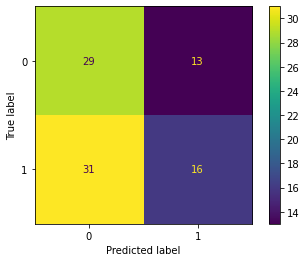

In [164]:
# we will now evaluate how the model performed

eval_model(y_df['True_Label'], y_df['Pred_Label'])

In [171]:
print(f'The best parameters returned from the grid search were: {grid_search_clf.best_params_}')

The best parameters returned from the grid search were: {'classifier__eval_metric': 'merror', 'classifier__gamma': 1, 'classifier__learning_rate': 0.05, 'classifier__scoring': 'accuracy', 'combined_features__kbest__k': 8, 'combined_features__pca__n_components': 15}


In [166]:
# now to set up some conditions to only keep rows that have a prediction confidence above 55% for a given outcome.
# this will allow us to compare only the most confident of predictions.

y_df_55 = y_df[(y_df[0] > 0.55) | (y_df[1] > 0.55)]

The accuracy score of the model is: 0.5
The recall score of the model is: 0.30952380952380953
The Matthews Correlation Coefficient of the model is: 0.04913688825091396.
The roc auc score of the model is: 0.5224089635854342.


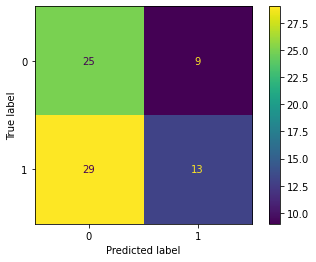

In [167]:
# now we will pass these 2 columns to our eval_model function to see how our results did.

eval_model(y_df_55['True_Label'], y_df_55['Pred_Label'])

In [168]:
# now to set up some conditions to only keep rows that have a prediction confidence above 55% for a given outcome.
# this will allow us to compare only the most confident of predictions.

y_df_60 = y_df[(y_df[0] > 0.6) | (y_df[1] > 0.6)]

The accuracy score of the model is: 0.49230769230769234
The recall score of the model is: 0.3055555555555556
The Matthews Correlation Coefficient of the model is: 0.03245306564010122.
The roc auc score of the model is: 0.5148467432950191.


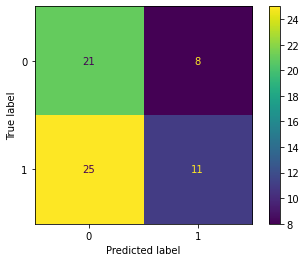

In [169]:
# we will also try to evaluate model success with over 60% confidence

eval_model(y_df_60['True_Label'], y_df_60['Pred_Label'])

In [170]:
X, y = X_df.drop(['Label', 'Predict'], axis=1), X_df.Label

from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2)

In [172]:
# trying again with a more traditional train test split as this could be viewed as a simple classification problem
# if results do not improve, will re-try above gris search without scaling step as per previous best results

params_clf2 = {"combined_features__pca__n_components": [8,9,10,11,12,13,14,15],
            "combined_features__kbest__k": [8,9,10,11,12,13,14,15],
            "classifier__scoring": ['accuracy'],
            "classifier__eval_metric": ['merror'],
           "classifier__gamma": [1],
           "classifier__learning_rate": [0.05]
         }


grid_search_clf2 = GridSearchCV(pipeline_clf, params_clf2, verbose=3)

In [174]:
# start up the new grid search object with new training data

grid_search_clf2.fit(X_train, y_train)

Fitting 5 folds for each of 64 candidates, totalling 320 fits
[00:56:50] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=8; total time=   0.9s
[00:56:51] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=8; total time=   1.0s
[00:56:52] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=8; total time=   0.8s
[00:56:53] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=8; total time=   0.8s
[00:56:54] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=8; total time=   0.8s
[00:56:55] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=9; total time=   1.1s
[00:56:56] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=9; total time=   1.1s
[00:56:57] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=9; total time=   0.9s
[00:56:58] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=9; total time=   1.0s
[00:56:59] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=9; total time=   1.1s
[00:57:00] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=10; total time=   1.3s
[00:57:01] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=10; total time=   1.0s
[00:57:02] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=10; total time=   1.4s
[00:57:04] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=10; total time=   1.0s
[00:57:05] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=10; total time=   1.2s
[00:57:06] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=11; total time=   1.2s
[00:57:07] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=11; total time=   1.1s
[00:57:08] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=11; total time=   1.0s
[00:57:09] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=11; total time=   1.2s
[00:57:10] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=11; total time=   1.2s
[00:57:12] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=12; total time=   1.0s
[00:57:13] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=12; total time=   1.2s
[00:57:14] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=12; total time=   1.2s
[00:57:15] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=12; total time=   1.4s
[00:57:17] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=12; total time=   1.0s
[00:57:18] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=13; total time=   1.2s
[00:57:19] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=13; total time=   1.2s
[00:57:20] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=13; total time=   1.3s
[00:57:21] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=13; total time=   1.1s
[00:57:22] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=13; total time=   1.0s
[00:57:23] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=14; total time=   1.2s
[00:57:25] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=14; total time=   1.3s
[00:57:26] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=14; total time=   1.2s
[00:57:27] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=14; total time=   1.1s
[00:57:28] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=14; total time=   1.3s
[00:57:30] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=15; total time=   1.3s
[00:57:31] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=15; total time=   1.2s
[00:57:32] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=15; total time=   1.2s
[00:57:33] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=15; total time=   1.1s
[00:57:34] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=8, combined_features__pca__n_components=15; total time=   1.3s
[00:57:36] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=8; total time=   1.1s
[00:57:37] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=8; total time=   1.1s
[00:57:38] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=8; total time=   1.1s
[00:57:39] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=8; total time=   1.1s
[00:57:40] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=8; total time=   1.2s
[00:57:41] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=9; total time=   1.2s
[00:57:43] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=9; total time=   1.1s
[00:57:44] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=9; total time=   1.2s
[00:57:45] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=9; total time=   1.2s
[00:57:46] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=9; total time=   1.1s
[00:57:47] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=10; total time=   1.1s
[00:57:48] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=10; total time=   1.0s
[00:57:49] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=10; total time=   1.2s
[00:57:50] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=10; total time=   1.2s
[00:57:52] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=10; total time=   1.1s
[00:57:53] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=11; total time=   1.2s
[00:57:54] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=11; total time=   1.3s
[00:57:55] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=11; total time=   1.3s
[00:57:56] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=11; total time=   1.1s
[00:57:58] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=11; total time=   1.1s
[00:57:59] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=12; total time=   1.1s
[00:58:00] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=12; total time=   1.3s
[00:58:01] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=12; total time=   1.2s
[00:58:02] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=12; total time=   1.6s
[00:58:04] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=12; total time=   1.6s
[00:58:06] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=13; total time=   1.7s
[00:58:07] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=13; total time=   1.6s
[00:58:09] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=13; total time=   1.2s
[00:58:10] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=13; total time=   1.3s
[00:58:11] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=13; total time=   1.1s
[00:58:12] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=14; total time=   1.0s
[00:58:14] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=14; total time=   1.1s
[00:58:15] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=14; total time=   1.4s
[00:58:16] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=14; total time=   1.2s
[00:58:17] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=14; total time=   1.1s
[00:58:18] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=15; total time=   1.2s
[00:58:19] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=15; total time=   1.4s
[00:58:21] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=15; total time=   1.3s
[00:58:22] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=15; total time=   1.1s
[00:58:23] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=15; total time=   1.1s
[00:58:24] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=8; total time=   1.2s
[00:58:26] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=8; total time=   1.2s
[00:58:27] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=8; total time=   1.1s
[00:58:28] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=8; total time=   1.1s
[00:58:29] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=8; total time=   1.3s
[00:58:30] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=9; total time=   1.3s
[00:58:32] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=9; total time=   1.2s
[00:58:33] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=9; total time=   1.1s
[00:58:34] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=9; total time=   1.1s
[00:58:35] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=9; total time=   1.3s
[00:58:36] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=10; total time=   1.2s
[00:58:38] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=10; total time=   1.1s
[00:58:39] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=10; total time=   1.2s
[00:58:40] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=10; total time=   1.2s
[00:58:41] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=10; total time=   1.1s
[00:58:42] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=11; total time=   1.1s
[00:58:43] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=11; total time=   1.2s
[00:58:45] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=11; total time=   1.3s
[00:58:46] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=11; total time=   1.4s
[00:58:47] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=11; total time=   1.1s
[00:58:48] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=12; total time=   1.0s
[00:58:49] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=12; total time=   1.4s
[00:58:51] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=12; total time=   1.3s
[00:58:52] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=12; total time=   1.1s
[00:58:53] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=12; total time=   1.1s
[00:58:54] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=13; total time=   1.3s
[00:58:55] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=13; total time=   1.3s
[00:58:57] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=13; total time=   1.1s
[00:58:58] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=13; total time=   1.2s
[00:58:59] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=13; total time=   1.4s
[00:59:01] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=14; total time=   1.3s
[00:59:02] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=14; total time=   1.1s
[00:59:03] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=14; total time=   1.3s
[00:59:04] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=14; total time=   1.4s
[00:59:06] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=14; total time=   1.3s
[00:59:07] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=15; total time=   1.2s
[00:59:08] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=15; total time=   1.2s
[00:59:09] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=15; total time=   1.6s
[00:59:11] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=15; total time=   1.3s
[00:59:12] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=10, combined_features__pca__n_components=15; total time=   1.2s
[00:59:13] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=8; total time=   1.1s
[00:59:15] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=8; total time=   1.3s
[00:59:16] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=8; total time=   1.2s
[00:59:17] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=8; total time=   1.0s
[00:59:18] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=8; total time=   1.2s
[00:59:19] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=9; total time=   1.1s
[00:59:20] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=9; total time=   1.2s
[00:59:22] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=9; total time=   1.1s
[00:59:23] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=9; total time=   1.0s
[00:59:24] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=9; total time=   1.0s
[00:59:25] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=10; total time=   1.3s
[00:59:26] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=10; total time=   1.3s
[00:59:27] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=10; total time=   1.0s
[00:59:28] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=10; total time=   1.0s
[00:59:29] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=10; total time=   1.3s
[00:59:31] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=11; total time=   1.3s
[00:59:32] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=11; total time=   1.2s
[00:59:33] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=11; total time=   1.3s
[00:59:34] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=11; total time=   1.4s
[00:59:36] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=11; total time=   1.2s
[00:59:37] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=12; total time=   1.1s
[00:59:38] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=12; total time=   1.2s
[00:59:39] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=12; total time=   1.4s
[00:59:41] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=12; total time=   1.3s
[00:59:42] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=12; total time=   1.2s
[00:59:43] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=13; total time=   1.1s
[00:59:44] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=13; total time=   1.5s
[00:59:46] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=13; total time=   1.2s
[00:59:47] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=13; total time=   1.1s
[00:59:48] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=13; total time=   1.2s
[00:59:49] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=14; total time=   1.4s
[00:59:51] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=14; total time=   1.4s
[00:59:52] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=14; total time=   1.3s
[00:59:53] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=14; total time=   1.2s
[00:59:55] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=14; total time=   1.5s
[00:59:56] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=15; total time=   1.5s
[00:59:58] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=15; total time=   1.2s
[00:59:59] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=15; total time=   1.5s
[01:00:00] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=15; total time=   1.4s
[01:00:02] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=11, combined_features__pca__n_components=15; total time=   1.7s
[01:00:04] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=8; total time=   1.6s
[01:00:05] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=8; total time=   1.8s
[01:00:07] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=8; total time=   1.8s
[01:00:09] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=8; total time=   1.3s
[01:00:10] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=8; total time=   1.3s
[01:00:11] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=9; total time=   1.1s
[01:00:12] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=9; total time=   1.2s
[01:00:14] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=9; total time=   1.1s
[01:00:15] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=9; total time=   1.4s
[01:00:16] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=9; total time=   1.3s
[01:00:17] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=10; total time=   1.2s
[01:00:19] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=10; total time=   1.3s
[01:00:20] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=10; total time=   1.3s
[01:00:21] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=10; total time=   1.2s
[01:00:22] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=10; total time=   1.2s
[01:00:24] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=11; total time=   1.4s
[01:00:25] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=11; total time=   1.3s
[01:00:26] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=11; total time=   1.3s
[01:00:28] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=11; total time=   1.2s
[01:00:29] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=11; total time=   1.3s
[01:00:30] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=12; total time=   1.3s
[01:00:32] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=12; total time=   1.3s
[01:00:33] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=12; total time=   1.2s
[01:00:34] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=12; total time=   1.4s
[01:00:35] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=12; total time=   1.3s
[01:00:37] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=13; total time=   1.5s
[01:00:38] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=13; total time=   1.3s
[01:00:40] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=13; total time=   1.6s
[01:00:41] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=13; total time=   1.4s
[01:00:42] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=13; total time=   1.2s
[01:00:44] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=14; total time=   1.4s
[01:00:45] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=14; total time=   1.5s
[01:00:47] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=14; total time=   1.4s
[01:00:48] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=14; total time=   1.3s
[01:00:49] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=14; total time=   1.4s
[01:00:51] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=15; total time=   1.4s
[01:00:52] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=15; total time=   1.3s
[01:00:53] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=15; total time=   1.3s
[01:00:55] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=15; total time=   1.5s
[01:00:56] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=12, combined_features__pca__n_components=15; total time=   1.4s
[01:00:58] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=8; total time=   1.1s
[01:00:59] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=8; total time=   1.2s
[01:01:00] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=8; total time=   1.4s
[01:01:01] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=8; total time=   1.4s
[01:01:03] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=8; total time=   1.2s
[01:01:04] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=9; total time=   1.3s
[01:01:05] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=9; total time=   1.3s
[01:01:06] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=9; total time=   1.3s
[01:01:08] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=9; total time=   1.1s
[01:01:09] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=9; total time=   1.3s
[01:01:10] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=10; total time=   1.4s
[01:01:12] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=10; total time=   1.2s
[01:01:13] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=10; total time=   1.2s
[01:01:14] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=10; total time=   1.4s
[01:01:15] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=10; total time=   1.4s
[01:01:17] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=11; total time=   1.4s
[01:01:18] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=11; total time=   1.4s
[01:01:19] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=11; total time=   1.3s
[01:01:21] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=11; total time=   1.3s
[01:01:22] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=11; total time=   1.2s
[01:01:23] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=12; total time=   1.4s
[01:01:25] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=12; total time=   1.4s
[01:01:26] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=12; total time=   1.4s
[01:01:28] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=12; total time=   1.4s
[01:01:29] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=12; total time=   1.4s
[01:01:30] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=13; total time=   1.6s
[01:01:32] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=13; total time=   1.3s
[01:01:33] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=13; total time=   1.3s
[01:01:35] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=13; total time=   1.5s
[01:01:36] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=13; total time=   1.4s
[01:01:37] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=14; total time=   1.3s
[01:01:39] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=14; total time=   1.5s
[01:01:40] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=14; total time=   1.6s
[01:01:42] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=14; total time=   1.4s
[01:01:43] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=14; total time=   1.3s
[01:01:45] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=15; total time=   1.6s
[01:01:46] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=15; total time=   1.3s
[01:01:48] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=15; total time=   1.4s
[01:01:49] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=15; total time=   1.5s
[01:01:50] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=13, combined_features__pca__n_components=15; total time=   1.5s
[01:01:52] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=8; total time=   1.1s
[01:01:53] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=8; total time=   1.3s
[01:01:54] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=8; total time=   1.4s
[01:01:56] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=8; total time=   1.3s
[01:01:57] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=8; total time=   1.1s
[01:01:58] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=9; total time=   1.3s
[01:01:59] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=9; total time=   1.4s
[01:02:01] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=9; total time=   1.3s
[01:02:02] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=9; total time=   1.8s
[01:02:04] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=9; total time=   1.8s
[01:02:06] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=10; total time=   1.9s
[01:02:08] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=10; total time=   1.9s
[01:02:10] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=10; total time=   1.3s
[01:02:11] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=10; total time=   1.3s
[01:02:12] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=10; total time=   1.2s
[01:02:13] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=11; total time=   1.6s
[01:02:15] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=11; total time=   1.5s
[01:02:17] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=11; total time=   1.3s
[01:02:18] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=11; total time=   1.3s
[01:02:19] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=11; total time=   1.4s
[01:02:20] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=12; total time=   1.4s
[01:02:22] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=12; total time=   1.3s
[01:02:23] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=12; total time=   1.4s
[01:02:25] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=12; total time=   1.4s
[01:02:26] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=12; total time=   1.3s
[01:02:27] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=13; total time=   1.4s
[01:02:29] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=13; total time=   1.4s
[01:02:30] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=13; total time=   1.5s
[01:02:32] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=13; total time=   1.3s
[01:02:33] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=13; total time=   1.3s
[01:02:34] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=14; total time=   1.6s
[01:02:36] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=14; total time=   1.6s
[01:02:38] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=14; total time=   1.4s
[01:02:39] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=14; total time=   1.4s
[01:02:40] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=14; total time=   1.4s
[01:02:42] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=15; total time=   1.4s
[01:02:43] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=15; total time=   1.3s
[01:02:44] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=15; total time=   1.6s
[01:02:46] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=15; total time=   1.4s
[01:02:48] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=14, combined_features__pca__n_components=15; total time=   1.3s
[01:02:49] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=8; total time=   1.3s
[01:02:50] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=8; total time=   1.2s
[01:02:51] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=8; total time=   1.1s
[01:02:53] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=8; total time=   1.1s
[01:02:54] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=8; total time=   1.1s
[01:02:55] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=9; total time=   1.5s
[01:02:56] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=9; total time=   1.2s
[01:02:58] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=9; total time=   1.3s
[01:02:59] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=9; total time=   1.5s
[01:03:00] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=9; total time=   1.3s
[01:03:02] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=10; total time=   1.3s
[01:03:03] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=10; total time=   1.3s
[01:03:04] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=10; total time=   1.3s
[01:03:06] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=10; total time=   1.5s
[01:03:07] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=10; total time=   1.2s
[01:03:08] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=11; total time=   1.4s
[01:03:10] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=11; total time=   1.4s
[01:03:11] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=11; total time=   1.4s
[01:03:13] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=11; total time=   1.7s
[01:03:14] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=11; total time=   1.6s
[01:03:16] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=12; total time=   1.6s
[01:03:17] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=12; total time=   1.4s
[01:03:19] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=12; total time=   1.7s
[01:03:21] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=12; total time=   1.5s
[01:03:22] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=12; total time=   1.3s
[01:03:23] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=13; total time=   1.4s
[01:03:25] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=13; total time=   1.5s
[01:03:26] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=13; total time=   1.4s
[01:03:28] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=13; total time=   1.4s
[01:03:29] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=13; total time=   1.4s
[01:03:30] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=14; total time=   1.5s
[01:03:32] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=14; total time=   1.4s
[01:03:33] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=14; total time=   1.4s
[01:03:35] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=14; total time=   1.6s
[01:03:36] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=14; total time=   1.3s
[01:03:38] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=15; total time=   1.4s
[01:03:39] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=15; total time=   1.5s
[01:03:41] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=15; total time=   1.5s
[01:03:42] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=15; total time=   1.4s
[01:03:43] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=15, combined_features__pca__n_components=15; total time=   1.4s
[01:03:45] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


GridSearchCV(estimator=Pipeline(steps=[('scaling', MinMaxScaler()),
                                       ('combined_features',
                                        FeatureUnion(transformer_list=[('pca',
                                                                        PCA()),
                                                                       ('kbest',
                                                                        SelectKBest())])),
                                       ('classifier',
                                        XGBClassifier(base_score=None,
                                                      booster=None,
                                                      colsample_bylevel=None,
                                                      colsample_bynode=None,
                                                      colsample_bytree=None,
                                                      gamma=None, gpu_id=None,
                                    

In [176]:
y_pred_clf2 = grid_search_clf2.predict_proba(X_test)

# set dataframe for y_test
y_test_df = pd.DataFrame(list(y_test), columns=['True_Label'])

# initialize dataframe for predicted probabilities
y_proba_df2 = pd.DataFrame(y_pred_clf2, columns=[0,1])

# concatenate both dataframes together for calculations
y_df2 = y_proba_df2.join(y_test_df)


# set up a loop to input predicted labels 
y_df2['Pred_Label'] = 0
for i in list(y_df2.index):
    y_df2['Pred_Label'][i] = 1 if y_df2[1][i] > y_df2[0][i] else 0
    
    
    
y_df2.tail(10)

<ipython-input-176-70ec32bf451f>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y_df2['Pred_Label'][i] = 1 if y_df2[1][i] > y_df2[0][i] else 0


,0,1,True_Label,Pred_Label
190,0.831489,0.168511,1,0
191,0.620443,0.379557,0,0
192,0.253783,0.746217,1,1
193,0.368666,0.631334,0,1
194,0.216870,0.783130,0,1
195,0.617312,0.382688,0,0
196,0.772361,0.227639,0,0
197,0.391046,0.608954,1,1
198,0.838051,0.161949,1,0
199,0.610925,0.389075,0,0


In [195]:
y_pred_clf2

array([[0.47174215, 0.52825785],
       [0.36044908, 0.6395509 ],
       [0.6898049 , 0.31019512],
       [0.5083099 , 0.4916901 ],
       [0.75775325, 0.24224676],
       [0.685987  , 0.31401297],
       [0.37325007, 0.62674993],
       [0.4140268 , 0.5859732 ],
       [0.84357077, 0.15642923],
       [0.85728085, 0.14271918],
       [0.7903516 , 0.20964837],
       [0.3920198 , 0.6079802 ],
       [0.26755315, 0.73244685],
       [0.49750948, 0.5024905 ],
       [0.16072619, 0.8392738 ],
       [0.618946  , 0.38105398],
       [0.24996603, 0.750034  ],
       [0.5254595 , 0.4745405 ],
       [0.5101299 , 0.4898701 ],
       [0.54050046, 0.45949954],
       [0.13609612, 0.8639039 ],
       [0.7516744 , 0.24832559],
       [0.23250234, 0.76749766],
       [0.2715984 , 0.7284016 ],
       [0.238796  , 0.761204  ],
       [0.34074807, 0.6592519 ],
       [0.6994891 , 0.3005109 ],
       [0.2810824 , 0.7189176 ],
       [0.41565597, 0.584344  ],
       [0.56216884, 0.43783113],
       [0.

The best parameters returned from the grid search were: {'classifier__eval_metric': 'merror', 'classifier__gamma': 1, 'classifier__learning_rate': 0.05, 'classifier__scoring': 'accuracy', 'combined_features__kbest__k': 9, 'combined_features__pca__n_components': 15}
The accuracy score of the model is: 0.555
The recall score of the model is: 0.5583333333333333
The Matthews Correlation Coefficient of the model is: 0.10619235283619752.
The roc auc score of the model is: 0.5541666666666667.


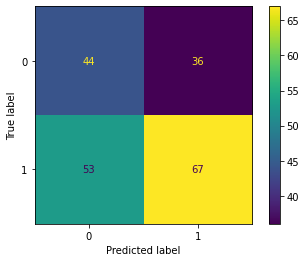

In [177]:
# we will now evaluate how the model performed
print(f'The best parameters returned from the grid search were: {grid_search_clf2.best_params_}')
eval_model(y_df2['True_Label'], y_df2['Pred_Label'])

The accuracy score of the model is: 0.5689655172413793
The recall score of the model is: 0.580952380952381
The Matthews Correlation Coefficient of the model is: 0.12904118421576374.
The roc auc score of the model is: 0.5658385093167703.


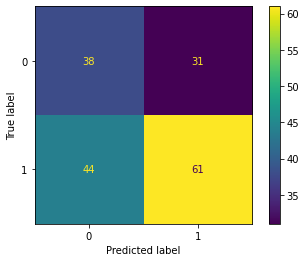

In [178]:
# now to set up some conditions to only keep rows that have a prediction confidence above 55% for a given outcome.
# this will allow us to compare only the most confident of predictions.

y_df2_55 = y_df2[(y_df2[0] > 0.55) | (y_df2[1] > 0.55)]

# now we will pass these 2 columns to our eval_model function to see how our results did.

eval_model(y_df2_55['True_Label'], y_df2_55['Pred_Label'])

The accuracy score of the model is: 0.5855263157894737
The recall score of the model is: 0.5955056179775281
The Matthews Correlation Coefficient of the model is: 0.16470217296226292.
The roc auc score of the model is: 0.5834670947030497.


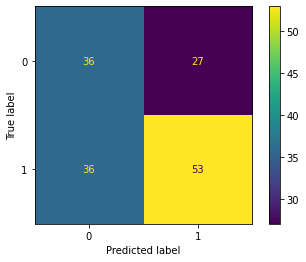

In [179]:
# now to set up some conditions to only keep rows that have a prediction confidence above 55% for a given outcome.
# this will allow us to compare only the most confident of predictions.

y_df2_60 = y_df2[(y_df2[0] > 0.6) | (y_df2[1] > 0.6)]

# we will also try to evaluate model success with over 60% confidence

eval_model(y_df2_60['True_Label'], y_df2_60['Pred_Label'])

In [186]:
best_params = grid_search_clf2.best_params_

    
best_params

{'classifier__eval_metric': 'merror',
 'classifier__gamma': 1,
 'classifier__learning_rate': 0.05,
 'classifier__scoring': 'accuracy',
 'combined_features__kbest__k': 9,
 'combined_features__pca__n_components': 15}

In [187]:
best_params = {'classifier__eval_metric': ['merror'],
     'classifier__gamma': [1],
     'classifier__learning_rate': [0.05],
     'classifier__scoring': ['accuracy'],
     'combined_features__kbest__k': [9],
     'combined_features__pca__n_components': [15]}

In [188]:
# now we will re-train the model on the entire dataset using our optimized parameters from grid search
# after we do this, the final model will be saved to be exported into our final script predictor

grid_search_clf_final = GridSearchCV(pipeline_clf, best_params, verbose=3)

grid_search_clf_final.fit(X, y)

Fitting 5 folds for each of 1 candidates, totalling 5 fits
[01:23:51] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 1/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=15; total time=   1.3s
[01:23:52] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 2/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=15; total time=   1.3s
[01:23:54] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 3/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=15; total time=   1.3s
[01:23:55] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 4/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=15; total time=   1.3s
[01:23:56] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[CV 5/5] END classifier__eval_metric=merror, classifier__gamma=1, classifier__learning_rate=0.05, classifier__scoring=accuracy, combined_features__kbest__k=9, combined_features__pca__n_components=15; total time=   1.3s
[01:23:58] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




/Users/shmaze/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


GridSearchCV(estimator=Pipeline(steps=[('scaling', MinMaxScaler()),
                                       ('combined_features',
                                        FeatureUnion(transformer_list=[('pca',
                                                                        PCA()),
                                                                       ('kbest',
                                                                        SelectKBest())])),
                                       ('classifier',
                                        XGBClassifier(base_score=None,
                                                      booster=None,
                                                      colsample_bylevel=None,
                                                      colsample_bynode=None,
                                                      colsample_bytree=None,
                                                      gamma=None, gpu_id=None,
                                    

In [189]:

# save our final model estimator to a variable to call for joblib and dump the model to be imported into our predictor

final_model = grid_search_clf_final.best_estimator_


joblib.dump(final_model, 'final_model.pkl')

['final_model.pkl']